# AI LAB

## Introduction

Cancer is a leading cause of mortality globally and remains a major challenge in biomedical research due to its biological complexity and variability. It can depend on multiple causes such as genetics, cell-cell signalling and microenvironment. One critical aspect of tumor biology is the presence of hypoxia, or low oxygen levels within the tumor microenvironment. Hypoxia plays a key role in disease progression, treatment resistance, and poor clinical outcomes, making it an important feature to identify and study.

This project aims to find an answer to the question: "Can we identify hypoxic cells?". This is an application of artificial intelligences to health sciences and it shows how the world is evolving with the new technologies and how they can be used to make progresses in medicine. 
In particular, the project explores how machine learning can be used to identify cells under hypoxic versus normoxic conditions. We aim to assess whether computational approaches can reliably distinguish between these states based on cellular data.

Our objective is to build a structured analytical pipeline that supports this goal by integrating various stages of data analysis. Starting from an initial exploration of the data, we progressively apply machine learning methods to uncover patterns and build predictive insights.

## Materials and Methods

This project uses gene expression datasets derived from two human breast cancer cell lines: MCF7, representing a luminal subtype, and HCC1806, representing a basal subtype. The data were generated using two single-cell RNA sequencing technologies: SMART-seq and DROP-seq. For each combination of cell line and technology, three versions of the dataset are provided: an unfiltered version containing raw count matrices without any preprocessing; a filtered version in which low-quality cells or genes have been removed; and a normalized version where systematic biases have been corrected to make samples more comparable. The unfiltered datasets are useful for exploring potential quality issues and understanding the structure of the raw data. The filtered and normalized datasets, on the other hand, serve as the main input for training and evaluating machine learning models.

In the second part of the project, we applied several unsupervised learning techniques, including PCA and various clustering algorithms, in order to investigate whether cells under hypoxic and normoxic conditions tend to form distinct clusters.

In the third part, we implemented supervised learning to classify cells as hypoxic or normoxic. After preprocessing and standardization, we trained multiple algorithms, including Random Forest, Support Vector Machine, k-Nearest Neighbors, Logistic Regression, and Multi-Layer Perceptron. Baseline models were evaluated using 5-fold cross-validation and holdout sets, followed by feature selection with Random Forest to identify the top 50 informative genes per dataset. Overlaps among gene lists were analyzed to derive a consensus panel of 28 recurrent features. Cross-dataset generalization was tested by training on one dataset and evaluating on others, restricted to the 70 globally shared genes. Finally, for each of the four representative datasets, a hyperparameter-tuned pipeline was run to determine the best-performing classifier. These champion models were refit on their full training sets and applied to the anonymized external test files, producing final label predictions for independent evaluation.


## Exploratory Data Analysis

Before applying machine learning methods, it is essential to perform an exploratory data analysis (EDA) to better understand the structure and quality of the dataset. In this step, we examine fundamental properties such as sparsity, distribution of gene expression, detection of outliers, and the impact of transformations and normalization. We also explore correlations between genes and cells to identify potential patterns of co-expression and heterogeneity. This analysis provides valuable insights into the characteristics of the data and guides the preprocessing choices needed for robust downstream modeling.

### The data: MCF7

Import libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kurtosis, skew, norm
import re

We start with the dataset MCF7 and first of all let's analyze the meta data to better understand the dataset we are working with.

In [2]:
df_meta = pd.read_csv("MCF7_SmartS_MetaData.tsv",delimiter="\t",engine='python',index_col=0)

In [3]:
print("Dataframe dimensions:", np.shape(df_meta))

Dataframe dimensions: (383, 8)


In [4]:
df_meta.head()

,Cell Line,Lane,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,"7,00 MCF",output.STAR.1,A10,Hypo,72,S28,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,"7,00 MCF",output.STAR.1,A11,Hypo,72,S29,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,"7,00 MCF",output.STAR.1,A12,Hypo,72,S30,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,"7,00 MCF",output.STAR.1,A1,Norm,72,S1,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,"7,00 MCF",output.STAR.1,A2,Norm,72,S2,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


It is composed by 383 rows and 8 columns.   
Let's analyze what is the meaning of each colum.  
- **Filename**: it is generated by an RNA-seq alignment pipeline, using STAR (Spliced ​​Transcripts Alignment to a Reference)
- **Cell Line**: the cell line used. In this case it is MCF7 which is a human breast cancer cell line 
- **Lane**: indicates the lane of the flow cell used for sequencing
- **Pos**: sample's well position on the plate
- **Condition**: experimental condition of the sample (Hypo = hypoxia, Norm = normoxia)
- **Hours**: duration of treatment or exposure in hours
- **Cell name**: internal name or ID of the sample
- **PrepocessingTag**: pre-processing step tag (sorting and alignment)
- **ProcessingComments**: comments about processing steps/tools used (STAR, FeatureCounts)
 
Hence, each row in the table represents a biological sample sequenced in an RNA-seq experiment.

Now we can go to the actual sequencing data.

In [5]:
df = pd.read_csv("MCF7_SmartS_Unfiltered_Data.txt",delimiter=" ",engine='python',index_col=0)
print("Dataframe dimensions:", np.shape(df))
print("First column: ", df.iloc[ : , 0])

Dataframe dimensions: (22934, 383)
First column:  WASH7P         0
MIR6859-1      0
WASH9P         1
OR4F29         0
MTND1P23       0
            ... 
MT-TE          4
MT-CYB       270
MT-TT          0
MT-TP          5
MAFIP          8
Name: output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam, Length: 22934, dtype: int64


The dimensions of the dataframe are big: we have 22934 rows and 383 columns. The filename gave us all information about the segment of the cell line we are analyzing. Each row contains the name of a gene and the number indicates whether and how much the gene is present in that cell segment.

Let's see the columns instead

In [6]:
list(df.columns)

['output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_A8_Hypo_S26_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_A9_Hypo_S27_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_B10_Hypo_S76_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_B11_Hypo_S77_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_B12_Hypo_S78_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_B1_Norm_S49_Aligned.sortedByCoord.out.bam',
 'output.STAR.1_B2_Norm_S50_Aligned.sort

They are all the filenames, namely each one represents a cell.

In [7]:
gene_symbls = df.index
print("Dataframe indexes: ", gene_symbls)

Dataframe indexes:  Index(['WASH7P', 'MIR6859-1', 'WASH9P', 'OR4F29', 'MTND1P23', 'MTND2P28',
       'MTCO1P12', 'MTCO2P12', 'MTATP8P1', 'MTATP6P1',
       ...
       'MT-TH', 'MT-TS2', 'MT-TL2', 'MT-ND5', 'MT-ND6', 'MT-TE', 'MT-CYB',
       'MT-TT', 'MT-TP', 'MAFIP'],
      dtype='object', length=22934)


These instead, they are all the names of the rows, namely all the genes' names.

In [8]:
df.head(5)

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,1
MIR6859-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,1,0,0,0,0,1,10,1,0,0,...,1,1,0,0,0,0,1,1,4,5
OR4F29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
MTND1P23,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


That's how the dataset works. We can see how much a gene is present in each cell.

Now, let's inspect if we have any missing values. If so, we have to understand how to deal with them.

In [9]:
print(df.isnull().sum())

output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam    0
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam    0
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam    0
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam      0
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam      0
                                                           ..
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam    0
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam    0
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam    0
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam    0
output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam    0
Length: 383, dtype: int64


Fortunately, we have all zeros: this means that we do not have any missing value. 

### Sparsity

Before starting with the actual EDA, it is important to inspect the sparsity of the matrix. In single-cell RNA-seq data, sparsity is a key characteristic that reflects the presence of many zeros in the expression matrix. In this kind of dataset usually this value is high and it is crucial to understand it in order to manage the next steps of our analysis. 

We take a look respectively to the sparsity of the entire dataset, then the sparsity per cell and the sparsity per gene and we make some plots.

In [10]:
total_elements = df.shape[0] * df.shape[1]
total_zeros = (df == 0).sum().sum()
sparsity = total_zeros / total_elements
print(f"Overall Dataset Sparsity: {sparsity:.2%}")

Overall Dataset Sparsity: 60.22%


The dataset shows an overall sparsity of 60.22%, meaning that approximately 60% of all gene–cell combinations contain zero expression.


Cell Sparsity Summary:
count    383.000000
mean       0.602153
std        0.117437
min        0.454129
25%        0.529563
50%        0.568021
75%        0.631268
max        0.999956
dtype: float64


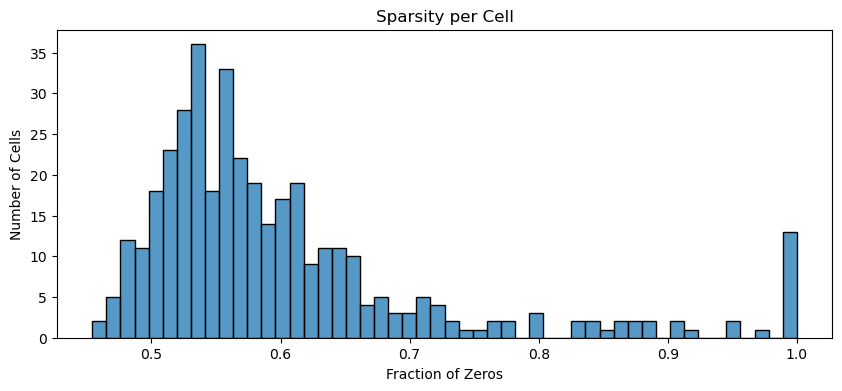

In [11]:
cell_sparsity = (df == 0).sum(axis=0) / df.shape[0]
print("\nCell Sparsity Summary:")
print(cell_sparsity.describe())

plt.figure(figsize=(10, 4))
sns.histplot(cell_sparsity, bins=50)
plt.title("Sparsity per Cell")
plt.xlabel("Fraction of Zeros")
plt.ylabel("Number of Cells")
plt.show()

Most cells have between 45% and 65% zeros, which is expected.  
A small group of cells shows very high sparsity, close to 100%, suggesting possible low-quality cells or empty droplets.   
Cells with sparsity >90% might be filtered out as low-quality before proceeding further


Gene Sparsity Summary:
count    22934.000000
mean         0.602153
std          0.355471
min          0.013055
25%          0.232376
50%          0.673629
75%          0.968668
max          0.994778
dtype: float64


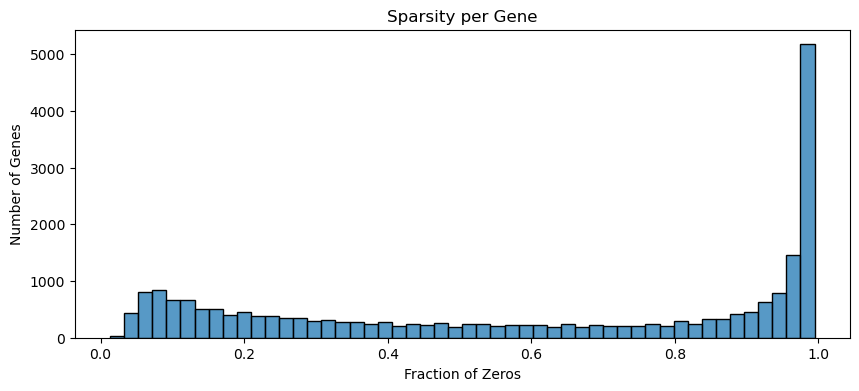

In [12]:
gene_sparsity = (df == 0).sum(axis=1) / df.shape[1]
print("\nGene Sparsity Summary:")
print(gene_sparsity.describe())

plt.figure(figsize=(10, 4))
sns.histplot(gene_sparsity, bins=50)
plt.title("Sparsity per Gene")
plt.xlabel("Fraction of Zeros")
plt.ylabel("Number of Genes")
plt.show()

The distribution is bimodal: one group of genes is broadly expressed (low sparsity), while a large group is expressed in only a few cells (high sparsity).
Over 5,000 genes have sparsity close to 1.0, meaning they are nearly always off.     
These highly sparse genes may be biologically irrelevant or dominated by noise.

Here, based on the sparsity analysis, we could remove some rows and colums which are not very informative or contain a lot of noise, but to continue our analysis we keep everything and at the end we try to filter our dataset based on all information we got.

### Descriptive statistics

Now, let's look at some descriptive statistics. To start, we analyze the cells and their distribution.

In [13]:
df.describe()

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
count,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,...,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000
mean,40.817651,0.012253,86.442400,1.024636,14.531351,56.213613,75.397183,62.767725,67.396747,2.240734,...,17.362562,42.080230,34.692422,32.735284,21.992718,17.439391,49.242784,61.545609,68.289352,62.851400
std,465.709940,0.207726,1036.572689,6.097362,123.800530,503.599145,430.471519,520.167576,459.689019,25.449630,...,193.153757,256.775704,679.960908,300.291051,153.441647,198.179666,359.337479,540.847355,636.892085,785.670341
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,17.000000,0.000000,5.000000,0.000000,7.000000,23.000000,39.000000,35.000000,38.000000,1.000000,...,9.000000,30.000000,0.000000,17.000000,12.000000,9.000000,27.000000,30.000000,38.000000,33.000000
max,46744.000000,14.000000,82047.000000,289.000000,10582.000000,46856.000000,29534.000000,50972.000000,36236.000000,1707.000000,...,17800.000000,23355.000000,81952.000000,29540.000000,12149.000000,19285.000000,28021.000000,40708.000000,46261.000000,68790.000000


We plot some graphs to understand better our data. Here we have an histogram with the count sum for each cell: we see how many genes are found for each cell.


Total counts per cell summary:
count    3.830000e+02
mean     9.946119e+05
std      5.503732e+05
min      1.000000e+00
25%      5.987505e+05
50%      1.129334e+06
75%      1.408638e+06
max      2.308057e+06
dtype: float64


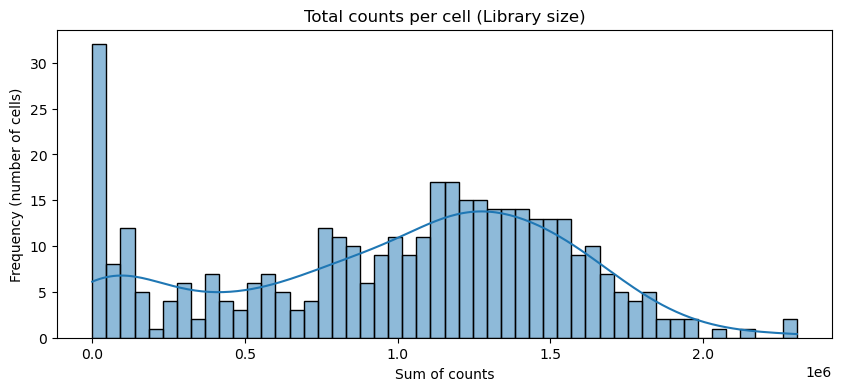

In [14]:
total_counts = df.sum(axis=0)
print("\nTotal counts per cell summary:")
print(total_counts.describe())

plt.figure(figsize=(10, 4))
sns.histplot(total_counts, bins=50, kde=True)
plt.title("Total counts per cell (Library size)")
plt.xlabel("Sum of counts")
plt.ylabel("Frequency (number of cells)")
plt.show()

We observe that:  
There is a peak near zero, indicating several cells with very low total counts.
These may correspond to low-quality cells, empty droplets, or dead cells, and may need to be filtered out.  
The main distribution appears to be right-skewed, which is expected in single-cell RNA-seq data due to technical and biological variability.  
Most cells fall within a central range, likely representing high-quality, well-captured cells.

Similarly, we can plot an histogram that represents the number of genes expressed for each cell, namely for each cell how many genes have values > 0.

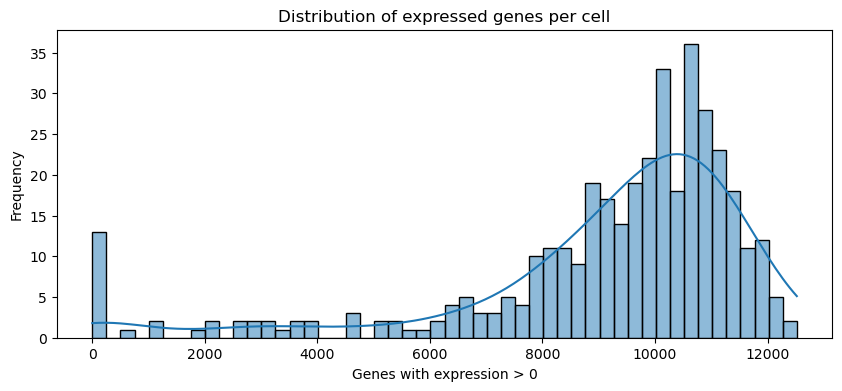

In [15]:
genes_expressed = (df > 0).sum(axis=0)  

plt.figure(figsize=(10, 4))
sns.histplot(genes_expressed, bins=50, kde=True)
plt.title("Distribution of expressed genes per cell")
plt.xlabel("Genes with expression > 0")
plt.ylabel("Frequency")
plt.show()

From the plot, we observe:  
A large peak between 9,000 and 12,000 expressed genes, which likely represents high-quality cells with rich transcriptional activity.  
A smaller peak near zero, indicating cells with very few expressed genes. These are likely low-quality cells, empty droplets, or damaged cells.  
A few cells show extremely low gene detection, which could be filtered out as part of the preprocessing.

Since our final aim is recognize the condition of normoxia and hypoxia, we also plot the number of cells by condition.

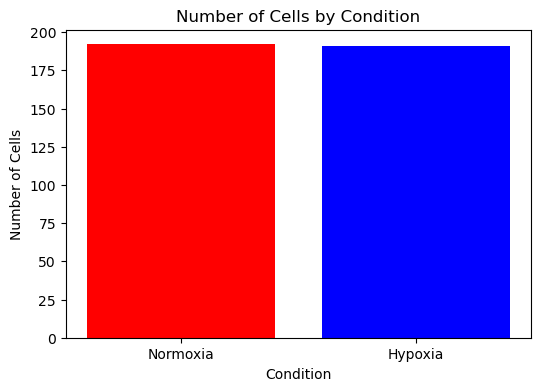

In [16]:
colnames = df.columns
conditions = colnames.str.extract(r'_(Hypo|Norm)_')[0]
conditions = conditions.replace({'Hypo': 'Hypoxia', 'Norm': 'Normoxia'})

condition_counts = conditions.value_counts()

plt.figure(figsize=(6, 4))
plt.bar(condition_counts.index, condition_counts.values, color=['red', 'blue'])
plt.title("Number of Cells by Condition")
plt.xlabel("Condition")
plt.ylabel("Number of Cells")
plt.show()

We notice that the dataset is balanced. This is important because it means that the data are statistically valid, otherwise we could have had bias in the results.

Now to go a little deeper in the analysis, we analyze the number of genes expressed per cell, by condition. For each cell, let's see how many genes are expressed and then we compare the two conditions.

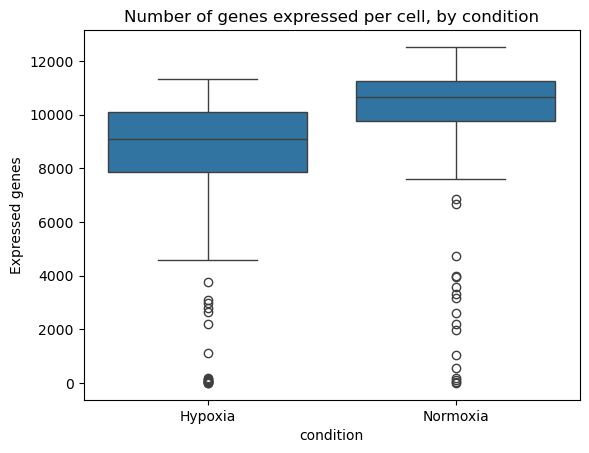

In [17]:
labels = ["Hypoxia" if "Hypo" in col else "Normoxia" for col in df.columns]

plot_df = pd.DataFrame({
    "Expressed genes": genes_expressed.values,
    "condition": labels
})

sns.boxplot(data=plot_df, x="condition", y="Expressed genes")
plt.title("Number of genes expressed per cell, by condition")
plt.show()

Normoxic cells express a higher number of genes per cell compared to hypoxic ones.
Hypoxic cells show a wider spread and more outliers with very low gene counts, which may reflect technical noise or true biological variability under stress.

We work in a similar way also for the genes.

In [18]:
df.transpose().describe()

,WASH7P,MIR6859-1,WASH9P,OR4F29,MTND1P23,MTND2P28,MTCO1P12,MTCO2P12,MTATP8P1,MTATP6P1,...,MT-TH,MT-TS2,MT-TL2,MT-ND5,MT-ND6,MT-TE,MT-CYB,MT-TT,MT-TP,MAFIP
count,383.000000,383.000000,383.000000,383.00000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,...,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.00000,383.000000,383.000000,383.000000
mean,0.133159,0.026110,1.344648,0.05483,0.049608,6.261097,4.681462,0.524804,0.073107,222.054830,...,1.060052,0.443864,3.146214,1016.477807,204.600522,5.049608,2374.97389,2.083551,5.626632,1.749347
std,0.618664,0.249286,2.244543,0.31477,0.229143,7.565749,6.232649,0.980857,0.298131,262.616874,...,1.990566,1.090827,4.265352,1009.444811,220.781927,6.644302,2920.39000,3.372714,7.511180,3.895204
min,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,23.000000,...,0.000000,0.000000,0.000000,172.000000,30.500000,0.000000,216.50000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.00000,0.000000,3.000000,2.000000,0.000000,0.000000,98.000000,...,0.000000,0.000000,1.000000,837.000000,152.000000,3.000000,785.00000,0.000000,3.000000,0.000000
75%,0.000000,0.000000,2.000000,0.00000,0.000000,10.000000,7.000000,1.000000,0.000000,370.500000,...,1.000000,0.000000,5.000000,1549.000000,294.000000,7.000000,4059.00000,3.000000,8.000000,2.000000
max,9.000000,4.000000,20.000000,3.00000,2.000000,45.000000,36.000000,6.000000,2.000000,1662.000000,...,15.000000,8.000000,22.000000,8115.000000,2002.000000,46.000000,16026.00000,22.000000,56.000000,32.000000


Let's see also the distribution of cells per genes.

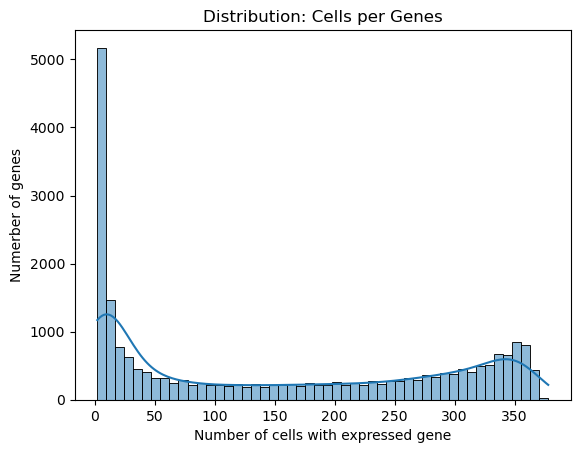

In [19]:

gene_n_cells = (df != 0).sum(axis=1)

sns.histplot(gene_n_cells, bins=50, kde = True)
plt.title("Distribution: Cells per Genes")
plt.xlabel("Number of cells with expressed gene")
plt.ylabel("Numerber of genes")
plt.show()

From the plot we can see:  
A large peak near zero, indicating that many genes are expressed in only a few cells.  
Another increase towards the right end, showing that some genes are expressed in almost all cells.  
The central area is relatively sparse, meaning fewer genes are expressed at intermediate levels across the cell population.

Now we are going back to our initial dataframe. Let's do a deep dive to further explore single cells or small groups.

For example we selected two specific cells from the dataset and visualized the distribution of their gene expression values using boxplots. These plots allow us to examine the range, median, and presence of potential outliers in each cell’s expression pattern.

<Axes: xlabel='output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam'>

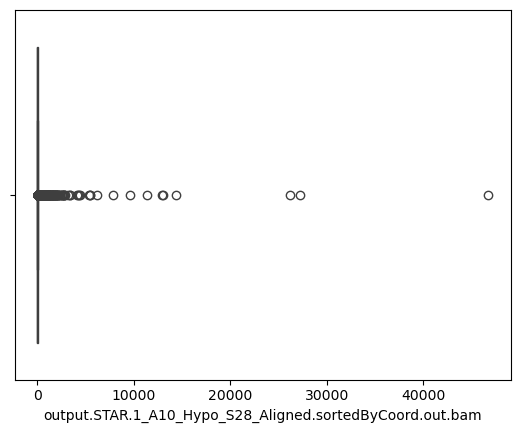

In [20]:
cnames = list(df.columns)
sns.boxplot(x=df[cnames[0]])


<Axes: xlabel='output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam'>

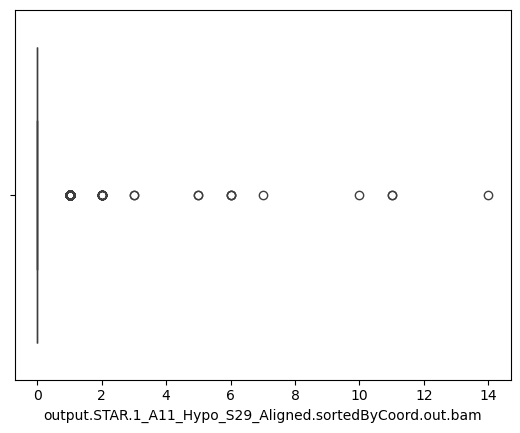

In [21]:
cnames = list(df.columns) 
sns.boxplot(x=df[cnames[1]])

The first cell shows a wide expression range, including several high-expression outliers, suggesting either true biological activity or the influence of highly expressed genes.
In contrast, the second cell displays a much narrower expression distribution, with almost all gene counts close to zero, indicating low transcriptional activity or potential data quality issues.

These examples highlight the variability between individual cells.

In the boxplot of the first cell we can see that the vast majority of gene expression values are clustered near zero, while a small number of genes show very high expression values, extending far beyond the whiskers.
These points are shown as outliers. The extreme range of values causes the box and median to appear compressed on the left.

This is a typical pattern in single-cell RNA-seq: a few highly expressed genes dominate, while the majority of genes have little to no expression.  
These plots highlight the need for log-transformation to better visualize the structure of the data and make comparisons across cells more interpretable.

Now we do the violin plot of the gene expression for the first 50 samples.

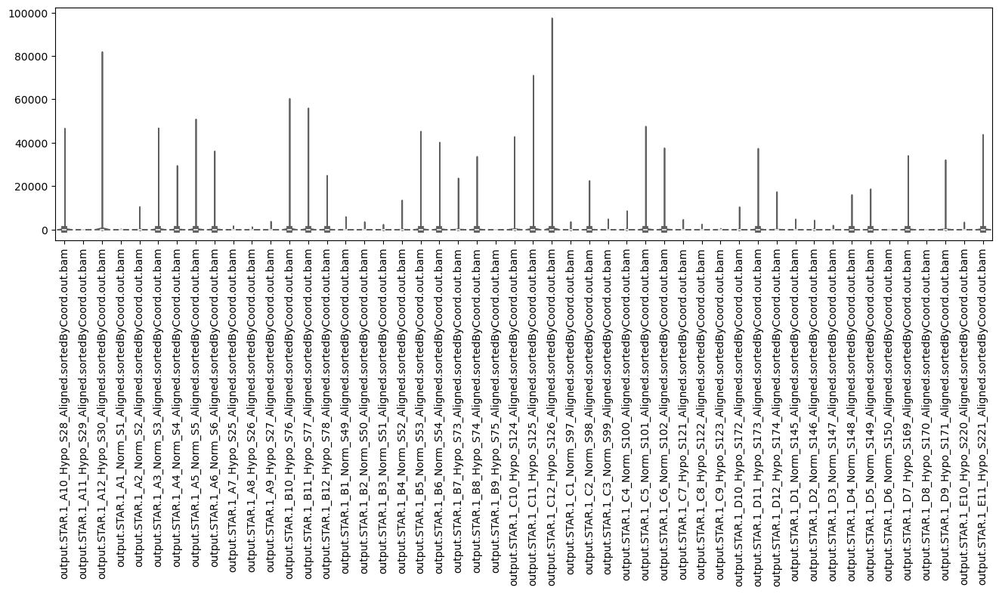

In [22]:
df_small = df.iloc[:, :50]

plt.figure(figsize=(16, 4))
plot = sns.violinplot(data=df_small, palette="Set3", cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.show()

As expected with single-cell RNA-seq data, the distributions are highly right-skewed, with most genes having low expression and a few outliers with extremely high counts.
This skewness makes the raw data difficult to interpret, highlighting the need for log-transformation or filtering in subsequent analysis.

Just to complete our analysis, let's look also at the violin plot for the first 50 genes. Each violin represents one gene, and its shape reflects how that gene's expression varies among individual cells.


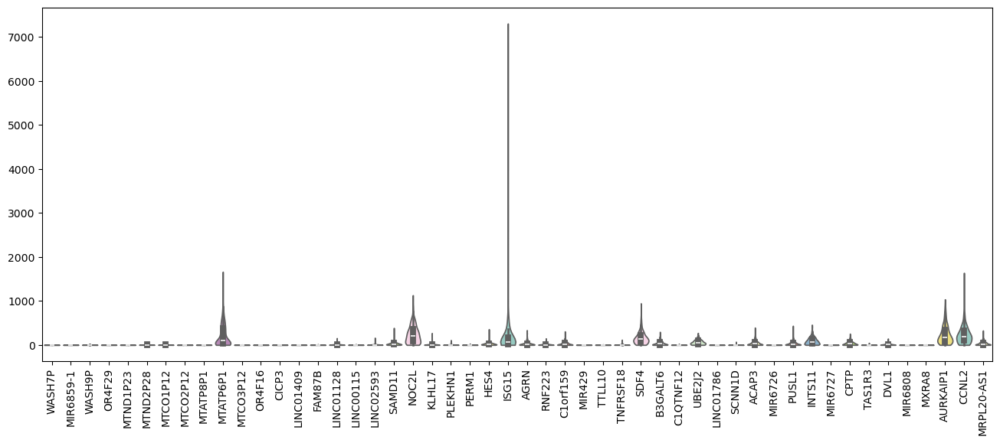

In [23]:
df_small = df.T.iloc[:, :50]

plt.figure(figsize=(16, 6))
plot = sns.violinplot(data=df_small, palette="Set3", cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.show()

The majority of genes exhibit low and tightly clustered expression values, as is typical in single-cell RNA-seq datasets.
However, a few genes show highly skewed distributions or strong outliers, suggesting high variability across cells.

These results help identify highly variable or highly expressed genes that may be biologically relevant or technically dominant, and can inform downstream analyses such as feature selection or clustering.

To further investigate the biological differences between hypoxic and normoxic conditions, we examined the average gene expression levels across the two groups.
Specifically, we focused on the top 20 most variable genes. We aim to identify potential gene markers or condition-specific expression patterns.

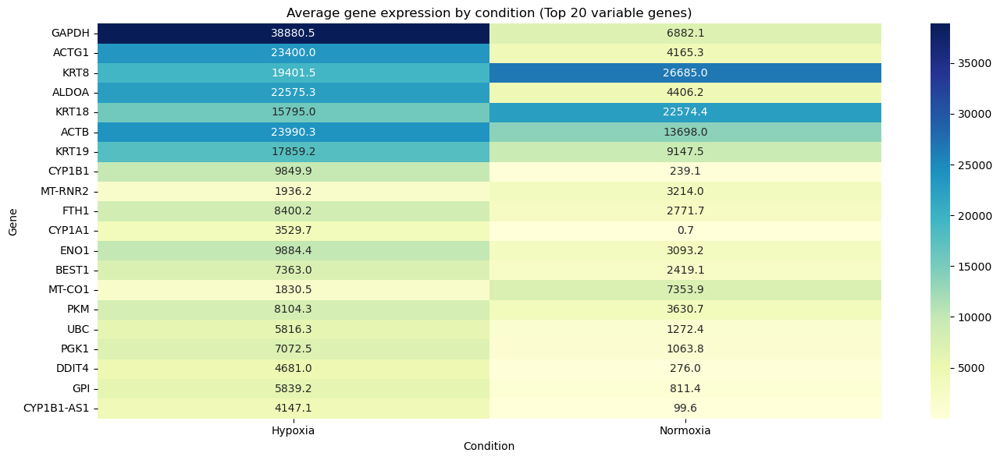

In [24]:
condition_series = pd.Series(labels, index=df.columns)
gene_variance = df.var(axis=1)
top_genes = gene_variance.sort_values(ascending=False).head(20).index
df_top_genes = df.loc[top_genes]
df_grouped = df_top_genes.T.groupby(condition_series).mean().T

plt.figure(figsize=(14, 6))
sns.heatmap(df_grouped, cmap="YlGnBu", annot=True, fmt=".1f")
plt.title("Average gene expression by condition (Top 20 variable genes)")
plt.xlabel("Condition")
plt.ylabel("Gene")
plt.tight_layout()
plt.show()


Several genes display substantial differences in expression between the two conditions, indicating potential biological relevance and condition-specific regulation.

Notably, genes such as GAPDH, ACTG1, ALDOA, and KRT19 show markedly higher expression under hypoxic conditions, whereas KRT8, KRT18, and MT-CO1 are more highly expressed in normoxic cells.

This comparative analysis helps identify potential markers of hypoxia and informs downstream feature selection for supervised classification.

### Outliers

Based on the exploratory visualizations presented earlier, we observed significant variability in gene expression across individual cells.
In particular, the violin plots and boxplots revealed several cells with abnormally low or high expression ranges, as well as a high proportion of zeros or extreme outliers in gene-level distributions.

Additionally, the library size showed that while most cells fall within a typical range, some cells display extremely low or unusually high total expression.
These patterns suggest the presence of outliers that could distort downstream analyses if not properly handled.

For this reason, we now focus on identifying and, where appropriate, filtering out such outlier cells.

We compute the inter quantile range and use this to define outliers.

In [25]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam    17.0
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam     0.0
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam     5.0
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam       0.0
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam       7.0
                                                            ... 
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam     9.0
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam    27.0
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam    30.0
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam    38.0
output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam    33.0
Length: 383, dtype: float64


Let's try eliminate outliers using quantile range. We also create a new dataset in order to make everything cleaner.

In [26]:
df_noOut = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]
df_noOut.shape

(6435, 383)

We reduced our dataset from 22934 cells to 6435.

In [27]:
df_noOut.head()

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
MIR6859-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CICP3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
FAM87B,0,0,0,0,0,0,0,0,2,0,...,0,1,0,0,0,0,0,0,0,0
MIR429,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TTLL10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Now we make the same plots as before to see how they have changed with the outliers removed.

<Axes: xlabel='output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam'>

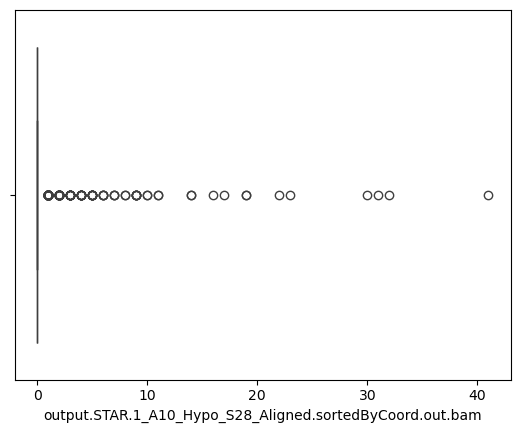

In [28]:
sns.boxplot(x=df_noOut[cnames[0]])

<Axes: xlabel='output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam'>

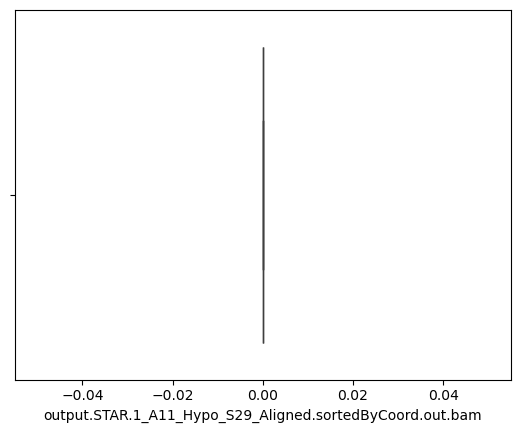

In [29]:
sns.boxplot(x=df_noOut[cnames[1]])

For the first cell the boxplot previously showed multiple high-expression outliers, with expression values exceeding 40,000 counts.
After filtering, these extreme values were removed, and the distribution appears more compact and centered.

In contrast, the boxplot of the second cell after outlier removal shows that the distribution of expression values has collapsed around zero, with almost no variability left. This suggests that either the cell is of low quality, with little meaningful expression, or that the filtering thresholds were too strict. This confirms the low transcriptional activity previously observed.

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

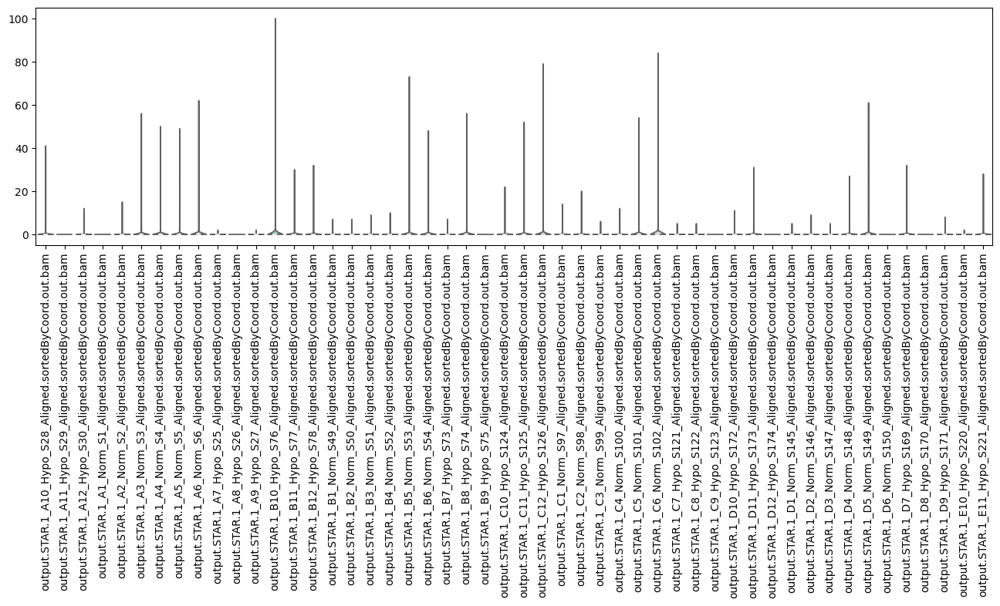

In [30]:
df_noOut_small = df_noOut.iloc[:, :50]

plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_noOut_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

We observe a notable reduction in extreme total expression values and there is a more uniform distribution of transcript counts across cells.

However, the dataset still contains a large proportion of zero counts.
While outlier filtering improves data consistency, it does not significantly reduce the overall sparsity, that for the whole dataset is around 60% as computed at the beginning of our analysis.

The analysis of outlier removal showed that, while it reduces extreme values, it also leads to a substantial loss of information, with some cells collapsing to nearly empty profiles. Since these outliers may still capture biologically relevant variation, we decided to proceed with the full dataset instead of discarding them. This choice allows us to retain the complete diversity of the data, acknowledging the presence of noise but minimizing the risk of eliminating rare but potentially meaningful signals.

### Summary statistics of data distribution

Let's inspect summary statistics of the data distribution. We look at the skewness and kurtosis of the gene expression profiles.

Text(0.5, 0, 'Skewness of single cells expression profiles - original df')

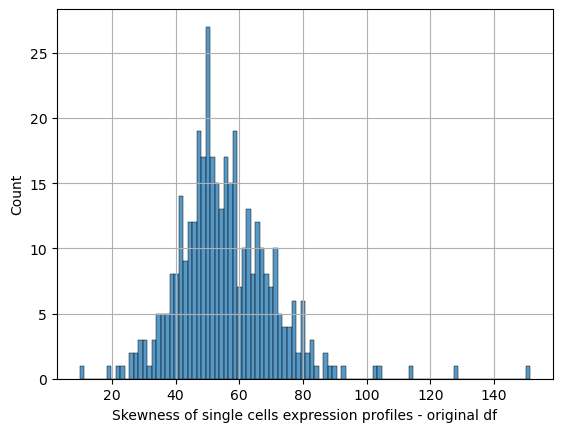

In [31]:
columns = np.shape(df)[1]
df_skew_cells = []
for i in range(columns) :     
     v_df = df[cnames[i]]
     df_skew_cells += [skew(v_df)]   

sns.histplot(df_skew_cells,bins=100)
plt.grid(True)
plt.xlabel('Skewness of single cells expression profiles - original df')

We computed the skewness of gene expression profiles across individual cells in the original dataset.
The resulting distribution shows that most cells exhibit a strongly right-skewed profile, with skewness values typically ranging between 40 and 70, and only some exceeding 100.
This high skewness reflects the sparsity and extreme value behavior of our data where most genes are lowly or not expressed, and a few show very high expression.
These findings further support the need for log-transformation and normalization in downstream analyses.

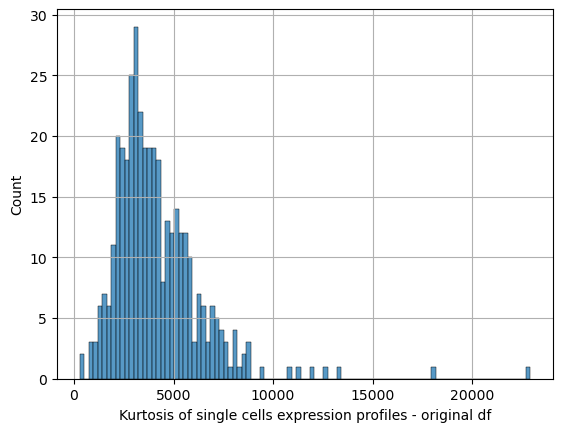

In [32]:
df_kurt_cells = []
for i in range(columns) :     
     v_df = df[cnames[i]]
     df_kurt_cells += [kurtosis(v_df)]   


sns.histplot(df_kurt_cells,bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - original df')
plt.grid(True)

We computed the kurtosis of gene expression profiles for each cell in the original dataset.
The distribution shows that most cells have very high kurtosis values, typically ranging between 2,000 and 6,000.

High kurtosis indicates that gene expression within individual cells is concentrated around the mean but exhibits strong tails, so that many genes have very low or zero expression, while a few show extremely high values.

As a reference, we compute skewness and kurtosis from a normally distributed dataset.

In [33]:
xnorm = np.random.normal(0, 2, 10000000)

print( "Excess kurtosis of normal distribution: ",  kurtosis(xnorm))
print( "Skewness of normal distribution: ", skew(xnorm))

Excess kurtosis of normal distribution:  -0.001439894766809946
Skewness of normal distribution:  0.0005413812698667362


As expected, both metrics were close to zero.
This contrast highlights the highly non-normal nature of single-cell expression data, which justifies the need for transformation and normalization.

Beyond analyzing the expression distribution across cells, for completeness we also computed skewness and kurtosis for each gene across the entire cell population.

Text(0.5, 0, 'Skewness of single genes expression profiles - original df')

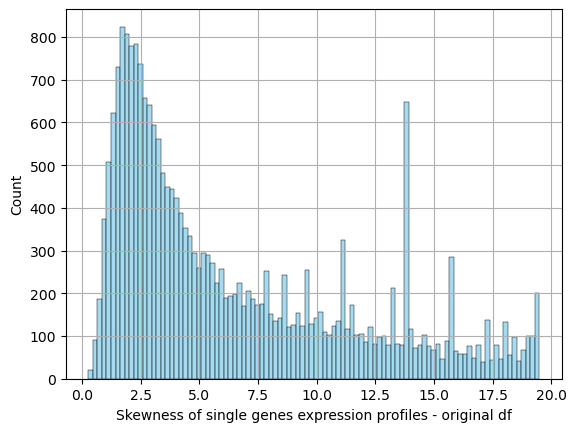

In [34]:
rows = np.shape(df)[0] 
df_transp = df.T  
cnames2 = list(df_transp.columns) 
df_skew_genes = []
for i in range(rows) :     
     v_df = df_transp[cnames2[i]]
     df_skew_genes += [skew(v_df)] 
       
sns.histplot(df_skew_genes,bins=100,  color='skyblue', edgecolor='black')
plt.grid(True)
plt.xlabel('Skewness of single genes expression profiles - original df')

Text(0.5, 0, 'Kurtosis of single genes expression profiles - original df')

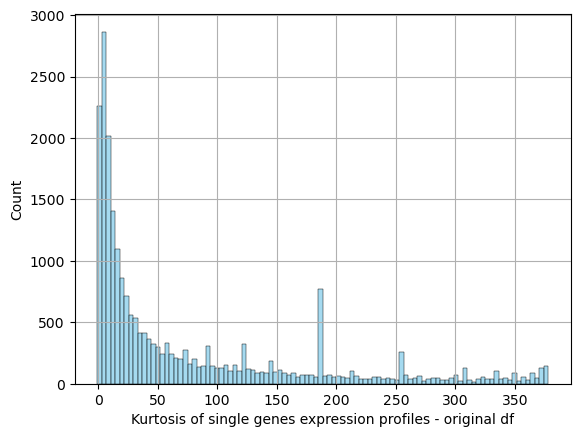

In [35]:
df_kurt_genes = []
for i in range(rows) :     
     v_df = df_transp[cnames2[i]]
     df_kurt_genes += [kurtosis(v_df)]  
sns.histplot(df_kurt_genes,bins=100,  color='skyblue', edgecolor='black')
plt.grid(True)
plt.xlabel('Kurtosis of single genes expression profiles - original df')

The resulting distributions highlight genes with highly non-normal profiles, characterized by strong asymmetry and heavy tails.

### Data transformation

Because of the properties of our data which are typically sparse, highly skewed, and exhibit heavy tails, with a large number of zeros and a few extremely high values, the statistical methods applied so far performed poorly since they work better when data are approximately normally distributed and have limited influence from outliers.

To address this, we apply a log-transformation, which reduces right skewness, compresses large values, and spreads out smaller ones.

We repeat all previous exploratory analyses using a log-transformed version of the dataset.

<Axes: xlabel='output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam'>

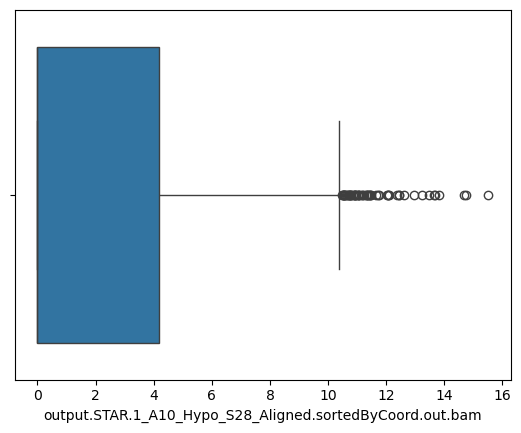

In [36]:
df_log2 = np.log2(df[cnames[0]]+1)
sns.boxplot(x=df_log2)

<Axes: xlabel='output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam'>

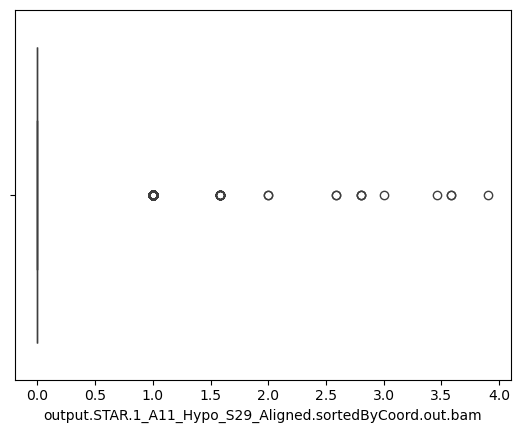

In [37]:
df_log2 = np.log2(df[cnames[1]]+1)
sns.boxplot(x=df_log2)

For the first cell, the original distribution was highly skewed with numerous high-expression outliers.
After applying the log-trasformation, the distribution became much more compact and symmetric, with reduced influence from extreme values.

In contrast, the second cell, which previously showed near-zero expression across most genes, maintained a similar profile.
The boxplot is more readable but confirms that this cell is transcriptionally inactive or low-quality.

We can check the summary statistics again, and plot the trasformed gene expression profile of each cell.

In [38]:
display(df_log2.describe().round(2))

count    22934.00
mean         0.01
std          0.12
min          0.00
25%          0.00
50%          0.00
75%          0.00
max          3.91
Name: output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam, dtype: float64

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

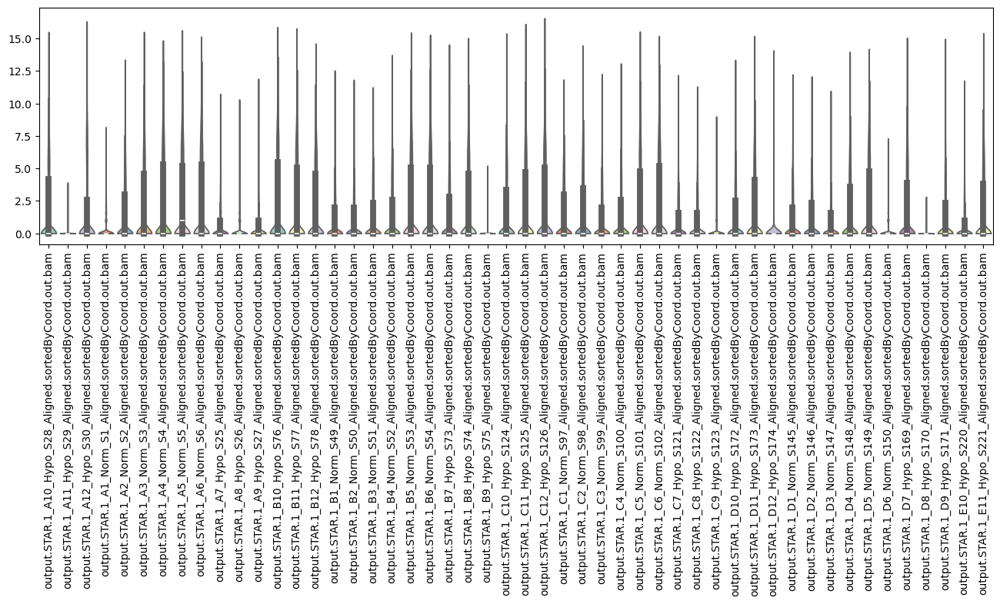

In [39]:
df1 = df + 1
df1_log2 = df1.apply(np.log2)
df1_log2_small = df1_log2.iloc[:, :50]

plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df1_log2_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

Compared to the original plot, the distributions now appear more symmetric and comparable across cells, with less influence from heavy-tailed outliers.
This transformation improves the interpretability of expression profiles and facilitates more reliable downstream analyses.

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

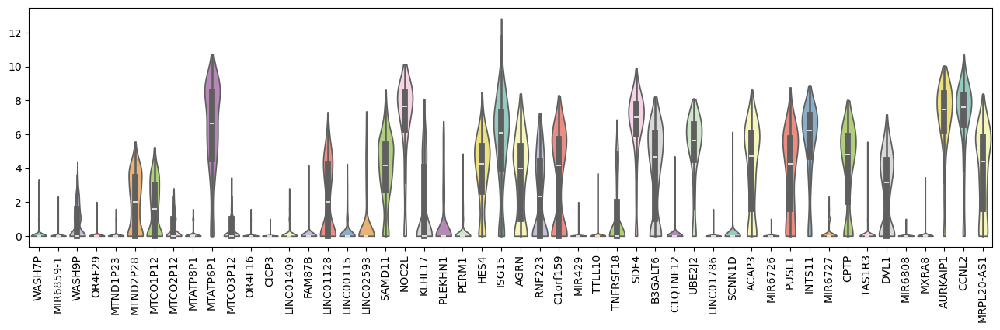

In [40]:
df1 = df + 1
df1_log2 = df1.apply(np.log2)
df1_log2_small = df1_log2.T.iloc[:, :50]

plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df1_log2_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

While many genes remain asymmetrically expressed, with some showing bimodal or heavy-tailed patterns, the overall shape of the violins indicates improved stability in variance and scale.

Let's look also at the changing in skeweness and kurtosis both for cells and genes now that we applied log-transformation.

Text(0.5, 0, 'Skewness of single cells expression profiles - log2 df')

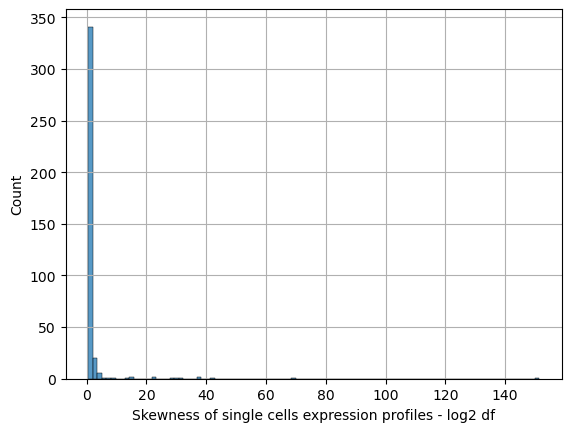

In [41]:
df1_log2_skew_cells = []
for i in range(columns) :     
     v_df = df1_log2[cnames[i]]
     df1_log2_skew_cells += [skew(v_df)]   

sns.histplot(df1_log2_skew_cells,bins=100)
plt.grid(True)
plt.xlabel('Skewness of single cells expression profiles - log2 df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - log2 df')

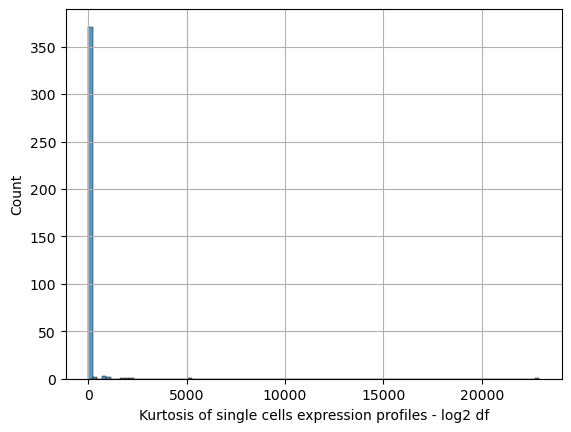

In [42]:
df1_log2_kurt_cells = []
for i in range(columns) :     
     v_df = df1_log2[cnames[i]]
     df1_log2_kurt_cells += [kurtosis(v_df)]
      
sns.histplot(df1_log2_kurt_cells,bins=100)
plt.grid(True)
plt.xlabel('Kurtosis of single cells expression profiles - log2 df')

Text(0.5, 0, 'Skewness of single genes expression profiles - log2 df')

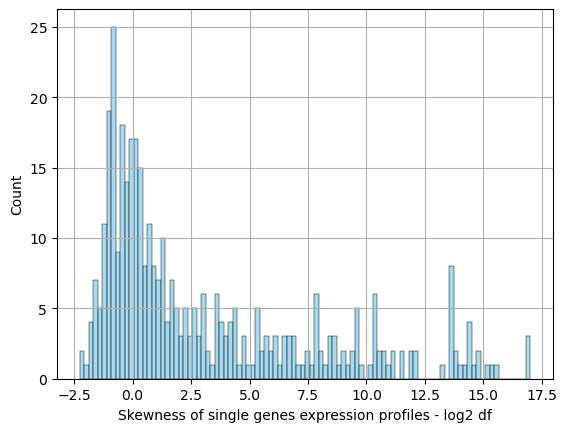

In [43]:
df_transp_log2 = df1_log2.T
cnames2 = list(df_transp.columns) 
df_transp_log2_skew_cells = []
for i in range(columns) :     
     v_df = df_transp_log2[cnames2[i]]
     df_transp_log2_skew_cells += [skew(v_df)]   
df1_log2_skew_cells
sns.histplot(df_transp_log2_skew_cells,bins=100,  color='skyblue', edgecolor='black')
plt.grid(True)
plt.xlabel('Skewness of single genes expression profiles - log2 df')

Text(0.5, 0, 'Kurtosis of single genes expression profiles - log2 df')

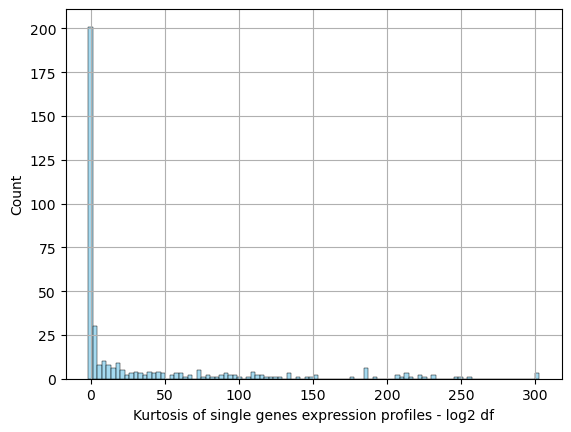

In [44]:
df_transp_log2_kurt_cells = []
for i in range(columns) :     
     v_df = df_transp_log2[cnames2[i]]
     df_transp_log2_kurt_cells += [kurtosis(v_df)]   
df1_log2_kurt_cells
sns.histplot(df_transp_log2_kurt_cells,bins=100,  color='skyblue', edgecolor='black')
plt.grid(True)
plt.xlabel('Kurtosis of single genes expression profiles - log2 df')

The results show a dramatic improvement in distributional characteristics:

Cell-level skewness and kurtosis, which were previously extremely high, were greatly reduced.
Gene-level metrics also shifted toward more symmetric and moderate distributions.

These changes confirm that the log-transformation effectively mitigates the effects of sparsity, outliers, and extreme values.

We showed that this transformation has a positive impact on our dataset, thus from now on we will use it as our dataset.

In [45]:
df = df1_log2

In [46]:
df.head()

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.000000,1.000000
MIR6859-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
WASH9P,1.0,0.0,0.0,0.0,0.0,1.0,3.459432,1.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.321928,2.584963
OR4F29,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000
MTND1P23,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000


### Normalization

After applying log-transformation to the expression matrix, we examined the distribution of gene expression values across a subset of 20 randomly selected cells using kernel density estimates.
Each curve represents the density of log-transformed expression values within one cell.

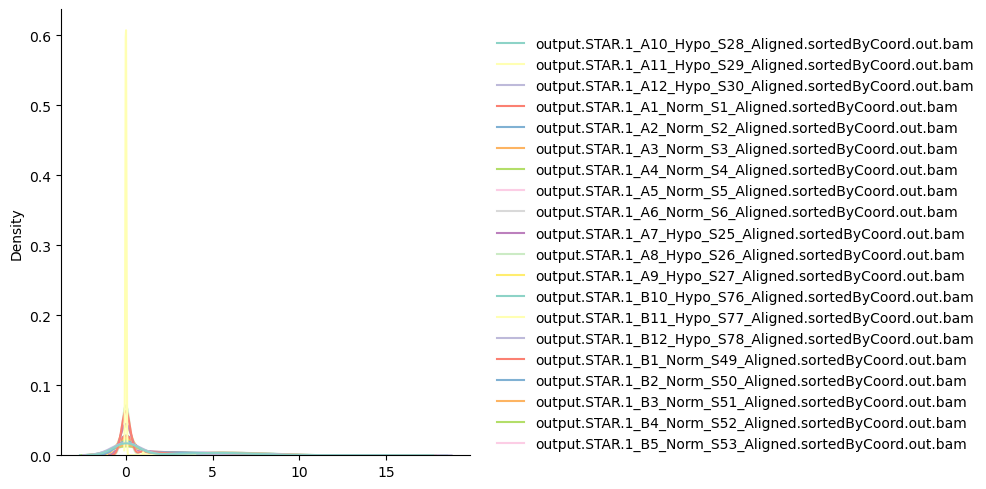

In [47]:
df_small = df.iloc[:, :20]
sns.displot(data=df_small,palette="Set3",kind="kde", bw_adjust=2)

The plot shows that despite the transformation, most genes still have low expression values, with a prominent density peak near zero, consistent with the sparse nature of single-cell RNA-seq data.

Although the data have been log-transformed, the KDE plot shows that expression distributions across cells remain heterogeneous, indicating the need for normalization.
Log-transformation reduces skewness and outliers, but it does not address differences in library size or overall expression scale between cells.
We therefore applied normalization to ensure that gene expression profiles are comparable across cells.

Before proceeding with the normalization, we try to do th same plot with the filtered dataset and the filtered and normalized one to see how it changes.

In [48]:
df_filtered = pd.read_csv("MCF7_SmartS_Filtered_Data.txt",delimiter=" ",engine='python',index_col=0)
df_filtered.head()

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_B11_Hypo_S77_Aligned.sortedByCoord.out.bam,output.STAR.1_B12_Hypo_S78_Aligned.sortedByCoord.out.bam,output.STAR.1_B4_Norm_S52_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,0,1
MIR6859-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,1,0,0,1,10,1,0,4,1,0,...,2,1,1,0,0,0,1,1,4,5
OR4F29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
MTND1P23,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [49]:
df_filtered.shape

(18945, 313)

In [50]:
df_normalized = pd.read_csv("MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt",delimiter=" ",engine='python',index_col=0)
df_normalized.head()

,output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,output.STAR.2_B9_Hypo_S81_Aligned.sortedByCoord.out.bam,output.STAR.2_C10_Hypo_S130_Aligned.sortedByCoord.out.bam,output.STAR.2_C11_Hypo_S131_Aligned.sortedByCoord.out.bam,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.2_C2_Norm_S104_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
CYP1B1,343,131,452,27,5817,3841,9263,21543,1013,53,...,7890,4512,160,351,327,196,504,34565,20024,5953
CYP1B1-AS1,140,59,203,7,2669,1565,3866,9113,459,22,...,3647,2035,75,138,130,102,238,13717,7835,2367
CYP1A1,0,0,0,0,0,79,238,443,0,0,...,86,1654,0,0,0,1,0,11274,563,522
NDRG1,0,1,0,0,654,1263,2634,540,0,13,...,481,1052,0,0,54,243,62,1263,925,1572
DDIT4,386,289,0,288,2484,2596,1323,2044,36,204,...,3692,2410,800,1,189,266,417,4256,12733,2275


In [51]:
df_normalized.shape

(3000, 250)

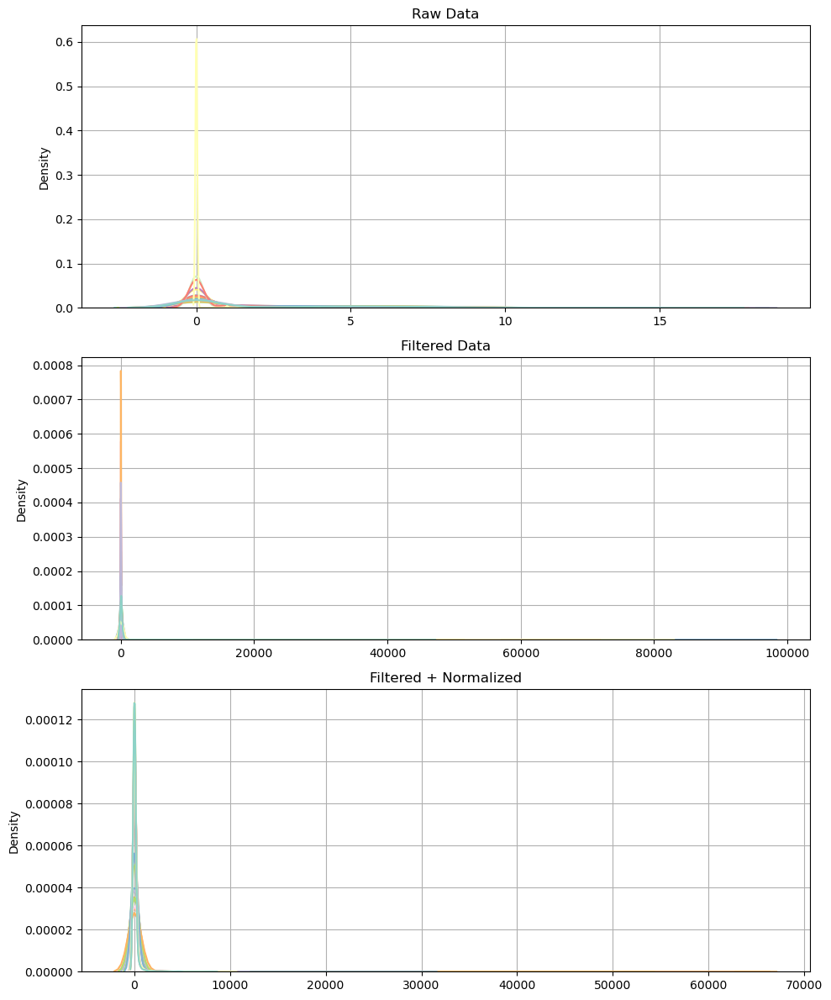

In [52]:
fig, axes = plt.subplots(3, 1, figsize=(10, 12))

sns.kdeplot(data=df.iloc[:, :20], ax=axes[0], bw_adjust=2, palette="Set3")
axes[0].set_title("Raw Data")
axes[0].grid(True)
axes[0].legend([], [], frameon=False)

sns.kdeplot(data=df_filtered.iloc[:, :20], ax=axes[1], bw_adjust=2, palette="Set3")
axes[1].set_title("Filtered Data")
axes[1].grid(True)
axes[1].legend([], [], frameon=False)

sns.kdeplot(data=df_normalized.iloc[:, :20], ax=axes[2], bw_adjust=2, palette="Set3")
axes[2].set_title("Filtered + Normalized")
axes[2].grid(True)
axes[2].legend([], [], frameon=False)

plt.tight_layout()
plt.show()

- In the raw data, all cells exhibit highly skewed distributions with a strong density peak near zero, reflecting the sparsity and extreme value range typical of single-cell RNA-seq. 
- Filtering out low-quality or extreme cells reduced the range of expression values but did not eliminate scale differences across cells. 
- After normalization, the expression distributions became more consistent across cells, with comparable density curves and reduced variability.
This confirms that the combination of filtering and normalization is essential to produce reliable, comparable expression profiles.

Our objective is to normalize our data to ensure that gene expression profiles are comparable across cells. In order to do that we use the z-score.

In [53]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_zscore = pd.DataFrame(
    scaler.fit_transform(df.T).T,  
    index=df.index,
    columns=df.columns
)
df_zscore.head()

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,-0.278463,-0.278463,-0.278463,-0.278463,-0.278463,-0.278463,-0.278463,-0.278463,-0.278463,-0.278463,...,-0.278463,-0.278463,-0.278463,2.377619,-0.278463,-0.278463,-0.278463,2.377619,-0.278463,2.377619
MIR6859-1,-0.117915,-0.117915,-0.117915,-0.117915,-0.117915,-0.117915,-0.117915,-0.117915,-0.117915,-0.117915,...,-0.117915,-0.117915,-0.117915,-0.117915,-0.117915,-0.117915,-0.117915,-0.117915,-0.117915,-0.117915
WASH9P,0.177560,-0.831139,-0.831139,-0.831139,-0.831139,0.177560,2.658387,0.177560,-0.831139,-0.831139,...,0.177560,0.177560,-0.831139,-0.831139,-0.831139,-0.831139,0.177560,0.177560,1.510988,1.776311
OR4F29,-0.186304,-0.186304,-0.186304,-0.186304,-0.186304,-0.186304,-0.186304,-0.186304,-0.186304,-0.186304,...,-0.186304,-0.186304,-0.186304,-0.186304,-0.186304,-0.186304,-0.186304,-0.186304,3.832565,-0.186304
MTND1P23,-0.220133,-0.220133,-0.220133,-0.220133,-0.220133,-0.220133,-0.220133,-0.220133,-0.220133,-0.220133,...,-0.220133,-0.220133,4.316388,-0.220133,-0.220133,-0.220133,-0.220133,-0.220133,-0.220133,-0.220133


In [54]:
df_zscore.describe()

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
count,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,...,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000
mean,-0.040639,-0.897810,-0.079799,-0.725763,-0.206932,0.108451,0.309716,0.323431,0.294154,-0.638393,...,-0.153612,0.233142,-0.648699,0.016991,-0.103255,-0.133041,0.141495,0.152626,0.217681,0.184817
std,0.795207,0.877121,1.136802,0.696980,0.568570,0.887761,1.077849,0.893844,1.056584,0.594068,...,0.600130,1.005926,1.014136,0.793846,0.716165,0.887709,1.133977,0.996227,1.004242,0.966045
min,-2.700296,-4.398568,-3.138342,-3.108603,-2.350285,-2.379632,-2.564773,-1.810402,-2.321785,-3.059931,...,-2.267816,-2.543541,-3.578360,-2.922393,-2.551507,-2.401365,-3.050491,-2.835797,-2.823670,-2.630323
25%,-0.387680,-1.462380,-0.618783,-1.211729,-0.453184,-0.300285,-0.231221,-0.180684,-0.230289,-1.044335,...,-0.394576,-0.225121,-1.229406,-0.313862,-0.381101,-0.435159,-0.328021,-0.314195,-0.278984,-0.278283
50%,-0.122601,-0.616165,-0.159986,-0.515583,-0.174477,-0.096853,-0.072452,-0.069214,-0.072452,-0.466629,...,-0.155126,-0.072452,-0.434011,-0.102733,-0.133331,-0.160168,-0.100064,-0.098484,-0.088807,-0.088852
75%,0.226328,-0.163907,0.020171,-0.149577,-0.072251,0.502064,0.833891,0.797218,0.792679,-0.145727,...,-0.067933,0.609504,-0.122185,0.322316,0.037724,-0.067356,0.566062,0.612126,0.747224,0.665622
max,13.802174,13.802174,18.187441,9.161075,11.254629,16.522001,15.519567,18.225975,18.225975,9.733961,...,17.476847,19.158036,18.549300,17.872331,15.580814,17.947653,19.056601,16.522001,18.214115,16.522001


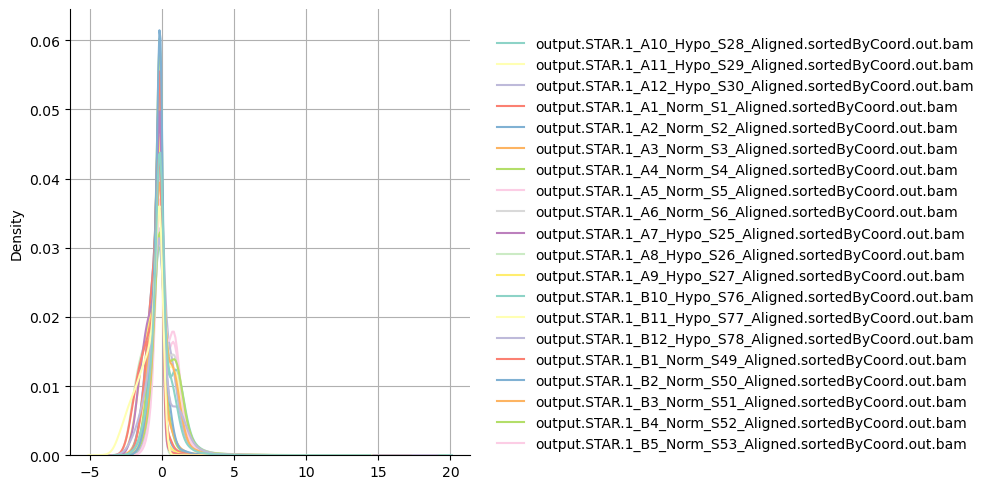

In [55]:
df_small = df_zscore.iloc[:, :20]  
sns.displot(data=df_small, palette="Set3", kind="kde", bw_adjust=2)
plt.grid(True)

We applied Z-score normalization to each cell, centering and scaling the gene expression profiles so that each cell has a mean of zero and a standard deviation of one.
This process eliminates differences in scale and expression intensity between cells, allowing for meaningful comparisons across cell profiles; in fact the KDE plot of normalized expression values shows that the distributions of all selected cells are now closely aligned and centered around zero.

### Duplicate rows

As a final quality check, we verified the presence of duplicated gene expression profiles in the dataset.

In [56]:
duplicate_rows_df = df[df.duplicated(keep=False)]
print("Number of duplicate rows: ", duplicate_rows_df.shape)
print("Duplicate rows: ", duplicate_rows_df)

Number of duplicate rows:  (56, 383)
Duplicate rows:                   output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam  \
SHISAL2A                                                       0.0          
IL12RB2                                                        0.0          
S1PR1                                                          0.0          
CD84                                                           0.0          
GNLY                                                           0.0          
FAR2P3                                                         0.0          
KLF2P3                                                         0.0          
PABPC1P2                                                       0.0          
UGT1A8                                                         0.0          
UGT1A9                                                         0.0          
SLC22A14                                                       0.0          
COQ10BP2              

In [57]:
print("Names of duplicate rows: ",duplicate_rows_df.index)

Names of duplicate rows:  Index(['SHISAL2A', 'IL12RB2', 'S1PR1', 'CD84', 'GNLY', 'FAR2P3', 'KLF2P3',
       'PABPC1P2', 'UGT1A8', 'UGT1A9', 'SLC22A14', 'COQ10BP2', 'PANDAR',
       'LAP3P2', 'RPL22P16', 'GALNT17', 'PON1', 'HTR5A', 'SNORA36A', 'MIR664B',
       'CSMD1', 'KCNS2', 'MIR548AA1', 'MIR548D1', 'MTCO2P11', 'CLCN3P1',
       'SUGT1P4-STRA6LP', 'STRA6LP', 'MUC6', 'VSTM4', 'LINC00856', 'LINC00595',
       'CACYBPP1', 'LINC00477', 'KNOP1P1', 'WDR95P', 'MIR20A', 'MIR19B1',
       'RPL21P5', 'RNU6-539P', 'SNRPN', 'SNURF', 'RBFOX1', 'LINC02183', 'MT1M',
       'ASPA', 'BCL6B', 'CCL3L3', 'CCL3L1', 'OTOP3', 'RNA5SP450', 'PSG1',
       'MIR3190', 'MIR3191', 'SEZ6L', 'ADAMTS5'],
      dtype='object')


To identify potential redundancy in gene expression profiles, we computed pairwise correlations between selected genes suspected of being duplicates or redundant.

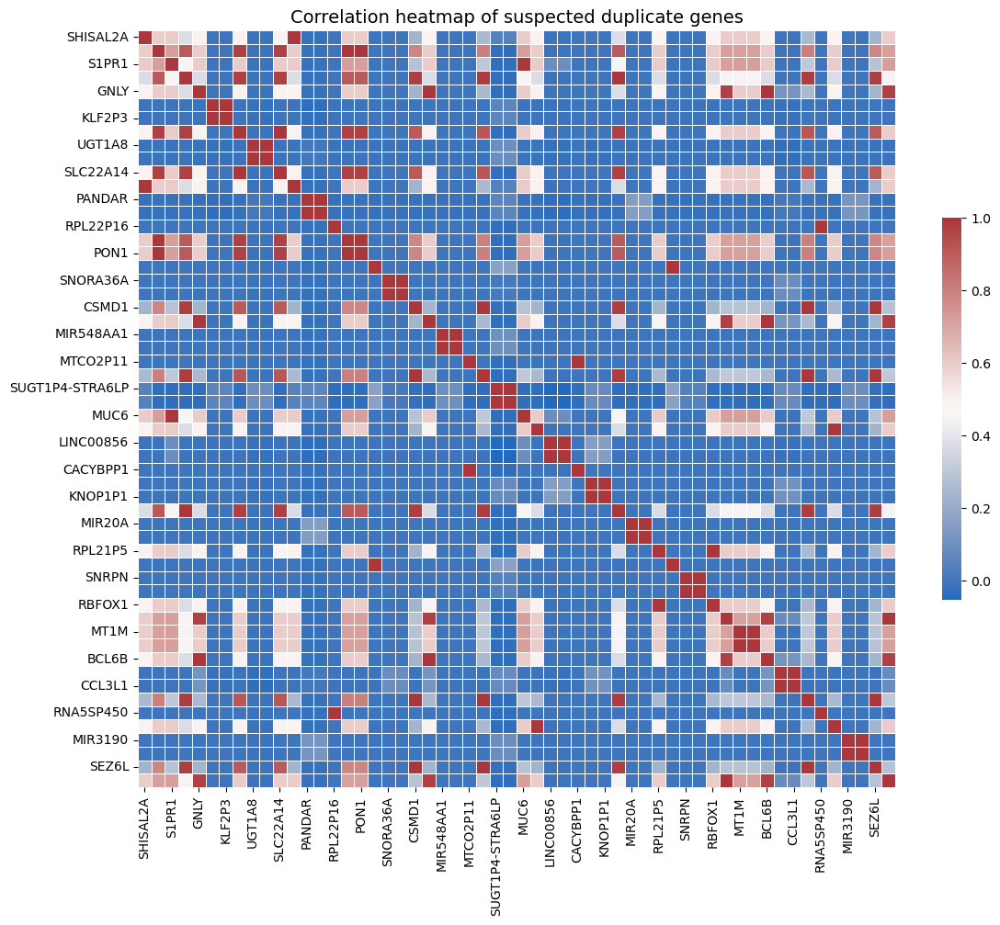

In [58]:
duplicate_rows_df_t = duplicate_rows_df.T
c_dupl = duplicate_rows_df_t.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(c_dupl, cmap='vlag', annot=False, square=True, linewidths=0.5, cbar_kws={"shrink": 0.5})
plt.title("Correlation heatmap of suspected duplicate genes", fontsize=14)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

The correlation matrix revealed several gene pairs with extremely high similarity.

Let's take a look at the statistics of the gene expression profiles of genes that seem duplicates.

In [59]:
duplicate_rows_df_t.describe()

,SHISAL2A,IL12RB2,S1PR1,CD84,GNLY,FAR2P3,KLF2P3,PABPC1P2,UGT1A8,UGT1A9,...,BCL6B,CCL3L3,CCL3L1,OTOP3,RNA5SP450,PSG1,MIR3190,MIR3191,SEZ6L,ADAMTS5
count,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,...,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000
mean,0.005222,0.006749,0.010888,0.006749,0.005222,0.013055,0.013055,0.005222,0.137891,0.137891,...,0.005222,0.093464,0.093464,0.009360,0.005222,0.005222,0.005222,0.005222,0.009941,0.006749
std,0.072168,0.095647,0.154756,0.095647,0.072168,0.113658,0.113658,0.072168,0.739790,0.739790,...,0.072168,0.579702,0.579702,0.141500,0.072168,0.072168,0.072168,0.072168,0.152152,0.095647
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.584963,2.584963,1.584963,1.000000,1.000000,1.000000,1.000000,6.303781,6.303781,...,1.000000,6.066089,6.066089,2.584963,1.000000,1.000000,1.000000,1.000000,2.807355,1.584963


The next step is dropping the duplicates. Thus we count the number of cells that we have in our initial dataframe and we see how many of them are deleted after the dropping.

In [60]:
df.count()

output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam    22934
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam    22934
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam    22934
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam      22934
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam      22934
                                                            ...  
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam    22934
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam    22934
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam    22934
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam    22934
output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam    22934
Length: 383, dtype: int64

In [61]:
df_noDup = df.drop_duplicates()
df_noDup.count()

output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam    22905
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam    22905
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam    22905
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam      22905
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam      22905
                                                            ...  
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam    22905
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam    22905
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam    22905
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam    22905
output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam    22905
Length: 383, dtype: int64

As we can see, we went from 22934 to 22905 cells. This means that we dropped 29 duplicates.
Since the correlation was very high, as confirmed by the correlation matrix, we can use the new dataframe without missing any relevant information.

In [62]:
df = df_noDup
df.shape

(22905, 383)

Just to conclude our search for duplicates, we check also the columns even though having duplicate complumns in such dataset is very rare.

In [63]:
duplicated_cols_mask = df.T.duplicated(keep=False)
n_duplicates = duplicated_cols_mask.sum()
print(f"Number of duplicated columns: {n_duplicates}")

Number of duplicated columns: 0


No duplicated columns were found, confirming the uniqueness of each single-cell expression profile.

### Data structure

As a final step in our exploratory data analysis, we computed and visualized the correlation matrix between cells and the one between genes. 
Since the dataset is big and the resulting matrix would not be clear to interpret, we use only a portion of 50 samples of the dataframe.

Number of cells included:  (50, 50)
Average correlation of expression profiles between cells:  0.4987517095734348
Min. correlation of expression profiles between cells:  -0.0024965808531303437


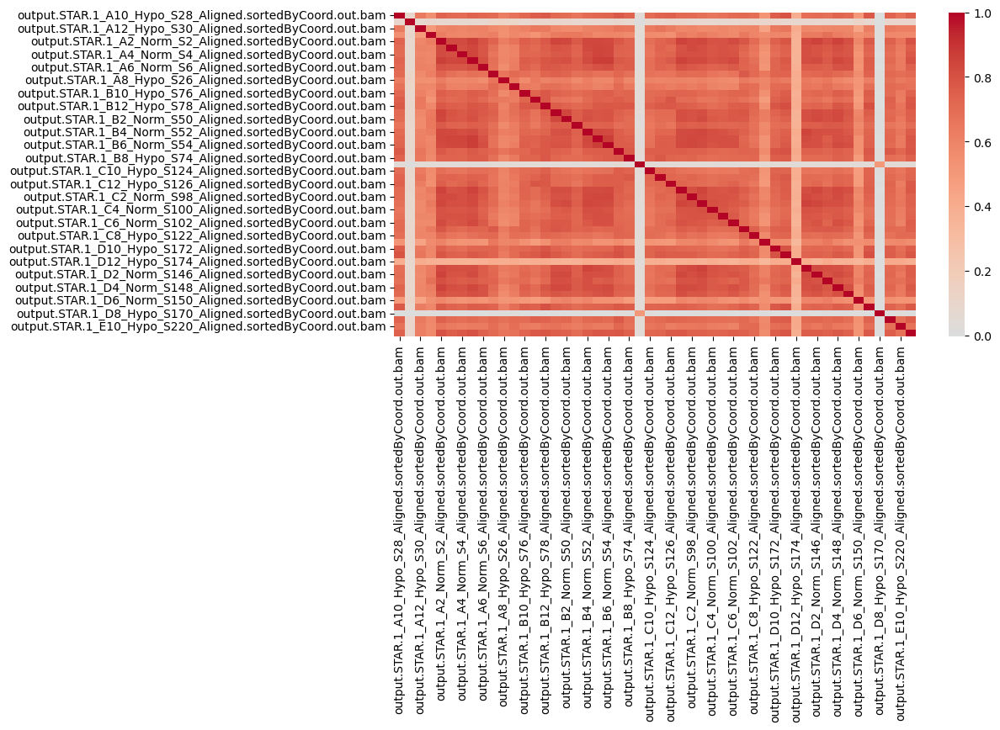

In [64]:
plt.figure(figsize=(10,5))
df_small = df.iloc[:, :50]
c= df_small.corr()
midpoint = (c.values.max() - c.values.min()) /2 + c.values.min()

sns.heatmap(c,cmap='coolwarm', center=0 )
print("Number of cells included: ", np.shape(c))
print("Average correlation of expression profiles between cells: ", midpoint)
print("Min. correlation of expression profiles between cells: ", c.values.min())

The plot reveals generally high correlation among many cells, indicating consistency in transcriptional profiles and good data quality.
This analysis confirms that the dataset contains structured variation, and supports the application of unsupervised methods.

Number of genes included: (50, 50)
Average correlation of expression profiles between genes: 0.454
Min. correlation of expression profiles between genes: -0.092


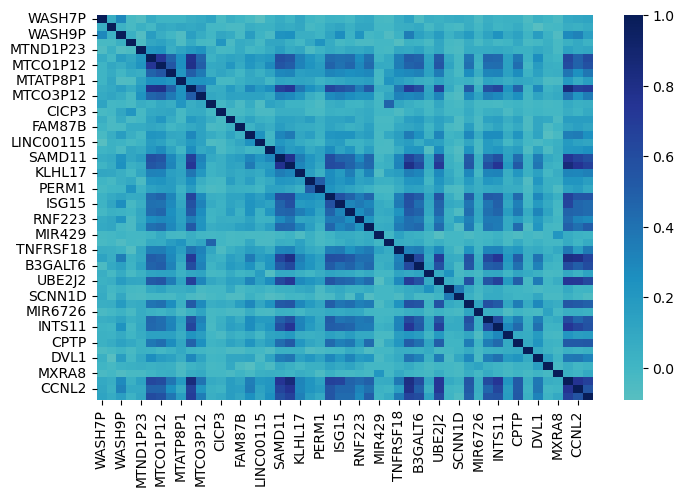

In [65]:
plt.figure(figsize=(8, 5))
df_small = df.iloc[:50, ]
gene_corr = df_small.T.corr()
midpoint = (gene_corr.values.max() - gene_corr.values.min()) / 2 + gene_corr.values.min()

sns.heatmap(gene_corr, cmap='YlGnBu', center=0)

print("Number of genes included:", gene_corr.shape)
print("Average correlation of expression profiles between genes:", round(midpoint, 4))
print("Min. correlation of expression profiles between genes:", round(gene_corr.values.min(), 4))

The heatmap reveals that, while most gene pairs exhibit low to moderate correlation levels, certain subsets of genes display consistently high co-expression patterns.

To complement the correlation heatmaps, we plotted the distributions of pairwise correlation values across genes and across cells.

The gene-gene correlation distribution highlights how frequently genes co-vary across the cell population.
The histogram of cell–cell correlations, on the other hand, provides an overview of how similar the single-cell expression profiles are within the dataset.

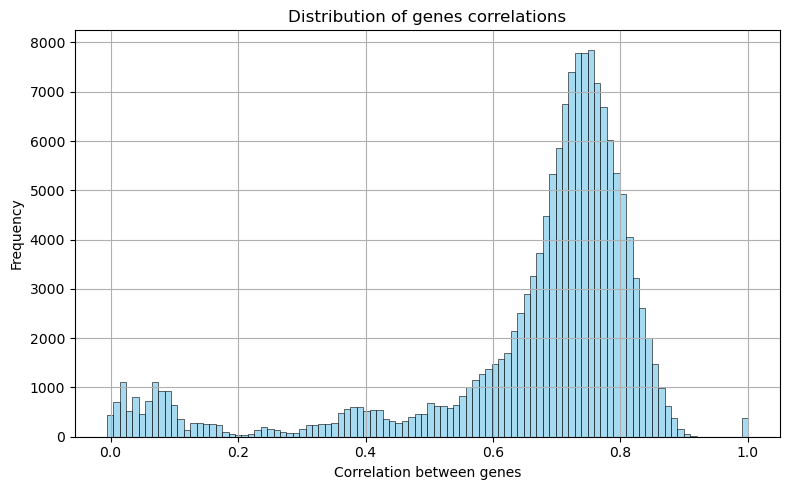

In [66]:
c = df.corr()
corr_vals = c.values.flatten()

plt.figure(figsize=(8,5))
sns.histplot(corr_vals, bins=100, kde=False, legend=False,  color='skyblue', edgecolor='black')

plt.ylabel('Frequency')
plt.xlabel('Correlation between genes')
plt.title('Distribution of genes correlations')
plt.grid(True)
plt.tight_layout()
plt.show()

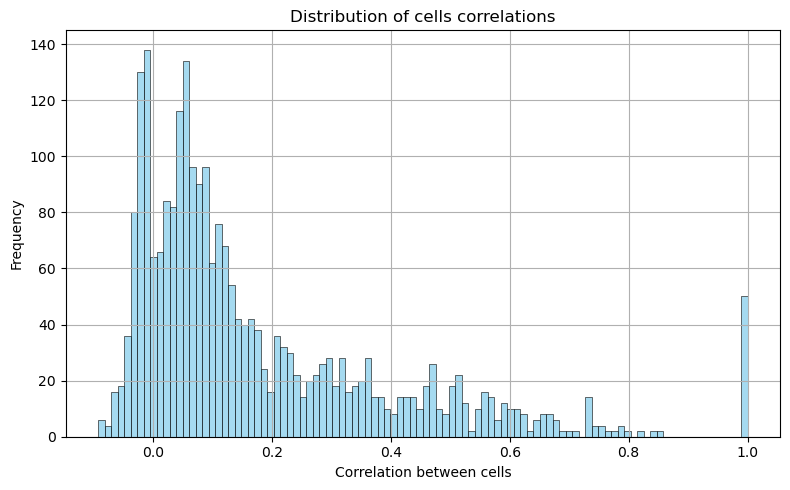

In [67]:
c = df_small.T.corr()
corr_vals = c.values.flatten()

plt.figure(figsize=(8,5))
sns.histplot(corr_vals, bins=100, color='skyblue', edgecolor='black', kde=False, legend=False)

plt.ylabel('Frequency')
plt.xlabel('Correlation between cells')
plt.title('Distribution of cells correlations')
plt.grid(True)
plt.tight_layout()
plt.show()

The histogram of gene–gene correlations revealed a strong co-expression trend, with most gene pairs showing high correlation, suggesting shared biological functions.

In contrast, the distribution of cell–cell correlations was broader and skewed toward lower values, reflecting greater heterogeneity among cells. A subset of cells displayed very high correlation, while some had near-zero or even negative values.
This is expected in single-cell RNA-seq data, where biological heterogeneity and technical noise can lead to substantial differences in expression profiles between certain cells.
These low correlations may reflect distinct cell states, poorly captured cells, or sparsely expressed genes.

In summary, the exploratory data analysis allowed us to understand the structure and characteristics of the dataset at multiple levels.
After filtering and normalization, we observed a clear reduction in skewness and kurtosis, improved comparability across cells, and consistent data quality.

The final correlation analyses confirmed a strong co-expression trend among many genes, as well as moderate heterogeneity between cells — consistent with the expected biological variability in single-cell RNA-seq data.
The dataset is now ready for dimensionality reduction, clustering, and downstream modeling.

### The data: HCC1806

After completing the exploratory data analysis (EDA) of the MCF7 dataset, we now turn our attention to the HCC1806 dataset. This dataset, derived from a basal breast cancer cell line, will be analyzed following the same steps as before, allowing for a direct comparison of data quality, distribution patterns, and biological signals between the two cell types.

Let's analyze the meta data to understand the dataset we are working with.

In [68]:
df_meta= pd.read_csv("HCC1806_SmartS_MetaData.tsv", delimiter="\t", engine='python', index_col=0)
print("Dataframe dimensions:", np.shape(df_meta))

Dataframe dimensions: (243, 8)


In [69]:
df_meta.head()

,Cell Line,PCR Plate,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,HCC1806,1,A10,Normo,24,S123,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,HCC1806,1,A12,Normo,24,S26,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,HCC1806,1,A1,Hypo,24,S97,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,HCC1806,1,A2,Hypo,24,S104,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,HCC1806,1,A3,Hypo,24,S4,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


It is composed by 383 rows and 8 columns. 

The meaning of each column is the same as in the previous dataset. The only difference here is that here we have the **PCR Plate** that refers to the multi-well plate used during library preparation, where each well corresponds to an individual cell.

We can go to the actual sequencing data.

In [70]:
df_unfilt = pd.read_csv("HCC1806_SmartS_Unfiltered_Data.txt",  sep=r"\s+", engine="python", index_col=0)
print("Dataframe dimensions:", np.shape(df_unfilt))

Dataframe dimensions: (23396, 243)


In [71]:
print("First Column:\n", df_unfilt.iloc[ : , 0])

First Column:
 "WASH7P"         0
"CICP27"         0
"DDX11L17"       0
"WASH9P"         0
"OR4F29"         2
              ... 
"MT-TE"         22
"MT-CYB"      4208
"MT-TT"         26
"MT-TP"         66
"MAFIP"          0
Name: "output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam", Length: 23396, dtype: int64


The dimensions of the dataframe are 23396 rows and 243 columns. Each row contains the name of a gene and the number indicates whether and how much the gene is present in that cell segment.

In [72]:
list(df_unfilt.columns)

['"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1B11_Normoxia_S127_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1B12_Normoxia_S27_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1B1_Hypoxia_S98_Aligned.so

The columns instead represent the cells.

In [73]:
genes = df_unfilt.index
print("Dataframe indexes: ", genes)

Dataframe indexes:  Index(['"WASH7P"', '"CICP27"', '"DDX11L17"', '"WASH9P"', '"OR4F29"',
       '"MTND1P23"', '"MTND2P28"', '"MTCO1P12"', '"MTCO2P12"', '"MTATP8P1"',
       ...
       '"MT-TH"', '"MT-TS2"', '"MT-TL2"', '"MT-ND5"', '"MT-ND6"', '"MT-TE"',
       '"MT-CYB"', '"MT-TT"', '"MT-TP"', '"MAFIP"'],
      dtype='object', length=23396)


These are all the names of the rows, namely all the genes' names.

In [74]:
df_unfilt.head()

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""WASH7P""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""CICP27""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""DDX11L17""",0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""WASH9P""",0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
"""OR4F29""",2,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


That's how the dataset is formed. We can see how much a gene is present in each cell.
The numbers in the dataframe are all integers.

In [75]:
df_unfilt.dtypes

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"    int64
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     int64
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"       int64
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"      int64
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"        int64
                                                                          ...  
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"    int64
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"    int64
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"      int64
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"     int64
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"     int64
Length: 243, dtype: object

Now, let's inspect if we have any missing values. If so, we have to understand how to deal with them.

In [76]:
df_unfilt.isnull().sum()

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"    0
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     0
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"       0
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"      0
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"        0
                                                                         ..
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"    0
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"    0
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"      0
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"     0
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"     0
Length: 243, dtype: int64

Fortunately, we have all zeros: this means that we do not have any missing value.

### Sparsity

Before performing exploratory data analysis, it is useful to assess the sparsity of the dataset, both at the gene and at the cell level. Single-cell RNA-seq data are typically sparse, with many genes expressed in only a small fraction of cells and some cells expressing only a limited number of genes. Evaluating sparsity helps identify low-quality cells and uninformative genes, guiding filtering decisions.

Let's first look at the sparsity of the whole dataset.

In [77]:
total_elements = df_unfilt.shape[0] * df_unfilt.shape[1]
total_zeros = (df_unfilt == 0).sum().sum()
sparsity = total_zeros / total_elements
print(f"Overall Dataset Sparsity: {sparsity:.2%}")

Overall Dataset Sparsity: 55.85%


The dataset shows an overall sparsity of 55.85%, meaning that approximately 56% of all gene–cell combinations contain zero expression.

Now we compute the sparsity per cell and the sparsity per gene and make the plot of these two distributions.


Cell Sparsity Summary:
count    243.000000
mean       0.558456
std        0.096609
min        0.402206
25%        0.512353
50%        0.537058
75%        0.567576
max        0.998504
dtype: float64


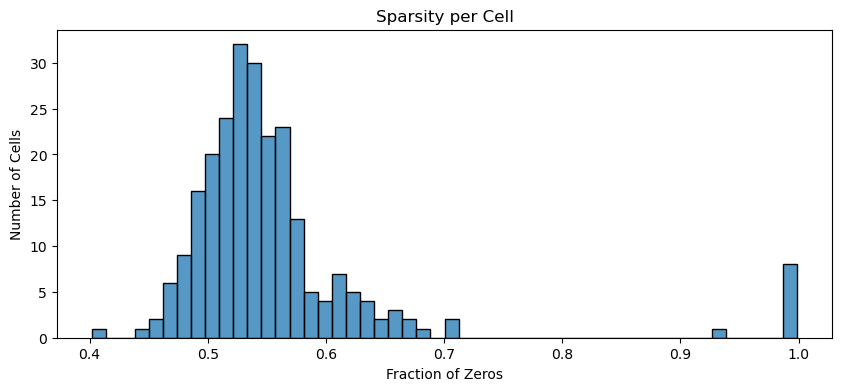

In [78]:
cell_sparsity = (df_unfilt == 0).sum(axis=0) / df_unfilt.shape[0]
print("\nCell Sparsity Summary:")
print(cell_sparsity.describe())

plt.figure(figsize=(10, 4))
sns.histplot(cell_sparsity, bins=50)
plt.title("Sparsity per Cell")
plt.xlabel("Fraction of Zeros")
plt.ylabel("Number of Cells")
plt.show()


Gene Sparsity Summary:
count    23396.000000
mean         0.558456
std          0.373002
min          0.012346
25%          0.152263
50%          0.617284
75%          0.950617
max          0.991770
dtype: float64


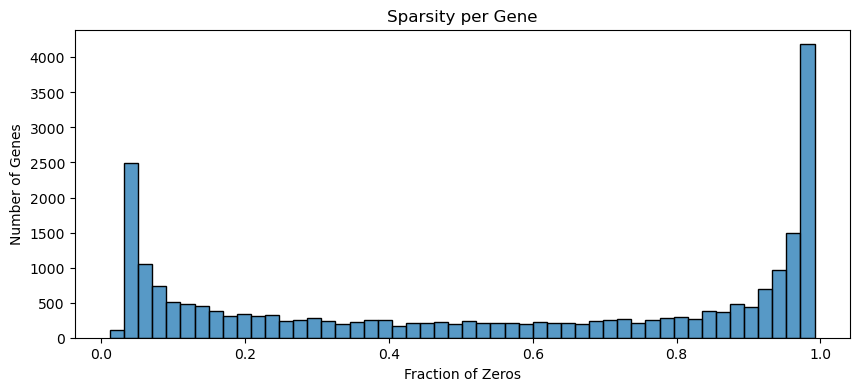

In [79]:
gene_sparsity = (df_unfilt == 0).sum(axis=1) / df_unfilt.shape[1]
print("\nGene Sparsity Summary:")
print(gene_sparsity.describe())

plt.figure(figsize=(10, 4))
sns.histplot(gene_sparsity, bins=50)
plt.title("Sparsity per Gene")
plt.xlabel("Fraction of Zeros")
plt.ylabel("Number of Genes")
plt.show()

- The sparsity per cell shows that most cells have between 50% and 60% of zero values. This level of sparsity is typical of single-cell RNA-seq data, where technical dropouts and low expression contribute to many zero counts. A smaller subset of cells, however, shows extreme sparsity close to 100%, suggesting low-quality cells that may need to be excluded during filtering.

- The sparsity per gene highlights that most genes are either expressed in nearly all cells or in only a very small fraction of cells. The latter group often represents noise or condition-specific genes.

Together, these analyses confirm that sparsity is a defining characteristic of the dataset and emphasize the importance of careful filtering to retain biologically meaningful signals while reducing technical artifacts.

### Descriptive statistics

Now, let's look at some descriptive statistics. To start, we analyze the cells and their distribution.

In [80]:
df_unfilt.describe()

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
count,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,...,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000
mean,99.565695,207.678278,9.694734,150.689007,35.700504,47.088434,152.799453,135.869422,38.363908,45.512139,...,76.361771,105.566593,54.026116,29.763806,28.905411,104.740725,35.181569,108.197940,37.279962,76.303855
std,529.532443,981.107905,65.546050,976.936548,205.885369,545.367706,864.974182,870.729740,265.062493,366.704721,...,346.659348,536.881574,344.068304,186.721266,135.474736,444.773045,170.872090,589.082268,181.398951,369.090274
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,1.000000
75%,51.000000,125.000000,5.000000,40.000000,22.000000,17.000000,81.000000,76.000000,22.000000,18.000000,...,56.000000,67.000000,29.000000,18.000000,19.000000,76.000000,24.000000,68.000000,22.000000,44.000000
max,35477.000000,69068.000000,6351.000000,70206.000000,17326.000000,47442.000000,43081.000000,62813.000000,30240.000000,35450.000000,...,19629.000000,30987.000000,21894.000000,13457.000000,11488.000000,33462.000000,15403.000000,34478.000000,10921.000000,28532.000000


We plot some graphs to understand better our data.

First of all, we plot the number of cells by condition. We remember that our final aim it to recognize the condition of normoxia and hypoxia.

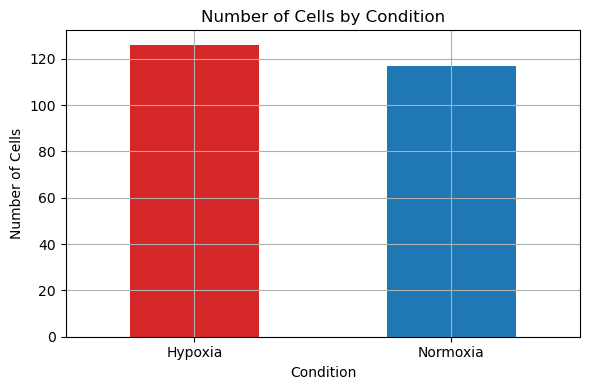

In [81]:
colnames = df_unfilt.columns
conditions = colnames.str.extract(r'(Hypoxia|Normoxia)', expand=False)
counts = conditions.value_counts()

plt.figure(figsize=(6, 4))
counts.plot(kind='bar', color=["#d62728", "#1f77b4"])
plt.title("Number of Cells by Condition")
plt.xlabel("Condition")
plt.grid(True)
plt.ylabel("Number of Cells")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


A slightly higher number of cells were collected under hypoxia compared to normoxia. Although the difference is modest, the counts are relatively balanced, ensuring that both conditions are well represented in the dataset. This balance is important as it minimizes potential bias in downstream analyses, allowing comparisons between hypoxia and normoxia to be more reliable.

Now we plot an histogram that represents the number of genes expressed for each cell, namely for each cell how many genes have values > 0.

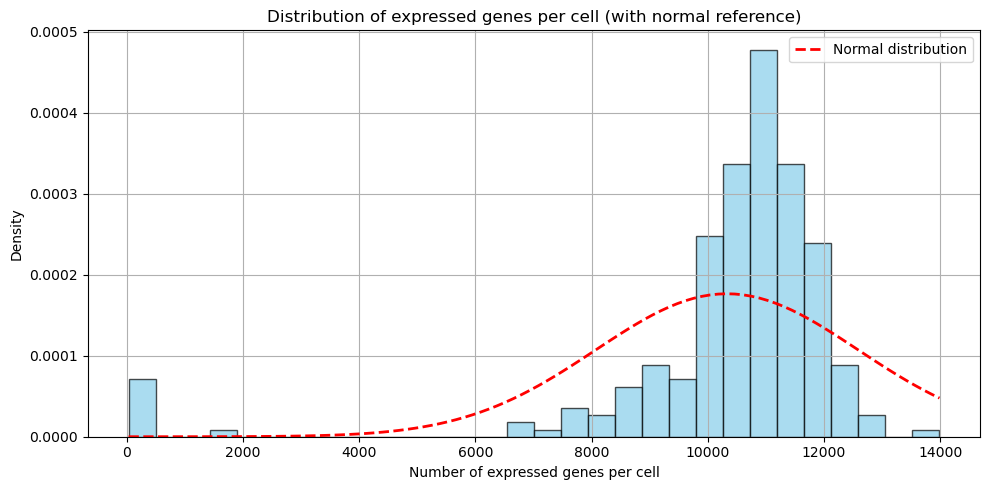

In [82]:
expression_threshold = 0
genes_expressed_per_cell = (df_unfilt > expression_threshold).sum(axis=0)

mean = genes_expressed_per_cell.mean()
std = genes_expressed_per_cell.std()
x = np.linspace(genes_expressed_per_cell.min(), genes_expressed_per_cell.max(), 100)

plt.figure(figsize=(10, 5))
plt.hist(genes_expressed_per_cell, bins=30, color='skyblue', edgecolor='black', alpha=0.7, density=True)

plt.plot(x, norm.pdf(x, mean, std), color='red', linestyle='--', linewidth=2, label='Normal distribution')

plt.xlabel('Number of expressed genes per cell')
plt.ylabel('Density')
plt.title('Distribution of expressed genes per cell (with normal reference)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



Most cells express between 9,000 and 12,000 genes, with a peak in between them, indicating relatively high transcriptional activity and good overall data quality. A few outliers with very low numbers of expressed genes are also present, which may correspond to low-quality cells or technical dropouts. Compared to the overlaid normal distribution, the observed data are more skewed and show a sharper peak, reflecting the biological and technical heterogeneity typically observed in single-cell datasets.

Similarly, we plot the histograms with the count sum for each cell: we see how many genes are found for each cell.

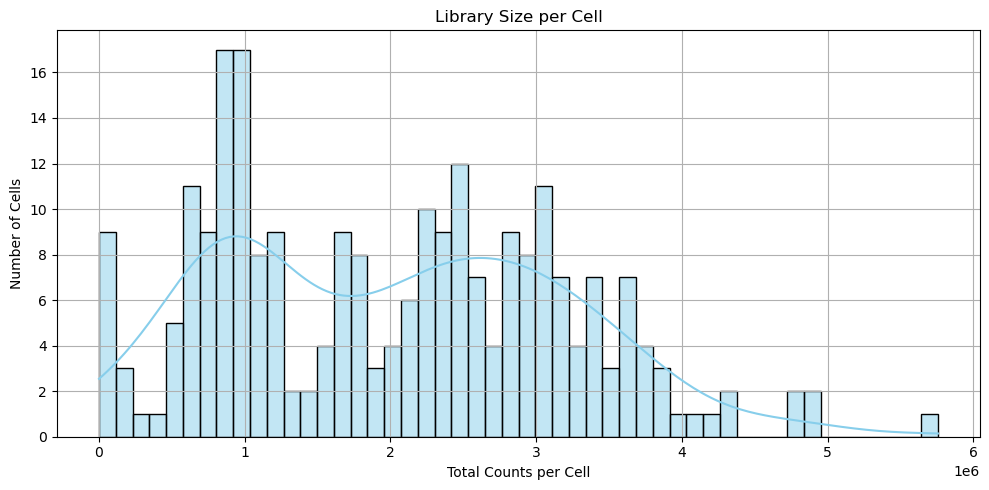

In [83]:
total_counts = df_unfilt.sum(axis=0)

plt.figure(figsize=(10, 5))
sns.histplot(total_counts, bins=50, kde=True, color='skyblue', edgecolor='black')
plt.title("Library Size per Cell")
plt.xlabel("Total Counts per Cell")
plt.ylabel("Number of Cells")
plt.grid(True)
plt.tight_layout()
plt.show()


Most cells have library sizes between 1 and 3 million counts, with noticeable variability across the dataset. While some heterogeneity in library size is expected in single-cell RNA-seq data, cells with extremely low or excessively high counts can bias downstream analyses.

To go a little deeper in the analysis, we analyze the number of genes expressed per cell, by condition. For each cell, let's see how many genes are expressed and then we compare the two conditions.

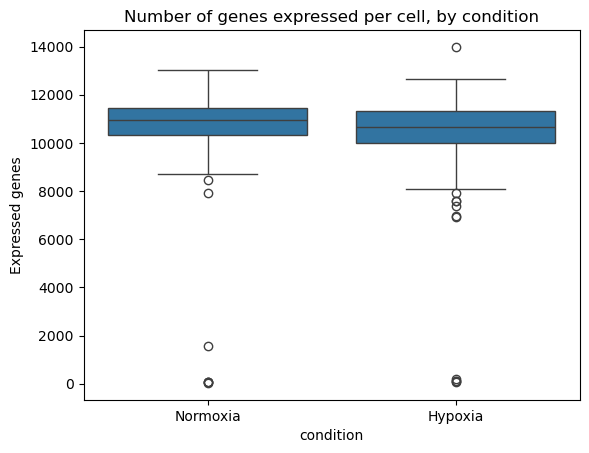

In [84]:
labels = ["Hypoxia" if "Hypo" in col else "Normoxia" for col in df_unfilt.columns]

plot_df = pd.DataFrame({
    "Expressed genes": genes_expressed_per_cell.values,
    "condition": labels
})

sns.boxplot(data=plot_df, x="condition", y="Expressed genes")
plt.title("Number of genes expressed per cell, by condition")
plt.show()

Both conditions display a similar median suggesting comparable overall transcriptional activity.  However, several outliers are visible in both conditions, with some cells showing extremely low numbers of detected genes, likely representing low-quality cells or technical dropouts. A few cells with unusually high expression counts are also present. Overall, the distributions appear balanced between the two conditions, supporting their comparability in downstream analyses.

We work in a similar way also for the genes.

In [85]:
df_unfilt.T.describe() 

,"""WASH7P""","""CICP27""","""DDX11L17""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
count,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,...,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000
mean,0.045267,0.119342,0.469136,0.255144,0.127572,117.930041,28.427984,904.308642,1.403292,0.378601,...,10.358025,5.930041,13.493827,2290.213992,386.901235,18.246914,2163.588477,20.613169,46.444444,3.897119
std,0.318195,0.594531,1.455282,0.818639,0.440910,103.038022,26.062662,654.520308,1.735003,0.747361,...,10.910199,7.040559,11.803967,1726.423259,309.276105,54.076514,1730.393947,22.224590,47.684223,4.736193
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,46.500000,8.000000,390.500000,0.000000,0.000000,...,2.000000,1.000000,4.000000,918.000000,138.500000,4.000000,947.500000,5.000000,14.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,94.000000,22.000000,790.000000,1.000000,0.000000,...,7.000000,4.000000,10.000000,1848.000000,320.000000,11.000000,1774.000000,14.000000,38.000000,2.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,157.000000,42.000000,1208.000000,2.000000,1.000000,...,14.000000,7.500000,20.000000,3172.000000,528.000000,20.000000,2927.000000,30.500000,64.500000,6.000000
max,3.000000,5.000000,12.000000,6.000000,4.000000,694.000000,120.000000,3569.000000,12.000000,4.000000,...,52.000000,43.000000,57.000000,8972.000000,1439.000000,804.000000,11383.000000,154.000000,409.000000,24.000000


Let's see also the distribution of cells per genes.

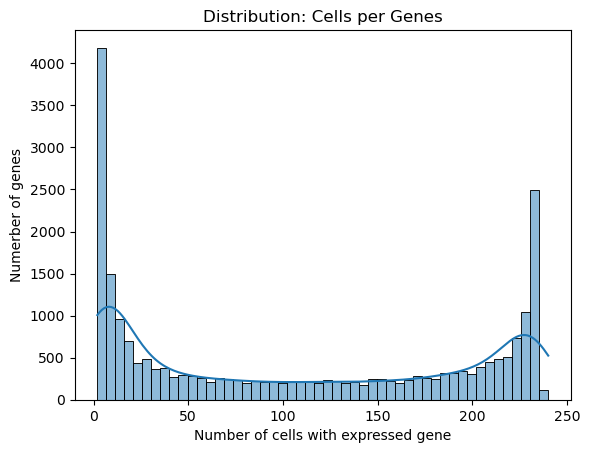

In [86]:
gene_n_cells = (df_unfilt != 0).sum(axis=1)

sns.histplot(gene_n_cells, bins=50, kde = True)
plt.title("Distribution: Cells per Genes")
plt.xlabel("Number of cells with expressed gene")
plt.ylabel("Numerber of genes")
plt.show()

Two prominent peaks are observed: one at the left end, corresponding to genes expressed in only a few cells, and another at the right end, corresponding to genes expressed in nearly all cells. The large number of rarely detected genes reflects the expected sparsity of single-cell RNA-seq data. Conversely, the strong peak on the right highlights core genes of the population. This bimodal pattern is characteristic of scRNA-seq datasets and underscores the need to carefully balance filtering.

Now we are going back to our initial dataframe. Let's do a deep dive to further explore single cells or small groups.

<Axes: xlabel='"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"'>

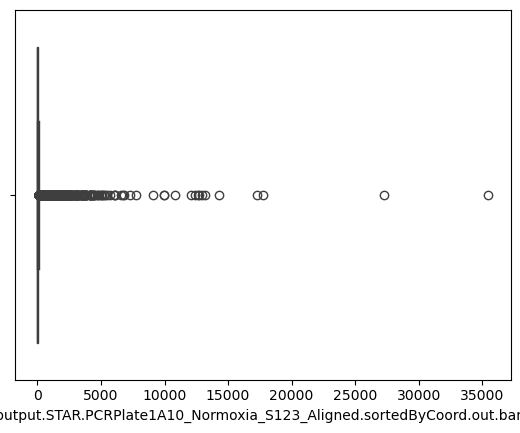

In [87]:
cnames = list(df_unfilt.columns) 
sns.boxplot(x=df_unfilt[cnames[0]])

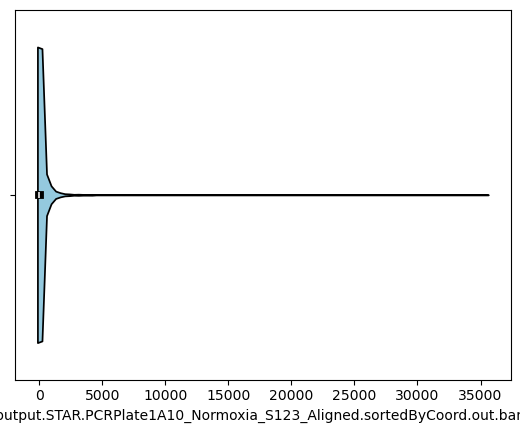

In [88]:
sns.violinplot(x=df_unfilt[cnames[0]],  color='skyblue', edgecolor='black');

Most genes show relatively low expression, while a small subset of genes exhibit very high counts, appearing as extreme outliers. This skewed distribution is typical of single-cell RNA-seq data, where a minority of highly expressed genes, while the majority of genes are expressed at low levels. Such patterns highlight the sparsity and heterogeneity inherent to single-cell data and emphasize the importance of normalization strategies before downstream analyses.

Now we do the violin plot of the gene expression for the first 50 samples.

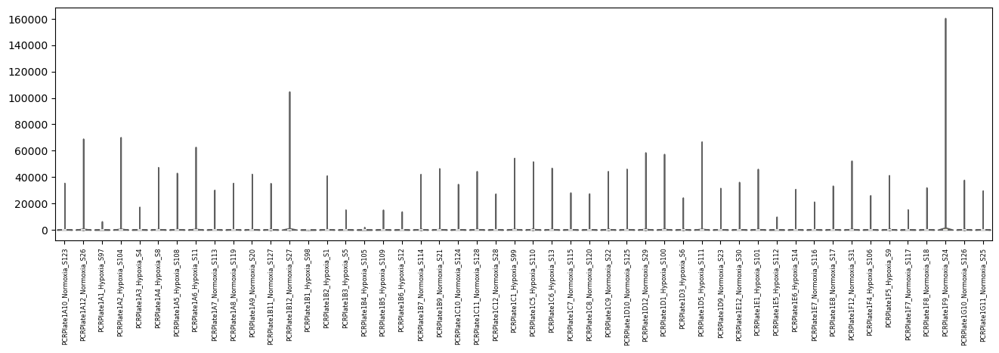

In [89]:
df_small = df_unfilt.iloc[:, :50]
df_small.columns = [
    re.search(r'PCRPlate.*?_S\d+', col).group(0) if re.search(r'PCRPlate.*?_S\d+', col) else col
    for col in df_small.columns
]

plt.figure(figsize=(16, 4))
plot = sns.violinplot(data=df_small, palette="Set3", cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.xticks(rotation=90, fontsize=6)
plt.show()

Most cells show relatively low read counts with a strong concentration near the lower range, while a subset of cells exhibits much higher values, producing elongated tails in several violins. This indicates substantial variability in sequencing depth both within and between samples. 
These raw data are difficult to interpret and they highlight the need for log-transformation or filtering in subsequent analysis.

For completeness, let's look also at the violin plot for the first 50 genes. Each violin represents one gene, and its shape reflects how that gene's expression varies among individual cells.

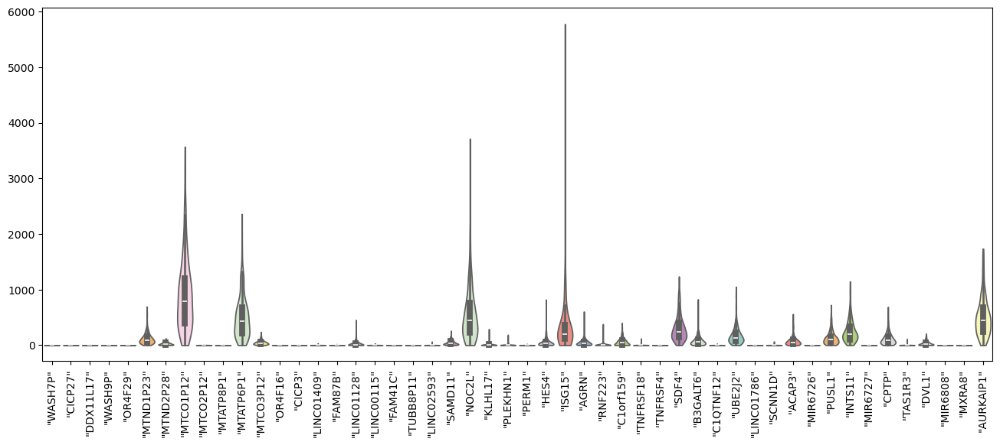

In [90]:
df_small2 = df_unfilt.T.iloc[:, :50]

plt.figure(figsize=(16, 6))
plot = sns.violinplot(data=df_small2, palette="Set3", cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.show()

Expression patterns are highly heterogeneous: most genes display low expression in the majority of cells, while a smaller fraction of cells shows very high counts, resulting in long-tailed distributions. A few genes exhibit strong variability.  The skewed, sparse distributions observed here are characteristic of single-cell data and emphasize the need for normalization and statistical modeling to reliably capture underlying biological differences.

Then we plot the heatmap of the top 20 most variable genes across the first 50 cells. High-variance genes are informative as they capture the biological heterogeneity present in the dataset.

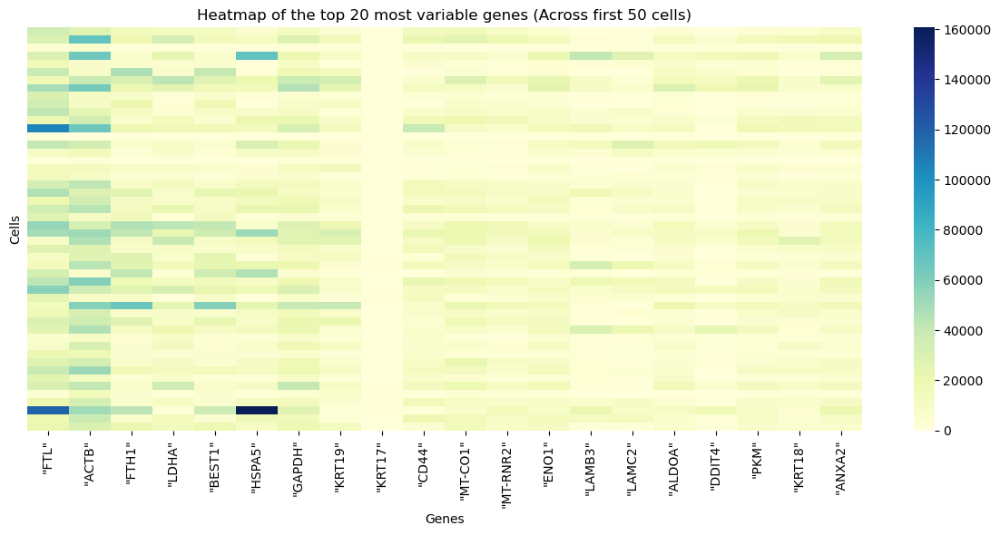

In [91]:

gene_variance = df_unfilt.T.var(axis=0)
labels = df_unfilt.columns.to_series().str.extract(r'_(Normoxia|Hypoxia)_', expand=False)
df_T = df_unfilt.T
df_T["condition"] = labels.values


top_genes = gene_variance.sort_values(ascending=False).head(20).index
labels = df_T["condition"]

subset_cells = df_T[:50]  

data_subset = subset_cells[top_genes]

plt.figure(figsize=(12, 6))
sns.heatmap(data_subset, cmap="YlGnBu", yticklabels=False)
plt.title("Heatmap of the top 20 most variable genes (Across first 50 cells)")
plt.xlabel("Genes")
plt.ylabel("Cells")
plt.tight_layout()
plt.show()


The heatmap highlights differential expression patterns, with some genes showing strong upregulation in specific subsets of cells, while being nearly absent in others. Such patterns provide an initial indication of cellular diversity.

To further investigate the biological differences between hypoxic and normoxic conditions, we examined the average gene expression levels across the two groups. Specifically, we focused on the top 20 most variable genes.

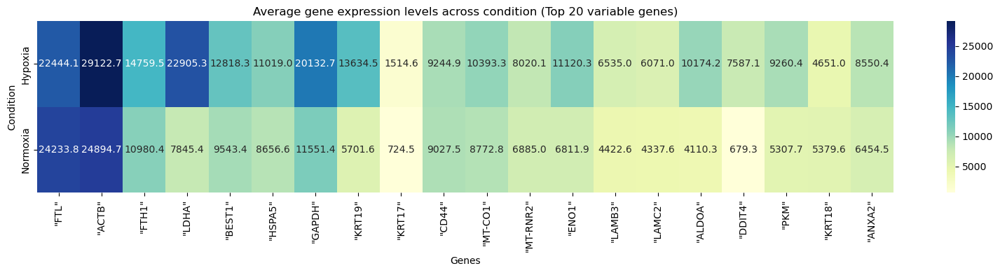

In [92]:
df_means = df_T.groupby("condition").mean()

top_genes = df_T.drop(columns="condition").var().sort_values(ascending=False).head(20).index

plt.figure(figsize=(16, 4))
sns.heatmap(df_means[top_genes], cmap="YlGnBu", annot=True, fmt=".1f")
plt.title("Average gene expression levels across condition (Top 20 variable genes)")
plt.xlabel("Genes")
plt.ylabel("Condition")
plt.tight_layout()
plt.show()


Some genes, such as ACTB, FTH1, and LDHA, are more highly expressed in hypoxia, while others show similar levels across both conditions. This suggests that hypoxia influences the expression of certain genes, which may reflect cellular adaptation to low oxygen.

### Outliers

In single-cell RNA-seq data, some cells display unusually high or low values. These outliers may result from technical artifacts, but they can also reflect true biological heterogeneity. Identifying and examining outliers is therefore an important step in exploratory analysis. By characterizing these cells, we can decide whether they should be excluded as technical noise or retained as potentially informative biological subpopulations.

We compute the inter quantile range and use this to define outliers.

In [93]:
Q1= df_unfilt.quantile(0.25)
print (Q1)

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"    0.0
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     0.0
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"       0.0
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"      0.0
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"        0.0
                                                                         ... 
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"    0.0
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"    0.0
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"      0.0
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"     0.0
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"     0.0
Name: 0.25, Length: 243, dtype: float64


In [94]:
Q3 = df_unfilt.quantile (0.75)
print(Q3)

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"     51.0
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     125.0
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"         5.0
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"       40.0
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"         22.0
                                                                          ...  
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"     76.0
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"     24.0
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"       68.0
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"      22.0
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"      44.0
Name: 0.75, Length: 243, dtype: float64


In [95]:
IQR = Q3 - Q1
print(IQR)

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"     51.0
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     125.0
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"         5.0
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"       40.0
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"         22.0
                                                                          ...  
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"     76.0
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"     24.0
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"       68.0
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"      22.0
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"      44.0
Length: 243, dtype: float64


Let's try eliminate outliers using quantile range. We also create a new dataset in order to make everything cleaner.

In [96]:
df_noOut = df_unfilt[~((df_unfilt < (Q1 - 1.5 * IQR)) | (df_unfilt > (Q3 + 1.5 * IQR))).any(axis=1)]
df_noOut.shape

(10815, 243)

We reduced our dataset from 23396 to 10815 cells. More than half cells have been removed. 

In [97]:
df_noOut.head()

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""WASH7P""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""CICP27""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""DDX11L17""",0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""WASH9P""",0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
"""OR4F29""",2,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Now we make the same plots as before to see how they have changed by removing outliers.

<Axes: xlabel='"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"'>

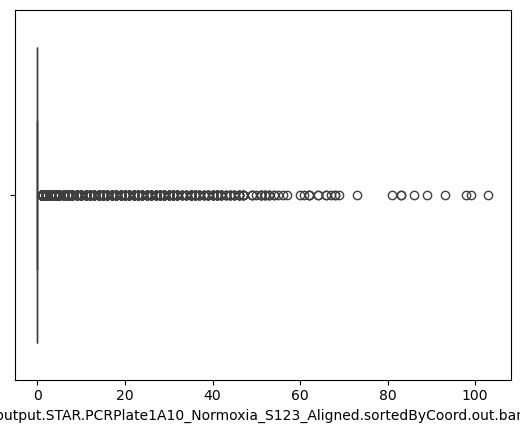

In [98]:
sns.boxplot(x=df_noOut[cnames[0]])

<Axes: xlabel='"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"'>

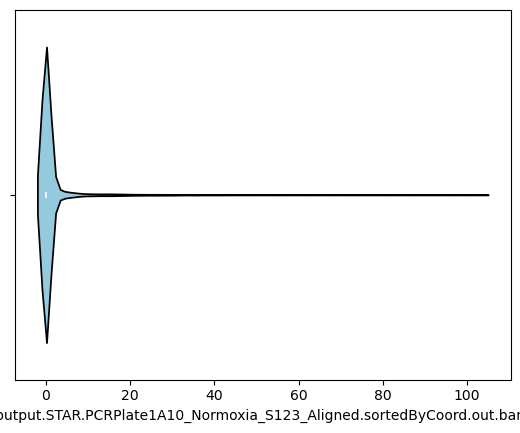

In [99]:
sns.violinplot(x=df_noOut[cnames[0]],  color='skyblue', edgecolor='black')

Compared to the previous plots, the extreme high-count values have disappeared, resulting in a more compact distribution centered around the majority of genes.  The removal of outliers reduces the distortion caused by technical artifacts and improves the interpretability of the data, while still preserving the overall shape of the gene expression distribution.

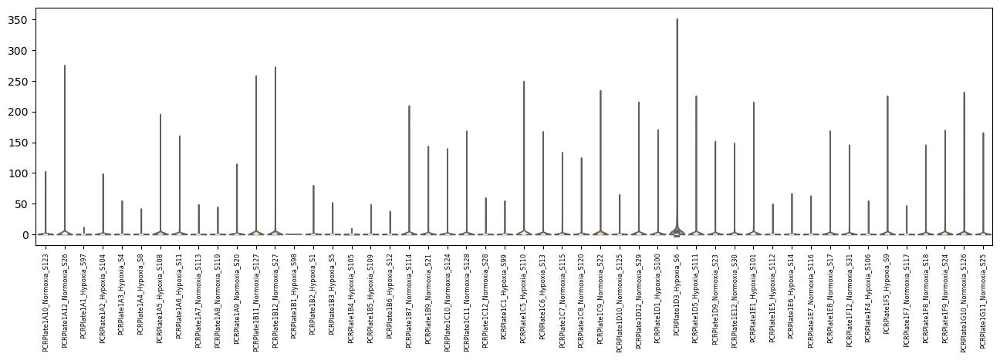

In [100]:
df_noOut_small = df_noOut.iloc[:, :50]
df_noOut_small.columns = [
    re.search(r'PCRPlate.*?_S\d+', col).group(0) if re.search(r'PCRPlate.*?_S\d+', col) else col
    for col in df_noOut_small.columns
]
plt.figure(figsize=(16, 4))
plot = sns.violinplot(data=df_noOut_small, palette="Set3", cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.xticks(rotation=90, fontsize=6)
plt.show()

After removing the outliers, the violin plots show much more compact distributions, making the overall data easier to interpret. This step reduces the influence of extreme values, which are often technical artifacts, and improves the comparability between samples. However, single-cell RNA-seq data are inherently sparse, with many genes expressed at very low levels. In this context, aggressive outlier removal may risk discarding rare but biologically relevant signals. Therefore, while the removal of extreme values appears to improve data quality, it is important to balance noise reduction with the possibility of losing informative variation. 
Thus, for now we cannot use this reduced dataset to continue our analysis since it does not tell the whole story.

### Summary statistics of data distribution

Let's inspect summary statistics of the data distribution. In particular, we focus on skewness, which measures the asymmetry of the distribution, and kurtosis, which reflects the heaviness of the tails compared to a normal distribution. These metrics provide a compact way to quantify deviations from normality, helping us to better understand the sparsity and variability that characterize single-cell gene expression data.

Text(0.5, 0, 'Skewness of single cells expression profiles - original df')

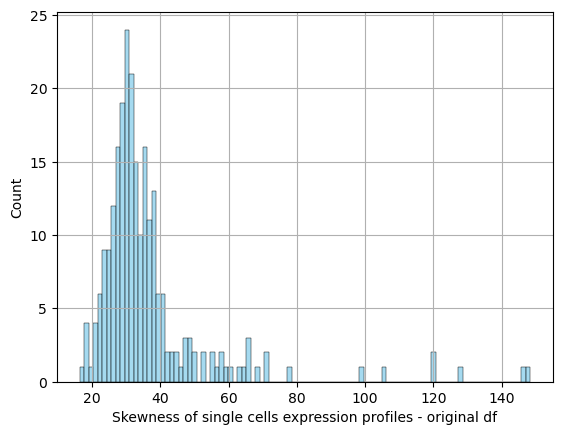

In [101]:
colmns = np.shape(df_unfilt)[1] 
df_skew_cells = []
for i in range(colmns) :     
     v_df = df_unfilt[cnames[i]]
     df_skew_cells += [skew(v_df)]  
      
sns.histplot(df_skew_cells,bins=100,  color='skyblue', edgecolor='black')
plt.grid(True)
plt.xlabel('Skewness of single cells expression profiles - original df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - original df')

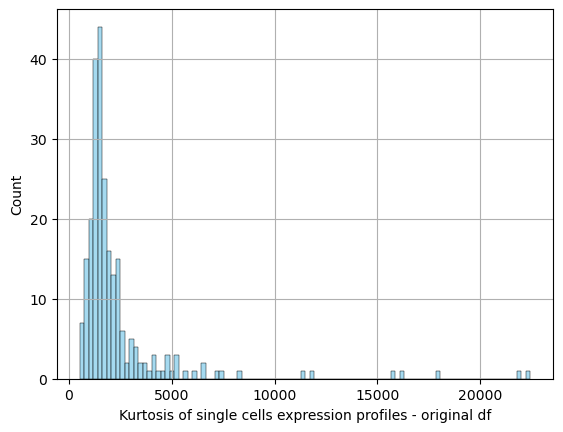

In [102]:
df_kurt_cells = []
for i in range(colmns) :     
     v_df = df_unfilt[cnames[i]]
     df_kurt_cells += [kurtosis(v_df)]  
df_kurt_cells
sns.histplot(df_kurt_cells,bins=100,  color='skyblue', edgecolor='black')
plt.grid(True)
plt.xlabel('Kurtosis of single cells expression profiles - original df')

The skewness values are consistently positive. This indicates that the distributions are strongly right-skewed, reflecting the fact that most genes are expressed at low levels while only a few genes show very high expression. Such asymmetry is a typical feature of single-cell RNA-seq data.

The kurtosis values are also very high, with many cells showing extreme values far above those expected for a normal distribution. This reflects the heavy-tailed nature of the data, where rare but strongly expressed genes contribute disproportionately to the overall distribution. 

Together, the skewness and kurtosis analyses confirm that the gene expression profiles deviate strongly from normality, consistent with the sparsity and heterogeneity of our data.

As a reference, we compute skewness and kurtosis for a normally distributed dataset.

In [103]:
xnorm = np.random.normal(0, 2, 10000000)   
print("Excess kurtosis of normal distribution: ",  kurtosis(xnorm))
print("Skewness of normal distribution: ", skew(xnorm))

Excess kurtosis of normal distribution:  0.0013243127339088723
Skewness of normal distribution:  -0.0003812230407203586


Compared to a normal distribution, which has skewness and excess kurtosis values close to zero, the single-cell gene expression profiles show extremely high positive skewness and kurtosis. This confirms that the data are far from normal, with most genes expressed at low levels and a few genes contributing disproportionately to the distribution. Such deviations underline the importance of applying normalization and transformation techniques before downstream analyses.

For completeness we also computed skewness and kurtosis for each gene across the entire cell population.

Text(0.5, 0, 'Skewness of single genes expression profiles - original df')

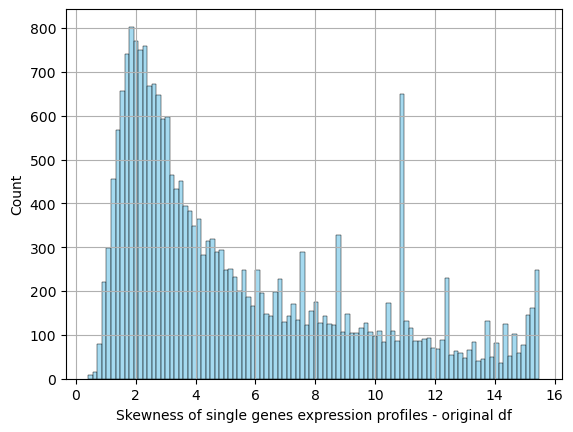

In [104]:
rows = np.shape(df_unfilt)[0] 
df_transp = df_unfilt.T  
cnames2 = list(df_transp.columns) 
df_skew_genes = []
for i in range(rows) :     
     v_df = df_transp[cnames2[i]]
     df_skew_genes += [skew(v_df)]   
sns.histplot(df_skew_genes,bins=100,  color='skyblue', edgecolor='black')
plt.grid(True)
plt.xlabel('Skewness of single genes expression profiles - original df')

Text(0.5, 0, 'Kurtosis of single genes expression profiles - original df')

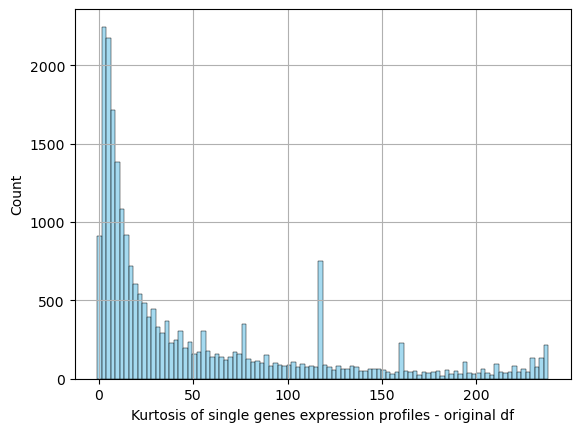

In [105]:
df_kurt_genes = []
for i in range(rows) :     
     v_df = df_transp[cnames2[i]]
     df_kurt_genes += [kurtosis(v_df)]  
sns.histplot(df_kurt_genes,bins=100,  color='skyblue', edgecolor='black')
plt.grid(True)
plt.xlabel('Kurtosis of single genes expression profiles - original df')

The results again deviate strongly from normality. Most genes show positive skewness, indicating that expression is typically low in the majority of cells and high only in a small subset. Kurtosis values are also elevated, reflecting the presence of heavy tails and outliers in gene expression distributions. These findings confirm the sparse nature of single-cell RNA-seq data. This reinforces the importance of normalization or other transformations.

### Data transformation

In order to address the strong skewness and heavy-tailed distributions observed in the raw data, we applied a log transformation to the gene expression profiles. The log transformation compresses the dynamic range of expression values, reducing the influence of extreme counts while preserving relative differences between genes. As a result, the distribution of expression levels becomes more balanced and more comparable across cells and genes.

We repeat all previous exploratory analyses using a log-transformed version of the dataset.

<Axes: xlabel='"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"'>

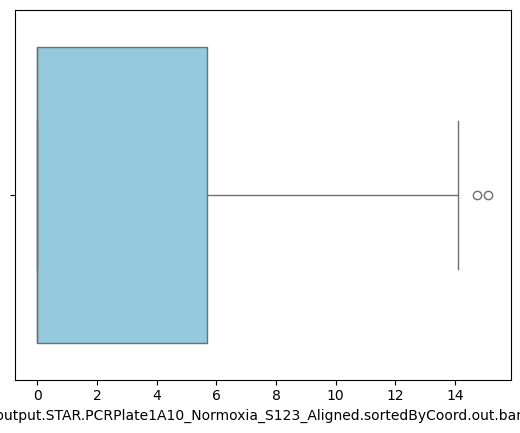

In [106]:
df_log2 = np.log2(df_unfilt[cnames[0]]+1)
sns.boxplot(x=df_log2, color="skyblue")

<Axes: xlabel='"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"'>

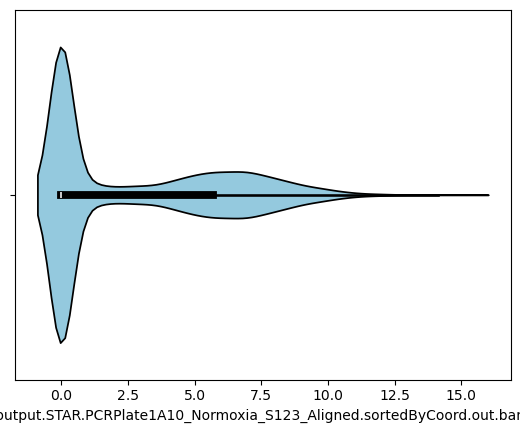

In [107]:
sns.violinplot(x=df_log2,  color='skyblue', edgecolor='black')

Compared to the raw data, the extreme outliers are now largely compressed, and the overall spread of the distribution is reduced. The distribution appears more symmetric and easier to interpret, highlighting the typical pattern of many genes expressed at low levels and fewer genes at higher levels. This transformation provides a more balanced representation of the data.

We can check the summary statistics again, and plot the trasformed gene expression profile of each cell.

In [108]:
df_log2.describe().round(2)

count    23396.00
mean         2.67
std          3.34
min          0.00
25%          0.00
50%          0.00
75%          5.70
max         15.11
Name: "output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam", dtype: float64

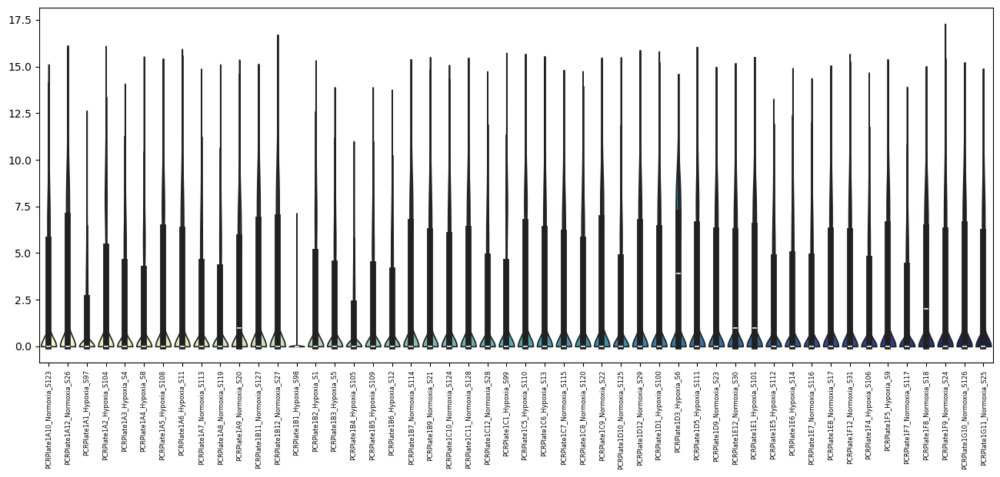

In [109]:
df1 = df_unfilt + 1
df1_log2 = df1.apply(np.log2)
df1_log2_small = df1_log2.iloc[:, :50]
df1_log2_small.columns = [
    re.search(r'PCRPlate.*?_S\d+', col).group(0) if re.search(r'PCRPlate.*?_S\d+', col) else col
    for col in df1_log2_small.columns
]

plt.figure(figsize=(16,6))
plot=sns.violinplot(data=df1_log2_small,palette="YlGnBu",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.xticks(rotation=90, fontsize=6)
plt.show()

While variability between cells is still present, the overall shape of the violins is more balanced, indicating that the transformation has reduced skewness and made the data more suitable for comparative analysis.

Now let's see also the violinplot for the genes.

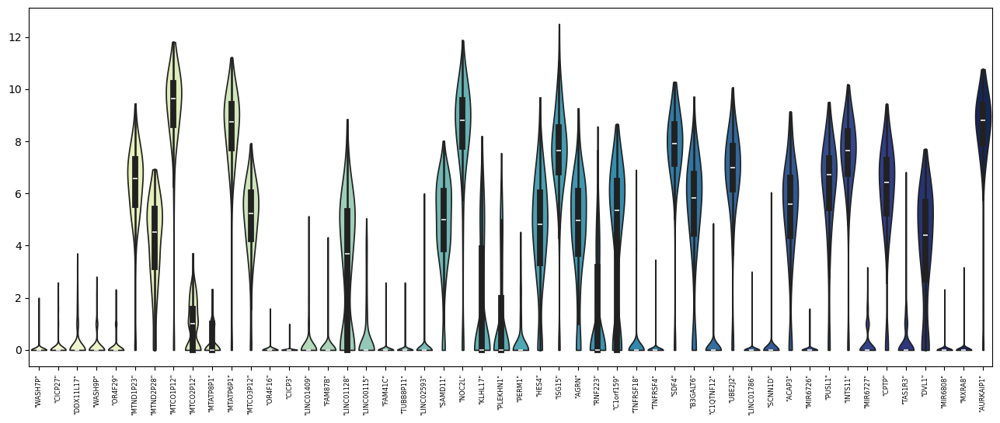

In [110]:
df2 = df_unfilt.T + 1
df2_log2 = df2.apply(np.log2)
df2_log2_small = df2_log2.iloc[:, :50]

plt.figure(figsize=(16,6))
plot=sns.violinplot(data=df2_log2_small,palette="YlGnBu",cut=0);
plt.setp(plot.get_xticklabels(), rotation=90)
plt.xticks(rotation=90, fontsize=6)
plt.show()

Compared to the raw scale, the log transformation compresses the extreme values and reveals a clearer structure in the distributions. Some genes such as MT-CO1, ISG15 exhibit broader distributions, indicating strong variability across cells, whereas others remain consistently low across the dataset. Overall, the log transformation improves the interpretability of gene-level distributions.

Let's look also at the changing in skeweness and kurtosis both for cells and genes now that we applied log-transformation.

Text(0.5, 0, 'Skewness of single cells expression profiles - log2 df')

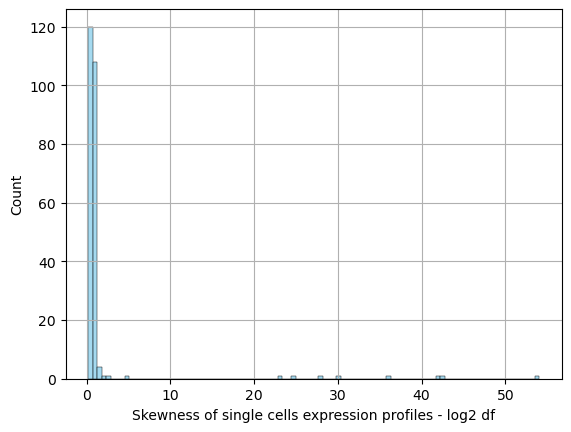

In [111]:
df1_log2_skew_cells = []
for i in range(colmns) :     
     v_df = df1_log2[cnames[i]]
     df1_log2_skew_cells += [skew(v_df)]   
df1_log2_skew_cells
sns.histplot(df1_log2_skew_cells,bins=100,  color='skyblue', edgecolor='black')
plt.grid(True)
plt.xlabel('Skewness of single cells expression profiles - log2 df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - log2 df')

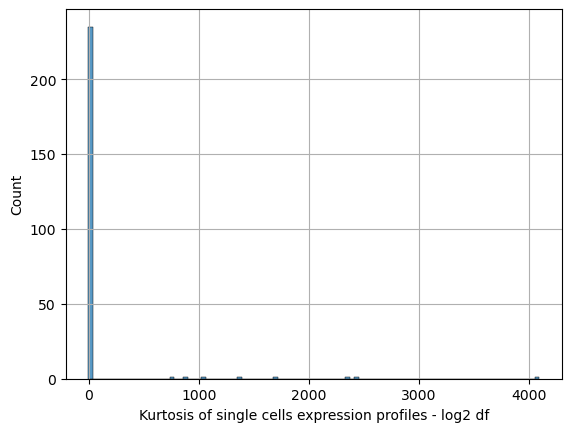

In [112]:
df1_log2_kurt_cells = []
for i in range(colmns) :     
     v_df = df1_log2[cnames[i]]
     df1_log2_kurt_cells += [kurtosis(v_df)] 
df1_log2_kurt_cells
sns.histplot(df1_log2_kurt_cells,bins=100)
plt.grid(True)
plt.xlabel('Kurtosis of single cells expression profiles - log2 df')

Text(0.5, 0, 'Skewness of single genes expression profiles - log2 df')

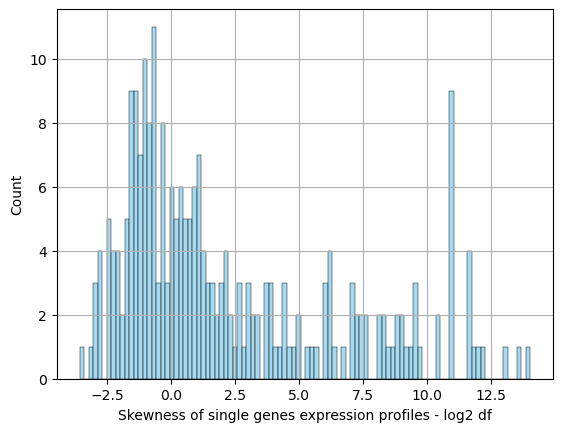

In [113]:
df_transp_log2 = df1_log2.T
cnames2 = list(df_transp.columns) 
df_transp_log2_skew_cells = []
for i in range(colmns) :     
     v_df = df_transp_log2[cnames2[i]]
     df_transp_log2_skew_cells += [skew(v_df)]   
df1_log2_skew_cells
sns.histplot(df_transp_log2_skew_cells,bins=100,  color='skyblue', edgecolor='black')
plt.grid(True)
plt.xlabel('Skewness of single genes expression profiles - log2 df')

Text(0.5, 0, 'Kurtosis of single genes expression profiles - log2 df')

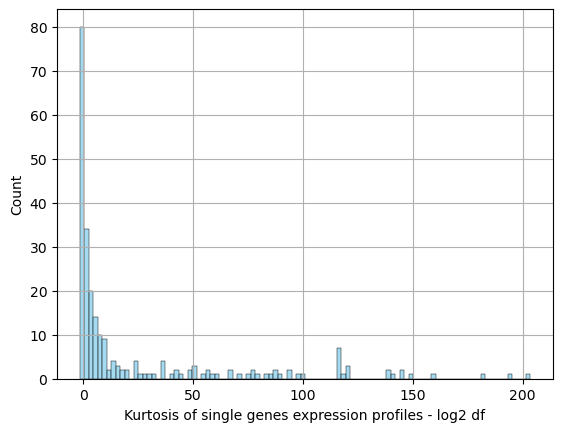

In [114]:
df_transp_log2_kurt_cells = []
for i in range(colmns) :     
     v_df = df_transp_log2[cnames2[i]]
     df_transp_log2_kurt_cells += [kurtosis(v_df)]   
df1_log2_kurt_cells
sns.histplot(df_transp_log2_kurt_cells,bins=100,  color='skyblue', edgecolor='black')
plt.grid(True)
plt.xlabel('Kurtosis of single genes expression profiles - log2 df')

The analysis of skewness and kurtosis after log-transformation reveals an improvement in the overall distribution of the data. 

At the cell level, skewness values are now concentrated near zero, indicating much more symmetric distributions compared to the strongly right-skewed raw profiles. Similarly, kurtosis values are dramatically reduced, although a few extreme outliers remain, reflecting that heavy tails are less dominant but still present in some cells.

At the gene level, the same trend is observed. Many genes now show skewness close to zero or slightly positive, suggesting that their expression is more evenly distributed across cells. The kurtosis values are also considerably lower, which indicates that extreme deviations have been mitigated and the distributions are less heavy-tailed.

Overall, these results confirm that the log-transformation successfully reduces asymmetry and variance inflation. While the data remain non-normal, the transformation provides a more balanced and interpretable representation.

To further explore patterns of variability after log-transformation, we generated a heatmap of the top 20 most variable genes across the first 50 cells.

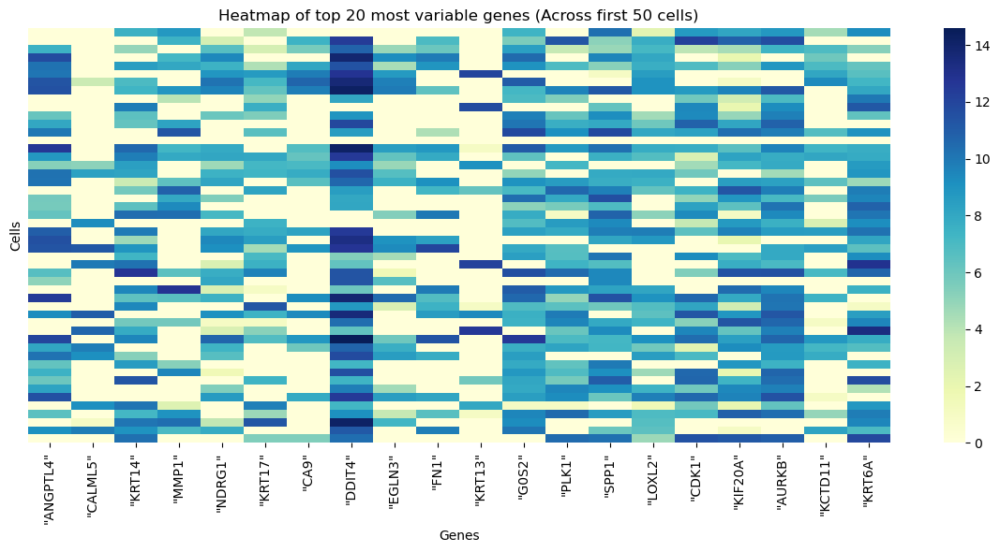

In [115]:
gene_variance = df1_log2.T.var(axis=0)
labels = df1_log2.columns.to_series().str.extract(r'_(Normoxia|Hypoxia)_', expand=False)
df_T = df1_log2.T
df_T["condition"] = labels.values


top_genes = gene_variance.sort_values(ascending=False).head(20).index
labels = df_T["condition"]

subset_cells = df_T[:50]  

data_subset = subset_cells[top_genes]

plt.figure(figsize=(12, 6))
sns.heatmap(data_subset, cmap="YlGnBu", yticklabels=False)
plt.title("Heatmap of top 20 most variable genes (Across first 50 cells)")
plt.xlabel("Genes")
plt.ylabel("Cells")
plt.tight_layout()
plt.show()

Compared to the non-transformed version, the expression values are now compressed, which reduces the dominance of extreme counts and makes more subtle differences between cells visible. This allows clearer visualization of patterns of variability. The log-transformed heatmap therefore provides a more balanced view of cell-to-cell heterogeneity, highlighting both strongly variable and moderately variable genes that may have been masked in the raw data.

We next compared the average expression of the top 20 most variable genes between normoxia and hypoxia. This representation highlights condition-specific differences.

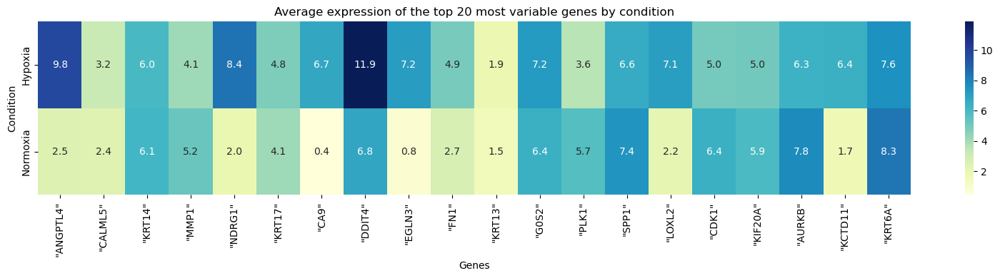

In [116]:
df_means = df_T.groupby("condition").mean()
top_genes = df_T.drop(columns="condition").var().sort_values(ascending=False).head(20).index

plt.figure(figsize=(16, 4))
sns.heatmap(df_means[top_genes], cmap="YlGnBu", annot=True, fmt=".1f")
plt.title("Average expression of the top 20 most variable genes by condition")
plt.xlabel("Genes")
plt.ylabel("Condition")
plt.tight_layout()
plt.show()

The use of the log-scale is important here, as it reduces the dominance of extremely high values and allows more subtle differences between conditions to emerge. For example, genes such as ANGPTL4, CA9, and DDIT4 still show higher average expression in hypoxia, but the log-transformation compresses their range, making these contrasts easier to compare across the full gene set. At the same time, moderately expressed genes are no longer overshadowed by a few extreme signals, which provides a more balanced overview of condition-dependent changes.

Our analysis confirm that the log-transformation effectively mitigates the effects of sparsity, outliers, and extreme values.
We showed that this transformation has a positive impact on our dataset, thus from now on we will use it as our dataset.

In [117]:
df = df1_log2
df.head()

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""WASH7P""",0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""CICP27""",0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""DDX11L17""",0.000000,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""WASH9P""",0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
"""OR4F29""",1.584963,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Normalization

Before applying normalization, it is important to inspect the distribution of gene expression values across all cells and samples. The density plot below shows the variability of distributions for each sample.

Large discrepancies in scale and shape between samples indicate technical differences.
Normalization aims to correct for these technical effects and make the distributions more comparable across samples.

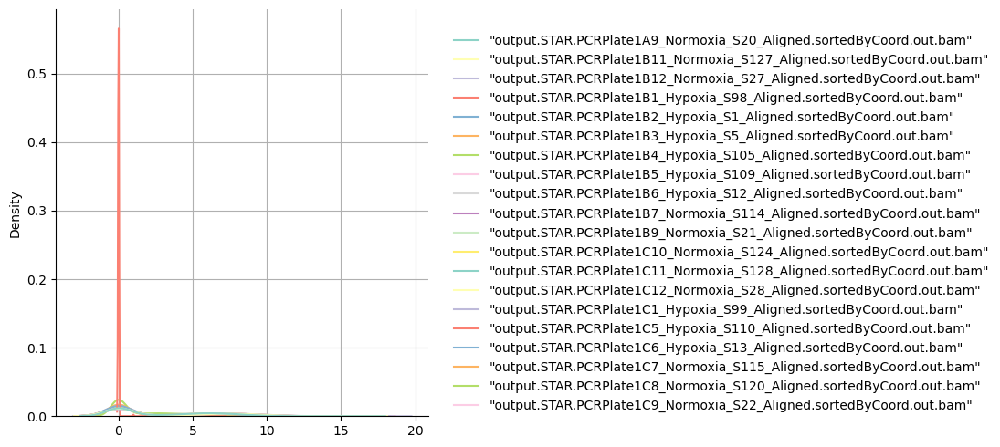

In [118]:
df_small = df.iloc[:, 10:30]  
sns.displot(data=df_small,palette="Set3",kind="kde", bw_adjust=2)
plt.grid(True)

The density plot highlights the strong differences in expression distributions across samples. While some samples show sharp peaks concentrated near zero, others display heavier tails, reflecting uneven sequencing depth and library size. These inconsistencies confirm the presence of technical variability, which could bias downstream analyses if left uncorrected. Normalization is therefore a critical step.

Before proceeding with the normalization, we try to do th same plot with the filtered dataset and the filtered and normalized one to see how it changes.

In [119]:
df_filtered = pd.read_csv("HCC1806_SmartS_Filtered_Data.txt" ,  sep=r"\s+", engine="python", index_col=0)
df_filtered.head()

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""CICP27""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""DDX11L17""",0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
"""WASH9P""",0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,1,0,0
"""OR4F29""",2,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""MTND1P23""",250,424,63,27,81,305,82,46,177,114,...,205,113,47,27,35,146,37,83,47,249


In [120]:
df_filtered.shape

(19503, 227)

In [121]:
df_normalized = pd.read_csv("HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt",  sep=r"\s+", engine="python", index_col=0)
df_normalized.head()

,"""output.STAR.PCRPlate1G12_Normoxia_S32_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1G1_Hypoxia_S102_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1G2_Hypoxia_S2_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1G3_Hypoxia_S7_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1G4_Hypoxia_S107_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1G7_Normoxia_S118_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1G8_Normoxia_S19_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1G9_Normoxia_S121_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1H1_Hypoxia_S103_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1H2_Hypoxia_S3_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""DDIT4""",0,8739,13098,2880,7777,208,750,127,10313,13523,...,341,5545,5757,8337,2579,79,167,10186,238,60
"""ANGPTL4""",48,2101,14032,356,5661,0,0,0,850,10110,...,10,2085,698,2383,65,5,1,3147,41,0
"""CALML5""",0,55,0,0,4383,1902,0,0,0,0,...,0,1587,0,0,0,0,0,0,2867,0
"""KRT14""",321,96,0,6211,0,0,5050,462,2127,0,...,0,0,3077,529,156,2098,27,149,814,7
"""CCNB1""",298,1824,1616,3,145,378,66,58,605,1444,...,204,26,50,588,411,554,3585,1012,2207,477


In [122]:
df_normalized.shape

(3000, 182)

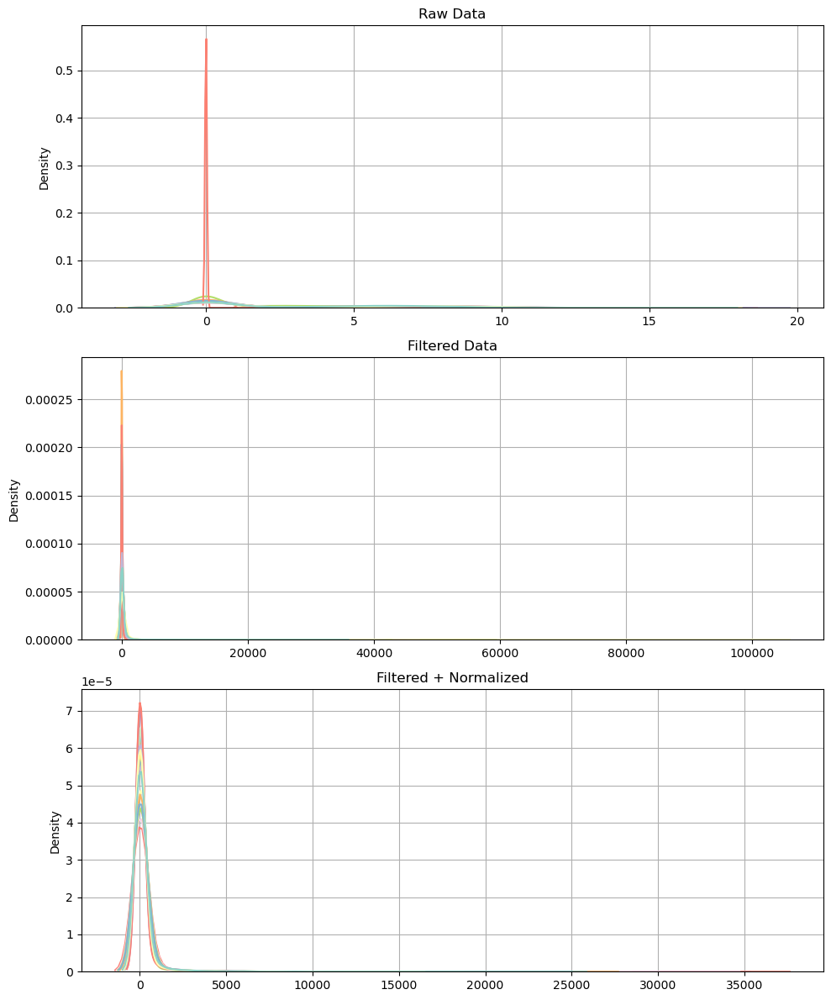

In [123]:
fig, axes = plt.subplots(3, 1, figsize=(10, 12))

sns.kdeplot(data=df.iloc[:, 10:30], ax=axes[0], bw_adjust=2, palette="Set3")
axes[0].set_title("Raw Data")
axes[0].grid(True)
axes[0].legend([], [], frameon=False)

sns.kdeplot(data=df_filtered.iloc[:, 10:30], ax=axes[1], bw_adjust=2, palette="Set3")
axes[1].set_title("Filtered Data")
axes[1].grid(True)
axes[1].legend([], [], frameon=False)

sns.kdeplot(data=df_normalized.iloc[:, 10:30], ax=axes[2], bw_adjust=2, palette="Set3")
axes[2].set_title("Filtered + Normalized")
axes[2].grid(True)
axes[2].legend([], [], frameon=False)

plt.tight_layout()
plt.show()


The density plots illustrate the effect of filtering and normalization on the gene expression data. 

- In the raw data, the distributions are highly heterogeneous across samples, with sharp peaks around zero and long tails, reflecting strong technical variability. 
- After filtering, low-quality cells and genes are removed, which reduces noise but does not fully align the distributions, as the curves still differ in scale and spread.
- After normalization, the distributions become more comparable across samples, with overlapping density curves that indicate improved consistency.

This confirms that normalization successfully reduces technical bias, making the datasets more directly comparable and better suited for downstream analyses.

We proceed with normalization using z-score.

In [124]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_zscore = pd.DataFrame(
    scaler.fit_transform(df.T).T,  
    index=df.index,
    columns=df.columns
)
df_zscore.head()

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""WASH7P""",-0.151532,-0.151532,-0.151532,-0.151532,-0.151532,-0.151532,-0.151532,-0.151532,-0.151532,-0.151532,...,-0.151532,-0.151532,-0.151532,-0.151532,-0.151532,-0.151532,-0.151532,-0.151532,-0.151532,-0.151532
"""CICP27""",-0.223413,-0.223413,-0.223413,-0.223413,-0.223413,-0.223413,-0.223413,-0.223413,-0.223413,-0.223413,...,-0.223413,-0.223413,-0.223413,-0.223413,-0.223413,-0.223413,-0.223413,-0.223413,-0.223413,-0.223413
"""DDX11L17""",-0.413165,-0.413165,-0.413165,-0.413165,-0.413165,1.013781,-0.413165,-0.413165,-0.413165,-0.413165,...,-0.413165,-0.413165,-0.413165,-0.413165,-0.413165,-0.413165,-0.413165,-0.413165,-0.413165,-0.413165
"""WASH9P""",-0.368914,-0.368914,-0.368914,-0.368914,-0.368914,-0.368914,-0.368914,-0.368914,1.554887,-0.368914,...,-0.368914,-0.368914,-0.368914,-0.368914,-0.368914,1.554887,-0.368914,1.554887,-0.368914,-0.368914
"""OR4F29""",4.099629,-0.317225,-0.317225,-0.317225,-0.317225,-0.317225,2.469499,-0.317225,-0.317225,-0.317225,...,-0.317225,-0.317225,-0.317225,-0.317225,-0.317225,-0.317225,-0.317225,-0.317225,-0.317225,-0.317225


In [125]:
df_zscore.describe()

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
count,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,...,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000
mean,0.111540,0.396831,-0.569320,-0.087903,-0.206650,-0.305133,0.110070,0.181441,-0.239399,-0.278557,...,0.164546,0.145092,-0.132891,-0.257670,-0.244457,0.308542,-0.132161,0.161097,-0.184511,0.139423
std,0.910670,1.117734,0.685524,1.180415,0.726379,1.014724,1.157063,0.922385,0.707388,0.877977,...,0.901128,0.900549,0.800244,0.593182,0.622930,0.919942,0.750712,0.964487,0.647215,0.816940
min,-3.250682,-3.281348,-3.742862,-4.265679,-3.232592,-4.087807,-3.909531,-3.339094,-3.461271,-3.764136,...,-2.934141,-3.150189,-3.404232,-3.694797,-3.537653,-2.688268,-3.168934,-3.291283,-2.870370,-2.664073
25%,-0.315003,-0.260779,-0.929390,-0.587337,-0.512613,-0.692344,-0.410198,-0.295090,-0.523023,-0.612739,...,-0.259881,-0.297364,-0.441396,-0.524018,-0.512025,-0.209473,-0.448786,-0.296169,-0.438310,-0.250730
50%,-0.108906,-0.090488,-0.396231,-0.172224,-0.203702,-0.243066,-0.126768,-0.101810,-0.208724,-0.218756,...,-0.091098,-0.100714,-0.164072,-0.227709,-0.224526,-0.060757,-0.178150,-0.099742,-0.187959,-0.091098
75%,0.561971,1.093099,-0.144943,0.434765,-0.084594,-0.091098,0.723088,0.695007,-0.088566,-0.088714,...,0.532095,0.604768,0.055051,-0.091098,-0.091098,0.735887,-0.019793,0.618269,-0.080175,0.481003
max,14.459176,14.505537,10.977249,14.996740,15.207154,15.109847,15.016517,12.294495,13.429039,14.894519,...,15.069538,13.875219,13.908282,13.146814,14.894519,14.651985,14.470635,14.505537,14.069530,14.911235


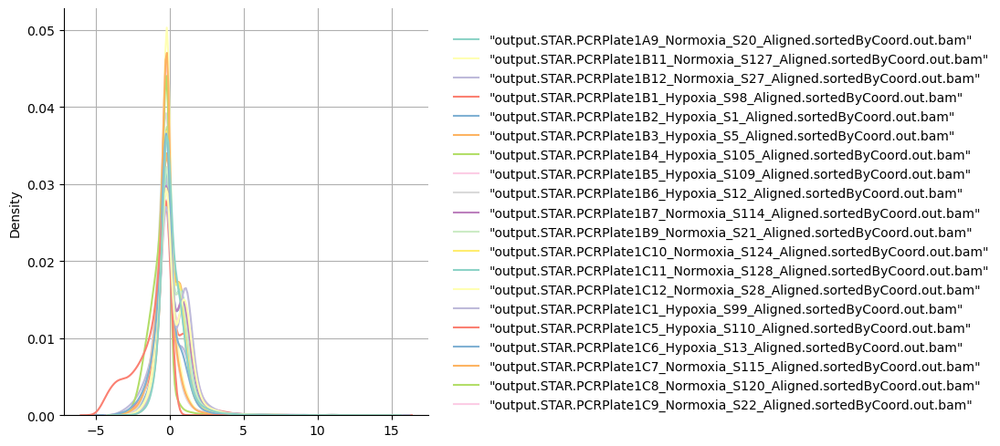

In [126]:
df_small = df_zscore.iloc[:, 10:30]  
sns.displot(data=df_small, palette="Set3", kind="kde", bw_adjust=2)
plt.grid(True)

Unlike the unnormalized distributions, which were highly variable in scale and shape, the normalized data are now centered around zero with similar spread across all samples. This alignment indicates that z-score normalization effectively removes differences in mean and variance, making the datasets directly comparable. The overlapping density curves confirm that technical variability between samples has been largely reduced.

Compared to the previous Filtered + Normalized data, the z-score normalization achieves an even stronger standardization: while the earlier normalization aligned the distributions by scaling counts to a comparable range, the z-score explicitly centers each distribution at zero and fixes the variance, producing nearly identical shapes across all samples. This makes z-score normalization particularly useful when the goal is to emphasize relative differences between genes or cells.

### Duplicate rows

As a final quality check, we verified the presence of duplicate rows in the dataset.

In [127]:
duplicate_rows_df = df[df.duplicated(keep=False)]
print("Number of duplicate rows: ", duplicate_rows_df.shape)
print("Duplicate rows: ", duplicate_rows_df)

Number of duplicate rows:  (89, 243)
Duplicate rows:               "output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"  \
"MMP23A"                                                   0.0                        
"LINC01647"                                                0.0                        
"LINC01361"                                                0.0                        
"ITGA10"                                                   0.0                        
"RORC"                                                     0.0                        
...                                                        ...                        
"ENPP7"                                                    0.0                        
"DTNA"                                                     0.0                        
"ALPK2"                                                    0.0                        
"OR7G2"                                                    0.0              

In [128]:
print("Names of duplicate rows: ",duplicate_rows_df.index)

Names of duplicate rows:  Index(['"MMP23A"', '"LINC01647"', '"LINC01361"', '"ITGA10"', '"RORC"',
       '"GPA33"', '"OR2M4"', '"LINC01247"', '"SNORD92"', '"LINC01106"',
       '"ZBTB45P2"', '"AOX3P"', '"CPS1"', '"RPS3AP53"', '"CCR4"', '"RNY1P12"',
       '"C4orf50"', '"C4orf45"', '"PCDHA2"', '"PCDHA8"', '"PCDHGA2"',
       '"PCDHGA3"', '"PCDHGB3"', '"PCDHGA7"', '"PCDHGA9"', '"PCDHGB7"',
       '"PCDHGA12"', '"PCDHGB9P"', '"PCDHGC4"', '"SMIM23"', '"PANDAR"',
       '"LAP3P2"', '"RBBP4P3"', '"RPL21P66"', '"VNN3"', '"TRPV6"', '"CNPY1"',
       '"ASS1P4"', '"SLC7A3"', '"MIR374B"', '"MIR374C"', '"NAB1P1"',
       '"RPL10AP3"', '"MIR548AA1"', '"MIR548D1"', '"SCARNA8"', '"MIR3074"',
       '"MIR24-1"', '"SUGT1P4-STRA6LP"', '"STRA6LP"', '"KCNA4"', '"FBLIM1P2"',
       '"APLNR"', '"CYCSP26"', '"OPCML"', '"B3GAT1-DT"', '"RPL21P88"',
       '"LINC02625"', '"RPL22P18"', '"PAX2"', '"SOX5"', '"COL2A1"',
       '"LINC02395"', '"LDHAL6CP"', '"CUX2"', '"LINC00621"', '"NUS1P2"',
       '"UBBP5"', '"OR5A

To identify potential redundancy in gene expression profiles, we computed pairwise correlations between selected genes suspected of being duplicates or redundant.

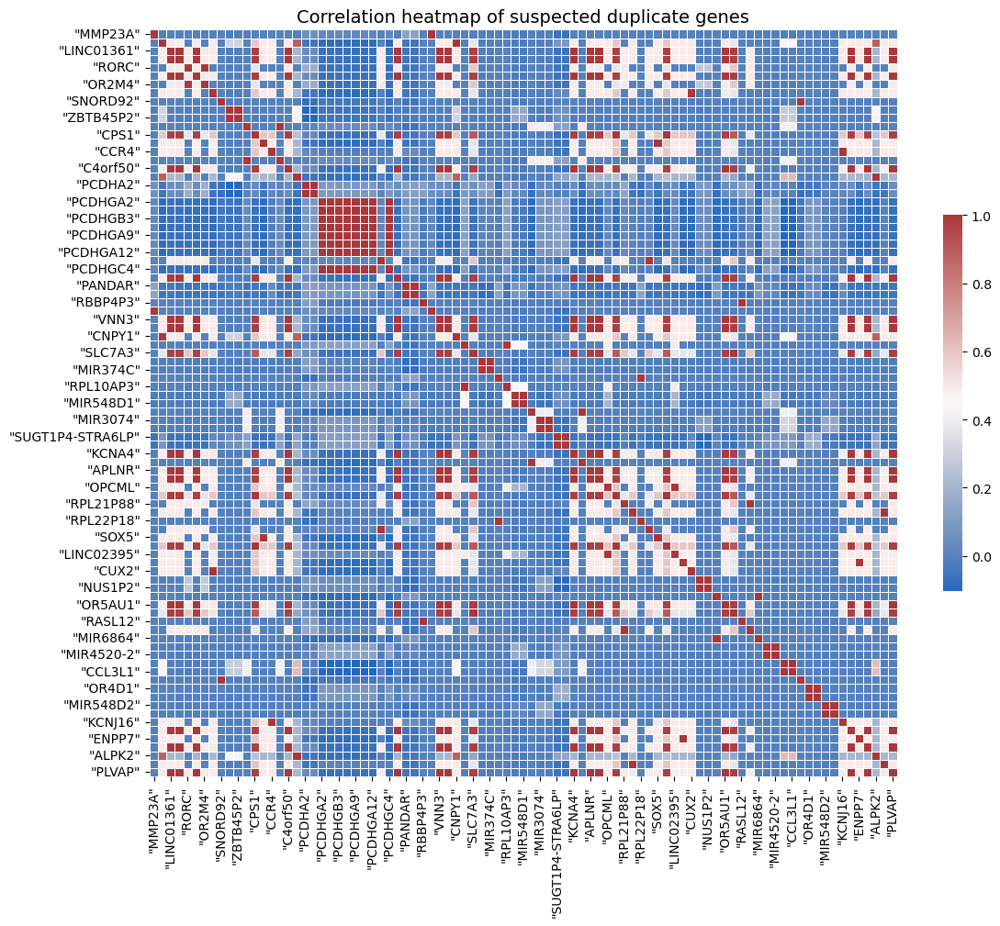

In [129]:
duplicate_rows_df_t = duplicate_rows_df.T
c_dupl = duplicate_rows_df_t.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(c_dupl, cmap='vlag', annot=False, square=True, linewidths=0.5, cbar_kws={"shrink": 0.5})
plt.title("Correlation heatmap of suspected duplicate genes", fontsize=14)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

The correlation matrix revealed several gene pairs with extremely high similarity.

Let's take a look at the statistics of the gene expression profiles of genes that seem duplicate.

In [130]:
duplicate_rows_df_t.describe()

,"""MMP23A""","""LINC01647""","""LINC01361""","""ITGA10""","""RORC""","""GPA33""","""OR2M4""","""LINC01247""","""SNORD92""","""LINC01106""",...,"""MSX2P1""","""MIR548D2""","""MIR548AA2""","""KCNJ16""","""CD300A""","""ENPP7""","""DTNA""","""ALPK2""","""OR7G2""","""PLVAP"""
count,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,...,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000
mean,0.008230,0.008230,0.008230,0.008230,0.008230,0.008230,0.008230,0.008230,0.008230,0.027798,...,0.008230,0.018868,0.018868,0.008230,0.008230,0.008230,0.008230,0.017160,0.008230,0.008230
std,0.090534,0.090534,0.090534,0.090534,0.090534,0.090534,0.090534,0.090534,0.090534,0.227441,...,0.090534,0.175169,0.175169,0.090534,0.090534,0.090534,0.090534,0.212976,0.090534,0.090534
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.584963,...,1.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,3.169925,1.000000,1.000000


The next step is dropping the duplicates. Thus we count the number of cells that we have in our initial dataframe and we see by how much they reduce after this passage.

In [131]:
df.count()

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"    23396
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     23396
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"       23396
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"      23396
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"        23396
                                                                          ...  
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"    23396
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"    23396
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"      23396
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"     23396
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"     23396
Length: 243, dtype: int64

In [132]:
df_noDup = df.drop_duplicates()
df_noDup.count()

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"    23342
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     23342
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"       23342
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"      23342
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"        23342
                                                                          ...  
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"    23342
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"    23342
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"      23342
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"     23342
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"     23342
Length: 243, dtype: int64

As we can see, we went from 23396 to 23342 cells. This means that we dropped 54 duplicates. Since the correlation was very high, as confirmed by the correlation matrix, we can use the new dataframe without missing any relevant information.

In [133]:
df= df_noDup
df.shape

(23342, 243)

Just to conclude our search for duplicates, we check also the columns even though finding duplicate columns is very rare for such dataset.

In [134]:
duplicated_cols_mask = df.T.duplicated(keep=False)
n_duplicates = duplicated_cols_mask.sum()
print(f"Number of duplicated columns: {n_duplicates}")


Number of duplicated columns: 0


No duplicated columns were found, confirming the uniqueness of each single-cell expression profile.

### Data structure

As a final step in our exploratory data analysis, we computed and visualized the correlation matrix between cells and the one between genes. Since the dataset is big and the resulting matrix would not be clear to interpret, we use only a portion of 50 samples of the dataframe.

Number of cells included:  (50, 50)
Average correlation of expression profiles between cells:  0.5185762757376449
Min. correlation of expression profiles between cells:  0.03715255147528984


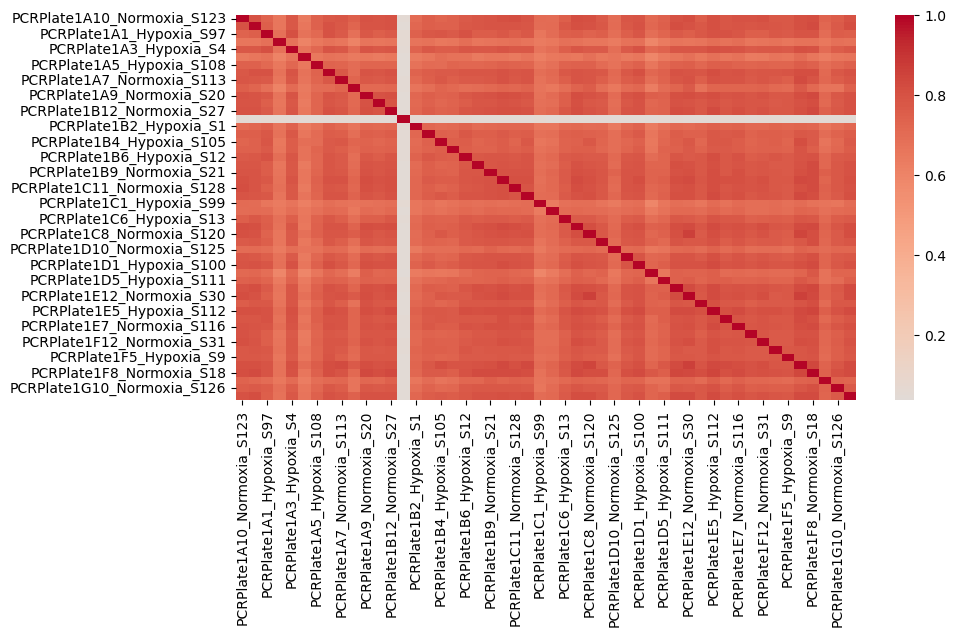

In [135]:
plt.figure(figsize=(10,5))
df_small = df.iloc[:, :50]

df_small_renamed = df_small.copy()
df_small_renamed.columns = [
    re.search(r'PCRPlate.*?_S\d+', col).group(0) if re.search(r'PCRPlate.*?_S\d+', col) else col
    for col in df_small.columns
]

c = df_small_renamed.corr()
midpoint = (c.values.max() - c.values.min()) / 2 + c.values.min()

sns.heatmap(c, cmap='coolwarm', center=0)
print("Number of cells included: ", np.shape(c))
print("Average correlation of expression profiles between cells: ", midpoint)
print("Min. correlation of expression profiles between cells: ", c.values.min())

Number of genes included: (50, 50)
Average correlation of expression profiles between genes: 0.4263
Min. correlation of expression profiles between genes: -0.1474


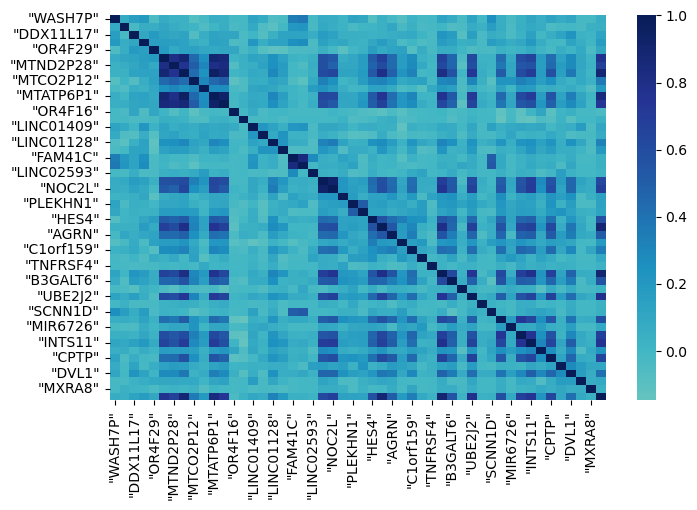

In [136]:
plt.figure(figsize=(8, 5))
df_small = df.iloc[:50, ]
cell_corr = df_small.T.corr()
midpoint = (cell_corr.values.max() - cell_corr.values.min()) / 2 + cell_corr.values.min()

sns.heatmap(cell_corr, cmap='YlGnBu', center=0)

print("Number of genes included:", cell_corr.shape)
print("Average correlation of expression profiles between genes:", round(midpoint, 4))
print("Min. correlation of expression profiles between genes:", round(cell_corr.values.min(), 4))


- The correlation matrix between cells shows that most cells are positively correlated with each other, as expected, but with variable strengths. Some samples display weaker correlations, which may indicate technical noise or biological differences between conditions. The presence of blocks of higher correlation suggests that cells from similar experimental conditions tend to group together, supporting the consistency of the dataset.

- The correlation matrix between genes highlights sets of genes that tend to be co-expressed across cells. Stronger gene–gene correlations may reflect shared biological pathways or regulatory programs, whereas weaker correlations indicate more independent expression.

Overall, the correlation analysis confirms that the dataset captures both structured variability and residual noise.

To complement the correlation heatmaps, we plotted the distributions of pairwise correlation values across genes and across cells.

The histogram of cell–cell correlations provides an overview of how similar the single-cell expression profiles are within the dataset. The gene–gene correlation distribution, on the other hand, highlights how frequently genes co-vary across the cell population.

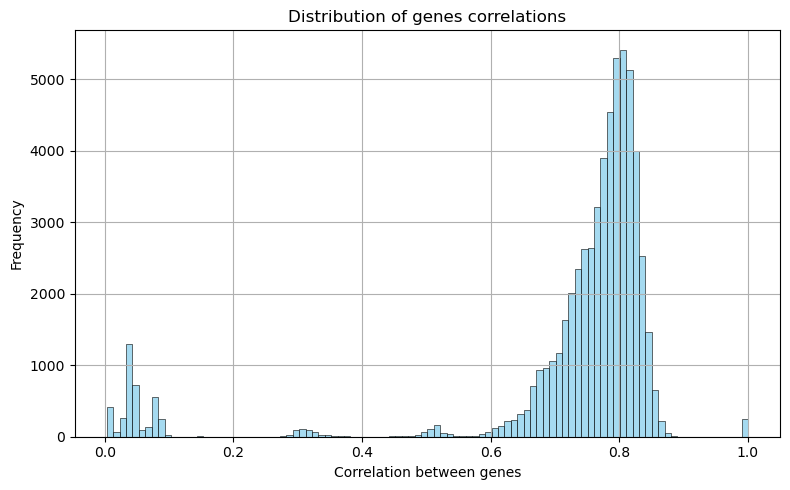

In [137]:
c = df.corr()
corr_vals = c.values.flatten()

plt.figure(figsize=(8,5))
sns.histplot(corr_vals, bins=100, kde=False, legend=False,  color='skyblue', edgecolor='black')

plt.ylabel('Frequency')
plt.xlabel('Correlation between genes')
plt.title('Distribution of genes correlations')
plt.grid(True)
plt.tight_layout()
plt.show()

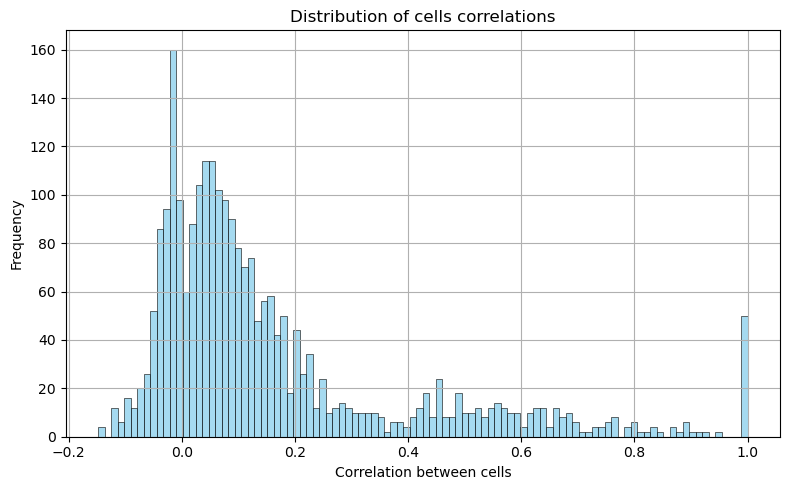

In [138]:
c = df_small.T.corr()
corr_vals = c.values.flatten()

plt.figure(figsize=(8,5))
sns.histplot(corr_vals, bins=100, color='skyblue', edgecolor='black', kde=False, legend=False)

plt.ylabel('Frequency')
plt.xlabel('Correlation between cells')
plt.title('Distribution of cells correlations')
plt.grid(True)
plt.tight_layout()
plt.show()

The distribution of gene–gene correlations is strongly shifted toward positive values. This indicates that many genes are co-expressed across cells. A smaller number of gene pairs show very low or near-zero correlations, reflecting genes that vary independently or are expressed only in specific subsets of cells.

In contrast, the distribution of cell–cell correlations is broader and centered closer to zero. Most cell pairs exhibit weak positive correlations, indicating high heterogeneity among cells.

In summary, in this exploratory data analysis we examined the quality and structure of the single-cell RNA-seq datasets through a series of descriptive and statistical approaches. We first assessed cell and gene counts, distributions of expressed genes, and library sizes, identifying expected sparsity patterns and technical variability. Outlier analysis confirmed the presence of cells and genes with extreme values, which were mitigated through filtering. Skewness and kurtosis analyses highlighted strong deviations from normality, which were effectively reduced by applying a log transformation. Heatmaps of the most variable genes, both at the cell and condition level, revealed patterns of heterogeneity and condition-dependent changes. Finally, correlation analyses at both the cell and gene level confirmed structured co-expression patterns among genes and high variability across cells.

Overall, the EDA shows that the dataset is of sufficient quality and captures meaningful biological signals, but it also underlines the importance of normalization and careful filtering to minimize technical noise. The dataset is now ready for dimensionality reduction, clustering, and downstream modeling.

## Unsupervised Learning

In this second part of the project, we applied several unsupervised learning techniques, including PCA and various clustering algorithms, in order to investigate whether cells under hypoxic and normoxic conditions tend to form distinct clusters.
The analysis is carried out on four datasets, which differ in both the cell line examined (HCC1806 and MCF7) and the single-cell RNA sequencing technology used (Smart-seq and Drop-seq). 
The following methods are employed:
1. Principal Component Analysis (PCA)
2. K-Means 
3. Agglomerative Clustering 
4. T-distributed Stochastic Neighbor Embedding (t-SNE)
5. Gaussian Mixture Model (GMM)
6. Density-Based Spatial Clustering of Applications with Noise (DBSCAN)
7. Spectral Clustering 

The main goal is to assess whether these methods can reveal biologically meaningful separation between hypoxic and normoxic cells, both visually and through clustering metrics such as Adjusted Rand Index (ARI) and silhouette score.

In [139]:
import sklearn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import adjusted_rand_score
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import confusion_matrix
from scipy.cluster.hierarchy import linkage, dendrogram
from IPython.display import display
from scipy.cluster.hierarchy import fcluster
from sklearn.manifold import TSNE
from matplotlib.colors import LogNorm
from sklearn.mixture import GaussianMixture
from sklearn.cluster import DBSCAN
from sklearn.cluster import SpectralClustering



### HCC1806 - SMART SEQ 

In [140]:
df = pd.read_csv("HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt",  sep=r"\s+", engine="python", index_col=0)
print("Dataframe dimensions:", np.shape(df))

Dataframe dimensions: (3000, 182)


We start by applying PCA, a linear dimensionality reduction technique that preserves as much variance as possible, in order to visualize the cells in both two and three dimensions. 

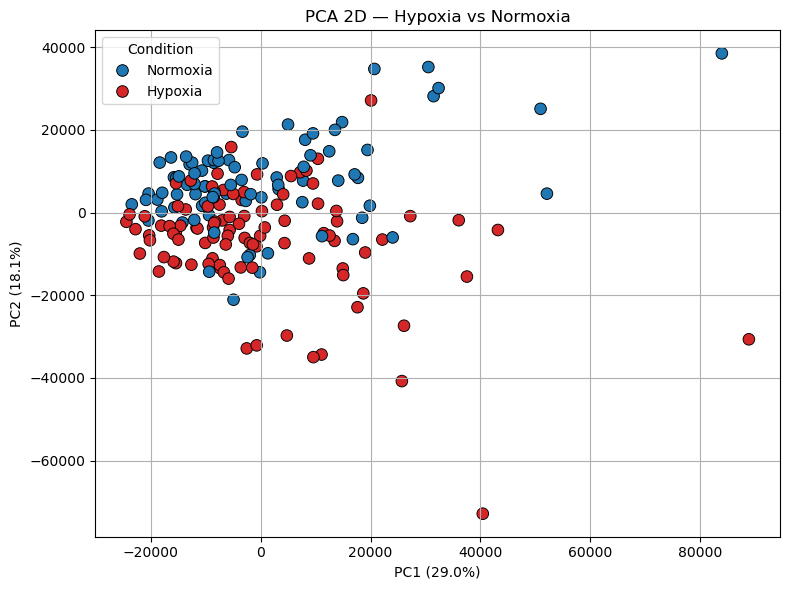

In [141]:
df.index = df.index.str.replace('"', '', regex=False).str.strip()
df.columns = df.columns.str.replace('"', '', regex=False).str.strip()

metadata_df = pd.DataFrame({
    "OriginalName": df.columns
})
metadata_df["Condition"] = metadata_df["OriginalName"].str.extract(r'_(Hypoxia|Normoxia)_')
metadata_df["CellID"] = metadata_df["OriginalName"].str.extract(r'_(S\d+)_')

col_mapping = dict(zip(metadata_df["OriginalName"], metadata_df["CellID"]))
df = df.rename(columns=col_mapping)

df = df.T
df["Condition"] = df.index.map(dict(zip(metadata_df["CellID"], metadata_df["Condition"])))

X = df.drop(columns=["Condition"])

pca = PCA(n_components=2)
pca_result = pca.fit_transform(X)

df["PC1"] = pca_result[:, 0]
df["PC2"] = pca_result[:, 1]

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x="PC1", y="PC2", hue="Condition", palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
                edgecolor="black", s=70)
plt.title("PCA 2D — Hypoxia vs Normoxia")
plt.grid(True)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
plt.tight_layout()
plt.show()


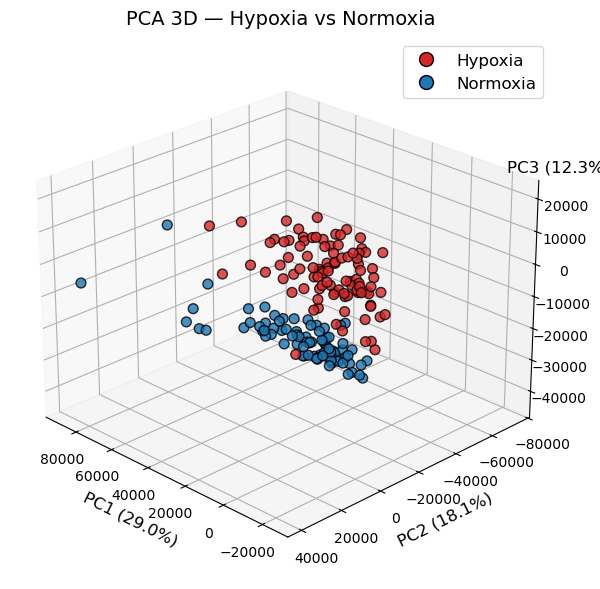

In [142]:
pca_3d = PCA(n_components=3)
pca_result = pca_3d.fit_transform(X)

df["PC1"] = pca_result[:, 0]
df["PC2"] = pca_result[:, 1]
df["PC3"] = pca_result[:, 2]

color_map = {"Hypoxia": "#d62728", "Normoxia": "#1f77b4"}
colors = df["Condition"].map(color_map)

fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(df["PC1"], df["PC2"], df["PC3"], 
                c=colors, edgecolor='black', s=50, alpha=0.8)

ax.set_xlabel(f"PC1 ({pca_3d.explained_variance_ratio_[0]*100:.1f}%)", fontsize=12)
ax.set_ylabel(f"PC2 ({pca_3d.explained_variance_ratio_[1]*100:.1f}%)", fontsize=12)

ax.text(
    x=df["PC1"].min(), 
    y=df["PC2"].min(), 
    z=df["PC3"].max() + 7500, 
    s=f"PC3 ({pca_3d.explained_variance_ratio_[2]*100:.1f}%)",
    fontsize=12,
    color="black"
)

ax.set_title("PCA 3D — Hypoxia vs Normoxia", fontsize=14, pad=10)

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Hypoxia',
           markerfacecolor=color_map["Hypoxia"], markersize=10, markeredgecolor='black'),
    Line2D([0], [0], marker='o', color='w', label='Normoxia',
           markerfacecolor=color_map["Normoxia"], markersize=10, markeredgecolor='black')
]
ax.legend(handles=legend_elements, loc='upper right', fontsize=12)

ax.view_init(elev=25, azim=135)

plt.tight_layout()
plt.show()





In two dimensions there is no clear separation between hypoxic and normoxic cells, however the situation improves significantly in three dimensions, where the contribution of the third principal component becomes more evident. 
This suggests that the analysis in two dimensions could not be sufficient to fully capture the structure of the data.

Let's now proceed with K-Means, a simple iterative clustering algorithm. 
It starts by placing k centroids randomly, then at each step assigns each point to the nearest centroid and update the centroids as the average of assigned points to them. 
This repeats until the algorithm converges, that is until the centroids stop moving.
For our goal, we set k = 2 (hypoxia vs normoxia). 

We base the evaluation of the different clustering algorithms on three main criteria:
1. Contingency table: useful to visually assess how hypoxic and normoxic cells are distributed across the clusters.
2. Silhouette score: this is the mean silhouette coefficient over all instances. It measures for each single point how well it fits within its own cluster compared to the nearest other cluster. Its value ranges from -1 to +1: 
  - close to 1: the point is well inside its own cluster and far from others
  - around 0: the point lies near a cluster boundary
  - close to -1: the point may have been assigned to the wrong cluster
3. Adjusted Rand Index (ARI): quantifies the similarity between the predicted clustering and the truth labels (in our case, hypoxia vs normoxia), correcting for chance. It can assume different scores: 
  - 1 indicates perfect agreement 
  - 0 means random clustering  
  - < 0 values suggest less agreement than expected by chance.

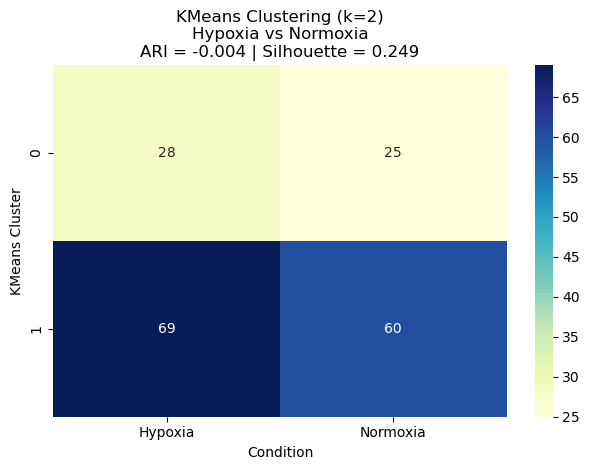

In [143]:
# KMeans clustering (k=2)
kmeans = KMeans(n_clusters=2, random_state=42)
df["Cluster"] = kmeans.fit_predict(X)

ari = adjusted_rand_score(df["Condition"], df["Cluster"])

silhouette = silhouette_score(X, df["Cluster"])

contingency = pd.crosstab(df["Cluster"], df["Condition"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"KMeans Clustering (k=2)\nHypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("KMeans Cluster")
plt.tight_layout()
plt.show()


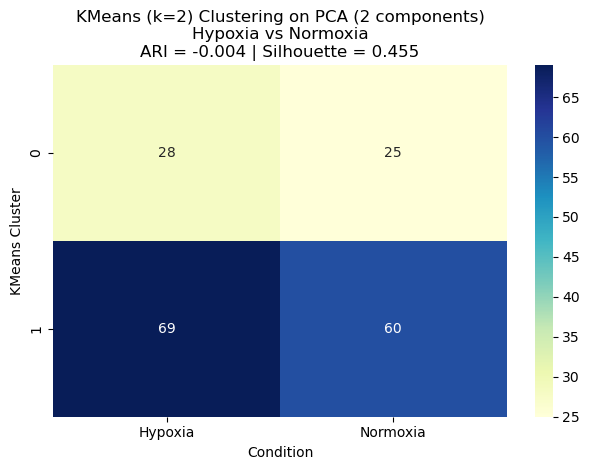

In [144]:
X_pca2 = df[["PC1", "PC2"]].values  

kmeans = KMeans(n_clusters=2, random_state=42)
df["Cluster"] = kmeans.fit_predict(X_pca2)

contingency = pd.crosstab(df["Cluster"], df["Condition"])

ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X_pca2, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"KMeans (k=2) Clustering on PCA (2 components)\nHypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("KMeans Cluster")
plt.tight_layout()
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


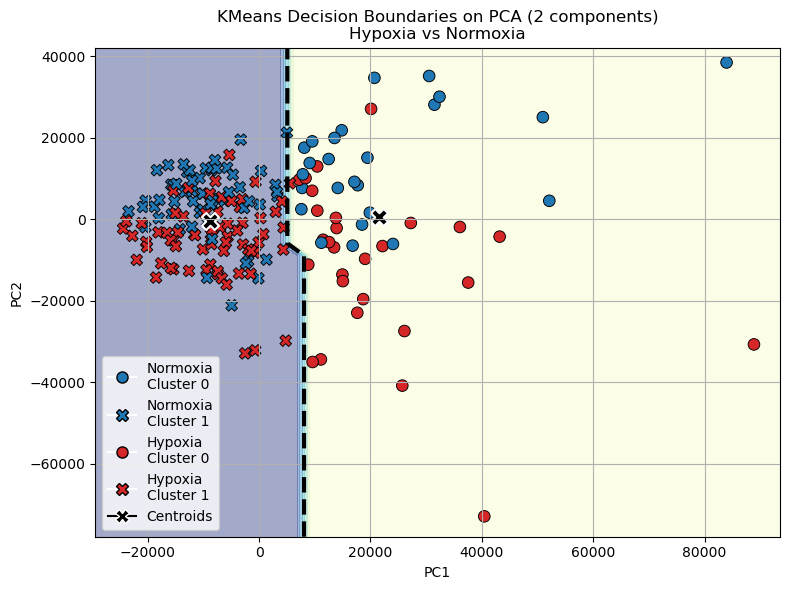

In [145]:
# KMeans clustering on PCA-2D
df["Cluster"] = kmeans.fit_predict(df[["PC1", "PC2"]])

margin = 5000
h = 3000
x_min, x_max = df["PC1"].min() - margin, df["PC1"].max() + margin
y_min, y_max = df["PC2"].min() - margin, df["PC2"].max() + margin
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
grid_points = np.c_[xx.ravel(), yy.ravel()]
Z = kmeans.predict(grid_points).reshape(xx.shape)


fig, ax = plt.subplots(figsize=(8, 6))


ax.contourf(xx, yy, Z, alpha=0.4, cmap="YlGnBu")
ax.contour(xx, yy, Z, levels=[0.5], colors='k', linewidths=3, linestyles='--')

sns.scatterplot(
    data=df,
    x="PC1", y="PC2",
    hue="Condition",
    style="Cluster",
    palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
    edgecolor='black',
    s=70,
    ax=ax
)

ax.scatter(
    kmeans.cluster_centers_[:, 0],
    kmeans.cluster_centers_[:, 1],
    c='black',
    s=150,
    marker='X',
    edgecolor='white',
    linewidth=1.5,
    label='Centroids'
)


ax.set_title("KMeans Decision Boundaries on PCA (2 components)\nHypoxia vs Normoxia")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.grid(True)

color_map = {"Normoxia": "#1f77b4", "Hypoxia": "#d62728"}
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Normoxia\nCluster 0',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Normoxia\nCluster 1',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Hypoxia\nCluster 0',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Hypoxia\nCluster 1',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='black', label='Centroids',
           markerfacecolor='black', markeredgecolor='white', markersize=10)
]
ax.legend(handles=legend_elements, loc="lower left", fontsize=10)

plt.tight_layout()
plt.show()



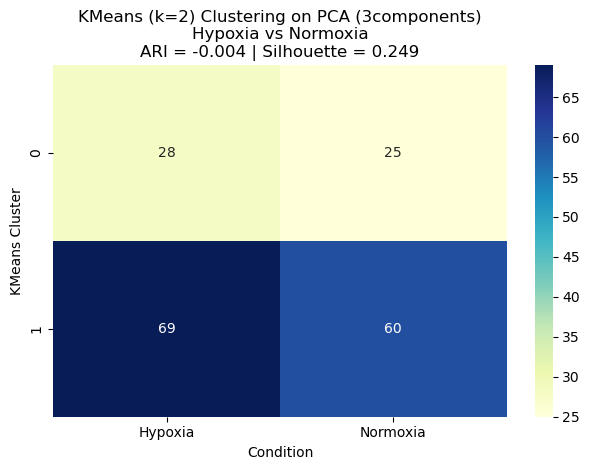

In [146]:
X_pca3 = df[["PC1", "PC2", "PC3"]].values  

kmeans = KMeans(n_clusters=2, random_state=42)
df["Cluster"] = kmeans.fit_predict(X_pca3)

contingency = pd.crosstab(df["Cluster"], df["Condition"])

ari = adjusted_rand_score(df["Condition"], df["Cluster"])

silhouette = silhouette_score(X, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"KMeans (k=2) Clustering on PCA (3components)\nHypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("KMeans Cluster")
plt.tight_layout()
plt.show()


We first applied the K-Means algorithm to the full dataset, and then to the PCA-transformed space, considering both two and three principal components to capture the most informative variation.
In all cases, hypoxic and normoxic cells are mixed across clusters. The ARI score remains close to zero, while the silhouette score is relatively high: in particular there is an increse after applying PCA with two principal components, suggesting that the clusters become more geometrically compact.
Although the algorithm identifies geometrically well-defined clusters, they do not correspond to a meaningful separation between the two experimental conditions.

Let’s now move on to hierarchical clustering, a general family of algorithms that build nested clusters by either successively merging or splitting them.
This hierarchy is typically represented as a dendrogram, where the root is a single cluster containing all the samples, and the leaves are individual data points.
We focus on Agglomerative Clustering, which performs hierarchical clustering using a bottom-up approach: it starts by treating each point as its own cluster, then iteratively merges the closest pairs of clusters until a stopping criterion is met; either when all points are merged into one cluster, or when a predefined number of clusters (k) is reached.

The linkage criterion determines how the distance between clusters is measured:
- Single: minimum distance between any two points (nearest neighbors)
- Complete: maximum distance between any two points (farthest neighbors)
- Average: mean distance between all pairs of points from the two clusters
- Ward: merges clusters that result in the smallest increase in within-cluster variance

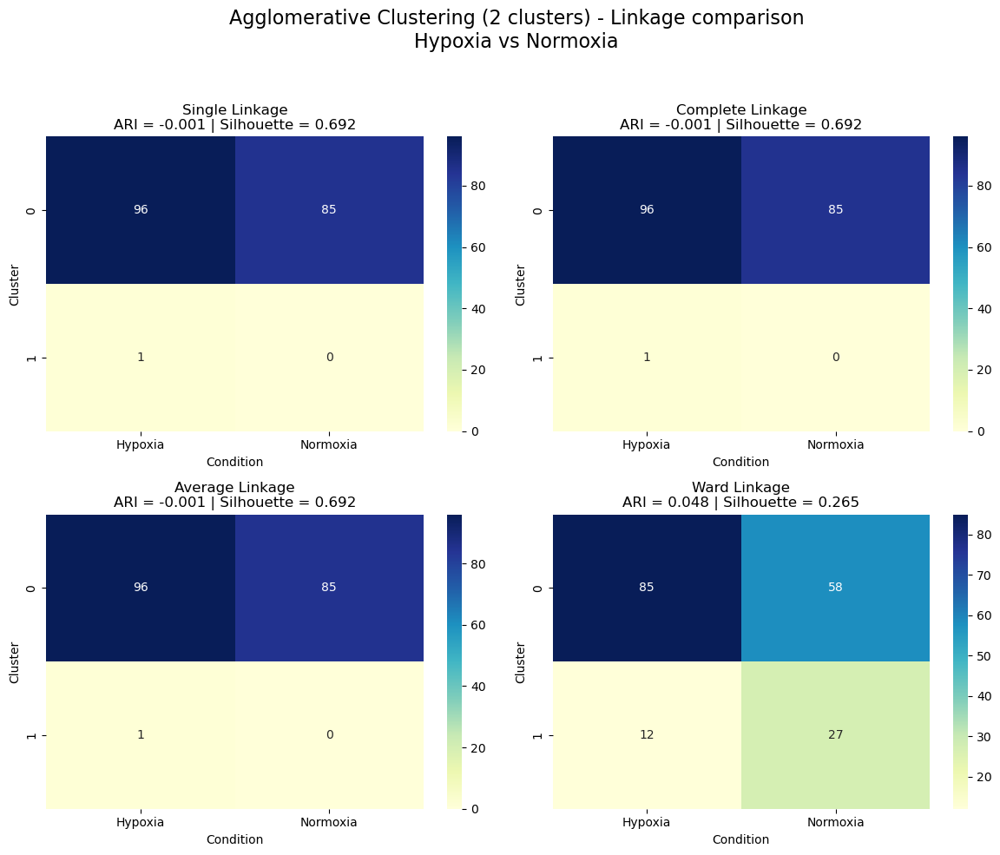

In [147]:
linkages = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]

for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X, cluster_labels)
    
    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("Cluster")

plt.suptitle("Agglomerative Clustering (2 clusters) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



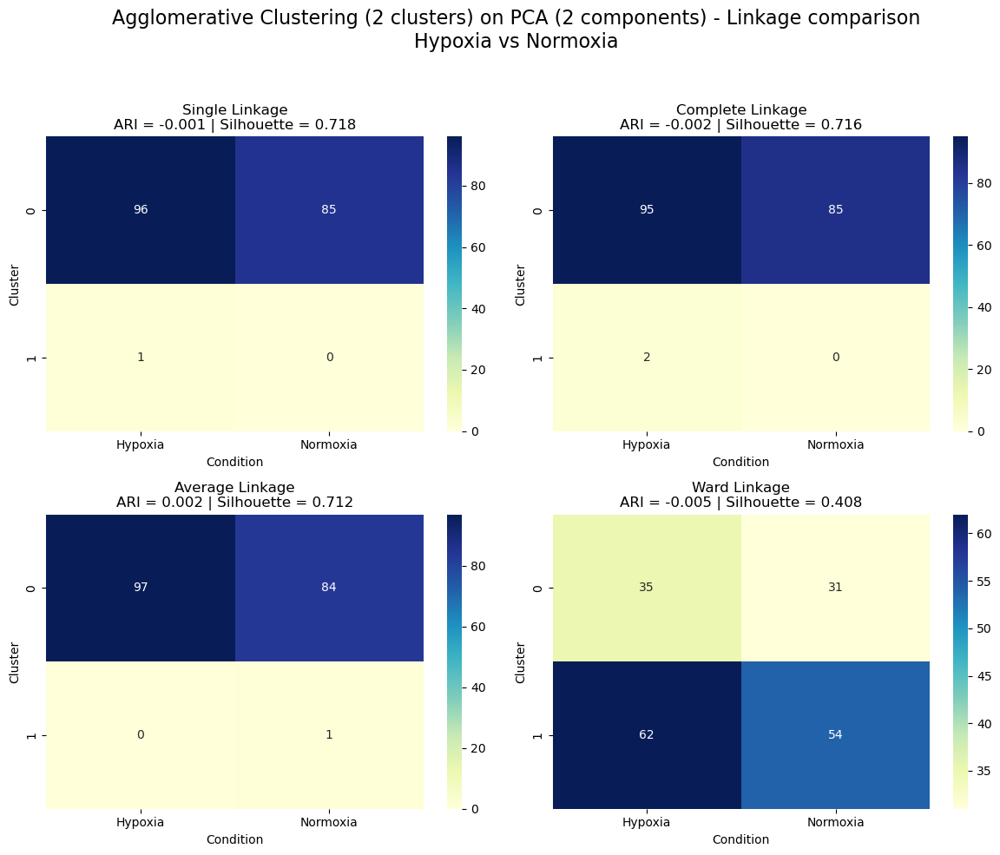

In [148]:
linkages = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]


for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca2)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
   
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X_pca2, cluster_labels)
    
    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("Cluster")

plt.suptitle("Agglomerative Clustering (2 clusters) on PCA (2 components) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


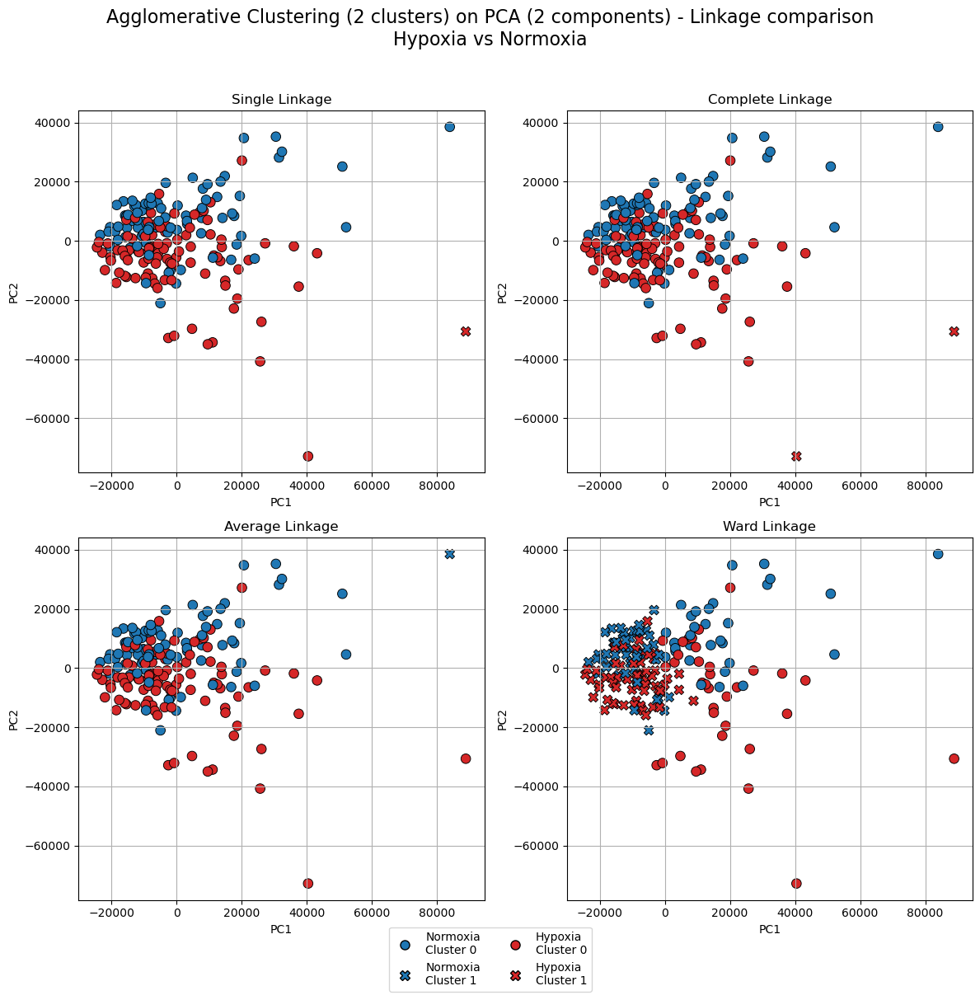

In [149]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca2)

    temp_df = pd.DataFrame(X_pca2, columns=["PC1", "PC2"])
    temp_df["Condition"] = df["Condition"].values
    temp_df["Cluster"] = cluster_labels

    sns.scatterplot(
        data=temp_df,
        x="PC1", y="PC2",
        hue="Condition",
        style="Cluster",
        palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
        edgecolor="black",
        s=70,
        ax=ax,
        legend=False 
    )

    ax.set_title(title)
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.grid(True)

color_map = {"Normoxia": "#1f77b4", "Hypoxia": "#d62728"}
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Normoxia\nCluster 0',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Normoxia\nCluster 1',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Hypoxia\nCluster 0',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Hypoxia\nCluster 1',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
]

fig.legend(handles=legend_elements, loc='lower center', ncol=2, fontsize=10, bbox_to_anchor=(0.5, -0.02))

plt.suptitle("Agglomerative Clustering (2 clusters) on PCA (2 components) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) 
plt.show()




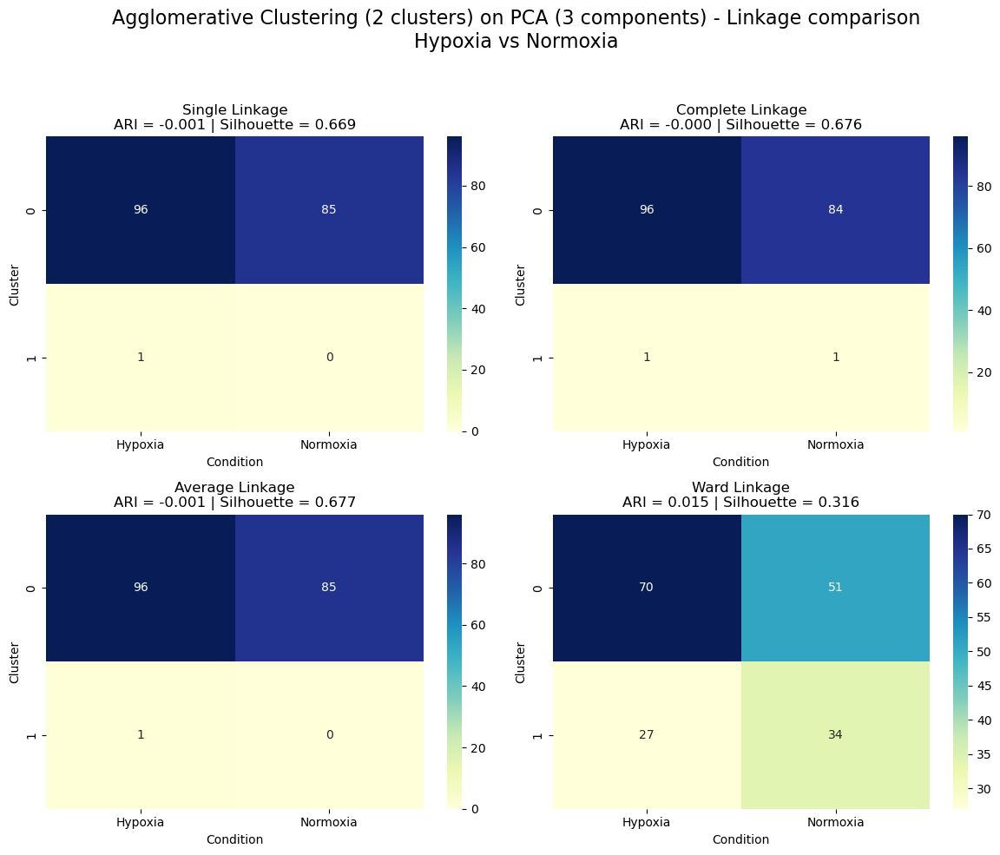

In [150]:
linkages = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]


for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca3)
    
   
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X_pca3, cluster_labels)
    
    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("Cluster")

plt.suptitle("Agglomerative Clustering (2 clusters) on PCA (3 components) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

We applied the Agglomerative Clustering algorithm to the full dataset, and then to the PCA-transformed space using both two and three principal components. Across all settings, we observe that none of the linkage methods (single, complete, average, or ward) are able to clearly separate the data into two distinct clusters. The single, complete, and average linkage methods produce high silhouette scores, indicating that the resulting clusters are internally well-defined. However, the ARI remains very low in all cases, suggesting a poor alignment between the clustering structure and the true biological labels (hypoxia vs. normoxia).
The ward linkage, in contrast, tends to yield lower silhouette scores, indicating less cohesive clusters. Yet, even in this case, the ARI remains near zero, confirming that none of the clustering configurations successfully recover the biological grouping.

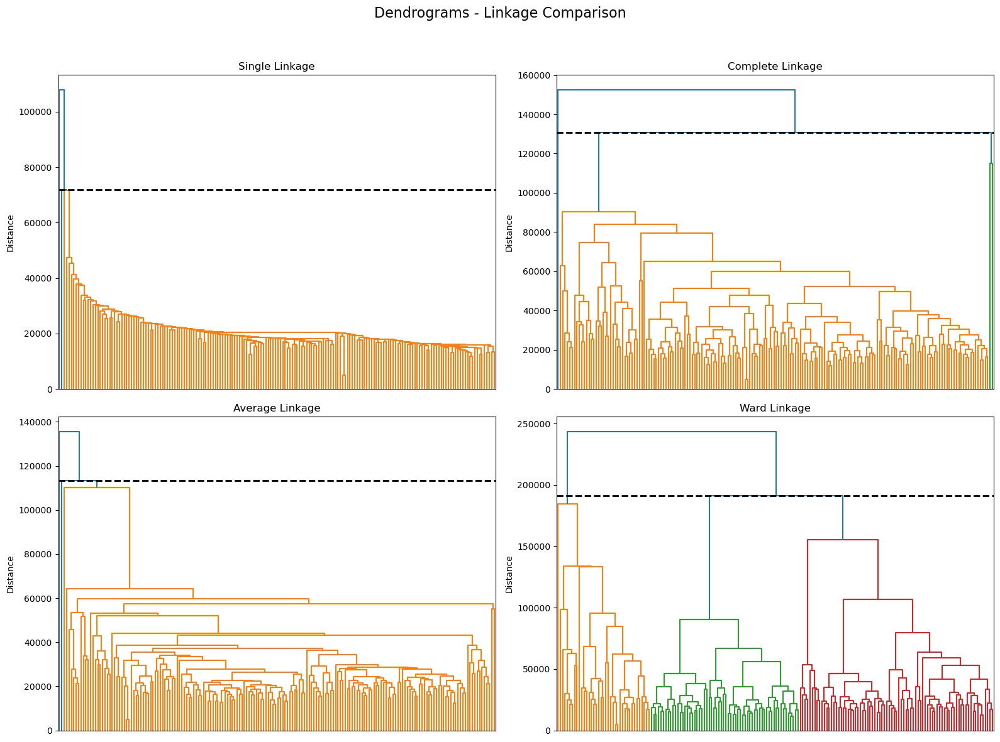

In [151]:
from scipy.cluster.hierarchy import linkage, dendrogram

linkage_methods = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

for ax, method, title in zip(axes.ravel(), linkage_methods, titles):
    Z = linkage(X, method=method)

    cut_height = Z[-2, 2]

    dendrogram(
        Z,
        ax=ax,
        color_threshold=cut_height,
        leaf_rotation=90,
        leaf_font_size=6,
        no_labels=True
    )

    ax.axhline(y=cut_height, color='black', linestyle='--', linewidth=2)
    ax.set_title(title, pad=6)
    ax.set_xticks([])
    ax.set_xlabel("")
    ax.set_ylabel("Distance")

plt.suptitle("Dendrograms - Linkage Comparison", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



t-SNE is a probabilistic, non-linear dimensionality reduction method that emphasizes the preservation of local structures in the data.
It converts pairwise distances into joint probabilities and computes a low-dimensional embedding in which similar points are placed close together.
This makes it particularly well-suited for exploring complex datasets and highlighting potential clusters or hidden patterns.

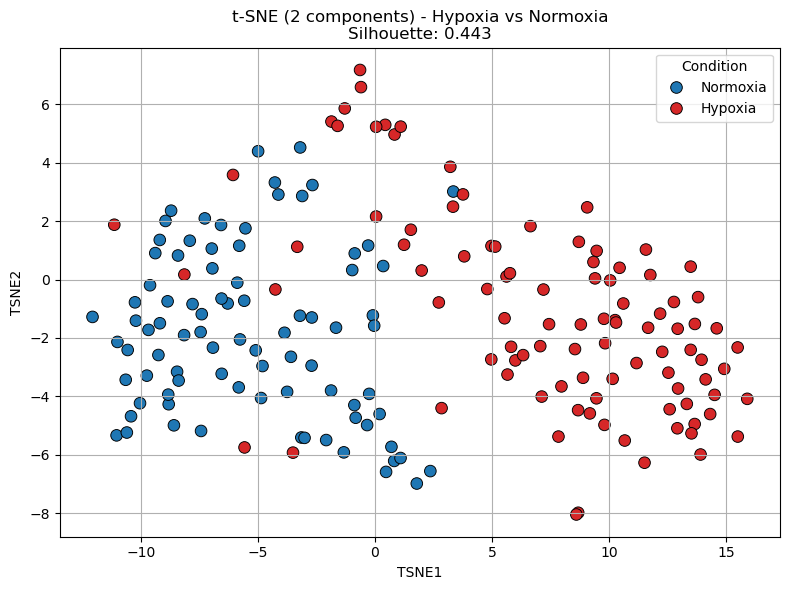

In [152]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200)
X_tsne = tsne.fit_transform(X)

df["TSNE1"] = X_tsne[:, 0]
df["TSNE2"] = X_tsne[:, 1]

true_labels = df["Condition"].map({"Hypoxia": 0, "Normoxia": 1})

silhouette_tsne = silhouette_score(X_tsne, true_labels)

plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=df,
    x="TSNE1", y="TSNE2",
    hue="Condition",
    palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
    edgecolor="black",
    s=70
)
plt.title(f"t-SNE (2 components) - Hypoxia vs Normoxia\nSilhouette: {silhouette_tsne:.3f}")
plt.grid(True)
plt.tight_layout()
plt.show()





/opt/anaconda3/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


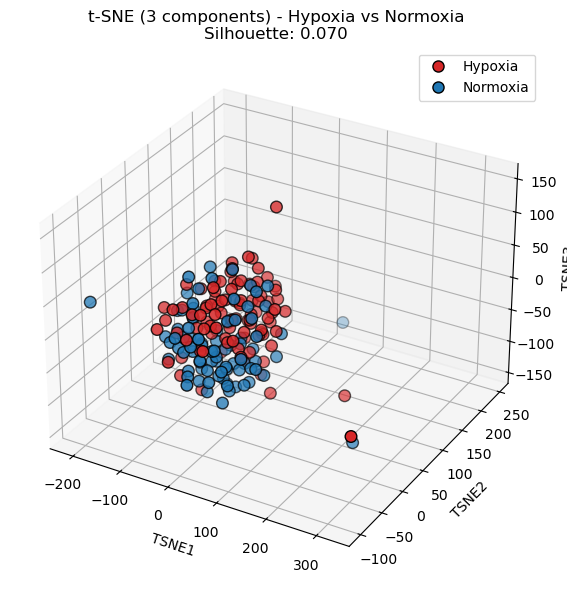

In [153]:
tsne = TSNE(n_components=3, random_state=42, perplexity=30, learning_rate=200,
            n_iter=500, init='pca', method='barnes_hut')
X_tsne_3d = tsne.fit_transform(X)

df["TSNE1"] = X_tsne_3d[:, 0]
df["TSNE2"] = X_tsne_3d[:, 1]
df["TSNE3"] = X_tsne_3d[:, 2]

true_labels = df["Condition"].map({"Hypoxia": 0, "Normoxia": 1})
silhouette_tsne = silhouette_score(X_tsne_3d, true_labels)


fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

colors = df["Condition"].map({"Hypoxia": "#d62728", "Normoxia": "#1f77b4"})

ax.scatter(df["TSNE1"], df["TSNE2"], df["TSNE3"],
           c=colors, edgecolor='black', s=70)

ax.set_xlabel("TSNE1")
ax.set_ylabel("TSNE2")
ax.set_zlabel("TSNE3")
ax.set_title(f"t-SNE (3 components) - Hypoxia vs Normoxia\nSilhouette: {silhouette_tsne:.3f}")
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Hypoxia',
           markerfacecolor='#d62728', markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Normoxia',
           markerfacecolor='#1f77b4', markeredgecolor='black', markersize=8)
]

ax.legend(handles=legend_elements, loc='upper right', fontsize=10)

plt.tight_layout()
plt.show()



The 2D t-SNE projection suggests the presence of a non-linear structure in the data, as it reveals the visual separation between hypoxic and normoxic cells.
However, this separation does not hold in the 3D t-SNE projection, and the silhouette score is low, indicating that the apparent clustering might be weak.
Therefore, while the 2D visualization is informative, we cannot conclusively claim a non-linear relationship solely based on t-SNE.
This highlights a known limitation of t-SNE: higher-dimensional embeddings do not necessarily improve, and can even reduce, interpretability.

The Gaussian Mixture Model (GMM) is a probabilistic clustering method that assumes data points are generated from a mixture of several Gaussian distributions with unknown parameters.
When dealing with high-dimensional data, a large number of clusters, or a small number of instances, GMM may struggle to converge to an optimal solution due to the complexity of estimating a large number of parameters.
One way to reduce this complexity is to constrain the shape and orientation of the clusters by setting the covariance type hyperparameter. 
The available options are:
- spherical: each cluster is spherical, with its own variance
- diag: clusters can be ellipsoidal, but aligned with the axes, resulting in diagonal covariance matrices
- tied: all clusters share the same covariance matrix 
- full: no constraints

By choosing a more restrictive covariance type, we can improve convergence and avoid overfitting, especially in high-dimensional or sparse datasets.


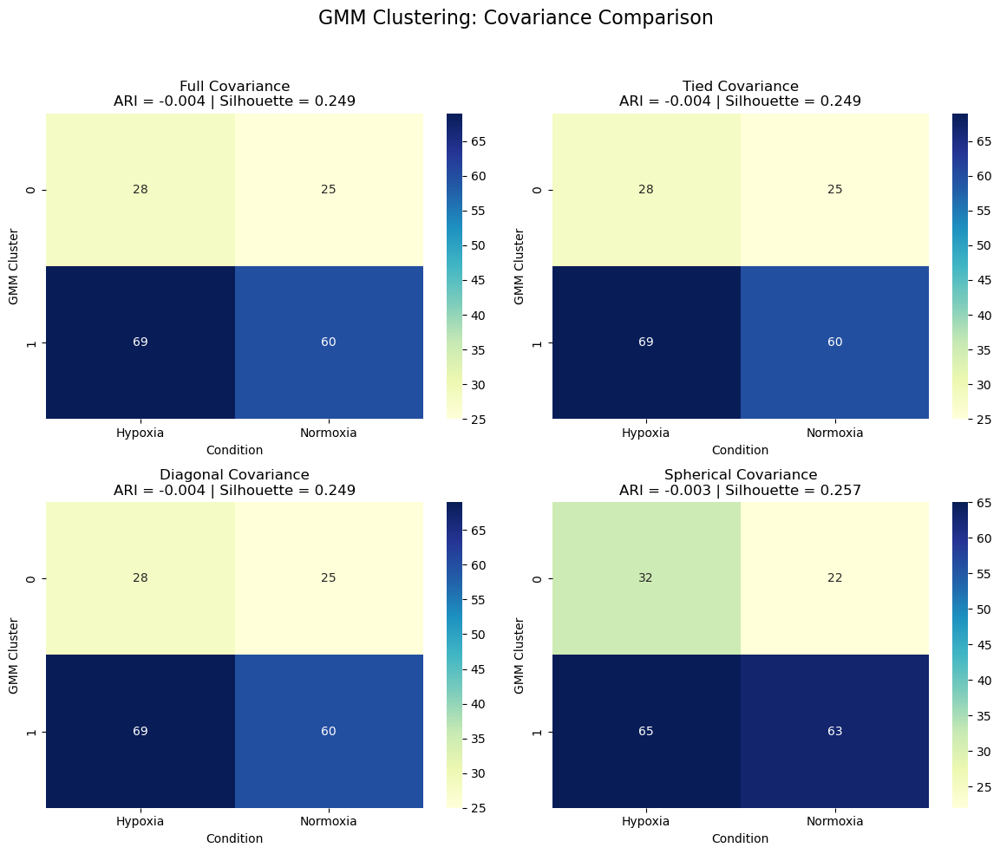

In [154]:
cov_types = ['full', 'tied', 'diag', 'spherical']
titles = ['Full Covariance', 'Tied Covariance', 'Diagonal Covariance', 'Spherical Covariance']

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]

for ax, cov_type, title in zip(axes.ravel(), cov_types, titles):
    gm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gm.fit(X)
    cluster_labels = gm.predict(X)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
  
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X, cluster_labels)

    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("GMM Cluster")

plt.suptitle("GMM Clustering: Covariance Comparison", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



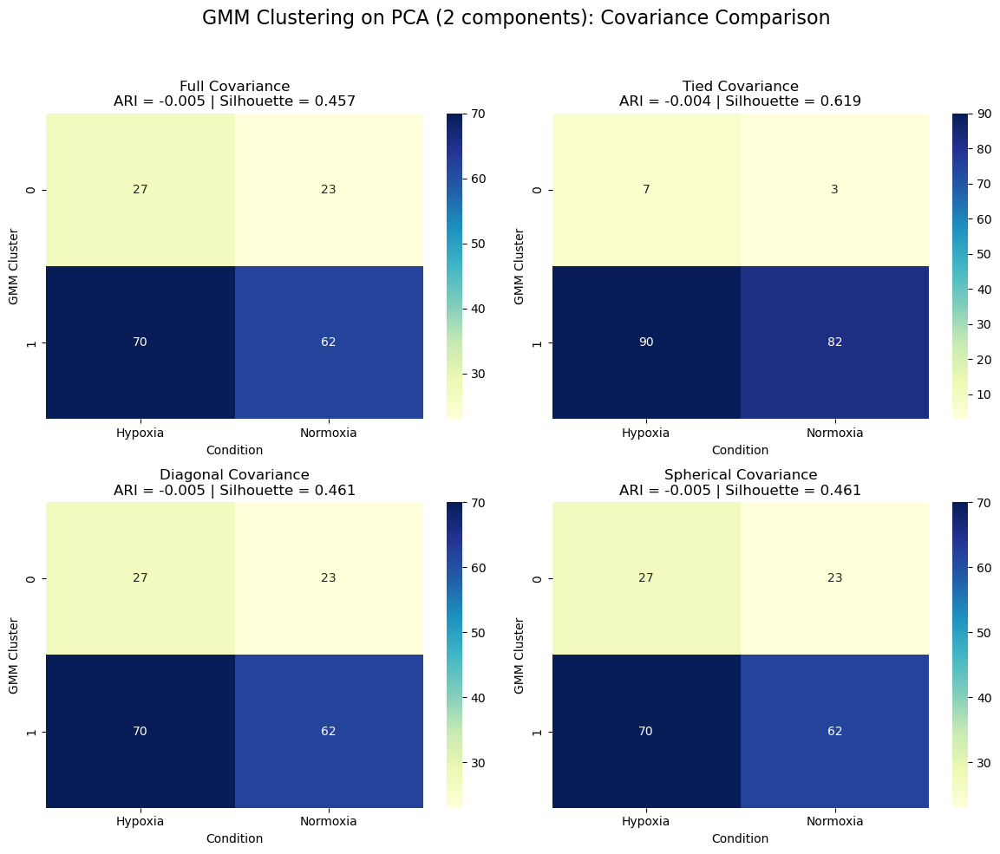

In [155]:
cov_types = ['full', 'tied', 'diag', 'spherical']
titles = ['Full Covariance', 'Tied Covariance', 'Diagonal Covariance', 'Spherical Covariance']

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]

for ax, cov_type, title in zip(axes.ravel(), cov_types, titles):
    gm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gm.fit(X_pca2)
    cluster_labels = gm.predict(X_pca2)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
   
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X_pca2, cluster_labels)

    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("GMM Cluster")

plt.suptitle("GMM Clustering on PCA (2 components): Covariance Comparison", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


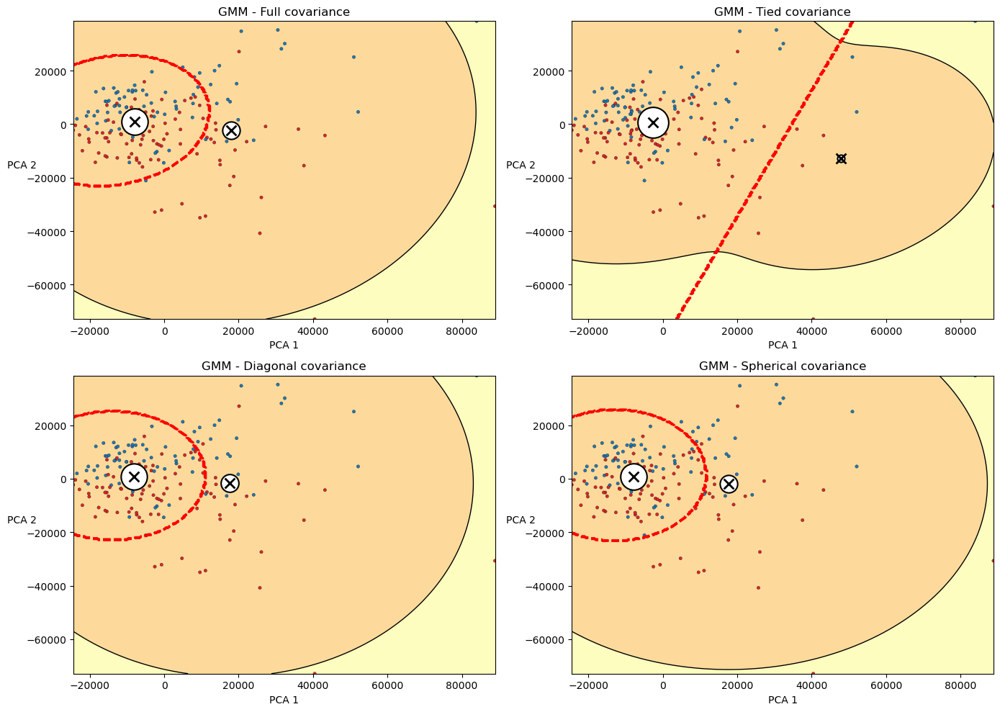

In [156]:
gm = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gm.fit(X_pca2)
cluster_labels = gm.predict(X_pca2)
cluster_probs = gm.predict_proba(X_pca2)[:, 0]  

def plot_centroids(centroids, weights, circle_color='w', cross_color='k'):
    for i, (centroid, weight) in enumerate(zip(centroids, weights)):
        plt.scatter(*centroid, s=1000 * weight, marker='o',
                    edgecolor='black', facecolor=circle_color, linewidth=1.5)
        plt.scatter(*centroid, marker='x', color=cross_color, s=100, linewidths=2)

def plot_gaussian_mixture(clusterer, X, labels=None, probs=None, palette=None, resolution=300, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    
    Z = -clusterer.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z, norm=LogNorm(vmin=1.0, vmax=30.0),
                 levels=np.logspace(0, 2, 12), cmap='magma')

    plt.contour(xx, yy, Z, norm=LogNorm(vmin=1.0, vmax=30.0),
                levels=np.logspace(0, 2, 12), linewidths=1, colors='k')
    
    Z_pred = clusterer.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
    plt.contour(xx, yy, Z_pred, linewidths=2, colors='red', linestyles='dashed')

    if probs is not None:
        plt.scatter(X[:, 0], X[:, 1], c=probs, cmap='coolwarm', s=10, edgecolor='k', linewidth=0.2)
    elif labels is not None and palette is not None:
        point_colors = [palette[label] for label in labels]
        plt.scatter(X[:, 0], X[:, 1], c=point_colors, s=10, edgecolor='k', linewidth=0.2)
    elif labels is not None:
        plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='Set1', s=10, edgecolor='k', linewidth=0.2)
    else:
        plt.plot(X[:, 0], X[:, 1], 'k.', markersize=3)

    
    plot_centroids(clusterer.means_, clusterer.weights_)

    plt.xlabel("PCA 1")
    if show_ylabels:
        plt.ylabel("PCA 2", rotation=0)
    else:
        plt.tick_params(labelleft=False)

true_labels_str = df["Condition"]  
palette = {"Hypoxia": "#d62728", "Normoxia": "#1f77b4"}
true_labels_colors = true_labels_str.map(palette).values

true_labels = true_labels_str.map({"Hypoxia": 0, "Normoxia": 1}).values


cov_types = ['full', 'tied', 'diag', 'spherical']
titles = ['Full covariance', 'Tied covariance', 'Diagonal covariance', 'Spherical covariance']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.ravel()

for i, cov_type in enumerate(cov_types):
    gm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gm.fit(X_pca2)
    
    plt.sca(axes[i])
    plot_gaussian_mixture(gm, X_pca2, labels=true_labels_str.values, palette=palette)
    plt.title(f"GMM - {titles[i]}")

plt.tight_layout()
plt.show()


Regardless of the covariance type, the ARI remains low both when GMM is applied to the full dataset and to the PCA-transformed space, indicating that the clusters do not align with the hypoxia/normoxia labels.
This is confirmed by the contingency matrix, that shows a poor correspondence with the true labels, confirming that the clustering structure found by GMM does not reflect the biological distinction between the two conditions.
The silhouette score improves after applying PCA, suggesting that the clusters become more geometrically compact.

DBSCAN is a density-based clustering algorithm that groups together points that have many nearby neighbors, while marking as outliers the points that lie in low-density regions.
It does not require specifying the number of clusters, and it is particularly effective at detecting arbitrarily shaped clusters and isolating noise.

In [157]:
found = False
for eps in np.arange(0.1, 5.0, 0.25):
    dbscan = DBSCAN(eps=eps, min_samples=2)
    db_labels = dbscan.fit_predict(X)
    n_clusters = len(set(db_labels)) - (1 if -1 in db_labels else 0)
    if n_clusters == 2:
        found = True
        print(f"✅ 2 cluster found with eps={eps:.2f}")
        break

if not found:
    print("❌ No clusters found with 2 groups")



❌ No clusters found with 2 groups


We tried adjusting the eps parameter in DBSCAN in order to obtain exactly two clusters. However, in all tested configurations, the algorithm either assigned all points to a single cluster, created many small clusters, or classified most of the data as noise.
This behavior reflects the fact that DBSCAN does not aim to produce a fixed number of clusters, but instead relies on the underlying density of the data to determine the structure.

We end our analysis with the Spectral Clustering, a graph-based clustering algorithm that uses the eigenvalues of a similarity matrix to reduce dimensionality before applying a standard clustering method, usually K-Means. 
It is particularly effective at detecting non-convex clusters or structures that are not easily captured by distance-based methods.

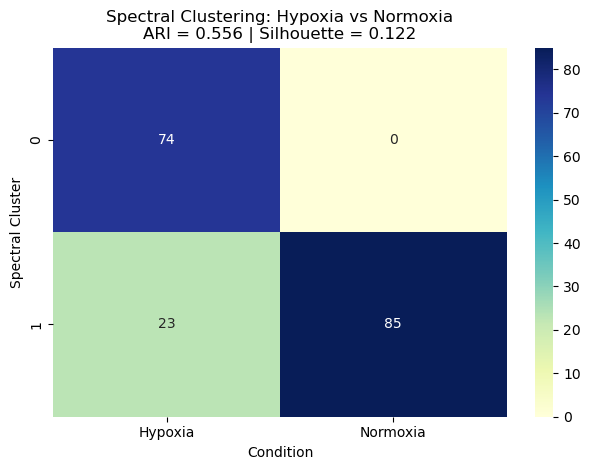

In [158]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
df["Cluster"] = spectral.fit_predict(X)

contingency = pd.crosstab(df["Cluster"], df["Condition"])


ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"Spectral Clustering: Hypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("Spectral Cluster")
plt.tight_layout()
plt.show()



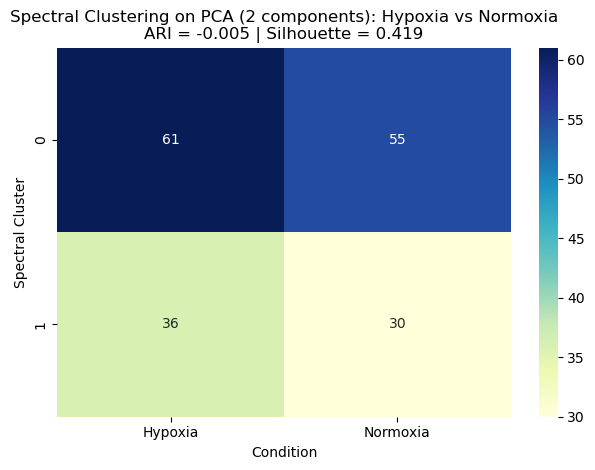

In [159]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
df["Cluster"] = spectral.fit_predict(X_pca2)

contingency = pd.crosstab(df["Cluster"], df["Condition"])


ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X_pca2, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"Spectral Clustering on PCA (2 components): Hypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("Spectral Cluster")
plt.tight_layout()
plt.show()

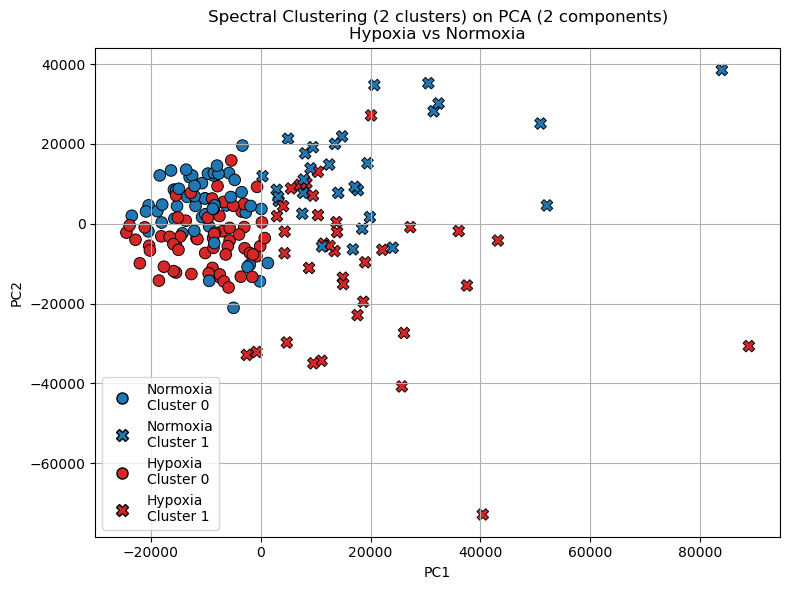

In [160]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
cluster_labels = spectral.fit_predict(X_pca2)
df["Cluster"] = cluster_labels

fig, ax = plt.subplots(figsize=(8, 6))


sns.scatterplot(
    x=X_pca2[:, 0],
    y=X_pca2[:, 1],
    hue=df["Condition"],
    style=df["Cluster"],
    palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
    edgecolor="black",
    s=70,
    ax=ax,
    legend=False
)

ax.set_title("Spectral Clustering (2 clusters) on PCA (2 components)\nHypoxia vs Normoxia")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.grid(True)

color_map = {"Normoxia": "#1f77b4", "Hypoxia": "#d62728"}
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Normoxia\nCluster 0',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Normoxia\nCluster 1',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Hypoxia\nCluster 0',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Hypoxia\nCluster 1',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
]

ax.legend(handles=legend_elements, loc="lower left", fontsize=10)

plt.tight_layout()
plt.show()



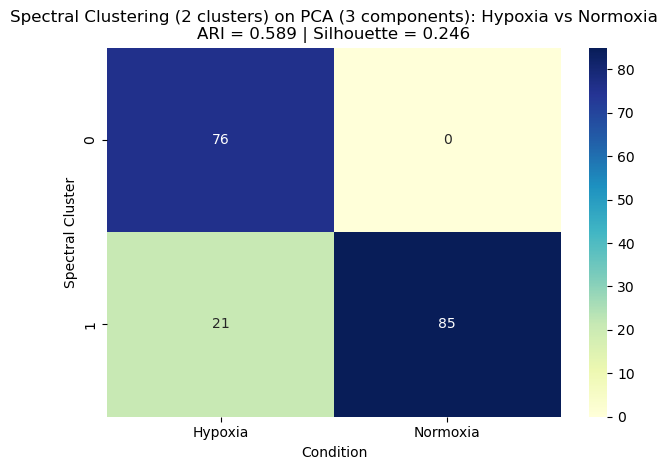

In [161]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
df["Cluster"] = spectral.fit_predict(X_pca3)

contingency = pd.crosstab(df["Cluster"], df["Condition"])


ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X_pca3, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"Spectral Clustering (2 clusters) on PCA (3 components): Hypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("Spectral Cluster")
plt.tight_layout()
plt.show()

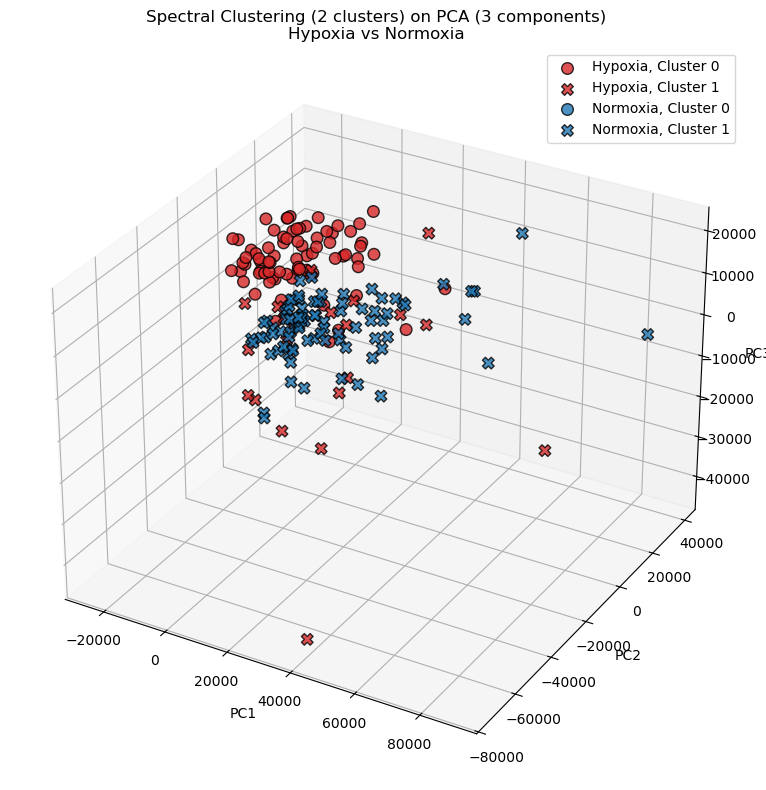

In [162]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
cluster_labels = spectral.fit_predict(X_pca3)

palette = {"Hypoxia": "#d62728", "Normoxia": "#1f77b4"}
markers = {0: "o", 1: "X"}

conditions = df["Condition"].values

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for cond in np.unique(conditions):
    for cluster in np.unique(cluster_labels):
        mask = (conditions == cond) & (cluster_labels == cluster)
        ax.scatter(
            X_pca3[mask, 0],
            X_pca3[mask, 1],
            X_pca3[mask, 2],
            c=palette[cond],
            marker=markers[cluster],
            label=f"{cond}, Cluster {cluster}",
            edgecolor='k',
            s=70,
            alpha=0.8
        )

ax.set_title("Spectral Clustering (2 clusters) on PCA (3 components)\nHypoxia vs Normoxia")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.legend()
plt.tight_layout()
plt.show()


Interestingly, Spectral Clustering yields a high ARI when applied to the full dataset and to the PCA 3D space, suggesting a meaningful biological separation between hypoxic and normoxic cells.
However, in the PCA 2D space, the ARI drops close to zero despite an increase in silhouette score, indicating that the algorithm finds geometrically coherent clusters that do not correspond to the true labels.
This emphasizes a potential limitation of PCA: by reducing dimensionality, it may distort local relationships and compromise the effectiveness of graph-based methods such as Spectral Clustering.

### HCC1806 - DROP SEQ

In [163]:
df = pd.read_csv("HCC1806_Filtered_Normalised_3000_Data_train.txt",  sep=r"\s+", engine="python", index_col=0)
print("Dataframe dimensions:", np.shape(df))

Dataframe dimensions: (3000, 14682)


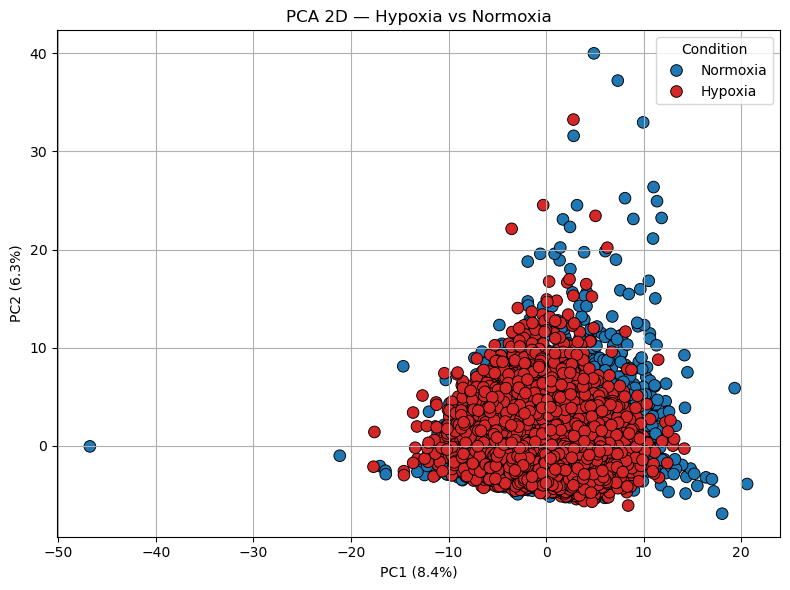

In [164]:
#PCA on 2 components

df.index = df.index.str.replace('"', '', regex=False).str.strip()
df.columns = df.columns.str.replace('"', '', regex=False).str.strip()


metadata_df = pd.DataFrame({
    "OriginalName": df.columns
})
metadata_df["Condition"] = metadata_df["OriginalName"].str.extract(r'_(Hypoxia|Normoxia)$')
metadata_df["SampleID"] = metadata_df["OriginalName"].str.replace(r'_(Hypoxia|Normoxia)$', '', regex=True)


col_mapping = dict(zip(metadata_df["OriginalName"], metadata_df["SampleID"]))
df = df.rename(columns=col_mapping)


df = df.T


df["Condition"] = df.index.map(dict(zip(metadata_df["SampleID"], metadata_df["Condition"])))


X = df.drop(columns=["Condition"])
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X)

df["PC1"] = pca_result[:, 0]
df["PC2"] = pca_result[:, 1]

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x="PC1", y="PC2", hue="Condition", palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
                edgecolor="black", s=70)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
plt.title("PCA 2D — Hypoxia vs Normoxia")
plt.grid(True)
plt.tight_layout()
plt.show()



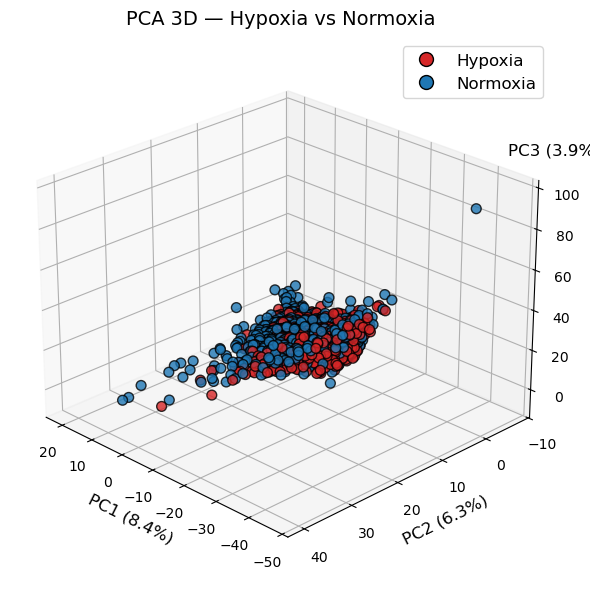

In [165]:
pca_3d = PCA(n_components=3)
pca_result = pca_3d.fit_transform(X)

df["PC1"] = pca_result[:, 0]
df["PC2"] = pca_result[:, 1]
df["PC3"] = pca_result[:, 2]

color_map = {"Hypoxia": "#d62728", "Normoxia": "#1f77b4"}
colors = df["Condition"].map(color_map)

fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(df["PC1"], df["PC2"], df["PC3"], 
                c=colors, edgecolor='black', s=50, alpha=0.8)

ax.set_xlabel(f"PC1 ({pca_3d.explained_variance_ratio_[0]*100:.1f}%)", fontsize=12)
ax.set_ylabel(f"PC2 ({pca_3d.explained_variance_ratio_[1]*100:.1f}%)", fontsize=12)

ax.text(
    x=df["PC1"].min(), 
    y=df["PC2"].min(), 
    z=df["PC3"].max()+20 , 
    s=f"PC3 ({pca_3d.explained_variance_ratio_[2]*100:.1f}%)",
    fontsize=12,
    color="black"
)

ax.set_title("PCA 3D — Hypoxia vs Normoxia", fontsize=14, pad=10)

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Hypoxia',
           markerfacecolor=color_map["Hypoxia"], markersize=10, markeredgecolor='black'),
    Line2D([0], [0], marker='o', color='w', label='Normoxia',
           markerfacecolor=color_map["Normoxia"], markersize=10, markeredgecolor='black')
]
ax.legend(handles=legend_elements, loc='upper right', fontsize=12)

ax.view_init(elev=25, azim=135)

plt.tight_layout()
plt.show()




In both the two and three dimensional PCA spaces, there is no clear separation between hypoxic and normoxic cells.
However, the situation might improve when considering higher-dimensional representations.
This could also be explained by the large number of samples (~14,000 cells), which may require more components to capture relevant biological variability. 

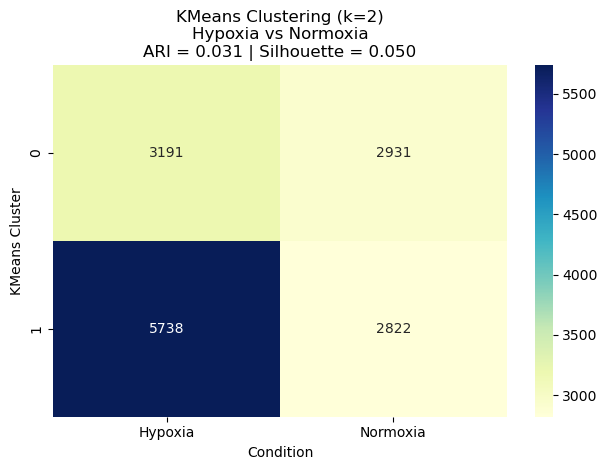

In [166]:
# KMeans clustering (k=2)
kmeans = KMeans(n_clusters=2, random_state=42)
df["Cluster"] = kmeans.fit_predict(X)

ari = adjusted_rand_score(df["Condition"], df["Cluster"])

silhouette = silhouette_score(X, df["Cluster"])

contingency = pd.crosstab(df["Cluster"], df["Condition"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"KMeans Clustering (k=2)\nHypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("KMeans Cluster")
plt.tight_layout()
plt.show()


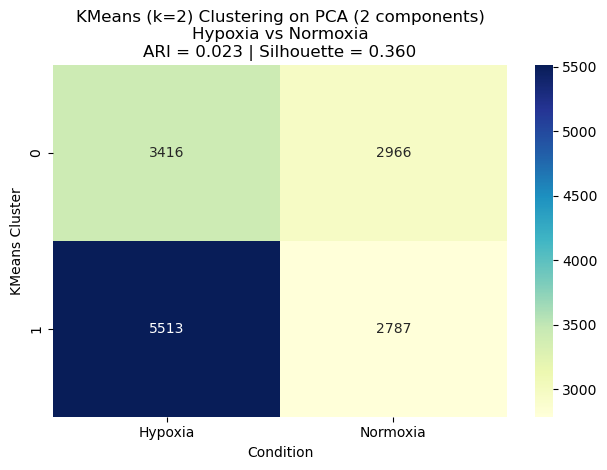

In [167]:
X_pca2 = df[["PC1", "PC2"]].values  

kmeans = KMeans(n_clusters=2, random_state=42)
df["Cluster"] = kmeans.fit_predict(X_pca2)

contingency = pd.crosstab(df["Cluster"], df["Condition"])

ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X_pca2, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"KMeans (k=2) Clustering on PCA (2 components)\nHypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("KMeans Cluster")
plt.tight_layout()
plt.show()

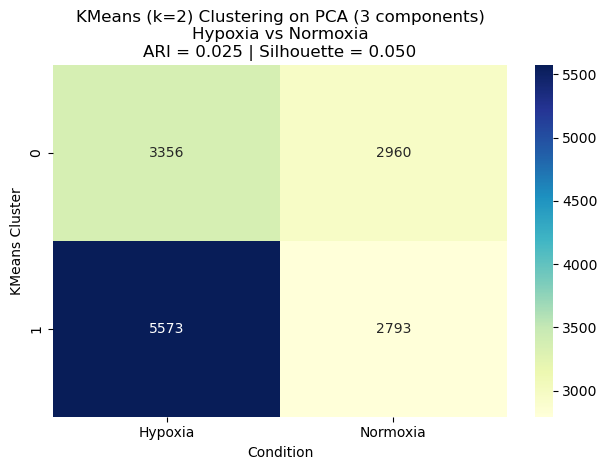

In [168]:
X_pca3 = df[["PC1", "PC2", "PC3"]].values  

kmeans = KMeans(n_clusters=2, random_state=42)
df["Cluster"] = kmeans.fit_predict(X_pca3)

contingency = pd.crosstab(df["Cluster"], df["Condition"])

ari = adjusted_rand_score(df["Condition"], df["Cluster"])

silhouette = silhouette_score(X, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"KMeans (k=2) Clustering on PCA (3 components)\nHypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("KMeans Cluster")
plt.tight_layout()
plt.show()



K-Means applied to the 2D PCA space did not yield meaningful clustering: the algorithm tended to group all samples into a single cluster or produced inconsistent results.
This behavior is expected, as the low-dimensional projection may fail to preserve the biological signal of interest, and K-Means relies on assumptions that may not hold in such a compressed space.
While the silhouette score is slightly higher in 2D compared to the full dataset and PCA 3D space, the ARI remains close to zero in all cases, indicating that the clusters found are not biologically meaningful.

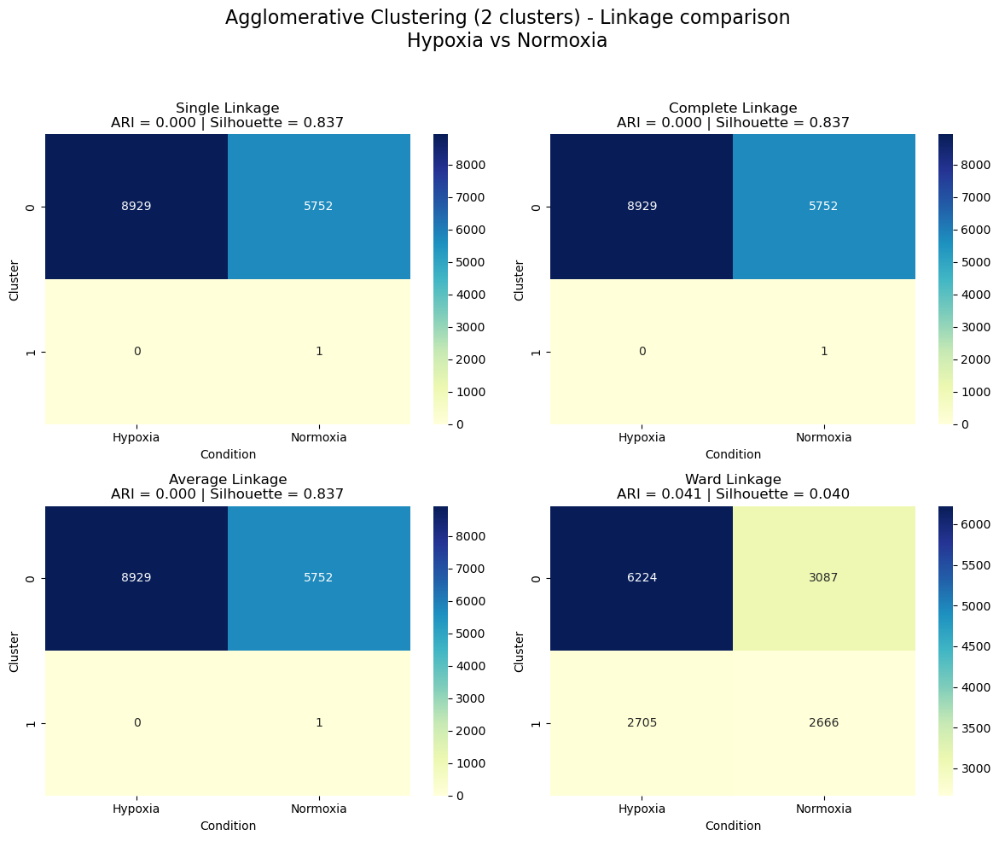

In [169]:
linkages = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]

for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X, cluster_labels)
    
    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("Cluster")

plt.suptitle("Agglomerative Clustering (2 clusters) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



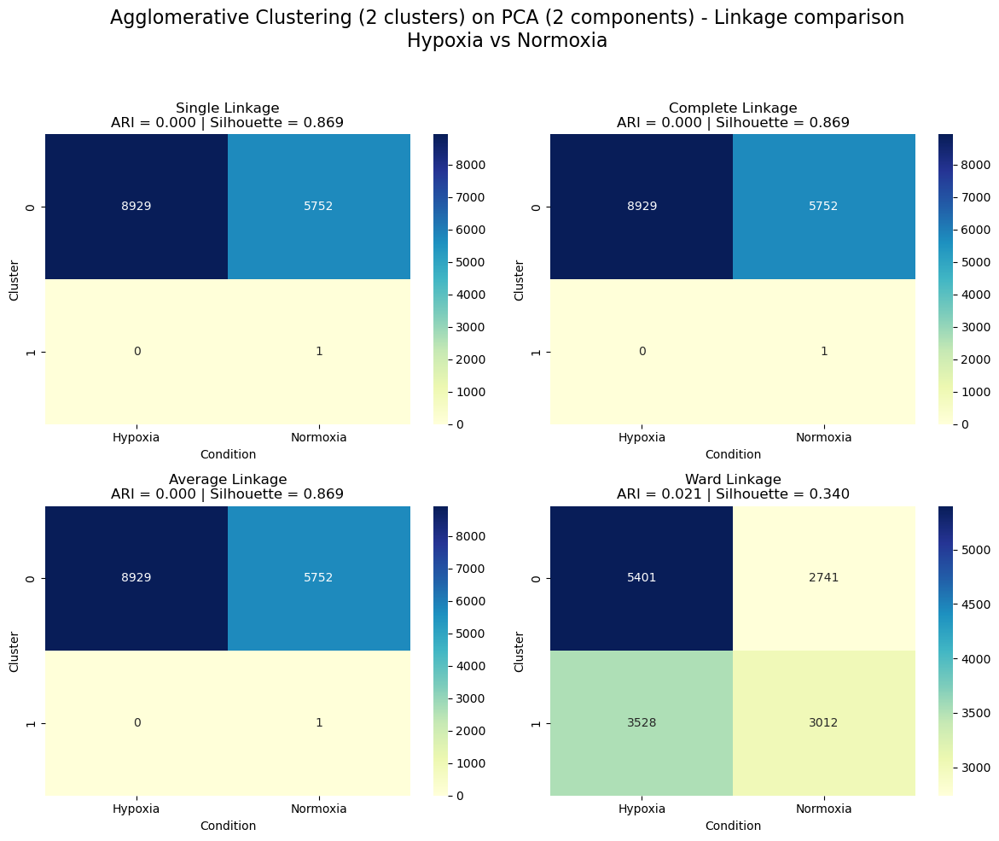

In [170]:
linkages = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]


for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca2)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
   
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X_pca2, cluster_labels)
    
    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("Cluster")

plt.suptitle("Agglomerative Clustering (2 clusters) on PCA (2 components) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


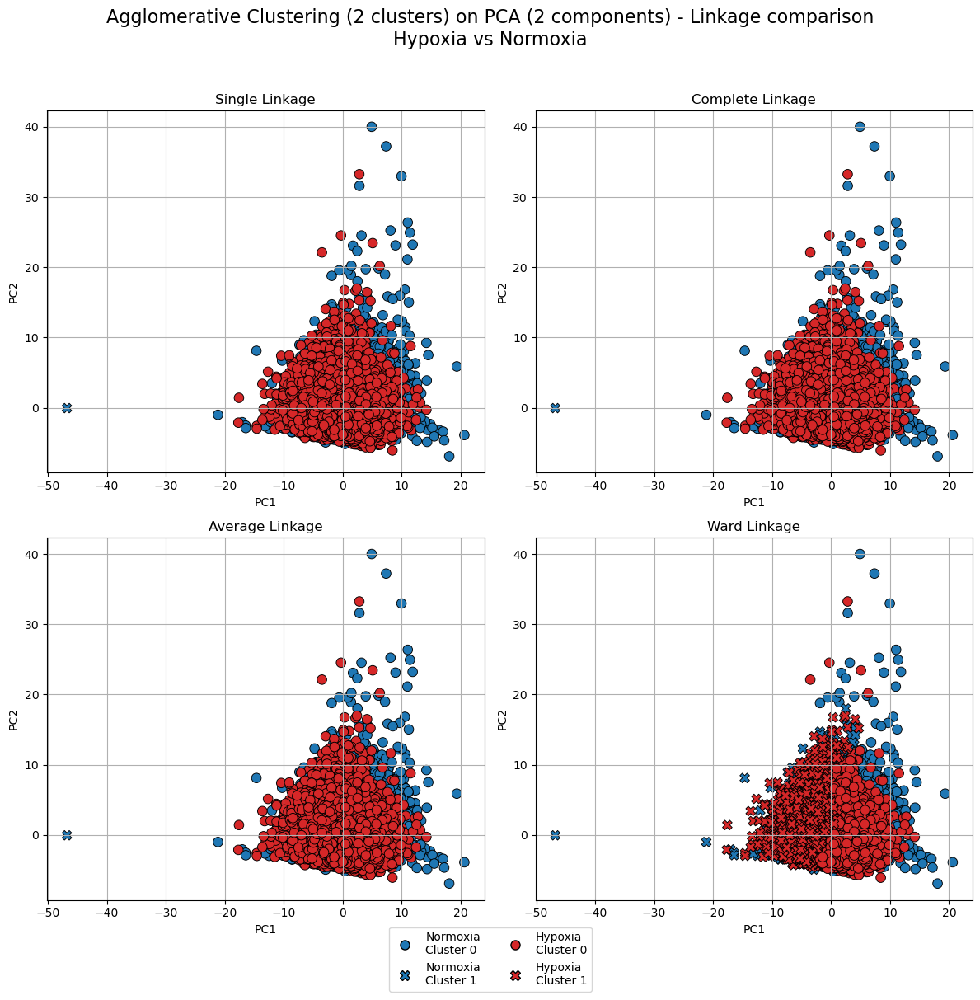

In [171]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca2)

    temp_df = pd.DataFrame(X_pca2, columns=["PC1", "PC2"])
    temp_df["Condition"] = df["Condition"].values
    temp_df["Cluster"] = cluster_labels

    sns.scatterplot(
        data=temp_df,
        x="PC1", y="PC2",
        hue="Condition",
        style="Cluster",
        palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
        edgecolor="black",
        s=70,
        ax=ax,
        legend=False 
    )

    ax.set_title(title)
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.grid(True)

color_map = {"Normoxia": "#1f77b4", "Hypoxia": "#d62728"}
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Normoxia\nCluster 0',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Normoxia\nCluster 1',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Hypoxia\nCluster 0',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Hypoxia\nCluster 1',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
]

fig.legend(handles=legend_elements, loc='lower center', ncol=2, fontsize=10, bbox_to_anchor=(0.5, -0.02))

plt.suptitle("Agglomerative Clustering (2 clusters) on PCA (2 components) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) 
plt.show()



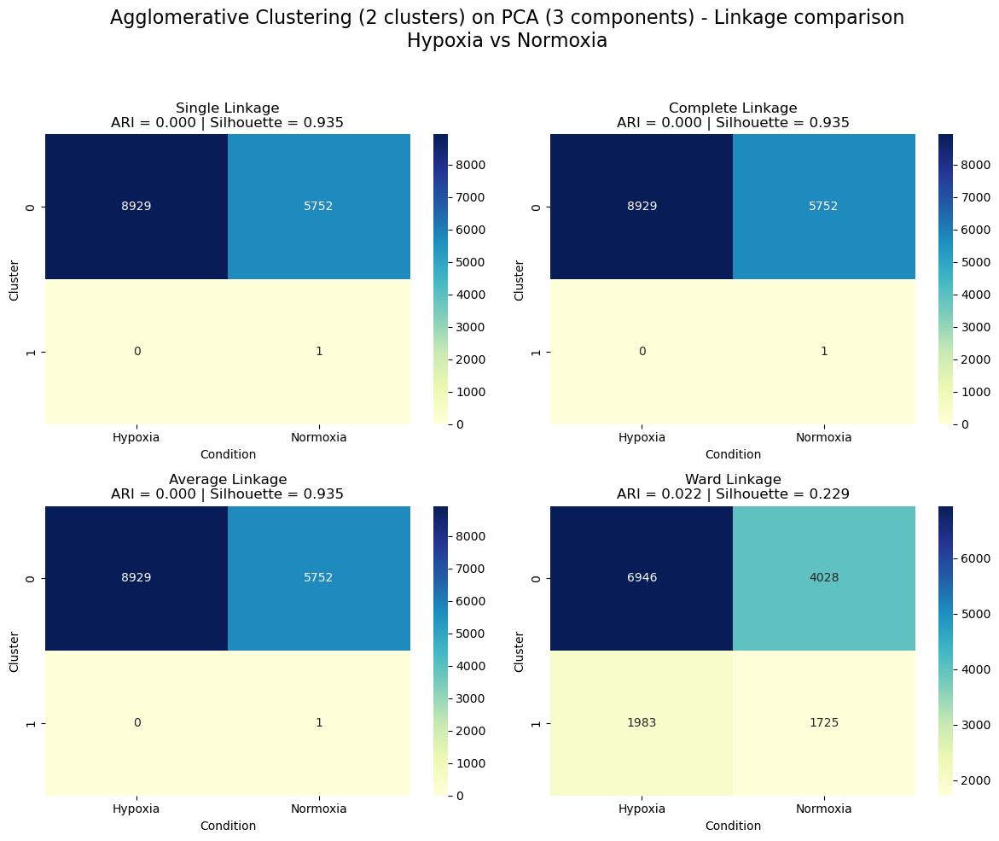

In [172]:
linkages = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]


for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca3)
    
   
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X_pca3, cluster_labels)
    
    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("Cluster")

plt.suptitle("Agglomerative Clustering (2 clusters) on PCA (3 components) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

We first applied the Agglomerative Clustering algorithm to the full dataset, and then to the PCA-transformed space, considering both two and three principal components. Interestingly, the silhouette score increases after PCA and it is consistently higher for single, complete, and average linkage. This suggests that, geometrically, the clusters are compact and well-separated. However, in all cases, the Adjusted Rand Index stays close to zero. This indicates that the clustering structure is completely misaligned with the biological labels (hypoxia vs normoxia). In other words, the ARI confirms that all clustering results are essentially meaningless in terms of recovering the true classes. 

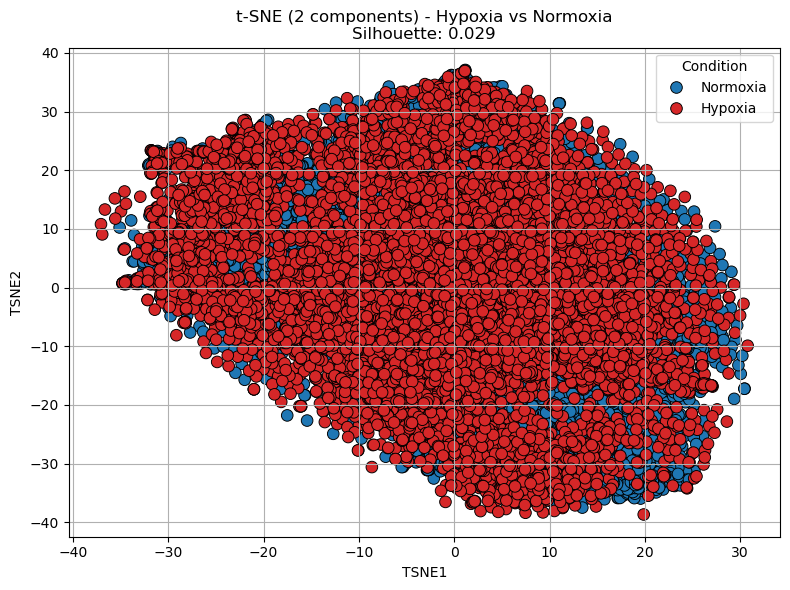

In [173]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200)
X_tsne = tsne.fit_transform(X)

df["TSNE1"] = X_tsne[:, 0]
df["TSNE2"] = X_tsne[:, 1]

true_labels = df["Condition"].map({"Hypoxia": 0, "Normoxia": 1})

silhouette_tsne = silhouette_score(X_tsne, true_labels)

plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=df,
    x="TSNE1", y="TSNE2",
    hue="Condition",
    palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
    edgecolor="black",
    s=70
)
plt.title(f"t-SNE (2 components) - Hypoxia vs Normoxia\nSilhouette: {silhouette_tsne:.3f}")
plt.grid(True)
plt.tight_layout()
plt.show()




The 2D t-SNE projection appears quite messy, and the very low silhouette score suggests that the data points are not well-separated. 

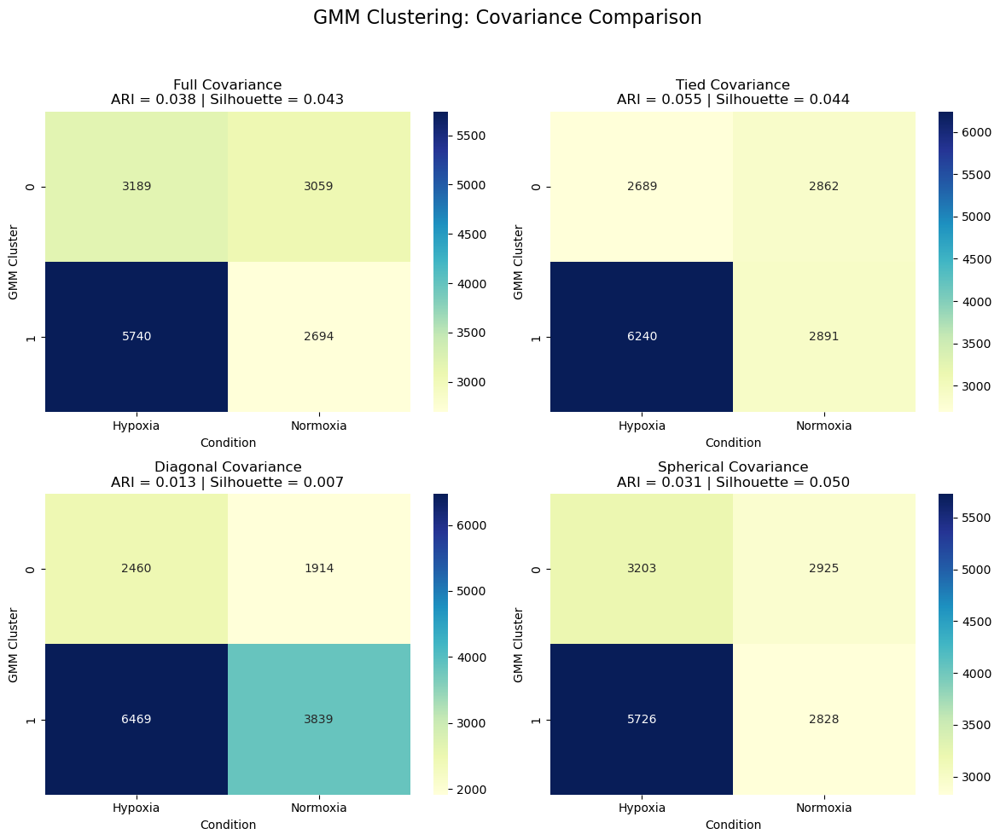

In [174]:
cov_types = ['full', 'tied', 'diag', 'spherical']
titles = ['Full Covariance', 'Tied Covariance', 'Diagonal Covariance', 'Spherical Covariance']

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]

for ax, cov_type, title in zip(axes.ravel(), cov_types, titles):
    gm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gm.fit(X)
    cluster_labels = gm.predict(X)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
  
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X, cluster_labels)

    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("GMM Cluster")

plt.suptitle("GMM Clustering: Covariance Comparison", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



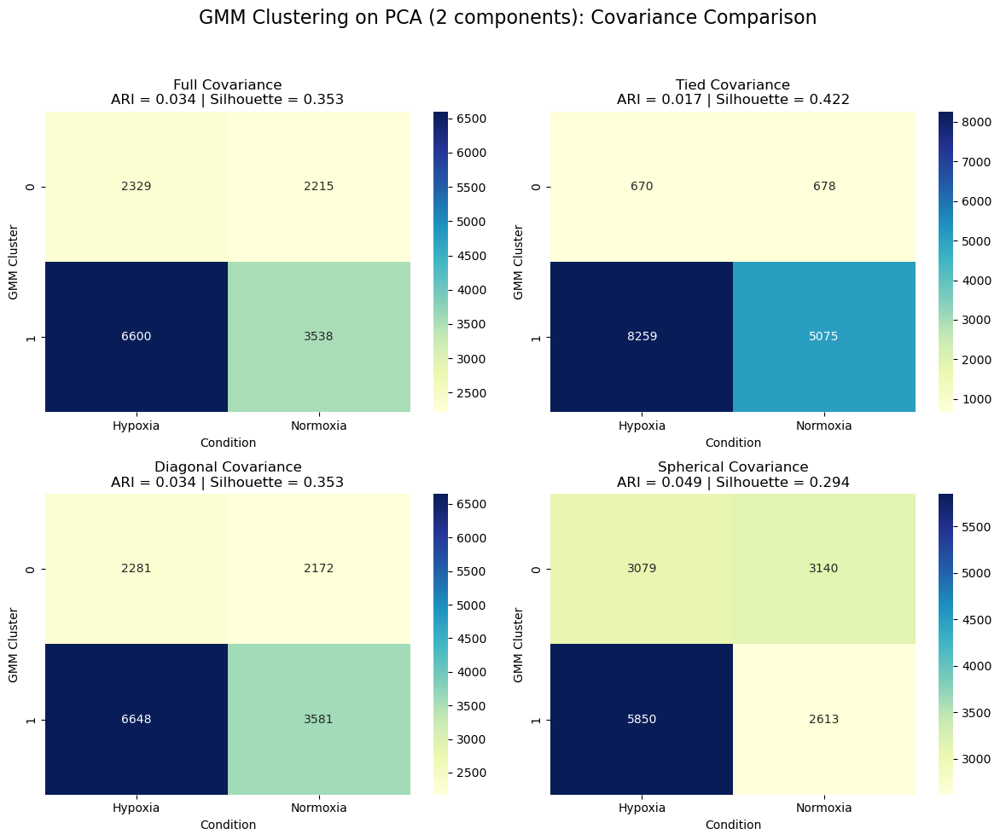

In [175]:
cov_types = ['full', 'tied', 'diag', 'spherical']
titles = ['Full Covariance', 'Tied Covariance', 'Diagonal Covariance', 'Spherical Covariance']

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]

for ax, cov_type, title in zip(axes.ravel(), cov_types, titles):
    gm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gm.fit(X_pca2)
    cluster_labels = gm.predict(X_pca2)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
   
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X_pca2, cluster_labels)

    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("GMM Cluster")

plt.suptitle("GMM Clustering on PCA (2 components): Covariance Comparison", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


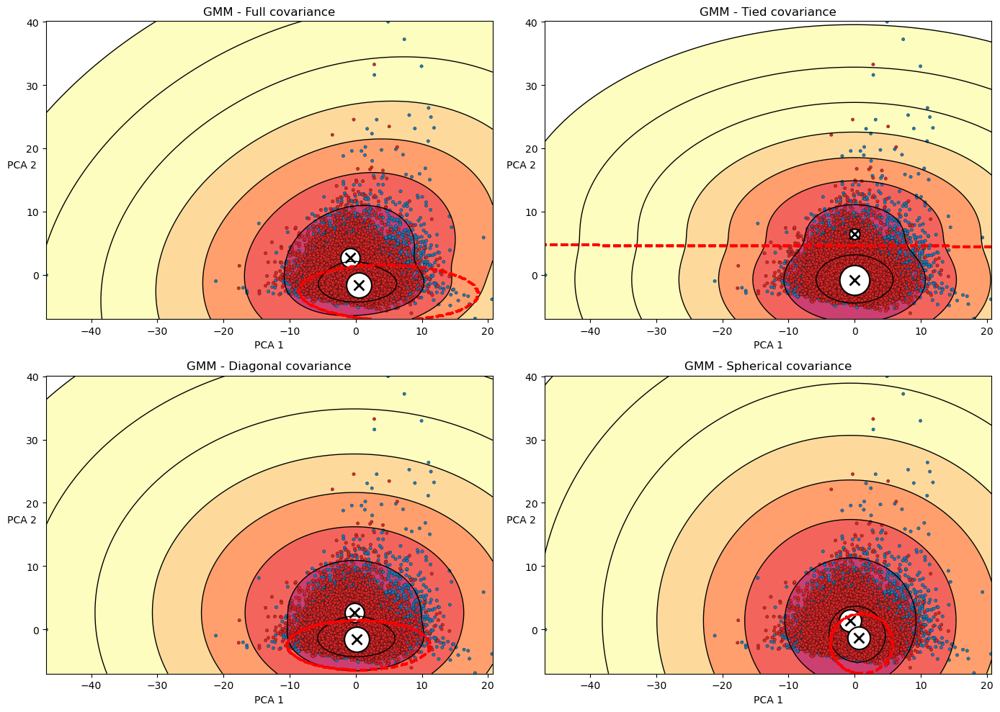

In [176]:
gm = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gm.fit(X_pca2)
cluster_labels = gm.predict(X_pca2)
cluster_probs = gm.predict_proba(X_pca2)[:, 0]  


def plot_centroids(centroids, weights, circle_color='w', cross_color='k'):
    for i, (centroid, weight) in enumerate(zip(centroids, weights)):
        plt.scatter(*centroid, s=1000 * weight, marker='o',
                    edgecolor='black', facecolor=circle_color, linewidth=1.5)
        plt.scatter(*centroid, marker='x', color=cross_color, s=100, linewidths=2)

def plot_gaussian_mixture(clusterer, X, labels=None, probs=None, palette=None, resolution=300, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    
    Z = -clusterer.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z, norm=LogNorm(vmin=1.0, vmax=30.0),
                 levels=np.logspace(0, 2, 12), cmap='magma')

    plt.contour(xx, yy, Z, norm=LogNorm(vmin=1.0, vmax=30.0),
                levels=np.logspace(0, 2, 12), linewidths=1, colors='k')
    
    Z_pred = clusterer.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
    plt.contour(xx, yy, Z_pred, linewidths=2, colors='red', linestyles='dashed')

    if probs is not None:
        plt.scatter(X[:, 0], X[:, 1], c=probs, cmap='coolwarm', s=10, edgecolor='k', linewidth=0.2)
    elif labels is not None and palette is not None:
        point_colors = [palette[label] for label in labels]
        plt.scatter(X[:, 0], X[:, 1], c=point_colors, s=10, edgecolor='k', linewidth=0.2)
    elif labels is not None:
        plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='Set1', s=10, edgecolor='k', linewidth=0.2)
    else:
        plt.plot(X[:, 0], X[:, 1], 'k.', markersize=3)

    
    plot_centroids(clusterer.means_, clusterer.weights_)

    plt.xlabel("PCA 1")
    if show_ylabels:
        plt.ylabel("PCA 2", rotation=0)
    else:
        plt.tick_params(labelleft=False)

true_labels_str = df["Condition"]  
palette = {"Hypoxia": "#d62728", "Normoxia": "#1f77b4"}
true_labels_colors = true_labels_str.map(palette).values

true_labels = true_labels_str.map({"Hypoxia": 0, "Normoxia": 1}).values


cov_types = ['full', 'tied', 'diag', 'spherical']
titles = ['Full covariance', 'Tied covariance', 'Diagonal covariance', 'Spherical covariance']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.ravel()

for i, cov_type in enumerate(cov_types):
    gm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gm.fit(X_pca2)
    
    plt.sca(axes[i])
    plot_gaussian_mixture(gm, X_pca2, labels=true_labels_str.values, palette=palette)
    plt.title(f"GMM - {titles[i]}")

plt.tight_layout()
plt.show()


Regardless of the covariance type, the ARI remains low both when GMM is applied to the full dataset and to the PCA-transformed space, indicating that the clusters do not align with the hypoxia/normoxia labels.
This is confirmed by the contingency matrix, that shows a poor correspondence with the true labels, confirming that the clustering structure found by GMM does not reflect the biological distinction between the two conditions.
The silhouette score improves after applying PCA, suggesting that the clusters become more geometrically compact, but still confusing. 

In [177]:
found = False
for eps in np.arange(0.1, 5.0, 0.25):
    dbscan = DBSCAN(eps=eps, min_samples=2)
    db_labels = dbscan.fit_predict(X)
    n_clusters = len(set(db_labels)) - (1 if -1 in db_labels else 0)
    if n_clusters == 2:
        found = True
        print(f"✅ 2 cluster found with eps={eps:.2f}")
        break

if not found:
    print("❌ No clusters found with 2 groups")



❌ No clusters found with 2 groups


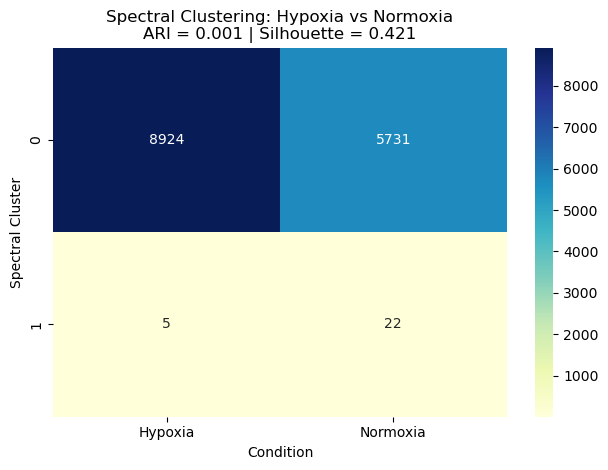

In [178]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
df["Cluster"] = spectral.fit_predict(X)

contingency = pd.crosstab(df["Cluster"], df["Condition"])


ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"Spectral Clustering: Hypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("Spectral Cluster")
plt.tight_layout()
plt.show()



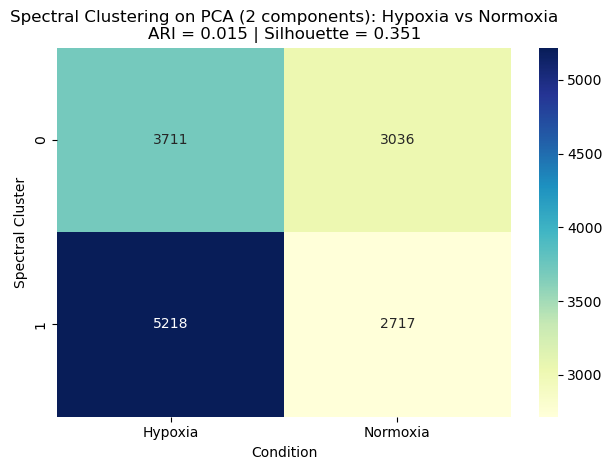

In [179]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
df["Cluster"] = spectral.fit_predict(X_pca2)

contingency = pd.crosstab(df["Cluster"], df["Condition"])


ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X_pca2, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"Spectral Clustering on PCA (2 components): Hypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("Spectral Cluster")
plt.tight_layout()
plt.show()

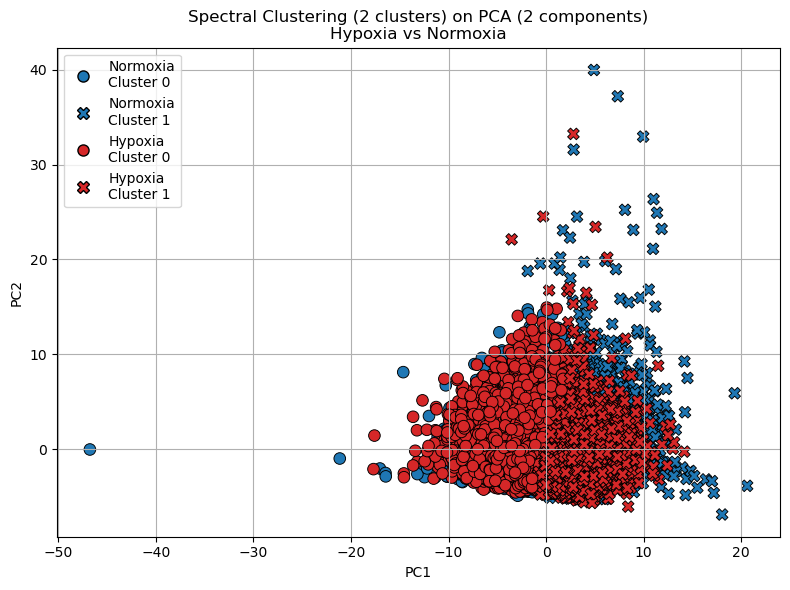

In [180]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
cluster_labels = spectral.fit_predict(X_pca2)
df["Cluster"] = cluster_labels

fig, ax = plt.subplots(figsize=(8, 6))


sns.scatterplot(
    x=X_pca2[:, 0],
    y=X_pca2[:, 1],
    hue=df["Condition"],
    style=df["Cluster"],
    palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
    edgecolor="black",
    s=70,
    ax=ax,
    legend=False 
)

ax.set_title("Spectral Clustering (2 clusters) on PCA (2 components)\nHypoxia vs Normoxia")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.grid(True)

color_map = {"Normoxia": "#1f77b4", "Hypoxia": "#d62728"}
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Normoxia\nCluster 0',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Normoxia\nCluster 1',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Hypoxia\nCluster 0',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Hypoxia\nCluster 1',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
]

ax.legend(handles=legend_elements, loc="upper left", fontsize=10)

plt.tight_layout()
plt.show()

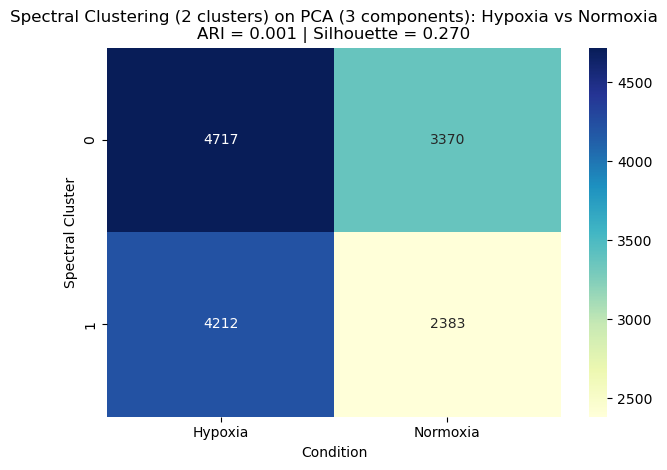

In [181]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
df["Cluster"] = spectral.fit_predict(X_pca3)

contingency = pd.crosstab(df["Cluster"], df["Condition"])


ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X_pca3, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"Spectral Clustering (2 clusters) on PCA (3 components): Hypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("Spectral Cluster")
plt.tight_layout()
plt.show()

Spectral Clustering applied to the PCA 2D and 3D space yields a moderate silhouette score, which suggests a certain level of geometric separation.
However, the clusters appear visually entangled in the PCA 2D space, and the separation does not seem to reflect a meaningful distinction between hypoxic and normoxic cells.

### MCF7 - SMART SEQ

In [182]:
df = pd.read_csv("MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt",  sep=r"\s+", engine="python", index_col=0)
print("Dataframe dimensions:", np.shape(df))

Dataframe dimensions: (3000, 250)


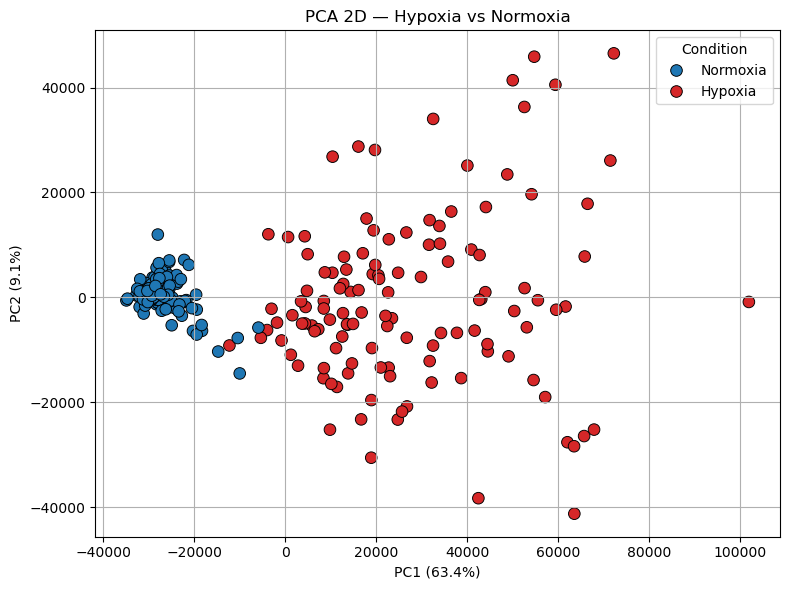

In [183]:
#PCA on 2 components
df.index = df.index.str.replace('"', '', regex=False).str.strip()
df.columns = df.columns.str.replace('"', '', regex=False).str.strip()

metadata_df = pd.DataFrame({"OriginalName": df.columns})
metadata_df["Condition"] = metadata_df["OriginalName"].str.extract(r'_(Norm|Hypo)_')
metadata_df["Condition"] = metadata_df["Condition"].replace({"Norm": "Normoxia", "Hypo": "Hypoxia"})
metadata_df["SampleID"] = metadata_df["OriginalName"].str.extract(r'_(S\d+)_')

col_mapping = dict(zip(metadata_df["OriginalName"], metadata_df["SampleID"]))
df = df.rename(columns=col_mapping)


df = df.T


df["Condition"] = df.index.map(dict(zip(metadata_df["SampleID"], metadata_df["Condition"])))


X = df.drop(columns=["Condition"])
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X)


df["PC1"] = pca_result[:, 0]
df["PC2"] = pca_result[:, 1]


plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=df,
    x="PC1",
    y="PC2",
    hue="Condition",
    palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
    edgecolor="black",
    s=70
)
plt.title("PCA 2D — Hypoxia vs Normoxia")
plt.grid(True)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
plt.tight_layout()
plt.show()



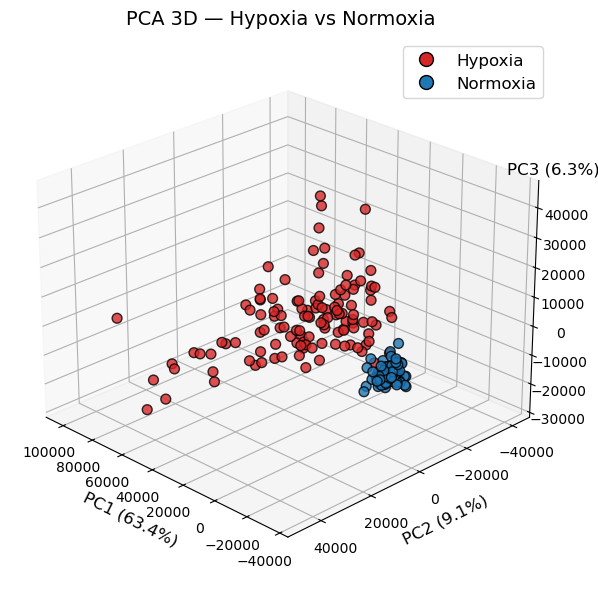

In [184]:
pca_3d = PCA(n_components=3)
pca_result = pca_3d.fit_transform(X)

df["PC1"] = pca_result[:, 0]
df["PC2"] = pca_result[:, 1]
df["PC3"] = pca_result[:, 2]

color_map = {"Hypoxia": "#d62728", "Normoxia": "#1f77b4"}
colors = df["Condition"].map(color_map)

fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(df["PC1"], df["PC2"], df["PC3"], 
                c=colors, edgecolor='black', s=50, alpha=0.8)

ax.set_xlabel(f"PC1 ({pca_3d.explained_variance_ratio_[0]*100:.1f}%)", fontsize=12)
ax.set_ylabel(f"PC2 ({pca_3d.explained_variance_ratio_[1]*100:.1f}%)", fontsize=12)

ax.text(
    x=df["PC1"].min(), 
    y=df["PC2"].min(), 
    z=df["PC3"].max() + 7500, 
    s=f"PC3 ({pca_3d.explained_variance_ratio_[2]*100:.1f}%)",
    fontsize=12,
    color="black"
)

ax.set_title("PCA 3D — Hypoxia vs Normoxia", fontsize=14, pad=10)

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Hypoxia',
           markerfacecolor=color_map["Hypoxia"], markersize=10, markeredgecolor='black'),
    Line2D([0], [0], marker='o', color='w', label='Normoxia',
           markerfacecolor=color_map["Normoxia"], markersize=10, markeredgecolor='black')
]
ax.legend(handles=legend_elements, loc='upper right', fontsize=12)

ax.view_init(elev=25, azim=135)

plt.tight_layout()
plt.show()




PCA reveals a clear separation between hypoxic and normoxic cells in both two and three dimensions, suggesting that the biological condition is captured by the principal components.

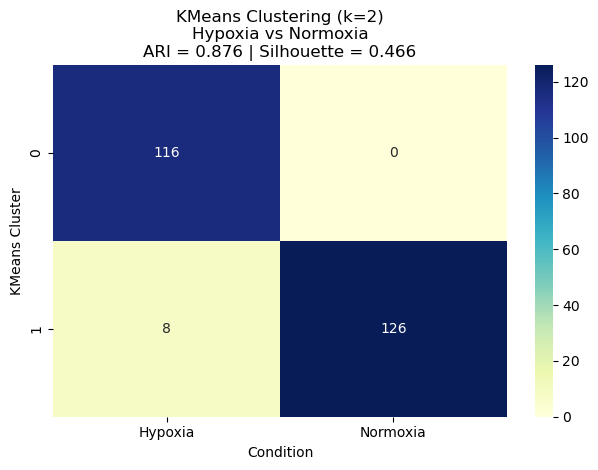

In [185]:
# KMeans clustering (k=2)
kmeans = KMeans(n_clusters=2, random_state=42)
df["Cluster"] = kmeans.fit_predict(X)

ari = adjusted_rand_score(df["Condition"], df["Cluster"])

silhouette = silhouette_score(X, df["Cluster"])

contingency = pd.crosstab(df["Cluster"], df["Condition"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"KMeans Clustering (k=2)\nHypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("KMeans Cluster")
plt.tight_layout()
plt.show()


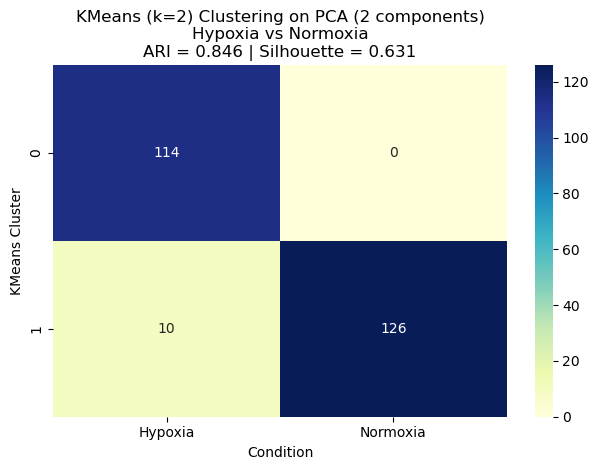

In [186]:
X_pca2 = df[["PC1", "PC2"]].values  

kmeans = KMeans(n_clusters=2, random_state=42)
df["Cluster"] = kmeans.fit_predict(X_pca2)

contingency = pd.crosstab(df["Cluster"], df["Condition"])

ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X_pca2, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"KMeans (k=2) Clustering on PCA (2 components)\nHypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("KMeans Cluster")
plt.tight_layout()
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


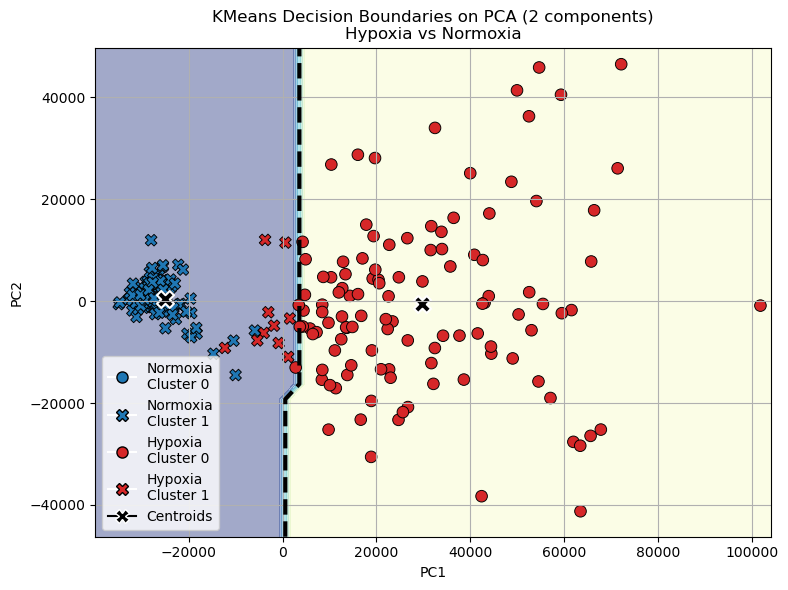

In [187]:
# KMeans clustering su PCA-2D
df["Cluster"] = kmeans.fit_predict(df[["PC1", "PC2"]])

margin = 5000
h = 3000
x_min, x_max = df["PC1"].min() - margin, df["PC1"].max() + margin
y_min, y_max = df["PC2"].min() - margin, df["PC2"].max() + margin
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
grid_points = np.c_[xx.ravel(), yy.ravel()]
Z = kmeans.predict(grid_points).reshape(xx.shape)


fig, ax = plt.subplots(figsize=(8, 6))


ax.contourf(xx, yy, Z, alpha=0.4, cmap="YlGnBu")
ax.contour(xx, yy, Z, levels=[0.5], colors='k', linewidths=3, linestyles='--')

sns.scatterplot(
    data=df,
    x="PC1", y="PC2",
    hue="Condition",
    style="Cluster",
    palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
    edgecolor='black',
    s=70,
    ax=ax
)

ax.scatter(
    kmeans.cluster_centers_[:, 0],
    kmeans.cluster_centers_[:, 1],
    c='black',
    s=150,
    marker='X',
    edgecolor='white',
    linewidth=1.5,
    label='Centroids'
)


ax.set_title("KMeans Decision Boundaries on PCA (2 components)\nHypoxia vs Normoxia")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.grid(True)

color_map = {"Normoxia": "#1f77b4", "Hypoxia": "#d62728"}
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Normoxia\nCluster 0',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Normoxia\nCluster 1',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Hypoxia\nCluster 0',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Hypoxia\nCluster 1',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='black', label='Centroids',
           markerfacecolor='black', markeredgecolor='white', markersize=10)
]
ax.legend(handles=legend_elements, loc="lower left", fontsize=10)

plt.tight_layout()
plt.show()


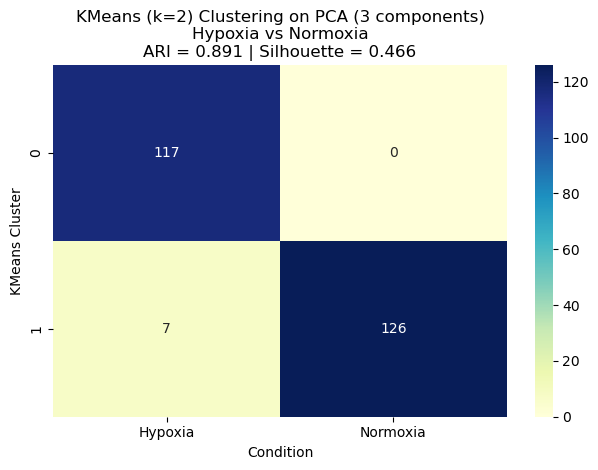

In [188]:
X_pca3 = df[["PC1", "PC2", "PC3"]].values  

kmeans = KMeans(n_clusters=2, random_state=42)
df["Cluster"] = kmeans.fit_predict(X_pca3)

contingency = pd.crosstab(df["Cluster"], df["Condition"])

ari = adjusted_rand_score(df["Condition"], df["Cluster"])

silhouette = silhouette_score(X, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"KMeans (k=2) Clustering on PCA (3 components)\nHypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("KMeans Cluster")
plt.tight_layout()
plt.show()

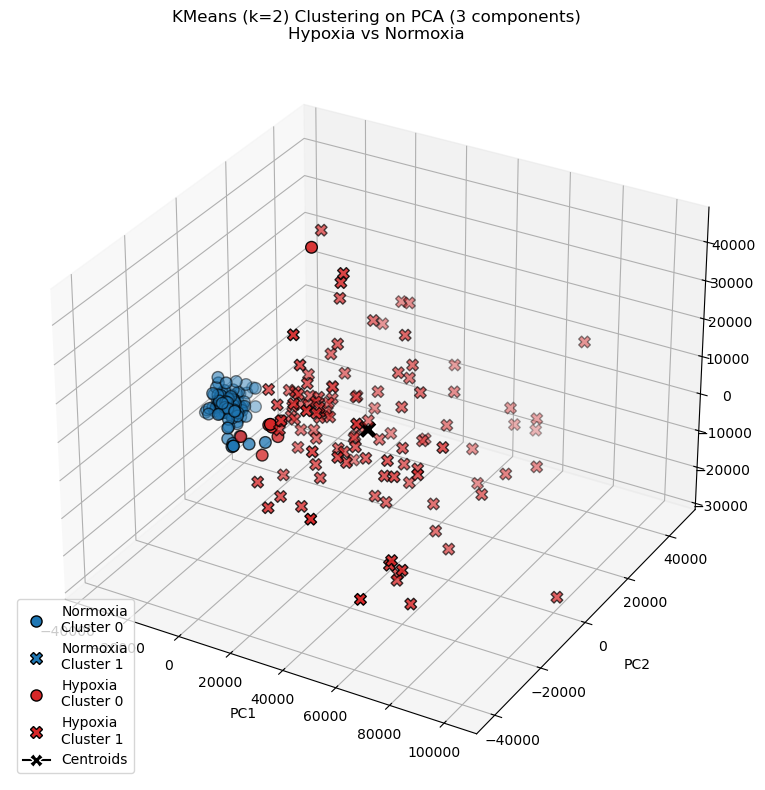

In [189]:
# KMeans clustering on PCA 3D
kmeans = KMeans(n_clusters=2, n_init=10, random_state=42)
df["Cluster"] = kmeans.fit_predict(df[["PC1", "PC2", "PC3"]])


palette = {"Hypoxia": "#d62728", "Normoxia": "#1f77b4"}
markers = {0: "o", 1: "X"}


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for cluster_id in df["Cluster"].unique():
    subset = df[df["Cluster"] == cluster_id]
    ax.scatter(
        subset["PC1"],
        subset["PC2"],
        subset["PC3"],
        s=70,
        c=subset["Condition"].map(palette),
        edgecolor='black',
        marker=markers[cluster_id]
    )


centroids = kmeans.cluster_centers_
ax.scatter(
    centroids[:, 0],
    centroids[:, 1],
    centroids[:, 2],
    c='black',
    s=200,
    marker='X',
    edgecolor='white',
    linewidth=1.5
)


color_map = {"Normoxia": "#1f77b4", "Hypoxia": "#d62728"}
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Normoxia\nCluster 0',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Normoxia\nCluster 1',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Hypoxia\nCluster 0',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Hypoxia\nCluster 1',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='black', label='Centroids',
           markerfacecolor='black', markeredgecolor='white', markersize=10)
]
ax.legend(handles=legend_elements, loc="lower left", fontsize=10)


ax.set_xlabel("PC1")
ax.set_ylabel("PC2", labelpad=10)
ax.set_zlabel("PC3", labelpad=20)
ax.set_title("KMeans (k=2) Clustering on PCA (3 components)\nHypoxia vs Normoxia")

plt.tight_layout()
plt.show()




As in the previous case, the K-Means algorithm also yields a clear separation between hypoxic and normoxic cells.
This is already evident from the contingency table, where each cluster is predominantly associated with one biological condition.
The result is further supported by the high ARI and silhouette scores, suggesting that the clusters are both geometrically well-defined and biologically meaningful.


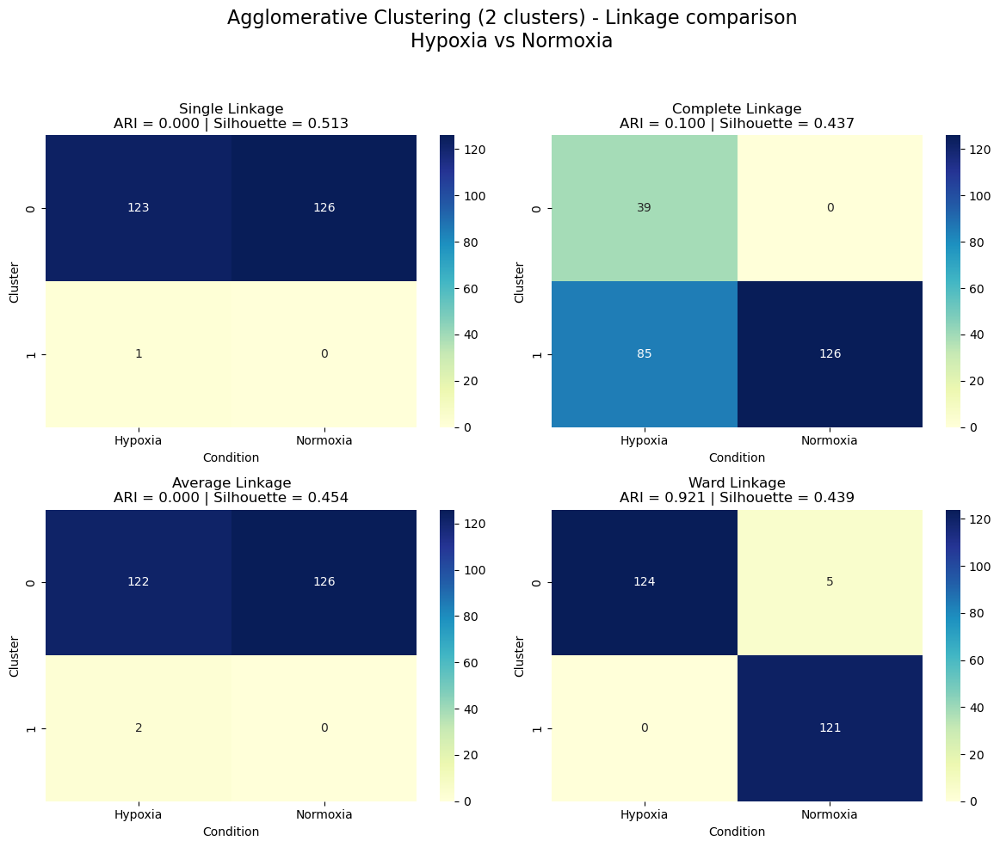

In [190]:
linkages = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]

for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X, cluster_labels)
    
    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("Cluster")

plt.suptitle("Agglomerative Clustering (2 clusters) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


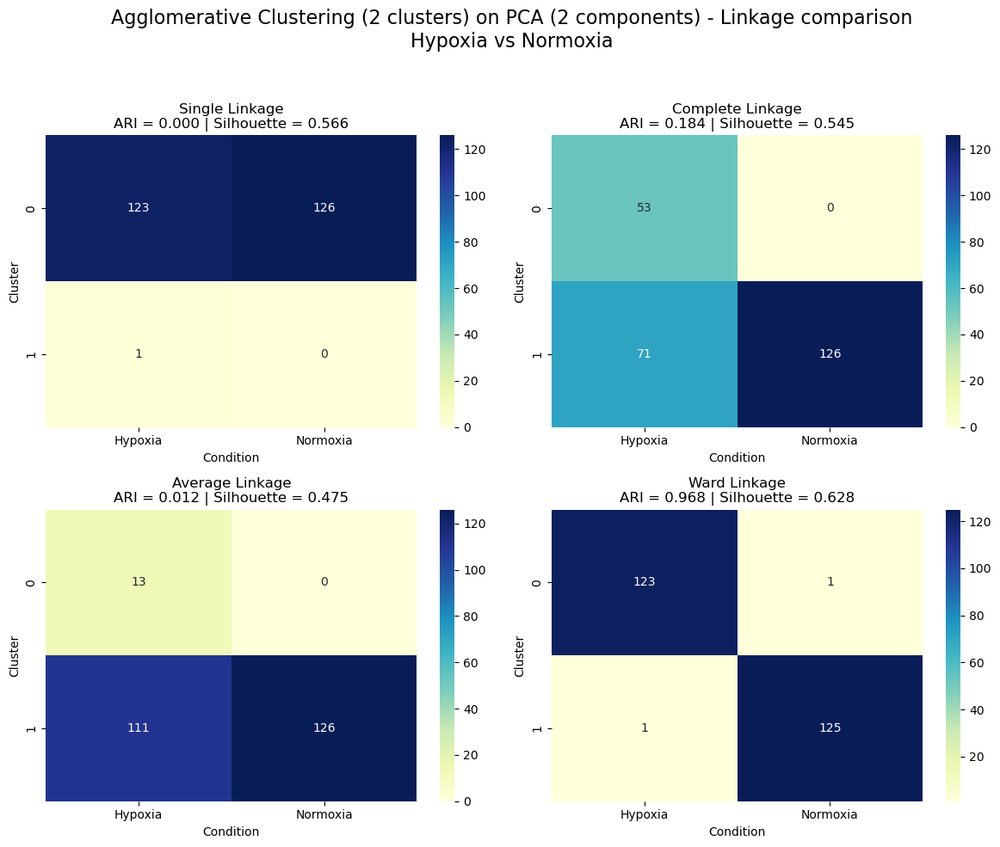

In [191]:
linkages = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]


for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca2)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
   
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X_pca2, cluster_labels)
    
    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("Cluster")

plt.suptitle("Agglomerative Clustering (2 clusters) on PCA (2 components) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



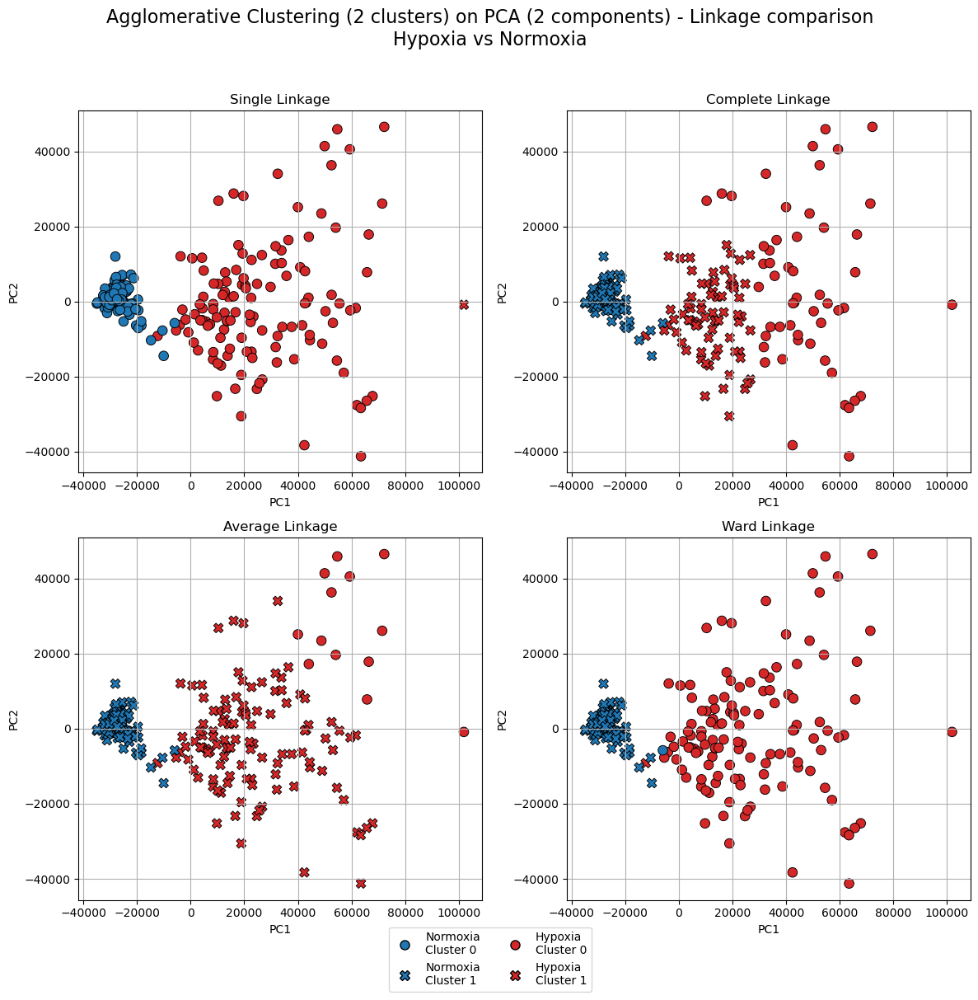

In [192]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca2)

    temp_df = pd.DataFrame(X_pca2, columns=["PC1", "PC2"])
    temp_df["Condition"] = df["Condition"].values
    temp_df["Cluster"] = cluster_labels

    sns.scatterplot(
        data=temp_df,
        x="PC1", y="PC2",
        hue="Condition",
        style="Cluster",
        palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
        edgecolor="black",
        s=70,
        ax=ax,
        legend=False 
    )

    ax.set_title(title)
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.grid(True)

color_map = {"Normoxia": "#1f77b4", "Hypoxia": "#d62728"}
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Normoxia\nCluster 0',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Normoxia\nCluster 1',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Hypoxia\nCluster 0',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Hypoxia\nCluster 1',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
]

fig.legend(handles=legend_elements, loc='lower center', ncol=2, fontsize=10, bbox_to_anchor=(0.5, -0.02))

plt.suptitle("Agglomerative Clustering (2 clusters) on PCA (2 components) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) 
plt.show()




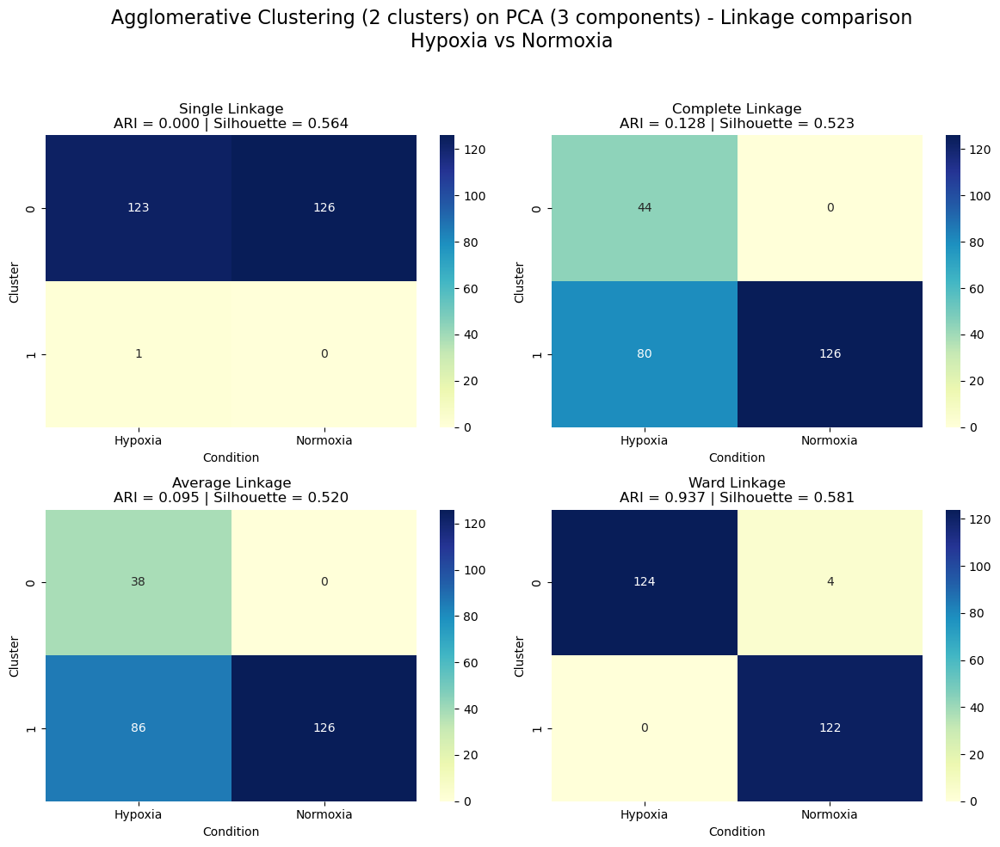

In [193]:
linkages = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]


for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca3)
    
   
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X_pca3, cluster_labels)
    
    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("Cluster")

plt.suptitle("Agglomerative Clustering (2 clusters) on PCA (3 components) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

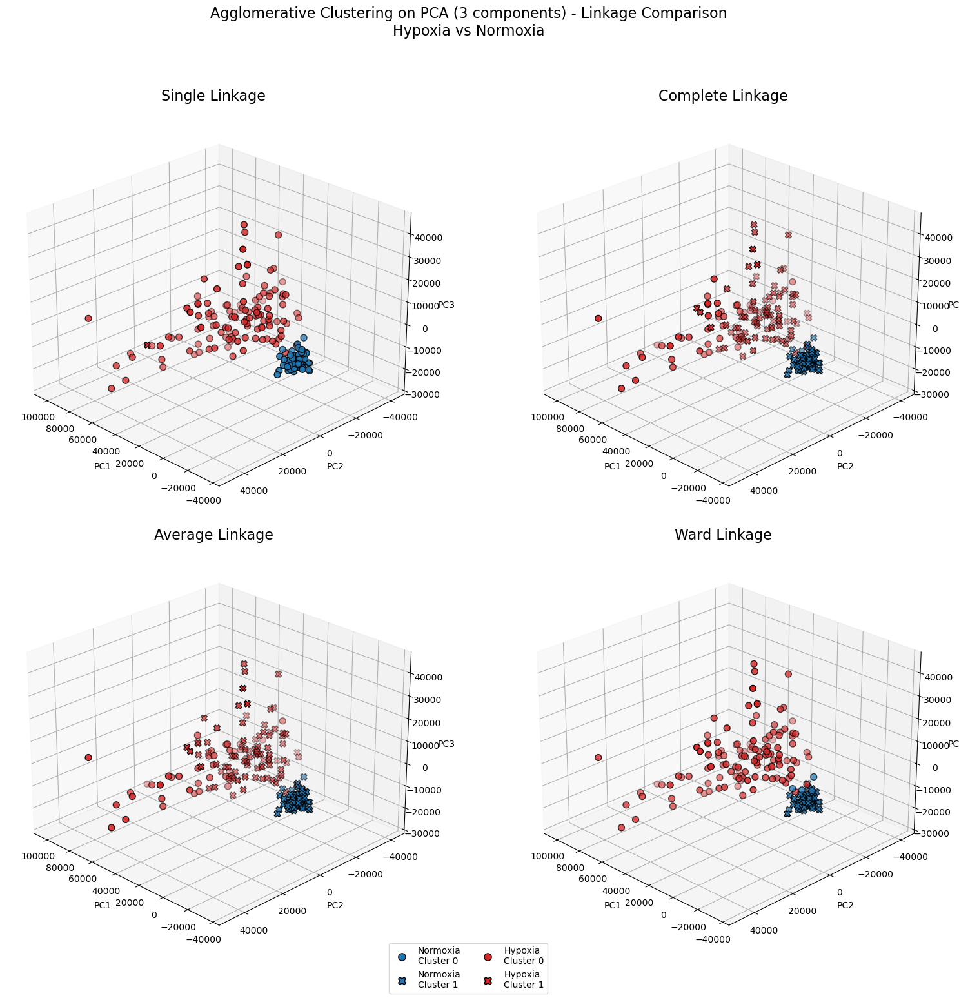

In [194]:
fig = plt.figure(figsize=(16, 16))

for i, (linkage, title) in enumerate(zip(linkages, titles), 1):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca3)

    ax = fig.add_subplot(2, 2, i, projection='3d')

    df["Cluster"] = cluster_labels
    colors = df["Condition"].map({"Hypoxia": "#d62728", "Normoxia": "#1f77b4"})
    markers = {0: 'o', 1: 'X'}

    for cluster_id in [0, 1]:
        mask = cluster_labels == cluster_id
        ax.scatter(
            X_pca3[mask, 0],
            X_pca3[mask, 1],
            X_pca3[mask, 2],
            c=colors[mask],
            marker=markers[cluster_id],
            s=50,
            edgecolor='black'
        )

    ax.set_title(f"{title}", loc='center', pad=0, fontsize=16)
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")
    ax.view_init(elev=25, azim=135)


color_map = {"Normoxia": "#1f77b4", "Hypoxia": "#d62728"}
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Normoxia\nCluster 0',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Normoxia\nCluster 1',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Hypoxia\nCluster 0',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Hypoxia\nCluster 1',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
]

fig.legend(handles=legend_elements, loc='lower center', ncol=2, fontsize=10, bbox_to_anchor=(0.5, 0.02))

plt.suptitle("Agglomerative Clustering on PCA (3 components) - Linkage Comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()


We observe that across all dimensions, the single, complete, and average linkage criteria in Agglomerative Clustering often struggle to separate the data into two distinct clusters, while the ward linkage produces more structured groupings, where each cluster is predominantly associated with one biological condition.
The silhouette score is reasonably high for all linkage types, indicating that the clusters are internally well-defined from a geometric perspective.
Interestingly, in the first three cases, hypoxic and normoxic cells remain mixed, and the ARI score stays close to zero, suggesting that the clustering structure does not correspond to the biological labels.
In contrast, ward linkage achieves a good alignment with the labels, as shown by a very high ARI.
This suggests that while all linkage methods can produce geometrically coherent clusters, only ward linkage captures a biologically meaningful separation between hypoxic and normoxic conditions.

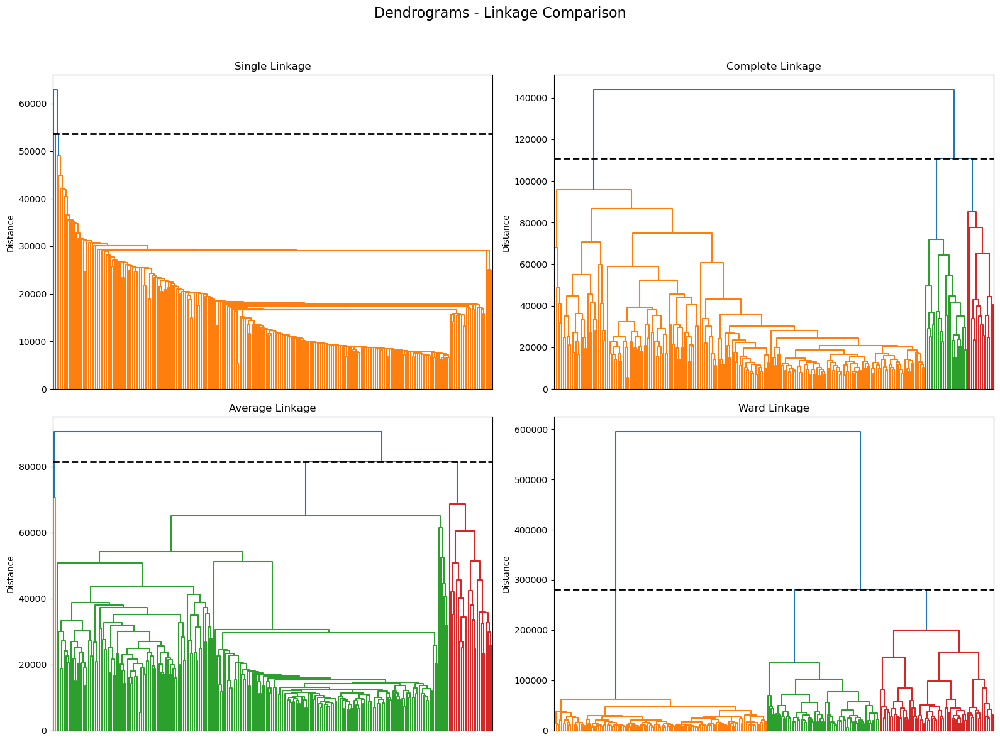

In [195]:
from scipy.cluster.hierarchy import linkage, dendrogram

linkage_methods = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

for ax, method, title in zip(axes.ravel(), linkage_methods, titles):
    Z = linkage(X, method=method)

    cut_height = Z[-2, 2]

    dendrogram(
        Z,
        ax=ax,
        color_threshold=cut_height,
        leaf_rotation=90,
        leaf_font_size=6,
        no_labels=True
    )

    ax.axhline(y=cut_height, color='black', linestyle='--', linewidth=2)
    ax.set_title(title, pad=6)
    ax.set_xticks([])
    ax.set_xlabel("")
    ax.set_ylabel("Distance")

plt.suptitle("Dendrograms - Linkage Comparison", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



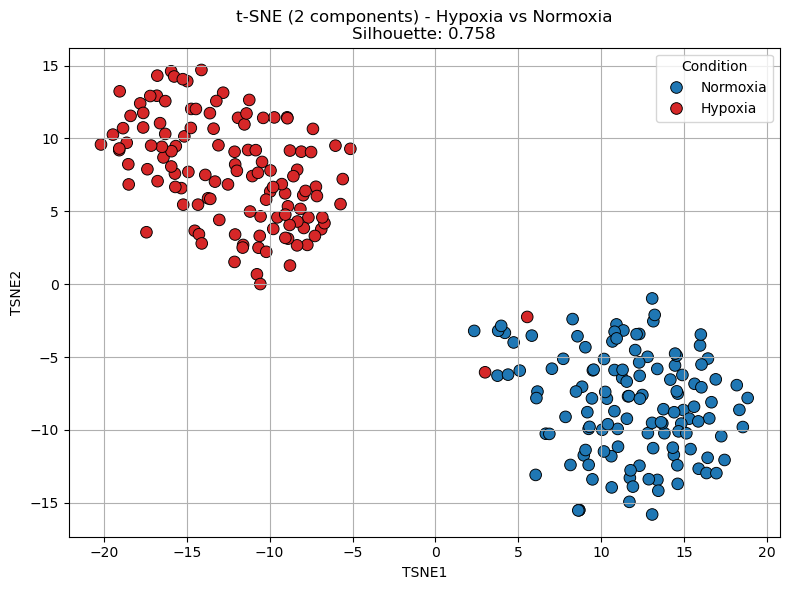

In [196]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200)
X_tsne = tsne.fit_transform(X)

df["TSNE1"] = X_tsne[:, 0]
df["TSNE2"] = X_tsne[:, 1]

true_labels = df["Condition"].map({"Hypoxia": 0, "Normoxia": 1})

silhouette_tsne = silhouette_score(X_tsne, true_labels)

plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=df,
    x="TSNE1", y="TSNE2",
    hue="Condition",
    palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
    edgecolor="black",
    s=70
)
plt.title(f"t-SNE (2 components) - Hypoxia vs Normoxia\nSilhouette: {silhouette_tsne:.3f}")
plt.grid(True)
plt.tight_layout()
plt.show()





/opt/anaconda3/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


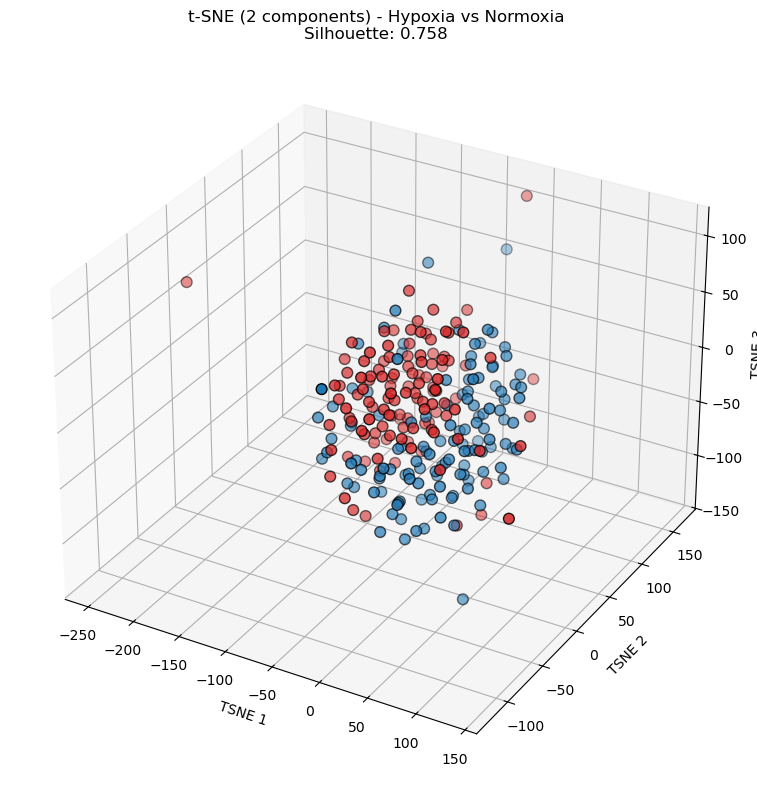

In [197]:
tsne = TSNE(n_components=3, random_state=42, perplexity=30, learning_rate=200,
            n_iter=500, init='pca', method='barnes_hut')
X_tsne_3d = tsne.fit_transform(X)


df["TSNE1"] = X_tsne_3d[:, 0]
df["TSNE2"] = X_tsne_3d[:, 1]
df["TSNE3"] = X_tsne_3d[:, 2]


fig = plt.figure(figsize=(20, 8))
ax = fig.add_subplot(111, projection='3d')
colors = df["Condition"].map({"Hypoxia": "#d62728", "Normoxia": "#1f77b4"})
silhouette_tsne = silhouette_score(X_tsne, true_labels)

ax.scatter(df["TSNE1"], df["TSNE2"], df["TSNE3"],
           c=colors,
           s=60,
           edgecolor='black')

plt.title(f"t-SNE (2 components) - Hypoxia vs Normoxia\nSilhouette: {silhouette_tsne:.3f}")
ax.set_xlabel("TSNE 1")
ax.set_ylabel("TSNE 2")
ax.set_zlabel("TSNE 3")
plt.tight_layout()
plt.show()

The 2D t-SNE projection suggests the presence of non-linear structure in the data, as it reveals a visual separation between hypoxic and normoxic cells.
However, this separation does not hold in the 3D t-SNE projection, and the silhouette score is low, indicating that the apparent clustering might be weak.
Therefore, while the 2D visualization is informative, we cannot conclusively claim a non-linear relationship solely based on t-SNE.
This highlights a known limitation of t-SNE: higher-dimensional embeddings do not necessarily improve, and can even reduce, interpretability.

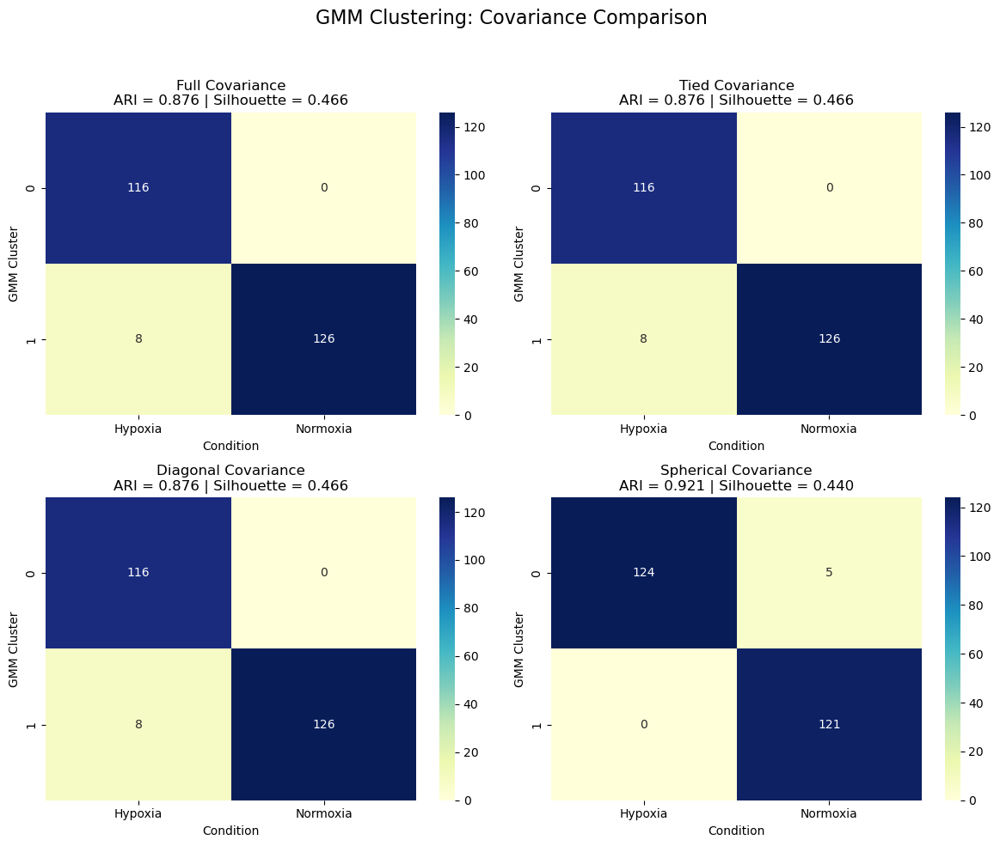

In [198]:
cov_types = ['full', 'tied', 'diag', 'spherical']
titles = ['Full Covariance', 'Tied Covariance', 'Diagonal Covariance', 'Spherical Covariance']

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]

for ax, cov_type, title in zip(axes.ravel(), cov_types, titles):
    gm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gm.fit(X)
    cluster_labels = gm.predict(X)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
  
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X, cluster_labels)

    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("GMM Cluster")

plt.suptitle("GMM Clustering: Covariance Comparison", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


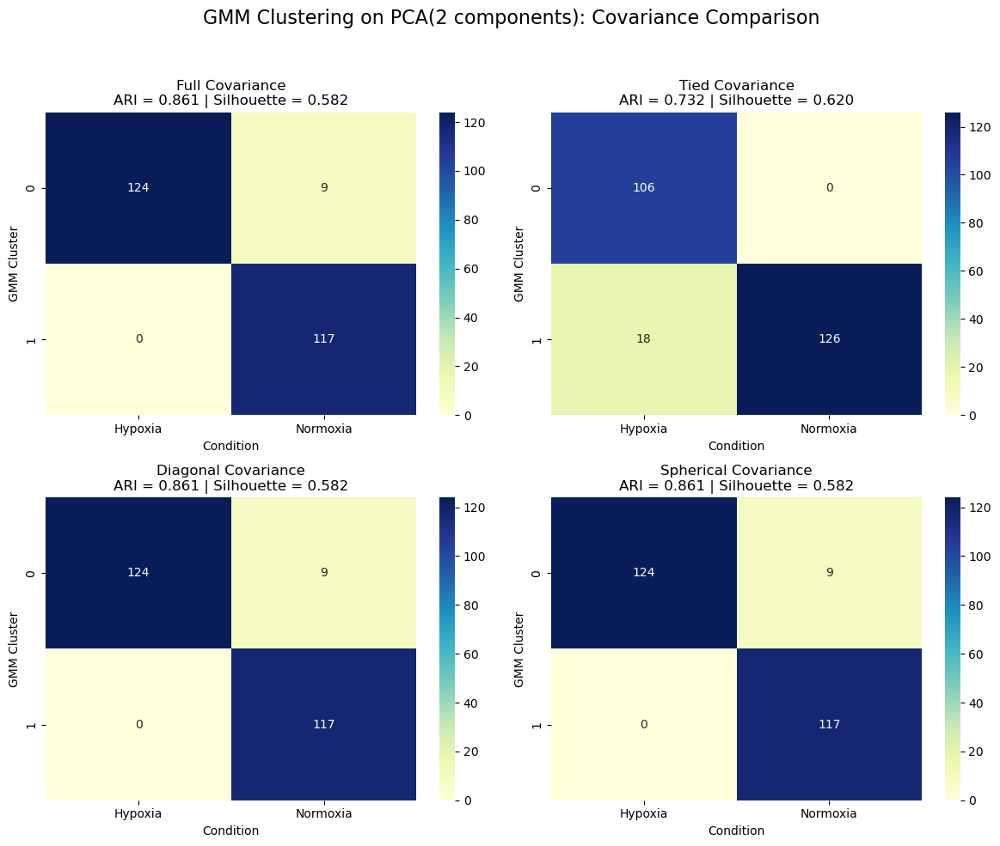

In [199]:
cov_types = ['full', 'tied', 'diag', 'spherical']
titles = ['Full Covariance', 'Tied Covariance', 'Diagonal Covariance', 'Spherical Covariance']

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]

for ax, cov_type, title in zip(axes.ravel(), cov_types, titles):
    gm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gm.fit(X_pca2)
    cluster_labels = gm.predict(X_pca2)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
   
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X_pca2, cluster_labels)

    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("GMM Cluster")

plt.suptitle("GMM Clustering on PCA(2 components): Covariance Comparison", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


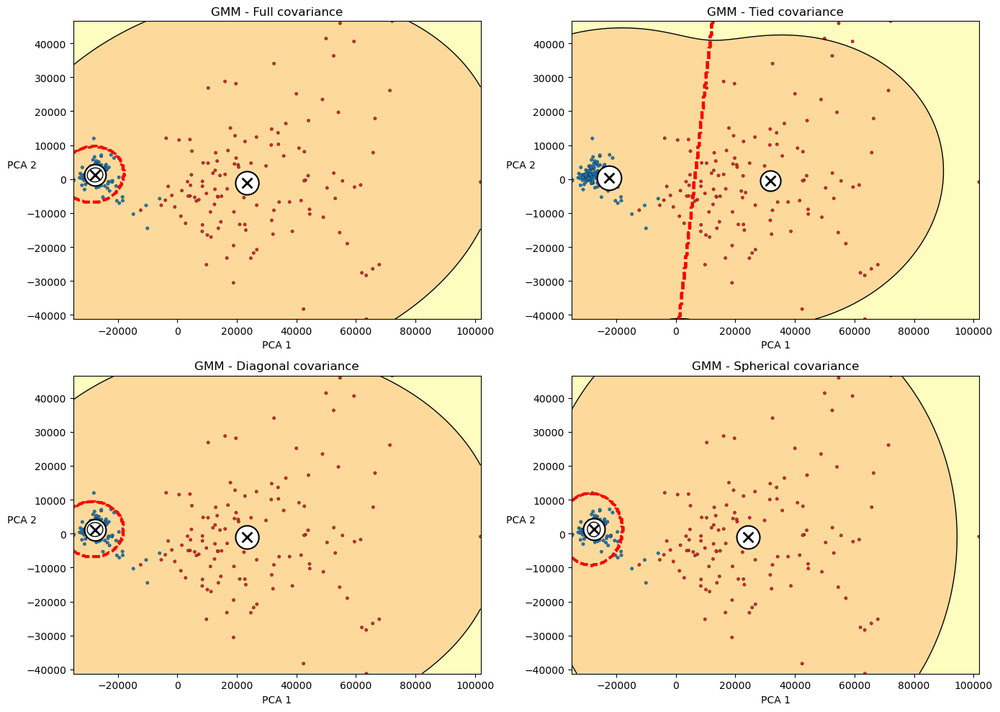

In [200]:
gm = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gm.fit(X_pca2)
cluster_labels = gm.predict(X_pca2)
cluster_probs = gm.predict_proba(X_pca2)[:, 0]  

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from sklearn.mixture import GaussianMixture


def plot_centroids(centroids, weights, circle_color='w', cross_color='k'):
    for i, (centroid, weight) in enumerate(zip(centroids, weights)):
        plt.scatter(*centroid, s=1000 * weight, marker='o',
                    edgecolor='black', facecolor=circle_color, linewidth=1.5)
        plt.scatter(*centroid, marker='x', color=cross_color, s=100, linewidths=2)

def plot_gaussian_mixture(clusterer, X, labels=None, probs=None, palette=None, resolution=300, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    
    Z = -clusterer.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z, norm=LogNorm(vmin=1.0, vmax=30.0),
                 levels=np.logspace(0, 2, 12), cmap='magma')

    plt.contour(xx, yy, Z, norm=LogNorm(vmin=1.0, vmax=30.0),
                levels=np.logspace(0, 2, 12), linewidths=1, colors='k')
    
    Z_pred = clusterer.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
    plt.contour(xx, yy, Z_pred, linewidths=2, colors='red', linestyles='dashed')

    if probs is not None:
        plt.scatter(X[:, 0], X[:, 1], c=probs, cmap='coolwarm', s=10, edgecolor='k', linewidth=0.2)
    elif labels is not None and palette is not None:
        point_colors = [palette[label] for label in labels]
        plt.scatter(X[:, 0], X[:, 1], c=point_colors, s=10, edgecolor='k', linewidth=0.2)
    elif labels is not None:
        plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='Set1', s=10, edgecolor='k', linewidth=0.2)
    else:
        plt.plot(X[:, 0], X[:, 1], 'k.', markersize=3)

    
    plot_centroids(clusterer.means_, clusterer.weights_)

    plt.xlabel("PCA 1")
    if show_ylabels:
        plt.ylabel("PCA 2", rotation=0)
    else:
        plt.tick_params(labelleft=False)

true_labels_str = df["Condition"]  
palette = {"Hypoxia": "#d62728", "Normoxia": "#1f77b4"}
true_labels_colors = true_labels_str.map(palette).values

true_labels = true_labels_str.map({"Hypoxia": 0, "Normoxia": 1}).values


cov_types = ['full', 'tied', 'diag', 'spherical']
titles = ['Full covariance', 'Tied covariance', 'Diagonal covariance', 'Spherical covariance']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.ravel()

for i, cov_type in enumerate(cov_types):
    gm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gm.fit(X_pca2)
    
    plt.sca(axes[i])
    plot_gaussian_mixture(gm, X_pca2, labels=true_labels_str.values, palette=palette)
    plt.title(f"GMM - {titles[i]}")

plt.tight_layout()
plt.show()


Regardless of the covariance type, the contingency matrix shows that each cluster identified by the GMM algorithm is predominantly associated with one biological condition.
This observation is supported by the consistently high ARI scores, both on the full dataset and on the PCA-transformed spaces, indicating a strong alignment between the clustering and the hypoxia/normoxia labels.
The high silhouette score further suggests that the clusters are not only biologically meaningful but also geometrically well-separated.

In [201]:
found = False
for eps in np.arange(0.1, 5.0, 0.25):
    dbscan = DBSCAN(eps=eps, min_samples=2)
    db_labels = dbscan.fit_predict(X)
    n_clusters = len(set(db_labels)) - (1 if -1 in db_labels else 0)
    if n_clusters == 2:
        found = True
        print(f"✅ 2 clusters found with eps={eps:.2f}")
        break

if not found:
    print("❌ No clusters found with 2 groups")



❌ No clusters found with 2 groups


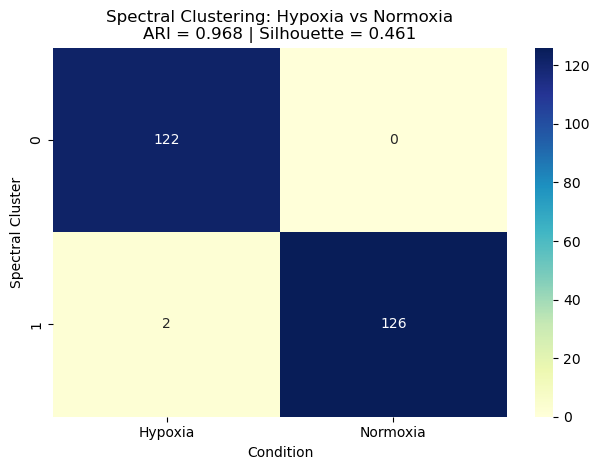

In [202]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
df["Cluster"] = spectral.fit_predict(X)

contingency = pd.crosstab(df["Cluster"], df["Condition"])


ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"Spectral Clustering: Hypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("Spectral Cluster")
plt.tight_layout()
plt.show()


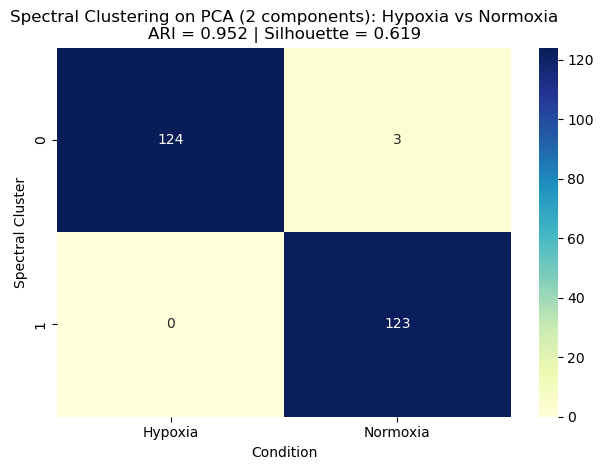

In [203]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
df["Cluster"] = spectral.fit_predict(X_pca2)

contingency = pd.crosstab(df["Cluster"], df["Condition"])


ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X_pca2, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"Spectral Clustering on PCA (2 components): Hypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("Spectral Cluster")
plt.tight_layout()
plt.show()

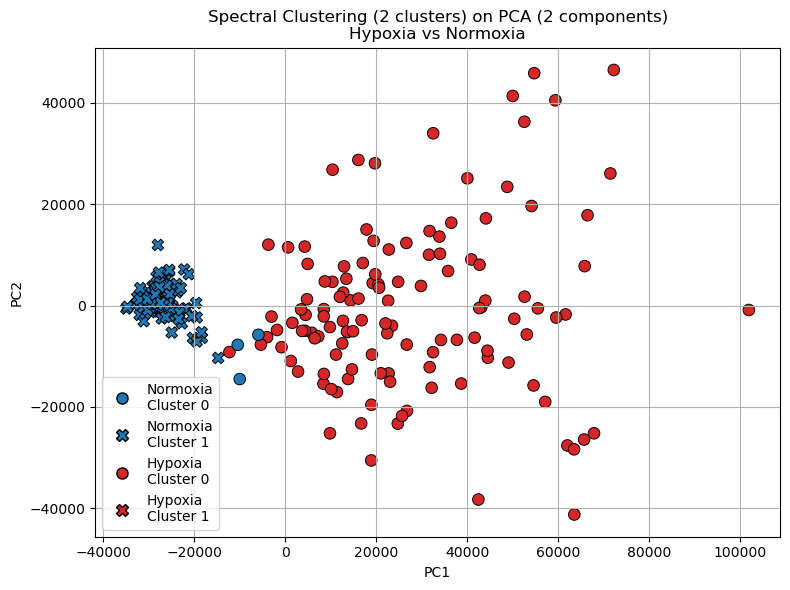

In [204]:

spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
cluster_labels = spectral.fit_predict(X_pca2)
df["Cluster"] = cluster_labels

fig, ax = plt.subplots(figsize=(8, 6))


sns.scatterplot(
    x=X_pca2[:, 0],
    y=X_pca2[:, 1],
    hue=df["Condition"],
    style=df["Cluster"],
    palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
    edgecolor="black",
    s=70,
    ax=ax,
    legend=False  
)

ax.set_title("Spectral Clustering (2 clusters) on PCA (2 components)\nHypoxia vs Normoxia")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.grid(True)

color_map = {"Normoxia": "#1f77b4", "Hypoxia": "#d62728"}
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Normoxia\nCluster 0',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Normoxia\nCluster 1',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Hypoxia\nCluster 0',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Hypoxia\nCluster 1',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
]

ax.legend(handles=legend_elements, loc="lower left", fontsize=10)

plt.tight_layout()
plt.show()


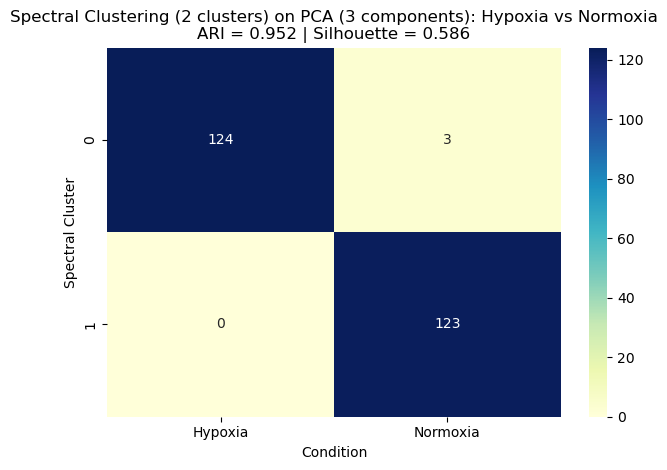

In [205]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
df["Cluster"] = spectral.fit_predict(X_pca3)

contingency = pd.crosstab(df["Cluster"], df["Condition"])


ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X_pca3, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"Spectral Clustering (2 clusters) on PCA (3 components): Hypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("Spectral Cluster")
plt.tight_layout()
plt.show()

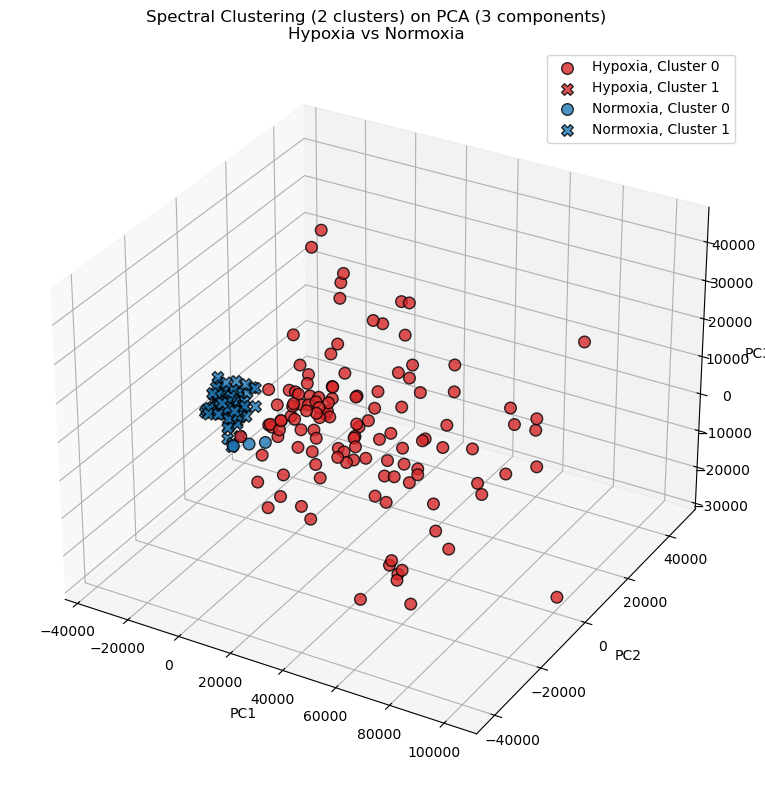

In [206]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
cluster_labels = spectral.fit_predict(X_pca3)

palette = {"Hypoxia": "#d62728", "Normoxia": "#1f77b4"}
markers = {0: "o", 1: "X"}

conditions = df["Condition"].values

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for cond in np.unique(conditions):
    for cluster in np.unique(cluster_labels):
        mask = (conditions == cond) & (cluster_labels == cluster)
        ax.scatter(
            X_pca3[mask, 0],
            X_pca3[mask, 1],
            X_pca3[mask, 2],
            c=palette[cond],
            marker=markers[cluster],
            label=f"{cond}, Cluster {cluster}",
            edgecolor='k',
            s=70,
            alpha=0.8
        )

ax.set_title("Spectral Clustering (2 clusters) on PCA (3 components)\nHypoxia vs Normoxia")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.legend()
plt.tight_layout()
plt.show()

Spectral Clustering achieves consistent results across the full dataset and PCA-reduced spaces, with clusters that closely match the hypoxia and normoxia labels.
This is reflected in the high ARI scores obtained in all configurations, confirming that the method captures the underlying biological separation.
In addition, the silhouette scores indicate that the clusters are also well-formed from a geometric point of view, combining both internal cohesion and external separation.

### MCF7 - DROP SEQ

In [207]:
df = pd.read_csv("MCF7_Filtered_Normalised_3000_Data_train.txt",  sep=r"\s+", engine="python", index_col=0)
print("Dataframe dimensions:", np.shape(df))

Dataframe dimensions: (3000, 21626)


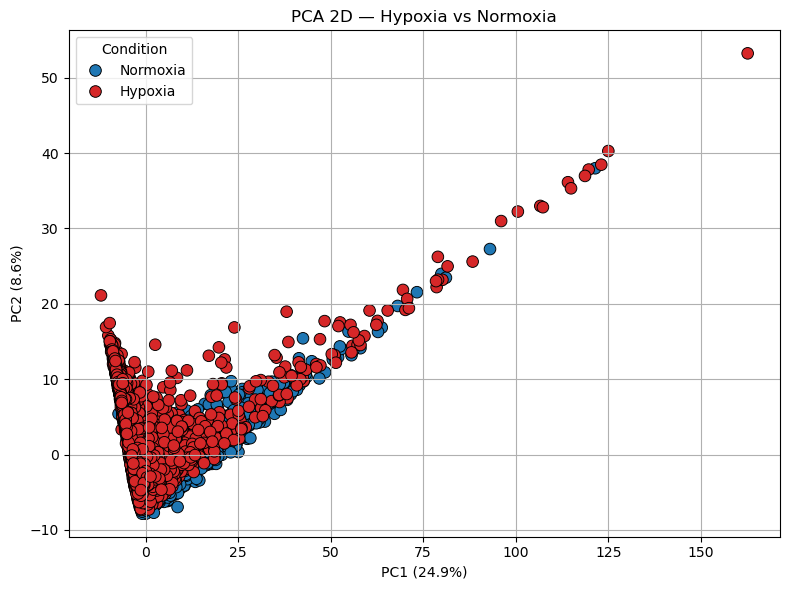

In [208]:
df.index = df.index.str.replace('"', '', regex=False).str.strip()
df.columns = df.columns.str.replace('"', '', regex=False).str.strip()


metadata_df = pd.DataFrame({
    "OriginalName": df.columns
})
metadata_df["Condition"] = metadata_df["OriginalName"].str.extract(r'_(Hypoxia|Normoxia)$')
metadata_df["SampleID"] = metadata_df["OriginalName"].str.replace(r'_(Hypoxia|Normoxia)$', '', regex=True)


col_mapping = dict(zip(metadata_df["OriginalName"], metadata_df["SampleID"]))
df = df.rename(columns=col_mapping)


df = df.T


df["Condition"] = df.index.map(dict(zip(metadata_df["SampleID"], metadata_df["Condition"])))


X = df.drop(columns=["Condition"])
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X)

df["PC1"] = pca_result[:, 0]
df["PC2"] = pca_result[:, 1]

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x="PC1", y="PC2", hue="Condition", palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
                edgecolor="black", s=70)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
plt.title("PCA 2D — Hypoxia vs Normoxia")
plt.grid(True)
plt.tight_layout()
plt.show()


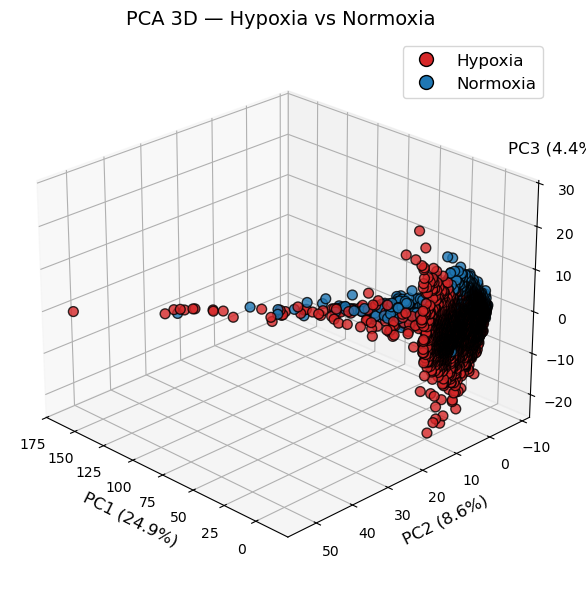

In [209]:
pca_3d = PCA(n_components=3)
pca_result = pca_3d.fit_transform(X)

df["PC1"] = pca_result[:, 0]
df["PC2"] = pca_result[:, 1]
df["PC3"] = pca_result[:, 2]

color_map = {"Hypoxia": "#d62728", "Normoxia": "#1f77b4"}
colors = df["Condition"].map(color_map)

fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(df["PC1"], df["PC2"], df["PC3"], 
                c=colors, edgecolor='black', s=50, alpha=0.8)

ax.set_xlabel(f"PC1 ({pca_3d.explained_variance_ratio_[0]*100:.1f}%)", fontsize=12)
ax.set_ylabel(f"PC2 ({pca_3d.explained_variance_ratio_[1]*100:.1f}%)", fontsize=12)

ax.text(
    x=df["PC1"].min(), 
    y=df["PC2"].min(), 
    z=df["PC3"].max() + 10, 
    s=f"PC3 ({pca_3d.explained_variance_ratio_[2]*100:.1f}%)",
    fontsize=12,
    color="black"
)

ax.set_title("PCA 3D — Hypoxia vs Normoxia", fontsize=14, pad=10)

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Hypoxia',
           markerfacecolor=color_map["Hypoxia"], markersize=10, markeredgecolor='black'),
    Line2D([0], [0], marker='o', color='w', label='Normoxia',
           markerfacecolor=color_map["Normoxia"], markersize=10, markeredgecolor='black')
]
ax.legend(handles=legend_elements, loc='upper right', fontsize=12)

ax.view_init(elev=25, azim=135)

plt.tight_layout()
plt.show()




In both the two and three dimensional PCA spaces, there is no clear separation between hypoxic and normoxic cells.
However, the situation might improve when considering higher dimensional representations.
This could also be explained by the large number of samples (~21,000 cells), which may require more components to capture relevant biological variability. 

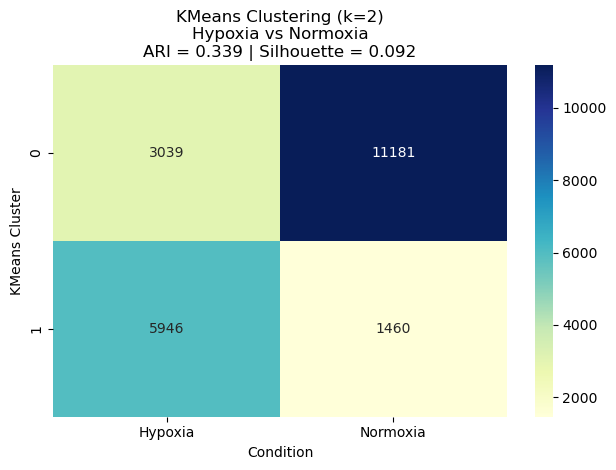

In [210]:
# KMeans clustering (k=2)
kmeans = KMeans(n_clusters=2, random_state=42)
df["Cluster"] = kmeans.fit_predict(X)

ari = adjusted_rand_score(df["Condition"], df["Cluster"])

silhouette = silhouette_score(X, df["Cluster"])

contingency = pd.crosstab(df["Cluster"], df["Condition"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"KMeans Clustering (k=2)\nHypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("KMeans Cluster")
plt.tight_layout()
plt.show()


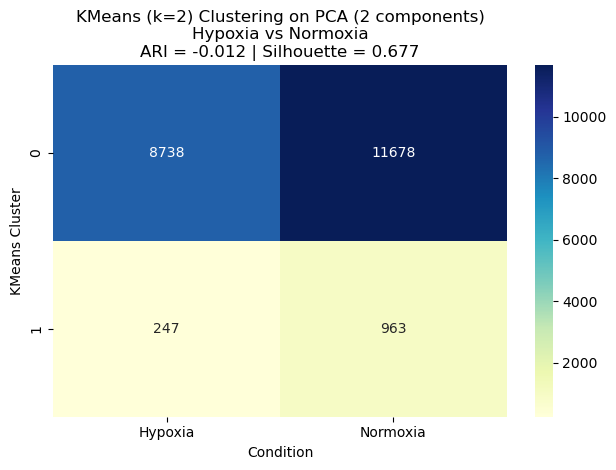

In [211]:
X_pca2 = df[["PC1", "PC2"]].values  

kmeans = KMeans(n_clusters=2, random_state=42)
df["Cluster"] = kmeans.fit_predict(X_pca2)

contingency = pd.crosstab(df["Cluster"], df["Condition"])

ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X_pca2, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"KMeans (k=2) Clustering on PCA (2 components)\nHypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("KMeans Cluster")
plt.tight_layout()
plt.show()

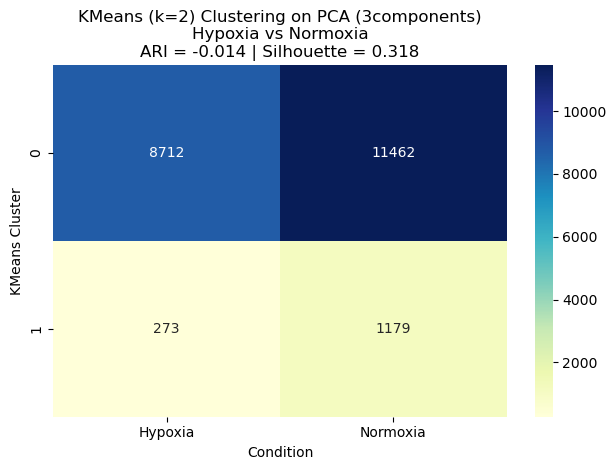

In [212]:
X_pca3 = df[["PC1", "PC2", "PC3"]].values  

kmeans = KMeans(n_clusters=2, random_state=42)
df["Cluster"] = kmeans.fit_predict(X_pca3)

contingency = pd.crosstab(df["Cluster"], df["Condition"])

ari = adjusted_rand_score(df["Condition"], df["Cluster"])

silhouette = silhouette_score(X, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"KMeans (k=2) Clustering on PCA (3components)\nHypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("KMeans Cluster")
plt.tight_layout()
plt.show()


K-Means applied to the 2D PCA space did not yield meaningful clustering: the algorithm tended to group all samples into a single cluster or produced inconsistent results.
This behavior is expected, as the low-dimensional projection may fail to preserve the biological signal of interest, and K-Means relies on assumptions that may not hold in such a compressed space.
The silhouette score is slightly higher in 2D compared to both the full dataset and the PCA 3D space, suggesting more well-defined clusters geometrically.
However, while the ARI remains close to zero in the PCA-reduced spaces, it increases when using the full dataset, indicating that the clusters found may be biologically meaningful in higher dimensions.

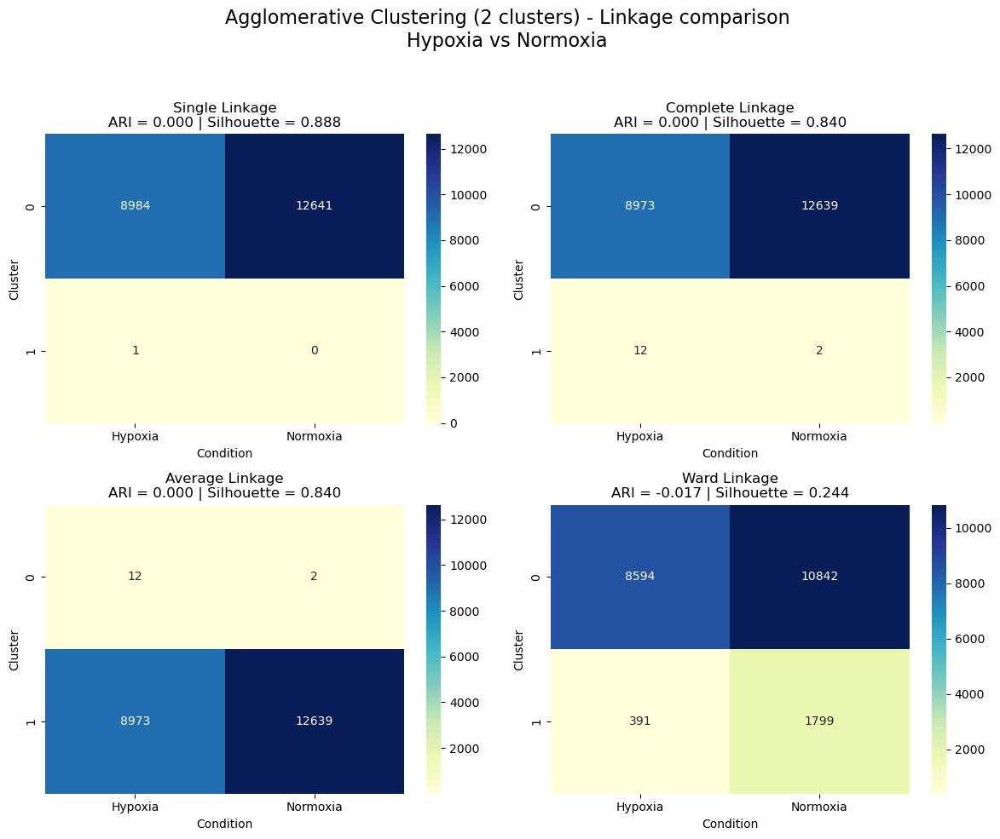

In [213]:
linkages = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]

for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X, cluster_labels)
    
    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("Cluster")

plt.suptitle("Agglomerative Clustering (2 clusters) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

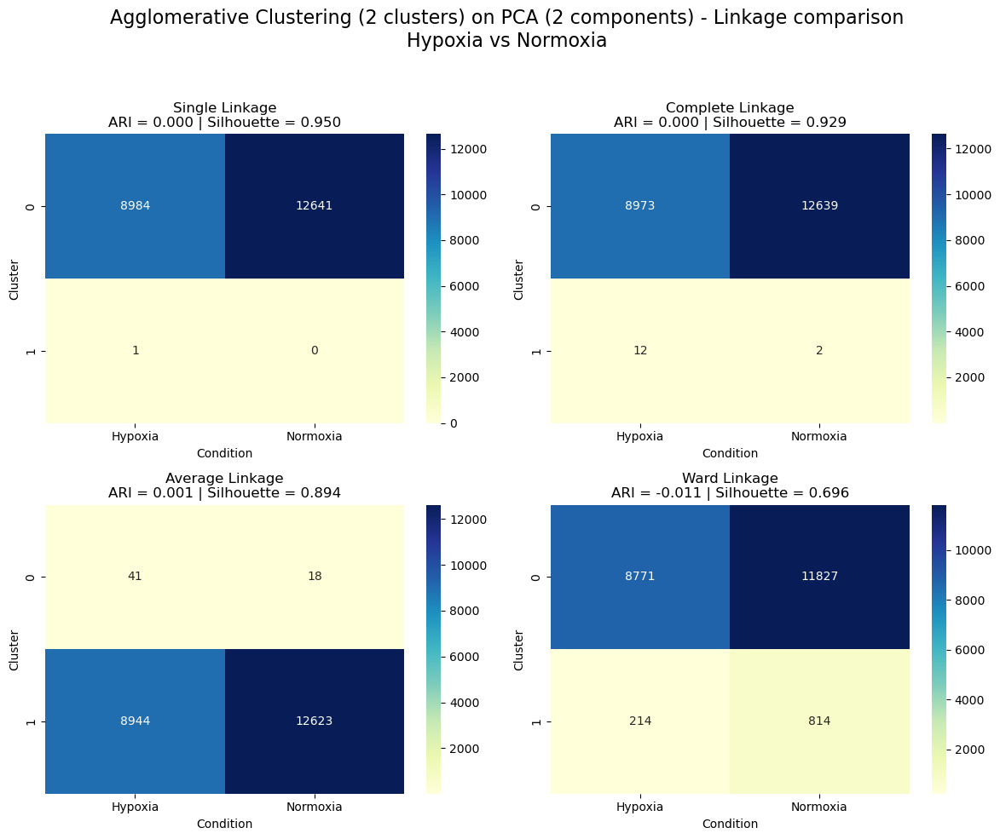

In [214]:
linkages = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]


for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca2)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
   
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X_pca2, cluster_labels)
    
    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("Cluster")

plt.suptitle("Agglomerative Clustering (2 clusters) on PCA (2 components) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


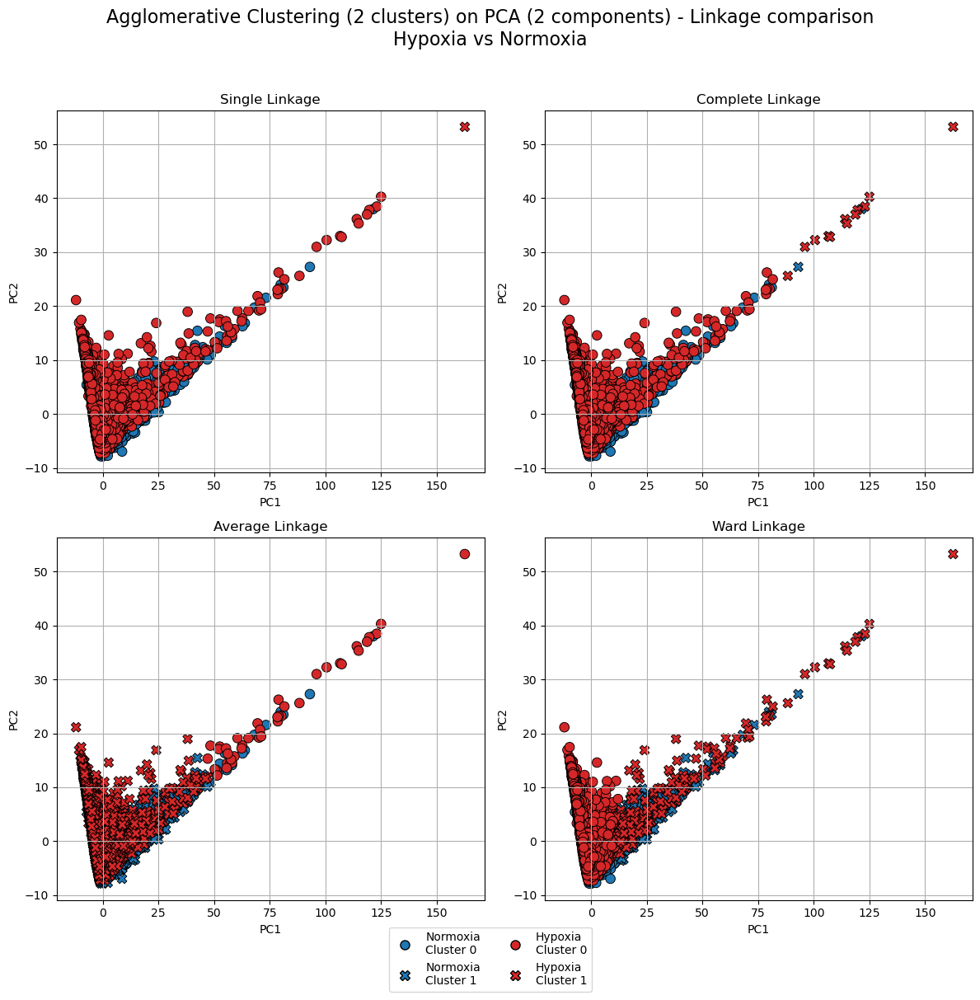

In [215]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca2)

    temp_df = pd.DataFrame(X_pca2, columns=["PC1", "PC2"])
    temp_df["Condition"] = df["Condition"].values
    temp_df["Cluster"] = cluster_labels

    sns.scatterplot(
        data=temp_df,
        x="PC1", y="PC2",
        hue="Condition",
        style="Cluster",
        palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
        edgecolor="black",
        s=70,
        ax=ax,
        legend=False 
    )

    ax.set_title(title)
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.grid(True)

color_map = {"Normoxia": "#1f77b4", "Hypoxia": "#d62728"}
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Normoxia\nCluster 0',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Normoxia\nCluster 1',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Hypoxia\nCluster 0',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Hypoxia\nCluster 1',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
]

fig.legend(handles=legend_elements, loc='lower center', ncol=2, fontsize=10, bbox_to_anchor=(0.5, -0.02))

plt.suptitle("Agglomerative Clustering (2 clusters) on PCA (2 components) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) 
plt.show()



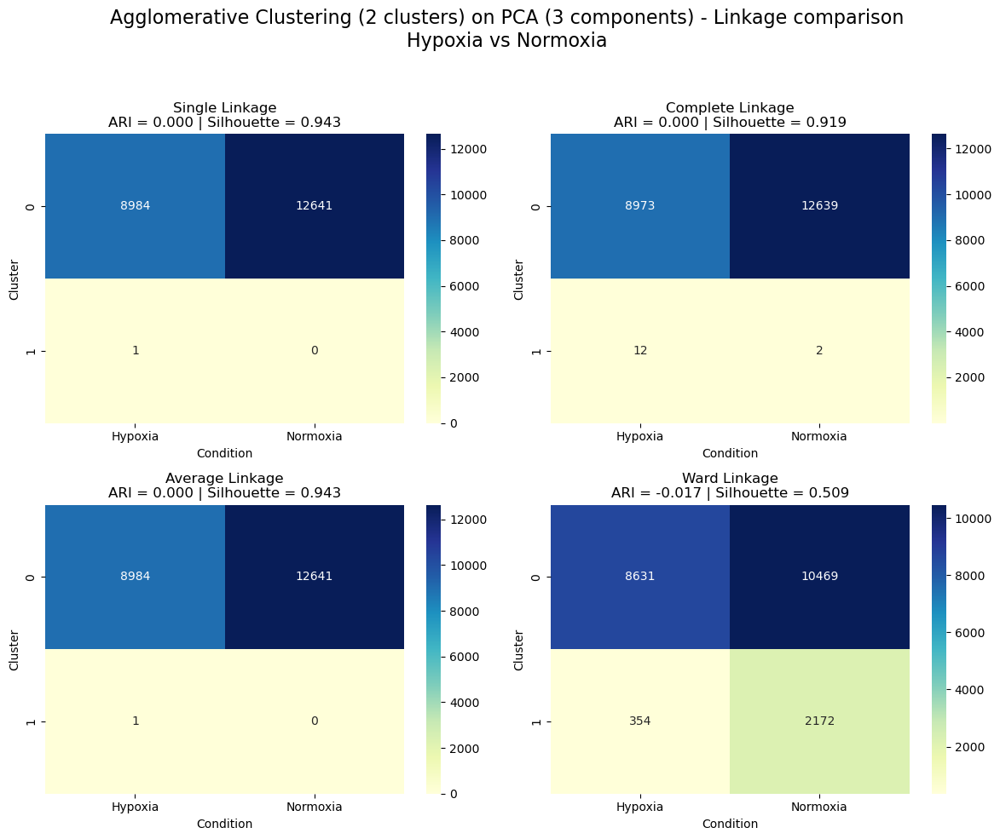

In [216]:
linkages = ['single', 'complete', 'average', 'ward']
titles = ['Single Linkage', 'Complete Linkage', 'Average Linkage', 'Ward Linkage']
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]


for ax, linkage, title in zip(axes.ravel(), linkages, titles):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    cluster_labels = model.fit_predict(X_pca3)
    
   
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X_pca3, cluster_labels)
    
    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("Cluster")

plt.suptitle("Agglomerative Clustering (2 clusters) on PCA (3 components) - Linkage comparison\nHypoxia vs Normoxia", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

We applied the Agglomerative Clustering algorithm to the full dataset, and then to the PCA-transformed space using both two and three principal components. Across all settings, we observe that none of the linkage methods (single, complete, average, or ward) are able to clearly separate the data into two distinct clusters. The single, complete, and average linkage methods produce high silhouette scores, indicating that the resulting clusters are internally well-defined. However, the ARI remains very low in all cases, suggesting a poor alignment between the clustering structure and the true biological labels (hypoxia vs. normoxia).
The ward linkage, in contrast, tends to yield lower silhouette scores, indicating less cohesive clusters. Yet, even in this case, the ARI remains near zero, confirming that none of the clustering configurations successfully recover the biological grouping.

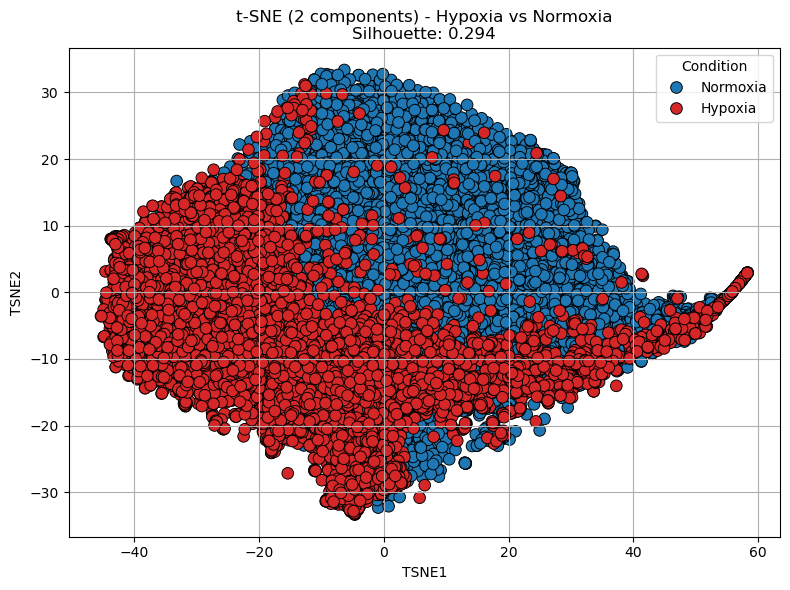

In [217]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200)
X_tsne = tsne.fit_transform(X)

df["TSNE1"] = X_tsne[:, 0]
df["TSNE2"] = X_tsne[:, 1]

true_labels = df["Condition"].map({"Hypoxia": 0, "Normoxia": 1})

silhouette_tsne = silhouette_score(X_tsne, true_labels)

plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=df,
    x="TSNE1", y="TSNE2",
    hue="Condition",
    palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
    edgecolor="black",
    s=70
)
plt.title(f"t-SNE (2 components) - Hypoxia vs Normoxia\nSilhouette: {silhouette_tsne:.3f}")
plt.grid(True)
plt.tight_layout()
plt.show()

The 2D t-SNE projection appears quite messy, and the low silhouette score suggests that the data points are not well-separated. 

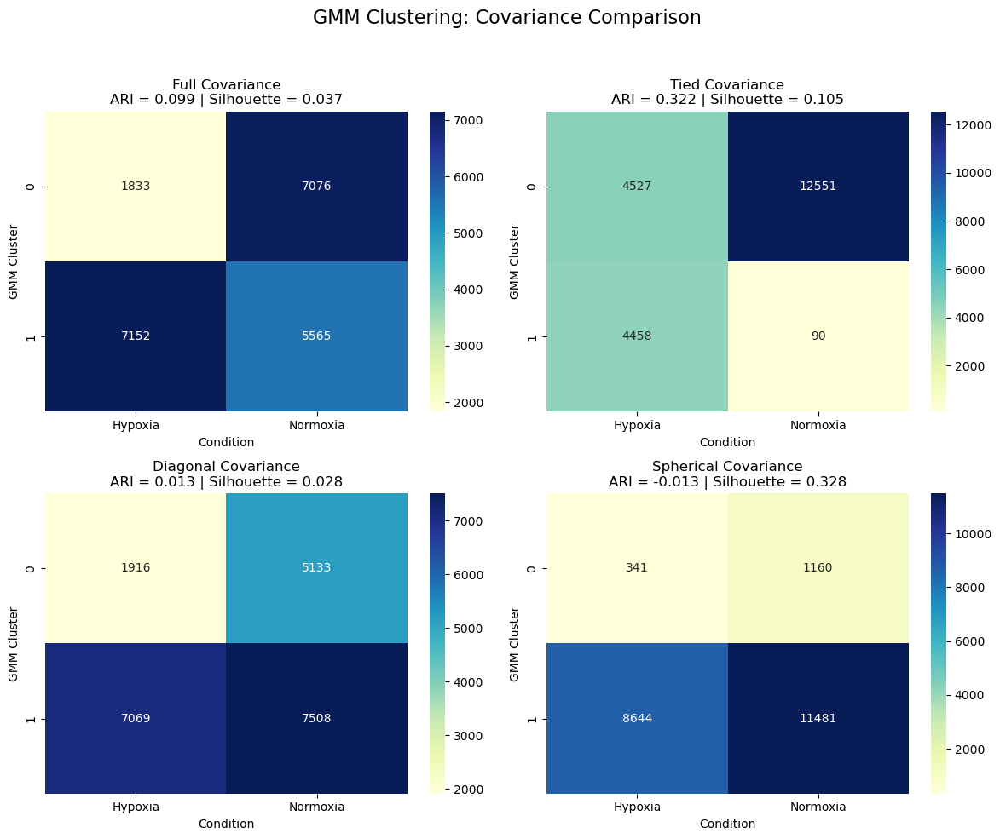

In [218]:
cov_types = ['full', 'tied', 'diag', 'spherical']
titles = ['Full Covariance', 'Tied Covariance', 'Diagonal Covariance', 'Spherical Covariance']

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]

for ax, cov_type, title in zip(axes.ravel(), cov_types, titles):
    gm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gm.fit(X)
    cluster_labels = gm.predict(X)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
  
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X, cluster_labels)

    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("GMM Cluster")

plt.suptitle("GMM Clustering: Covariance Comparison", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


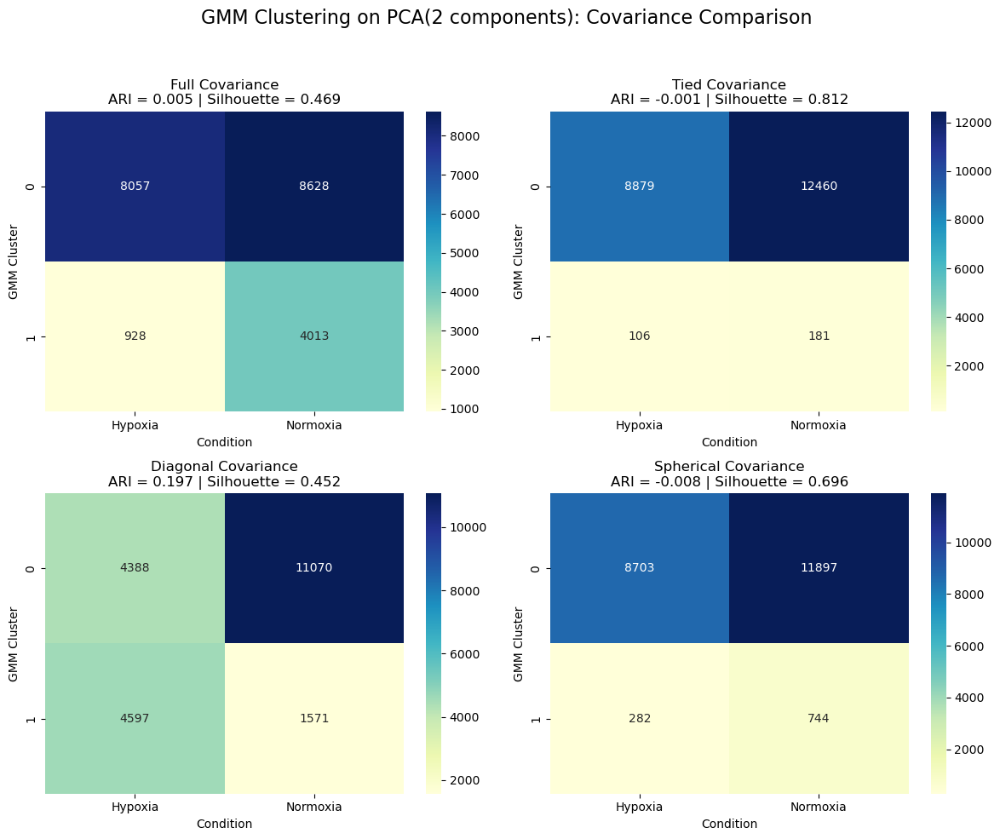

In [219]:
cov_types = ['full', 'tied', 'diag', 'spherical']
titles = ['Full Covariance', 'Tied Covariance', 'Diagonal Covariance', 'Spherical Covariance']

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

y_true = df["Condition"]

for ax, cov_type, title in zip(axes.ravel(), cov_types, titles):
    gm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gm.fit(X_pca2)
    cluster_labels = gm.predict(X_pca2)
    
    
    contingency = pd.crosstab(cluster_labels, y_true)
    sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu", ax=ax)
    
   
    ari = adjusted_rand_score(y_true, cluster_labels)
    silhouette = silhouette_score(X_pca2, cluster_labels)

    ax.set_title(f"{title}\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
    ax.set_xlabel("Condition")
    ax.set_ylabel("GMM Cluster")

plt.suptitle("GMM Clustering on PCA(2 components): Covariance Comparison", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


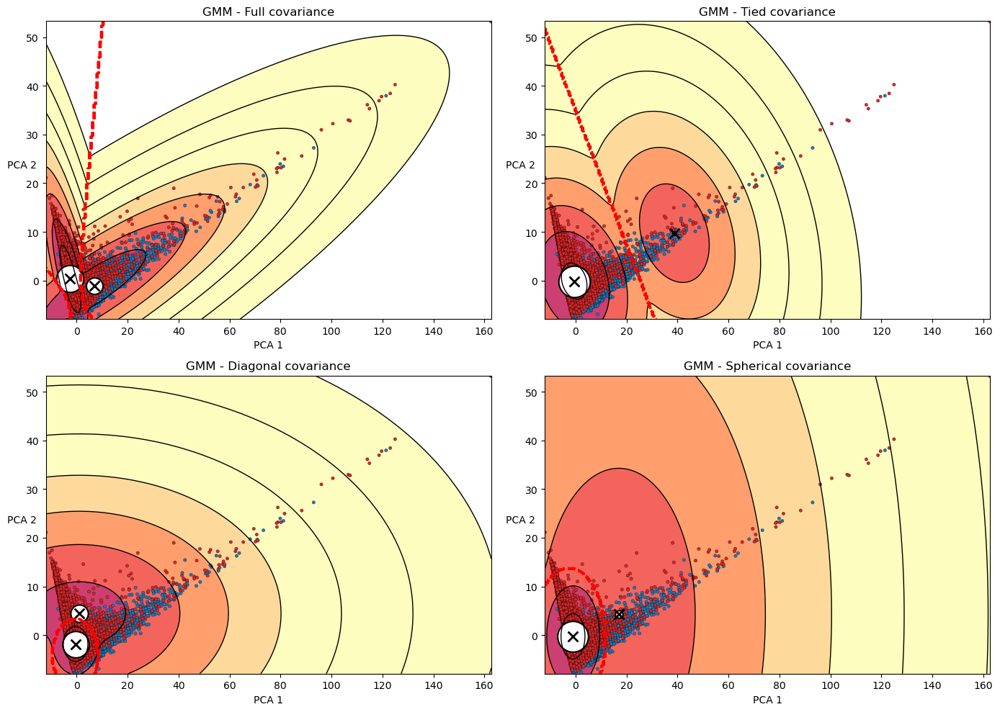

In [220]:
gm = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gm.fit(X_pca2)
cluster_labels = gm.predict(X_pca2)
cluster_probs = gm.predict_proba(X_pca2)[:, 0]  

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from sklearn.mixture import GaussianMixture


def plot_centroids(centroids, weights, circle_color='w', cross_color='k'):
    for i, (centroid, weight) in enumerate(zip(centroids, weights)):
        plt.scatter(*centroid, s=1000 * weight, marker='o',
                    edgecolor='black', facecolor=circle_color, linewidth=1.5)
        plt.scatter(*centroid, marker='x', color=cross_color, s=100, linewidths=2)

def plot_gaussian_mixture(clusterer, X, labels=None, probs=None, palette=None, resolution=300, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    
    Z = -clusterer.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z, norm=LogNorm(vmin=1.0, vmax=30.0),
                 levels=np.logspace(0, 2, 12), cmap='magma')

    plt.contour(xx, yy, Z, norm=LogNorm(vmin=1.0, vmax=30.0),
                levels=np.logspace(0, 2, 12), linewidths=1, colors='k')
    
    Z_pred = clusterer.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
    plt.contour(xx, yy, Z_pred, linewidths=2, colors='red', linestyles='dashed')

    if probs is not None:
        plt.scatter(X[:, 0], X[:, 1], c=probs, cmap='coolwarm', s=10, edgecolor='k', linewidth=0.2)
    elif labels is not None and palette is not None:
        point_colors = [palette[label] for label in labels]
        plt.scatter(X[:, 0], X[:, 1], c=point_colors, s=10, edgecolor='k', linewidth=0.2)
    elif labels is not None:
        plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='Set1', s=10, edgecolor='k', linewidth=0.2)
    else:
        plt.plot(X[:, 0], X[:, 1], 'k.', markersize=3)

    
    plot_centroids(clusterer.means_, clusterer.weights_)

    plt.xlabel("PCA 1")
    if show_ylabels:
        plt.ylabel("PCA 2", rotation=0)
    else:
        plt.tick_params(labelleft=False)

true_labels_str = df["Condition"]  
palette = {"Hypoxia": "#d62728", "Normoxia": "#1f77b4"}
true_labels_colors = true_labels_str.map(palette).values

true_labels = true_labels_str.map({"Hypoxia": 0, "Normoxia": 1}).values


cov_types = ['full', 'tied', 'diag', 'spherical']
titles = ['Full covariance', 'Tied covariance', 'Diagonal covariance', 'Spherical covariance']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.ravel()

for i, cov_type in enumerate(cov_types):
    gm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gm.fit(X_pca2)
    
    plt.sca(axes[i])
    plot_gaussian_mixture(gm, X_pca2, labels=true_labels_str.values, palette=palette)
    plt.title(f"GMM - {titles[i]}")

plt.tight_layout()
plt.show()


Regardless of the covariance type, the ARI remains low in most cases, both when GMM is applied to the full dataset and to the PCA-transformed spaces, indicating that the clusters do not align with the hypoxia/normoxia labels.
Where there is any ambiguity, the contingency matrix shows a poor correspondence with the true labels, confirming that the clustering structure identified by GMM does not reflect the biological distinction between the two conditions.
The silhouette score improves after applying PCA, suggesting that the clusters become more geometrically compact, but still confusing. 

In [221]:
found = False
for eps in np.arange(0.1, 5.0, 0.25):
    dbscan = DBSCAN(eps=eps, min_samples=2)
    db_labels = dbscan.fit_predict(X)
    n_clusters = len(set(db_labels)) - (1 if -1 in db_labels else 0)
    if n_clusters == 2:
        found = True
        print(f"✅ 2 clusters found with eps={eps:.2f}")
        break

if not found:
    print("❌ No clusters found with 2 groups")



❌ No clusters found with 2 groups


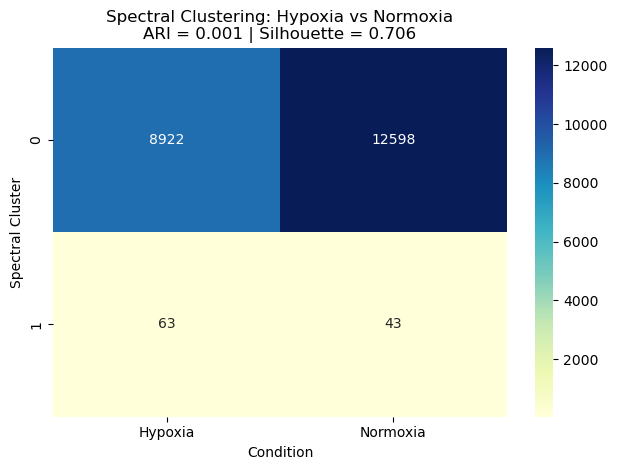

In [222]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
df["Cluster"] = spectral.fit_predict(X)

contingency = pd.crosstab(df["Cluster"], df["Condition"])


ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"Spectral Clustering: Hypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("Spectral Cluster")
plt.tight_layout()
plt.show()



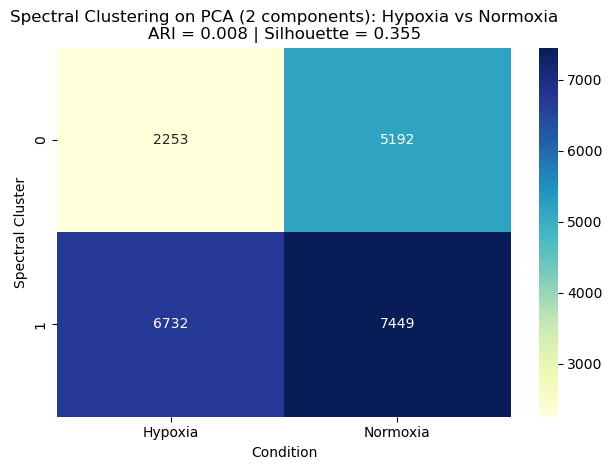

In [223]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
df["Cluster"] = spectral.fit_predict(X_pca2)

contingency = pd.crosstab(df["Cluster"], df["Condition"])


ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X_pca2, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"Spectral Clustering on PCA (2 components): Hypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("Spectral Cluster")
plt.tight_layout()
plt.show()

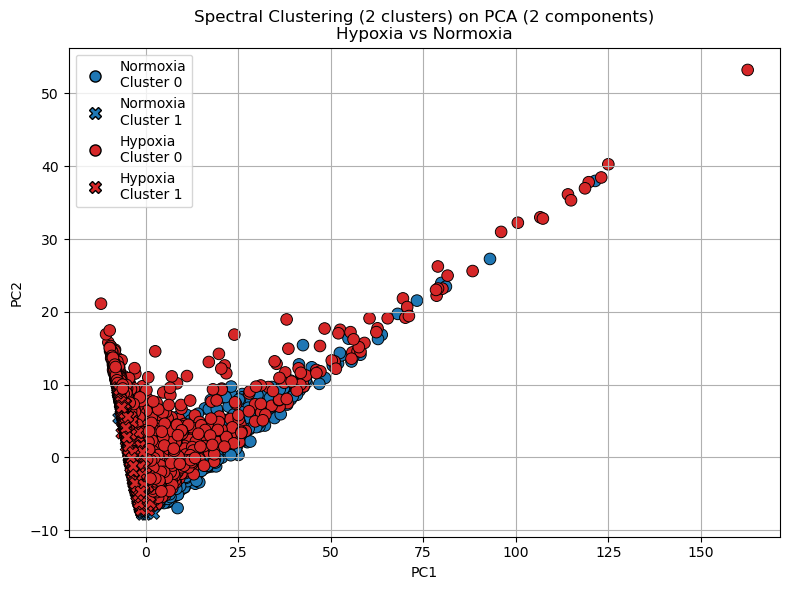

In [224]:

spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
cluster_labels = spectral.fit_predict(X_pca2)
df["Cluster"] = cluster_labels

fig, ax = plt.subplots(figsize=(8, 6))


sns.scatterplot(
    x=X_pca2[:, 0],
    y=X_pca2[:, 1],
    hue=df["Condition"],
    style=df["Cluster"],
    palette={"Hypoxia": "#d62728", "Normoxia": "#1f77b4"},
    edgecolor="black",
    s=70,
    ax=ax,
    legend=False 
)

ax.set_title("Spectral Clustering (2 clusters) on PCA (2 components)\nHypoxia vs Normoxia")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.grid(True)

color_map = {"Normoxia": "#1f77b4", "Hypoxia": "#d62728"}
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Normoxia\nCluster 0',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Normoxia\nCluster 1',
           markerfacecolor=color_map["Normoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Hypoxia\nCluster 0',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='X', color='w', label='Hypoxia\nCluster 1',
           markerfacecolor=color_map["Hypoxia"], markeredgecolor='black', markersize=8),
]

ax.legend(handles=legend_elements, loc="upper left", fontsize=10)

plt.tight_layout()
plt.show()


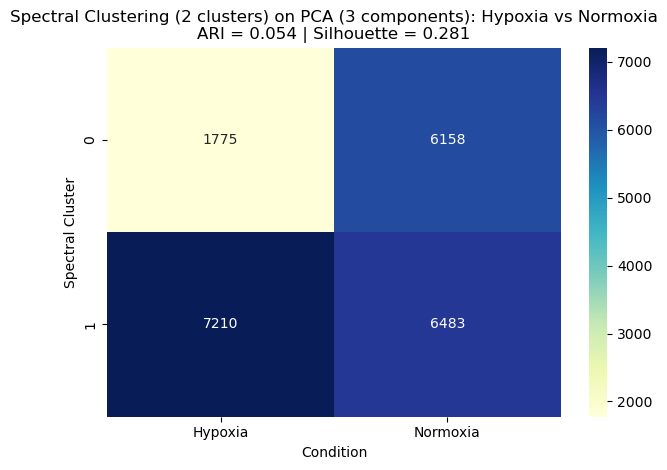

In [225]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
df["Cluster"] = spectral.fit_predict(X_pca3)

contingency = pd.crosstab(df["Cluster"], df["Condition"])


ari = adjusted_rand_score(df["Condition"], df["Cluster"])
silhouette = silhouette_score(X_pca3, df["Cluster"])

sns.heatmap(contingency, annot=True, fmt="d", cmap="YlGnBu")
plt.title(f"Spectral Clustering (2 clusters) on PCA (3 components): Hypoxia vs Normoxia\nARI = {ari:.3f} | Silhouette = {silhouette:.3f}")
plt.xlabel("Condition")
plt.ylabel("Spectral Cluster")
plt.tight_layout()
plt.show()

Spectral Clustering applied to the PCA 2D and 3D space yields a moderate silhouette score, which suggests a certain level of geometric separation.
However, the clusters appear visually entangled in the PCA 2D space, and the separation does not seem to reflect a meaningful distinction between hypoxic and normoxic cells.

## Supervised learning

## Supervised Learning – Introduction

In this section, we apply supervised machine learning techniques to classify single-cell transcriptomic profiles according to oxygen conditions (hypoxia or normoxia) using labeled gene expression data. The primary aim is to develop predictive models that are not only accurate within individual datasets, but also generalize across biological contexts (different cell lines) and technical platforms (SmartSeq and DropSeq). Beyond predictive performance, this analysis also serves to assess the utility of feature selection, investigate cross-domain transferability, and possibly identify minimal, interpretable sets of informative genes.

We analyze six datasets in total, derived from two breast cancer cell lines (HCC1806 and MCF7), each profiled with two single-cell RNA-sequencing technologies. For SmartSeq data, both full-transcriptome and reduced (3000-gene) versions are available for each cell line. For DropSeq, only reduced datasets are provided. This structure enables direct comparisons of modeling performance across both biological and technological axes, while also controlling for the effect of data dimensionality.



The supervised learning workflow includes the following components:

- **Data preprocessing**: Gene expression matrices are transposed to obtain a *cells × genes* structure. Sample names are parsed to assign binary labels (1 = hypoxia, 0 = normoxia). Features are standardized to zero mean and unit variance to ensure comparability across datasets.  

- **Baseline classification**: Three classifiers—**Random Forest, Support Vector Machine, and k-Nearest Neighbors**—are trained independently on each of the six datasets using the full gene sets. Performance is measured through stratified cross-validation (5 folds) and holdout evaluation (70/30 split), with metrics including accuracy, precision, recall, F1-score, and confusion matrices.  

- **Feature selection**: Random Forest classifiers are used to compute feature importance scores. Genes are ranked, and the **top 50 features per dataset** are retained. These reduced sets help control overfitting, improve interpretability, and allow testing of compact models.  

- **Reduced-feature modeling**: Classifiers are retrained using only the top 50 genes from each dataset. Results are compared against full-feature models to quantify the trade-off between dimensionality reduction and predictive performance.  

- **Aggregated feature analysis**: Top-50 gene lists are compiled across datasets. The frequency of each gene’s selection is tabulated, presence/absence matrices and Venn diagrams are generated, and overlaps are visualized. The most recurrent features are used to form a consensus subset, providing a candidate minimal biomarker panel for hypoxia classification.  

- **Consensus-gene classifiers**: Classifiers are trained using only the most frequently selected genes (appearing across multiple datasets). This tests whether a compact and biologically consistent gene set can generalize across both cell lines and technologies.  

- **Cross-dataset generalization**: Models trained on one dataset were tested on others to evaluate transferability. Both **cross-cell line** (HCC1806 ↔ MCF7) and **cross-technology** (SmartSeq ↔ DropSeq) transfers were assessed. To ensure comparability, experiments were restricted to overlapping genes, either the **Top-28 consensus set** or the **global intersection (~70 genes)**.  


- **Combined modeling**: All four datasets were aligned to the **70 shared genes** and merged to train general classifiers. Both **pooled training** (initially imbalanced, then downsampled for fairness) and **leave-one-dataset-out** setups were explored. **Random Forest, Logistic Regression, and MLP** were benchmarked, showing strong within-dataset performance but variable cross-dataset transfer.  
 
- **Best-in-class per dataset**  
  For each dataset separately, a complete pipeline was run:  
  - Top-50 gene selection  
  - 5-fold cross-validated hyperparameter tuning of multiple algorithms (**LogReg, SVM RBF, RF, KNN, MLP**)  
  - Holdout evaluation with **ROC AUC, PR AUC, F1, Balanced Accuracy**, and confusion matrices  

  Each dataset yielded a **“champion model”** with near-perfect performance on its own holdout set.  


- **Final prediction step**: The best-performing general classifiers are prepared for application to an external unlabeled test set, ensuring unbiased assessment of the workflow in unseen data.  



### Objectives

The main objectives of this section are:

- To train classifiers capable of distinguishing hypoxia vs normoxia in each dataset.
- To evaluate and compare the performance of different algorithms (Random Forest, SVM, KNN, Logistic Regression).
- To perform feature selection and identify genes most predictive of oxygen condition.
- To test model generalization across cell lines (cross-line classification) and technologies (SmartSeq vs DropSeq)
- To assess whether a general classifier independent of cell type or technology can be developed.
- To benchmark “best-in-class” classifiers per dataset by running feature selection, hyperparameter tuning, and holdout evaluation, in order to identify the strongest possible pipeline for each dataset individually.
- To prepare for final label prediction on an unlabeled test set, to be evaluated externally.

## 1. Data Preprocessing

This function handles preprocessing of the gene expression datasets for classification.

Steps:
- **Load data**: Reads a gene-by-sample expression matrix.
- **Clean names**: Removes quotes and extra spaces from gene/sample names.
- **Transpose**: Converts the matrix to shape *(cells × genes)*.
- **Extract labels**: Assigns binary label 1 for hypoxic samples and 0 for normoxic, based on sample names.
- **Standardize**: Scales gene expression features to zero mean and unit variance using StandardScaler.

The function returns the standardized matrix X, the labels y, sample names, and gene names.


In [226]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import os

def preprocess_dataset(file_path):
    
    # Load file
    df = pd.read_csv(file_path, sep=r"\s+", engine="python", index_col=0)

    # Clean up gene and sample names
    df.index = df.index.str.replace('"', '').str.strip()
    df.columns = df.columns.str.replace('"', '').str.strip()

    # Transpose: rows = samples, columns = genes
    df_T = df.T

    # Extract binary labels
    labels = [1 if 'Hypo' in name or 'Hypoxia' in name else 0 for name in df_T.index]
    y = np.array(labels)

    # Standardize gene expression
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df_T)

    print(f"  Loaded: {os.path.basename(file_path)}")
    print(f"   Shape: {X_scaled.shape} (cells x genes)")
    print(f"   Labels: {np.sum(y)} hypoxia, {len(y) - np.sum(y)} normoxia")

    return X_scaled, y, df_T.index.tolist(), df_T.columns.tolist()

In [227]:
def preprocess_dataset_to_train(file_path):
    
    df = pd.read_csv(file_path, sep=r"\s+", engine="python", index_col=0)

    df.index = df.index.str.replace('"', '').str.strip()
    df.columns = df.columns.str.replace('"', '').str.strip()

    df_T = df.T

    print(f"  Loaded: {os.path.basename(file_path)}")
    print(f"   Shape: {df_T} (cells x genes)")
    
    return df_T, df_T.index.tolist(), df_T.columns.tolist()

## 2. Baseline Model Evaluation (Single Dataset)

We evaluate three standard classification algorithms (Random Forest, Support Vector Machine and k-Nearest Neighbors) on a single dataset using the full gene set as input features.

Each model is assessed using:
- **Stratified 5-fold cross-validation**: Estimates average model performance and variance.
- **Holdout validation (30%)**: Tests generalization to unseen data.
- **Metrics**: Accuracy, precision, recall, F1-score, and confusion matrix are reported.

This baseline step establishes a reference for each classifier’s performance before any feature selection or cross-dataset testing is introduced. Results show strong performance for Random Forest and SVM, while KNN performs significantly worse, highlighting the need for further model tuning or dimensionality reduction.


In [228]:
file_path = "HCC1806_SmartS_Filtered_Data.txt"
X, y, sample_names, gene_names = preprocess_dataset(file_path)

  Loaded: HCC1806_SmartS_Filtered_Data.txt
   Shape: (227, 19503) (cells x genes)
   Labels: 116 hypoxia, 111 normoxia


In [229]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns


In [230]:
def evaluate_baseline_models(X, y, model_names=None, cv_folds=5, test_size=0.3, random_state=42):
    
    if model_names is None:
        model_names = ['RandomForest', 'SVM', 'KNN']

    models = {
        'RandomForest': RandomForestClassifier(random_state=random_state),
        'SVM': LinearSVC(max_iter=10000, dual=False, random_state=random_state),
        'KNN': KNeighborsClassifier(n_neighbors=5)
    }

    cv = StratifiedKFold(n_splits=cv_folds, shuffle=True, random_state=random_state)

    for name in model_names:
        print(f"\n Evaluating {name} model...")
        model = models[name]

        # Cross-validation
        scores = cross_val_score(model, X, y, cv=cv)
        print(f"CV Accuracy: {scores.mean():.4f} ± {scores.std():.4f}")

        # Holdout
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size,
                                                            stratify=y, random_state=random_state)

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        print(f"Holdout Accuracy: {accuracy_score(y_test, y_pred):.4f}")
        print(f"Classification Report:\n{classification_report(y_test, y_pred)}")

        cm = confusion_matrix(y_test, y_pred)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                    xticklabels=['Normoxia', 'Hypoxia'], 
                    yticklabels=['Normoxia', 'Hypoxia'])
        plt.title(f"Confusion Matrix - {name}")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.show()



 Evaluating RandomForest model...
CV Accuracy: 0.9517 ± 0.0352
Holdout Accuracy: 0.9565
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.94      0.96        34
           1       0.94      0.97      0.96        35

    accuracy                           0.96        69
   macro avg       0.96      0.96      0.96        69
weighted avg       0.96      0.96      0.96        69



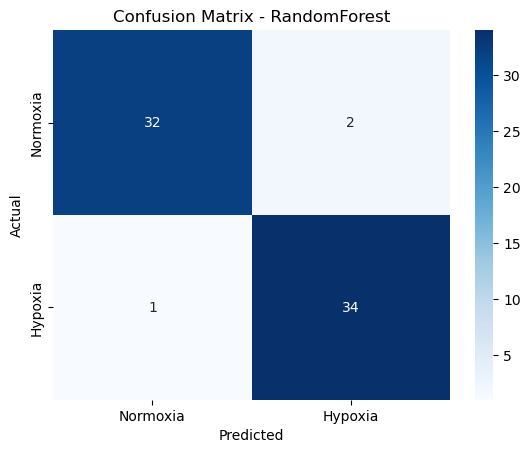


 Evaluating SVM model...
CV Accuracy: 0.9430 ± 0.0292
Holdout Accuracy: 0.9565
Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        34
           1       1.00      0.91      0.96        35

    accuracy                           0.96        69
   macro avg       0.96      0.96      0.96        69
weighted avg       0.96      0.96      0.96        69



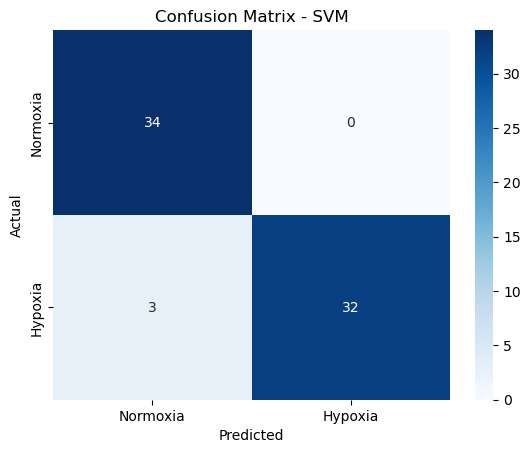


 Evaluating KNN model...
CV Accuracy: 0.6038 ± 0.0367
Holdout Accuracy: 0.5507
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.69        34
           1       1.00      0.11      0.21        35

    accuracy                           0.55        69
   macro avg       0.76      0.56      0.45        69
weighted avg       0.76      0.55      0.44        69



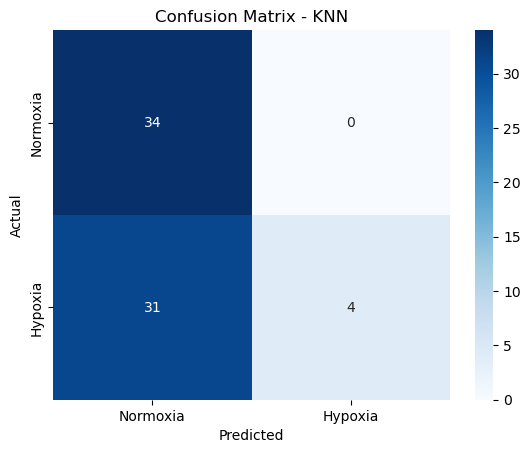

In [231]:
evaluate_baseline_models(X, y)


### Model families and why we expand later

For the first baselines we use **Random Forest, Linear SVM, and KNN**, classic, strong starters for high-dimensional biology.  
Later, when we optimize, we expand the model set to include **Logistic Regression** (linear, very common in transcriptomics) and **MLP** (non-linear neural baseline), plus **SVM with RBF kernel**. This staged expansion avoids overfitting early, while still checking whether more flexible models add value.


## 3. Feature Selection (Single Dataset)

To reduce dimensionality and improve interpretability, we apply feature selection using Random Forest. Each gene is assigned an importance score based on how informative it is for classifying hypoxia vs normoxia. We choose to apply Random Forest feature importances for gene ranking because:
1. It captures non-linear relationships between genes and class labels.  
2. It is computationally efficient even with thousands of genes.  
3. It directly integrates with the Random Forest classifiers already used in the baseline analysis.  

From this, we select the top 50 most important genes and use them to retrain the classifiers. This allows us to evaluate model performance with a compact feature set.

Despite the reduction from thousands of genes to only 50, classification accuracy remains high, confirming that a small subset of features captures the relevant signal for prediction.


In [232]:
def select_top_genes(X, y, gene_names, top_n=50, random_state=42):
    
    rf = RandomForestClassifier(n_estimators=100, random_state=random_state)
    rf.fit(X, y)

    importances = rf.feature_importances_
    indices = np.argsort(importances)[::-1]
    top_indices = indices[:top_n]
    top_genes = [gene_names[i] for i in top_indices]

    print(f"\n Top {top_n} Genes Selected:")
    for i, idx in enumerate(top_indices):
        print(f"{i+1}. {gene_names[idx]} ({importances[idx]:.4f})")

    X_top = X[:, top_indices]  # reduce to top features
    return X_top, top_genes


In [233]:
X_top, top_genes = select_top_genes(X, y, gene_names)



 Top 50 Genes Selected:
1. EGLN3 (0.0253)
2. ANGPTL4 (0.0195)
3. CA9 (0.0167)
4. BHLHE40-AS1 (0.0157)
5. PGK1 (0.0126)
6. FUT11 (0.0107)
7. ASB2 (0.0101)
8. MOB3A (0.0097)
9. LBH (0.0095)
10. SLC2A1 (0.0087)
11. LOXL2 (0.0085)
12. CCNG2 (0.0075)
13. INSIG2 (0.0074)
14. PNCK (0.0072)
15. BNIP3P1 (0.0071)
16. PFKFB3 (0.0071)
17. BTG1 (0.0065)
18. FOSL2 (0.0064)
19. SLC6A8 (0.0063)
20. ENO2 (0.0059)
21. HILPDA (0.0057)
22. BNIP3 (0.0056)
23. P4HA1 (0.0054)
24. PLOD2 (0.0051)
25. ENTPD4 (0.0050)
26. RPL17P50 (0.0050)
27. ANKRD37 (0.0047)
28. ANKZF1 (0.0047)
29. MIR614 (0.0046)
30. ARRDC3 (0.0046)
31. PGAM1 (0.0044)
32. MKNK2 (0.0043)
33. LY6K (0.0043)
34. MIR210HG (0.0043)
35. ANG (0.0042)
36. ERO1A (0.0041)
37. BIK (0.0041)
38. SLC25A33 (0.0040)
39. NDRG1 (0.0040)
40. AHNAK2 (0.0039)
41. PFKFB4 (0.0038)
42. DDIT4 (0.0038)
43. IFRD1 (0.0036)
44. LINC02492 (0.0036)
45. SLC25A19 (0.0035)
46. ADM (0.0035)
47. IDH3A (0.0035)
48. FGF11 (0.0035)
49. VKORC1 (0.0035)
50. P4HA2 (0.0035)



 Evaluating RandomForest model...
CV Accuracy: 0.9564 ± 0.0456
Holdout Accuracy: 1.0000
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00        35

    accuracy                           1.00        69
   macro avg       1.00      1.00      1.00        69
weighted avg       1.00      1.00      1.00        69



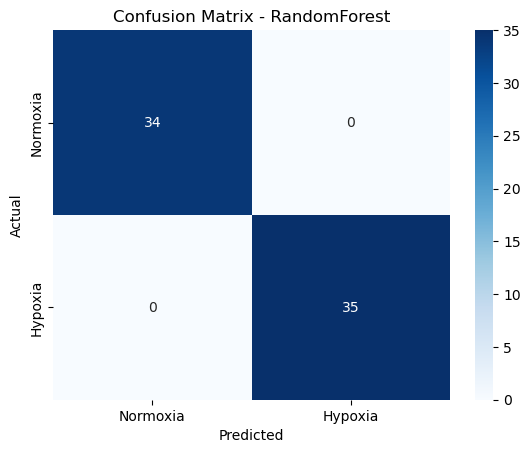


 Evaluating SVM model...
CV Accuracy: 0.9736 ± 0.0255
Holdout Accuracy: 0.9565
Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        34
           1       1.00      0.91      0.96        35

    accuracy                           0.96        69
   macro avg       0.96      0.96      0.96        69
weighted avg       0.96      0.96      0.96        69



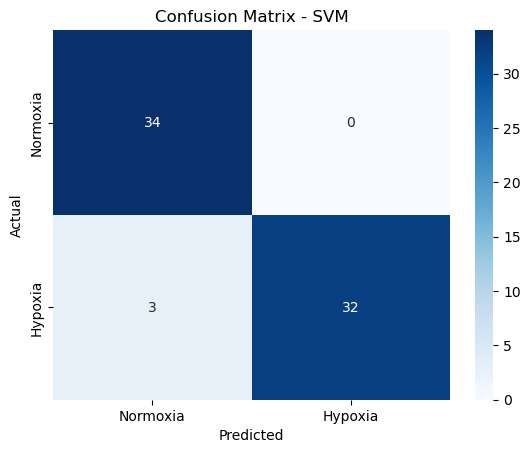


 Evaluating KNN model...
CV Accuracy: 0.9562 ± 0.0363
Holdout Accuracy: 0.9710
Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        34
           1       1.00      0.94      0.97        35

    accuracy                           0.97        69
   macro avg       0.97      0.97      0.97        69
weighted avg       0.97      0.97      0.97        69



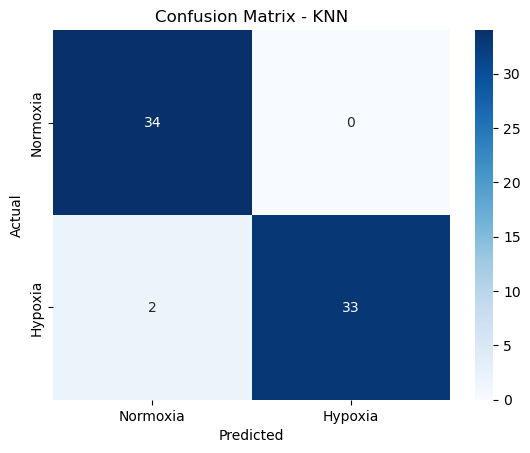

In [234]:
evaluate_baseline_models(X_top, y)


### Comparing feature selection methods

In addition to Random Forest feature importances, we also applied a simple **univariate ANOVA F-test** (SelectKBest with f_classif) to rank genes by how well they separate hypoxia vs normoxia.

- The ANOVA top-50 gene list was highly enriched for known hypoxia markers (e.g., **PGK1, BNIP3, DDIT4, BHLHE40, PDK1, LDHA, CA9**).  
- There was **substantial overlap** with the Random Forest method: **24 genes in common** between the two top-50 sets.  
- Baseline models trained on the ANOVA-selected features achieved **similar classification performance**, only slightly lower than with RF-selected features.  

**Interpretation:**  
- The agreement between methods confirms that the strongest hypoxia-related signal is robust and can be identified by different approaches.  
- The small performance drop with ANOVA likely reflects its **univariate nature** (evaluating genes independently), whereas Random Forest importances account for **non-linear interactions and feature synergy**.  
- For this reason, in the rest of the analysis we proceed with **Random Forest feature importances** as our primary selection strategy, since they provide both strong predictive accuracy and a more biologically realistic view of gene interactions.  


In [235]:
from sklearn.feature_selection import SelectKBest, f_classif

def select_top_genes_anova(X, y, gene_names, top_n=50):
    # Apply univariate ANOVA F-test
    selector = SelectKBest(score_func=f_classif, k=top_n)
    selector.fit(X, y)
    
    scores = selector.scores_
    indices = np.argsort(scores)[::-1][:top_n]
    top_genes = [gene_names[i] for i in indices]
    
    print(f"\n Top {top_n} Genes Selected (ANOVA F-test):")
    for i, idx in enumerate(indices):
        print(f"{i+1}. {gene_names[idx]} (score={scores[idx]:.4f})")
    
    X_top = selector.transform(X)
    return X_top, top_genes

X_top_anova, top_genes_anova = select_top_genes_anova(X, y, gene_names)

# Compare with Random Forest selection
print("\nOverlap between RF and ANOVA top-50 gene sets:")
print(len(set(top_genes).intersection(top_genes_anova)), "genes in common")



 Top 50 Genes Selected (ANOVA F-test):
1. PGK1 (score=164.5044)
2. BNIP3 (score=146.4730)
3. DDIT4 (score=145.7349)
4. BHLHE40 (score=128.8238)
5. BNIP3L (score=125.1714)
6. BNIP3P1 (score=124.7594)
7. PDK1 (score=121.2576)
8. ALDOC (score=117.7328)
9. LDHA (score=115.7318)
10. P4HA1 (score=112.4370)
11. LOXL2 (score=109.8162)
12. BHLHE40-AS1 (score=106.2778)
13. PFKFB3 (score=105.1895)
14. ALDOA (score=104.3806)
15. PGAM1 (score=103.0083)
16. SLC2A1 (score=102.4889)
17. EGLN1 (score=101.0249)
18. LDHAP4 (score=96.8103)
19. EGLN3 (score=96.4984)
20. PLOD2 (score=95.5972)
21. KCTD11 (score=93.5788)
22. AK4 (score=90.4311)
23. ANGPTL4 (score=87.4450)
24. NDRG1 (score=87.2476)
25. GPI (score=86.5143)
26. ANKZF1 (score=85.6825)
27. ENO2 (score=81.1163)
28. FAM162A (score=81.0983)
29. PGK1P2 (score=81.0948)
30. PGM1 (score=80.6590)
31. INSIG2 (score=80.2845)
32. LDHAP5 (score=79.0389)
33. CA9 (score=78.9924)
34. TPBG (score=78.4596)
35. PGK1P1 (score=78.3453)
36. LDHAP2 (score=74.2205)
37.


 Evaluating RandomForest model...
CV Accuracy: 0.9475 ± 0.0402
Holdout Accuracy: 0.9710
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        34
           1       0.97      0.97      0.97        35

    accuracy                           0.97        69
   macro avg       0.97      0.97      0.97        69
weighted avg       0.97      0.97      0.97        69



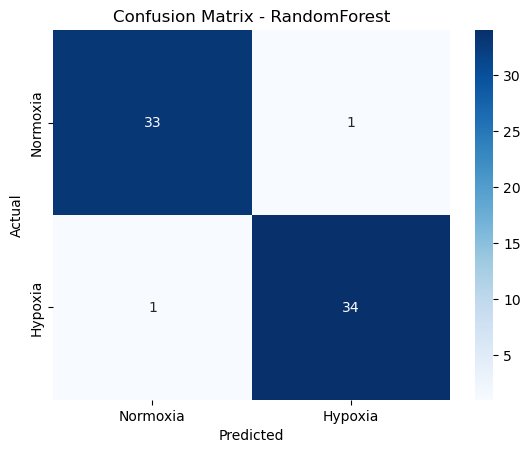


 Evaluating SVM model...
CV Accuracy: 0.9518 ± 0.0420
Holdout Accuracy: 0.9855
Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        34
           1       1.00      0.97      0.99        35

    accuracy                           0.99        69
   macro avg       0.99      0.99      0.99        69
weighted avg       0.99      0.99      0.99        69



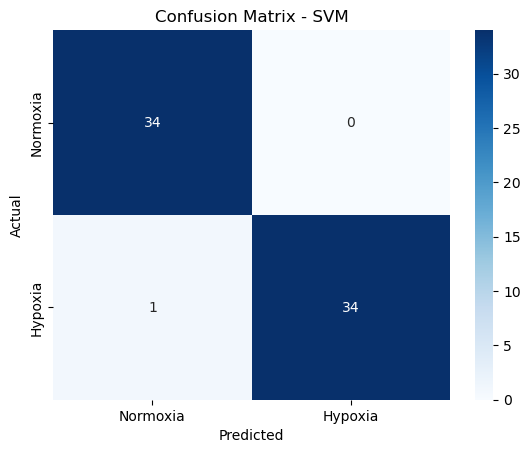


 Evaluating KNN model...
CV Accuracy: 0.9561 ± 0.0336
Holdout Accuracy: 0.9420
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94        34
           1       0.94      0.94      0.94        35

    accuracy                           0.94        69
   macro avg       0.94      0.94      0.94        69
weighted avg       0.94      0.94      0.94        69



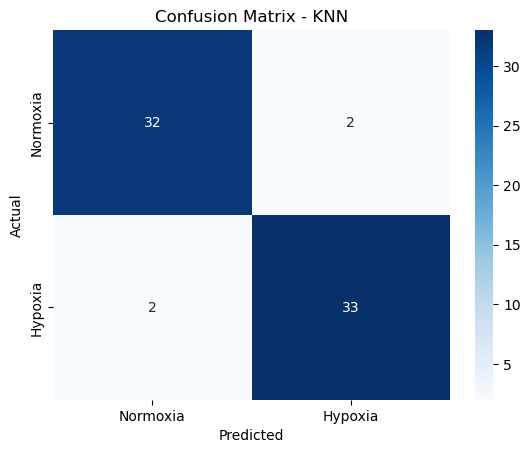

In [236]:
evaluate_baseline_models(X_top_anova, y)


## 4. Full Evaluation Across All Datasets

In this section, we systematically evaluate all six datasets (HCC and MCF7 cell lines, both SmartSeq and DropSeq technologies). We first consider both the full and reduced versions in order to assess which one can be more adequate to our analysis, and whether the reduced datasets can obtain higher accuracies.

For each dataset, we:

1. **Preprocess the data** (load, extract labels, standardize)
2. **Train baseline models** (Random Forest, SVM, KNN) using the **full gene set**
3. **Apply feature selection** using Random Forest to identify the top 50 most important genes
4. **Train models again** using only the top 50 genes
5. **Log performance metrics** (cross-validation and holdout accuracy) for both Full and Top50
6. **Store the selected genes** for further analysis (e.g., overlap, frequency, generalization)

This pipeline populates:
- A `results` list containing all evaluation scores
- A `top_genes_dict` dictionary mapping each dataset to its top 50 genes


In [237]:
# Imports and global structures
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_val_score, StratifiedKFold, train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

results = []                    
top_genes_dict = {}            


In [238]:
# Logging helper
def log_model_results(model_name, feature_set, cv_scores, holdout_acc):
    """
    Appends model performance to global results list.
    """
    results.append({
        'Model': model_name,
        'Features': feature_set,
        'CV Mean': np.mean(cv_scores),
        'CV Std': np.std(cv_scores),
        'Holdout Accuracy': holdout_acc
    })


In [239]:
# Model training and logging

def evaluate_models_and_log(X, y, feature_set='Full', model_names=None,
                            cv_folds=5, test_size=0.3, random_state=42):
    if model_names is None:
        model_names = ['RandomForest', 'SVM', 'KNN']
        
    models = {
        'RandomForest': RandomForestClassifier(random_state=random_state),
        'SVM': LinearSVC(max_iter=10000, dual=False, random_state=random_state),
        'KNN': KNeighborsClassifier(n_neighbors=5)
    }

    cv = StratifiedKFold(n_splits=cv_folds, shuffle=True, random_state=random_state)

    for name in model_names:
        print(f"\n Evaluating {name} ({feature_set})...")
        model = models[name]
        cv_scores = cross_val_score(model, X, y, cv=cv)

        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size,
                                                            stratify=y, random_state=random_state)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        holdout_acc = accuracy_score(y_test, y_pred)

        log_model_results(name, feature_set, cv_scores, holdout_acc)
        print(f"CV Accuracy: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")
        print(f"Holdout Accuracy: {holdout_acc:.4f}")


In [240]:
# Dataset-wide pipeline 
def run_pipeline_on_dataset(file_path, dataset_name, top_n=50):
    """
    Runs preprocessing, training, feature selection, and retraining for a single dataset.
    Logs results into the global `results` list and stores top genes.
    """
    print(f"\n Processing dataset: {dataset_name}")
    
    # Preprocess
    X, y, sample_names, gene_names = preprocess_dataset(file_path)

    # Baseline (Full)
    evaluate_models_and_log(X, y, feature_set='Full')

    # Top 50 genes
    X_top, top_genes = select_top_genes(X, y, gene_names, top_n=top_n)
    evaluate_models_and_log(X_top, y, feature_set='Top50')

    # Save top genes
    top_genes_dict[dataset_name] = top_genes

    # Add dataset name to the last 6 results (3 models × 2 feature sets)
    for entry in results[-6:]:
        entry['Dataset'] = dataset_name


In [243]:
# Dataset list + execution
dataset_list = [
    ("HCC1806_SmartS_Filtered_Data.txt", "HCC SmartSeq Full"),
    ("HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt", "HCC SmartSeq 3000"),
    ("HCC1806_Filtered_Normalised_3000_Data_train.txt", "HCC DropSeq 3000"),
    ("MCF7_SmartS_Filtered_Data.txt", "MCF7 SmartSeq Full"),
    ("MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt", "MCF7 SmartSeq 3000"),
    ("MCF7_Filtered_Normalised_3000_Data_train.txt", "MCF7 DropSeq 3000"),
]


In [244]:
# Runs the pipeline for all datasets
results = []  # Reset results before running
top_genes_dict = {}  # Reset top genes as well

for file_path, dataset_name in dataset_list:
    run_pipeline_on_dataset(file_path, dataset_name)



 Processing dataset: HCC SmartSeq Full
  Loaded: HCC1806_SmartS_Filtered_Data.txt
   Shape: (227, 19503) (cells x genes)
   Labels: 116 hypoxia, 111 normoxia

 Evaluating RandomForest (Full)...
CV Accuracy: 0.9517 ± 0.0352
Holdout Accuracy: 0.9565

 Evaluating SVM (Full)...
CV Accuracy: 0.9430 ± 0.0292
Holdout Accuracy: 0.9565

 Evaluating KNN (Full)...
CV Accuracy: 0.6038 ± 0.0367
Holdout Accuracy: 0.5507

 Top 50 Genes Selected:
1. EGLN3 (0.0253)
2. ANGPTL4 (0.0195)
3. CA9 (0.0167)
4. BHLHE40-AS1 (0.0157)
5. PGK1 (0.0126)
6. FUT11 (0.0107)
7. ASB2 (0.0101)
8. MOB3A (0.0097)
9. LBH (0.0095)
10. SLC2A1 (0.0087)
11. LOXL2 (0.0085)
12. CCNG2 (0.0075)
13. INSIG2 (0.0074)
14. PNCK (0.0072)
15. BNIP3P1 (0.0071)
16. PFKFB3 (0.0071)
17. BTG1 (0.0065)
18. FOSL2 (0.0064)
19. SLC6A8 (0.0063)
20. ENO2 (0.0059)
21. HILPDA (0.0057)
22. BNIP3 (0.0056)
23. P4HA1 (0.0054)
24. PLOD2 (0.0051)
25. ENTPD4 (0.0050)
26. RPL17P50 (0.0050)
27. ANKRD37 (0.0047)
28. ANKZF1 (0.0047)
29. MIR614 (0.0046)
30. ARRD

> **Note on Linear SVM warnings:** LinearSVC can emit numerical warnings on very high-dimensional, sparse-ish data.

After evaluating all datasets and logging the performance metrics, we convert the results list into a structured DataFrame (`results_df`). This table summarizes cross-validation and holdout performance for each model, feature set, and dataset.


In [245]:
results_df = pd.DataFrame(results)
results_df.index += 1 # remove cv std column
results_df = results_df.drop(columns=['CV Std'])
results_df


,Model,Features,CV Mean,Holdout Accuracy,Dataset
1,RandomForest,Full,0.951691,0.956522,HCC SmartSeq Full
2,SVM,Full,0.942995,0.956522,HCC SmartSeq Full
3,KNN,Full,0.603768,0.550725,HCC SmartSeq Full
4,RandomForest,Top50,0.956425,1.000000,HCC SmartSeq Full
5,SVM,Top50,0.973623,0.956522,HCC SmartSeq Full
6,KNN,Top50,0.956232,0.971014,HCC SmartSeq Full
7,RandomForest,Full,0.989039,0.981818,HCC SmartSeq 3000
8,SVM,Full,0.967117,0.945455,HCC SmartSeq 3000
9,KNN,Full,0.747147,0.690909,HCC SmartSeq 3000
10,RandomForest,Top50,0.989039,0.981818,HCC SmartSeq 3000


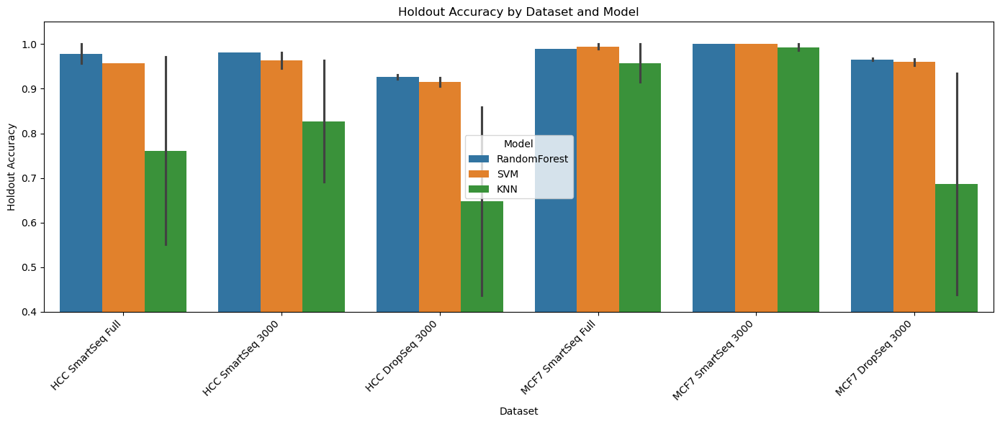

In [246]:
plt.figure(figsize=(14, 6))
sns.barplot(data=results_df, x='Dataset', y='Holdout Accuracy', hue='Model')
plt.title("Holdout Accuracy by Dataset and Model")
plt.xticks(rotation=45, ha='right')
plt.ylim(0.4, 1.05)
plt.tight_layout()
plt.show()

### Full vs. Top-50 Feature Evaluation

Across all six datasets, we compared baseline models trained on the **full gene set** against models trained only on the **top-50 genes** identified by Random Forest feature importance.

**General trends:**
- For **Random Forest** and **SVM**, performance remained almost identical between Full and Top-50.  
  - This shows that the top-50 subset retained nearly all predictive signal, and in some cases even slightly improved performance by removing noise.  
- For **KNN**, the difference was striking:  
  - On the Full datasets, KNN consistently underperformed, with cross-validation accuracies as low as ~0.43–0.60 (e.g. HCC DropSeq 3000, HCC SmartSeq Full).  
  - When restricted to the Top-50 genes, KNN accuracies rose dramatically, often to **0.85–0.97** and in some cases reaching **1.00** (MCF7 SmartSeq datasets).  

**Why does KNN improve with fewer features?**  
- KNN is highly sensitive to the **curse of dimensionality**.  
- In very high-dimensional spaces (thousands of genes), distances between samples become less meaningful, and noise dominates the neighborhood structure.  
- By restricting the feature space to the 50 most informative genes, the classifier focuses only on signal, making nearest-neighbor comparisons more reliable.  
- This explains why KNN, which looked weak on full datasets, becomes competitive once dimensionality is reduced.

**Conclusion:**  
- Overall, using **Top-50 features** is preferable: it preserves (or improves) Random Forest and SVM performance and transforms KNN from a poor to a strong performer.  
- Since dimensionality reduction improves interpretability while maintaining accuracy, the **Top-50 models** represent the better choice for downstream analyses.  


---

## Top 50 Genes Analysis

In this section, we further analyze the genes most frequently selected as top features across all datasets. 
### Steps Performed:

1. **Frequency Table**  
   We count how many times each gene appears among the top 50 selected genes across the different datasets.

2. **Barplot of Gene Frequencies**  
   A barplot is generated to visualize the most frequently selected genes, helping us identify the most recurrent features.


3. **Venn Diagram (Subset)**  
   A Venn diagram visualizes gene overlaps between selected datasets (e.g., HCC DropSeq 3000, HCC SmartSeq 3000, and MCF7 SmartSeq Full), offering insight into common and unique gene signatures.

4. **Performance Visualization**  
   We visualize how model holdout accuracy varies across datasets and between full features vs. top 50 gene subsets:
   - Accuracy grouped by Model and Feature Set (Full vs Top50)
   - Lineplot comparing Full vs Top50 features per dataset for each model


---

### Objectives:

- Identify consistently important genes across experiments
- Assess how much feature selection improves or preserves model performance
- Examine whether some genes generalize better across cell lines and technologies



---

### Choice of Datasets 

In the baseline evaluation we considered all **six datasets**:  
- HCC1806 SmartSeq (Full + 3000 genes)  
- HCC1806 DropSeq (3000 genes)  
- MCF7 SmartSeq (Full + 3000 genes)  
- MCF7 DropSeq (3000 genes)  

However, from now on we are only going to use **four datasets** (the reduced 3000-gene versions for each condition).  

The reason is that the two SmartSeq datasets (Full and 3000 genes) are essentially **derived from the same cells**. Including both would mean analyzing the same biological samples twice, artificially inflating the results and biasing gene recurrence frequencies.  

By restricting to the reduced 3000-gene datasets for each cell line and technology, we ensure that:  
- Each dataset represents a **unique set of cells** (no duplicates).  
- The comparison of Top-50 lists is **fair across all datasets**, since all start from a comparable feature space (3000 genes).  
- Any overlap observed in the Top-50 genes reflects **true cross-dataset consistency**, not repeated sampling of the same data.  

---

In [247]:
from collections import Counter
import pandas as pd

selected_datasets = [
    "HCC SmartSeq 3000",
    "HCC DropSeq 3000",
    "MCF7 SmartSeq 3000",
    "MCF7 DropSeq 3000"
]

# Extract top genes for the 4 datasets
filtered_top_genes_dict = {
    k: v for k, v in top_genes_dict.items() if k in selected_datasets
}

# Flatten all top genes into one list
flat_genes = [gene for genes in filtered_top_genes_dict.values() for gene in genes]

# Count occurrences
gene_counts = Counter(flat_genes)

# Turn into DataFrame
gene_freq_df = pd.DataFrame(gene_counts.items(), columns=["Gene", "Count"])
gene_freq_df = gene_freq_df.sort_values(by="Count", ascending=False)


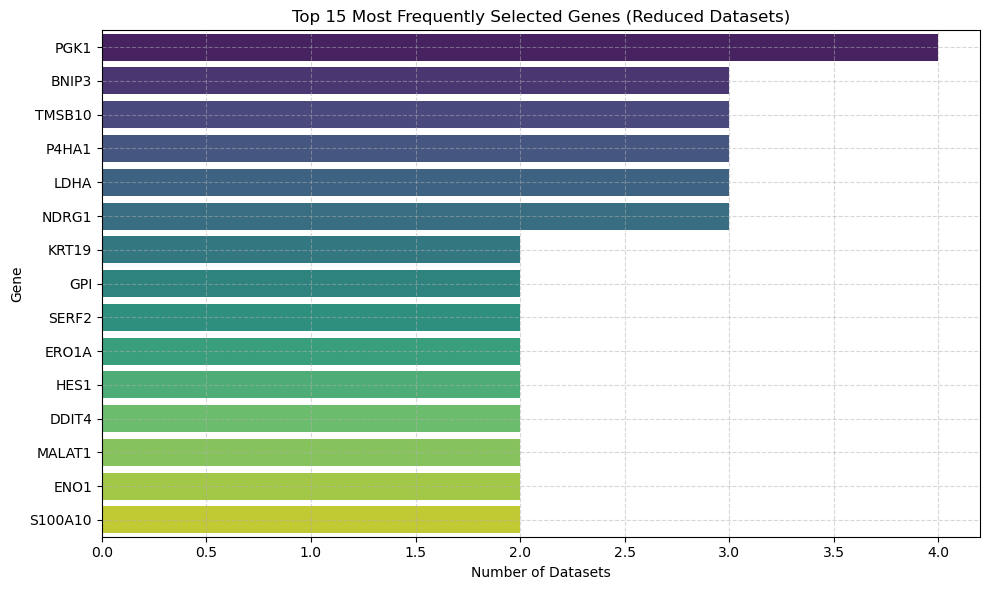

In [248]:
import seaborn as sns
import matplotlib.pyplot as plt

# --- Plot Most Frequent Genes ---
top_n = 15
plt.figure(figsize=(10, 6))
sns.barplot(data=gene_freq_df.head(top_n), x="Count", y="Gene", hue="Gene", dodge=False, legend=False, palette="viridis")
plt.title(f"Top {top_n} Most Frequently Selected Genes (Reduced Datasets)")
plt.xlabel("Number of Datasets")
plt.ylabel("Gene")
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


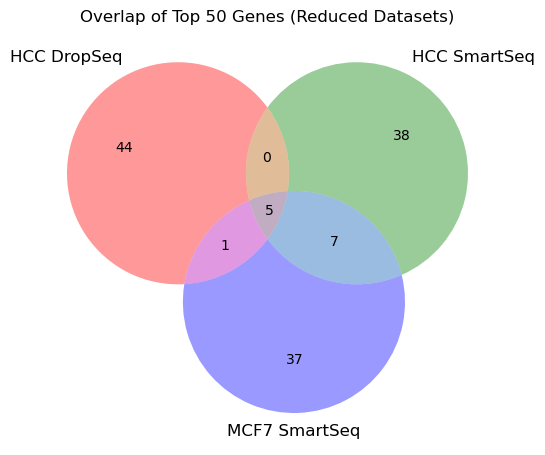

In [250]:
from matplotlib_venn import venn3

# Venn Diagram (picking 3 of the 4 datasets) ---
set1 = set(filtered_top_genes_dict["HCC DropSeq 3000"])
set2 = set(filtered_top_genes_dict["HCC SmartSeq 3000"])
set3 = set(filtered_top_genes_dict["MCF7 SmartSeq 3000"])  

plt.figure(figsize=(6, 6))
venn3([set1, set2, set3], set_labels=["HCC DropSeq", "HCC SmartSeq", "MCF7 SmartSeq"])
plt.title("Overlap of Top 50 Genes (Reduced Datasets)")
plt.show()


### Barplot: Holdout Accuracy by Model and Feature Set

This plot shows the **average holdout accuracy across all datasets**, grouped by model and feature set. The error bars represent the **standard deviation** of accuracy across datasets.

#### Observations:
- **Random Forest** is consistently strong across both Full and Top50 features, with minimal variation.
- **SVM** performs very well, slightly better on average with Top50 features.
- **KNN** performs **poorly** on Full features (mean ~67%, high variance), but **dramatically improves** when using only the Top50 (mean ~95%, low variance).

---

### Dataset-Wise Accuracy: Full vs Top50 per Model

This lineplot tracks the holdout accuracy for each model on each individual dataset, comparing Full and Top50 features.

#### Observations:
- **Random Forest** maintains high accuracy across all datasets, with little to no difference between Full and Top50.
- **SVM** shows slight improvements in challenging datasets when using Top50 genes.
- **KNN** suffers severe performance drops on datasets like **HCC DropSeq 3000** and **MCF7 DropSeq 3000** when using Full features.
    - However, with Top50, KNN becomes competitive and stable on all datasets, for the reasons we previously stated.

---

## Final Conclusions

- **Feature selection (Top 50 genes)** has a **massive impact** on performance, particularly for KNN.
- **Random Forest** and **SVM** are robust across all datasets, with or without feature selection, though SVM benefits slightly more.
- **KNN** is not viable without feature selection due to high-dimensional noise, but performs very well with it.
- The **DropSeq datasets** are more challenging (likely noisier or less informative), but models trained on Top50 genes still perform well.

### Implication:
> Feature selection is not just useful for interpretability: it significantly improves generalization and model reliability, especially for models sensitive to dimensionality like KNN.


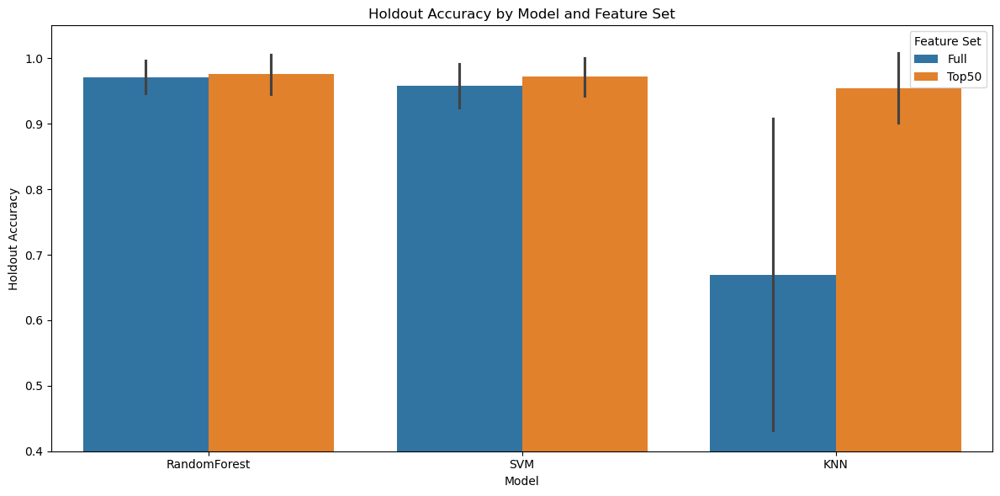

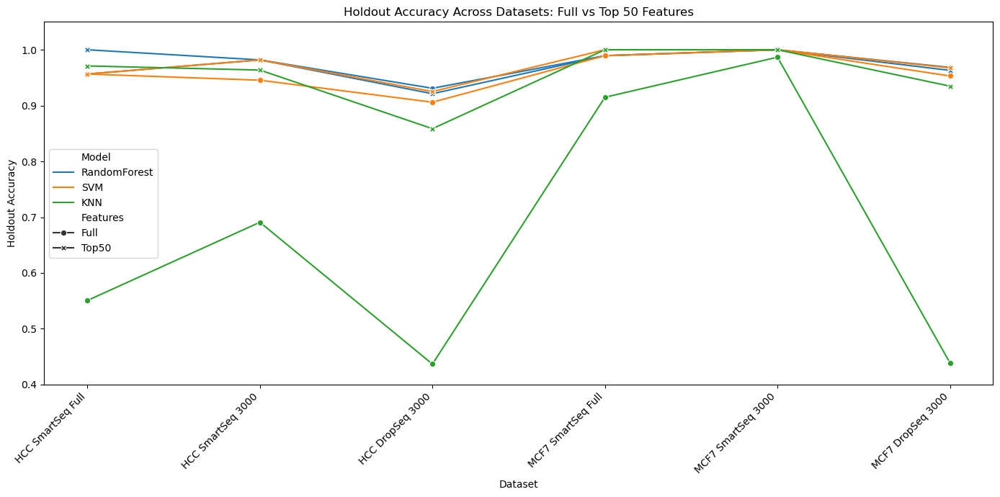

In [251]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# PLOT 1: Holdout Accuracy vs Model grouped by Features
plt.figure(figsize=(12, 6))
sns.barplot(data=results_df, x="Model", y="Holdout Accuracy", hue="Features", errorbar="sd")
plt.title("Holdout Accuracy by Model and Feature Set")
plt.ylim(0.4, 1.05)
plt.legend(title="Feature Set")
plt.tight_layout()
plt.show()

# PLOT 2: Lineplot per Dataset: Full vs Top50 for each Model
plt.figure(figsize=(14, 7))
sns.lineplot(data=results_df, x="Dataset", y="Holdout Accuracy", hue="Model", style="Features", markers=True, dashes=False)
plt.title("Holdout Accuracy Across Datasets: Full vs Top 50 Features")
plt.xticks(rotation=45, ha="right")
plt.ylim(0.4, 1.05)
plt.tight_layout()
plt.show()


## Training Classifiers on the Most Frequently Selected Genes

In this section, we explore whether a **compact set of biologically relevant genes**, consistently identified as important across multiple datasets, can serve as effective features for classification models. This approach evaluates the potential for constructing **generalizable, interpretable, and low-dimensional classifiers** that remain robust across cell types and sequencing technologies.

---

### Objective

The goal is to test whether models trained using only the **most frequently selected genes** (i.e., genes appearing in the top 50 most important features in several datasets) can still achieve high performance. This would demonstrate the viability of minimal-feature, biologically meaningful classifiers.

---

### Methodology

1. **Aggregating Gene Importance Across Datasets**  
   - From previous steps, each dataset has a list of its top 50 most important genes, as determined by feature importance from Random Forest classifiers.
   - These gene lists were aggregated, and the frequency of each gene across datasets was counted.
   - A threshold was set to select genes that appear in **at least 2 different datasets**, resulting in a small list of highly frequent genes (28 in this case).

2. **Filtering Genes per Dataset**  
   - For each dataset, we intersected its gene list with the global list of common top genes.
   - Only datasets with **at least 5 of the frequent genes present** were retained to ensure meaningful model input.

3. **Model Training and Evaluation**  
   - For each remaining dataset:
     - A **Random Forest classifier** was trained using only the selected frequent genes as input features.
     - Two evaluation protocols were used:
       - **Cross-validation** (5-fold stratified): assesses model consistency and robustness.
       - **Holdout testing** (70/30 split): estimates generalization to unseen samples.
   - Model performance metrics such as mean cross-validation accuracy, standard deviation, and holdout accuracy were recorded.

---

### Analysis and Observations

- Despite the drastic dimensionality reduction (from thousands of genes to ~28), the classifiers retained **high predictive performance** in most datasets, especially SmartSeq-based ones.
- This result suggests that a **core set of hypoxia-relevant genes** is conserved across biological contexts, supporting the idea of a general biomarker signature.
- Overall, the approach validates both the **biological relevance** and **technical robustness** of the selected genes, and offers a foundation for building general classifiers or guiding experimental validation.



This analysis demonstrates that hypoxia classification does not require thousands of input features. A relatively small set of 28 genes, consistently identified across datasets, is sufficient to train accurate classifiers. This finding highlights the presence of a robust and biologically meaningful core hypoxia signature, offering both interpretability and practical advantages such as reduced complexity and potential clinical applicability.


In [252]:
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import pandas as pd
import numpy as np
import random 

SEED = 42
np.random.seed(SEED)
random.seed(SEED)

# Select genes that appear in at least 2 of the 4 reduced datasets
common_top_genes = gene_freq_df[gene_freq_df['Count'] >= 2]['Gene'].tolist()
print(f"\n{len(common_top_genes)} genes selected that appear in ≥ 2 datasets.")

# Define only the 4 reduced datasets
reduced_dataset_list = [
    ("HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt", "HCC SmartSeq 3000"),
    ("HCC1806_Filtered_Normalised_3000_Data_train.txt", "HCC DropSeq 3000"),
    ("MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt", "MCF7 SmartSeq 3000"),
    ("MCF7_Filtered_Normalised_3000_Data_train.txt", "MCF7 DropSeq 3000")
]

# Track results
frequent_gene_results = []

# Loop through only the selected datasets
for file_path, dataset_name in reduced_dataset_list:
    print(f"\nProcessing dataset: {dataset_name}")
    X, y, sample_names, gene_names = preprocess_dataset(file_path)

    # Convert to DataFrame for easier filtering
    X_df = pd.DataFrame(X, columns=gene_names)

    # Keep only genes that are both in the dataset and in the selected common genes
    available_genes = list(set(X_df.columns) & set(common_top_genes))
    if len(available_genes) < 5:
        print(f"Skipping {dataset_name} — only {len(available_genes)} common genes present.")
        continue

    # Reduce data to selected features
    X_common = X_df[available_genes].values

    # Train model
    model = RandomForestClassifier(random_state=42)

    # Cross-validation
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X_common, y, cv=cv)

    # Holdout
    X_train, X_test, y_train, y_test = train_test_split(
        X_common, y, test_size=0.3, random_state=42, stratify=y
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    holdout_acc = accuracy_score(y_test, y_pred)

    # Log results
    frequent_gene_results.append({
        "Dataset": dataset_name,
        "Genes Used": len(available_genes),
        "CV Mean": np.mean(cv_scores),
        "CV Std": np.std(cv_scores),
        "Holdout Accuracy": holdout_acc
    })

freq_df = pd.DataFrame(frequent_gene_results)
print("\nModel performance using the most frequently selected genes:")
display(freq_df)  



28 genes selected that appear in ≥ 2 datasets.

Processing dataset: HCC SmartSeq 3000
  Loaded: HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt
   Shape: (182, 3000) (cells x genes)
   Labels: 97 hypoxia, 85 normoxia

Processing dataset: HCC DropSeq 3000
  Loaded: HCC1806_Filtered_Normalised_3000_Data_train.txt
   Shape: (14682, 3000) (cells x genes)
   Labels: 8899 hypoxia, 5783 normoxia

Processing dataset: MCF7 SmartSeq 3000
  Loaded: MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt
   Shape: (250, 3000) (cells x genes)
   Labels: 124 hypoxia, 126 normoxia

Processing dataset: MCF7 DropSeq 3000
  Loaded: MCF7_Filtered_Normalised_3000_Data_train.txt
   Shape: (21626, 3000) (cells x genes)
   Labels: 8921 hypoxia, 12705 normoxia

Model performance using the most frequently selected genes:


,Dataset,Genes Used,CV Mean,CV Std,Holdout Accuracy
0,HCC SmartSeq 3000,19,0.989039,0.013426,0.981818
1,HCC DropSeq 3000,27,0.843141,0.003524,0.842225
2,MCF7 SmartSeq 3000,20,0.996000,0.008000,1.000000
3,MCF7 DropSeq 3000,17,0.930963,0.003126,0.932182


The analysis of the top 28 genes marked an important step in reducing dimensionality while retaining biologically meaningful features. By focusing on genes that appeared repeatedly across different datasets, the goal was to identify a compact set of predictors that are not only informative within individual contexts but also consistent across cell lines and sequencing technologies. This stage therefore addressed the interpretability question: can hypoxia classification be achieved with a small and stable set of genes instead of thousands?

However, even if these genes are recurrently selected, an equally important question is whether classifiers trained on one dataset can be applied successfully to others. In other words, beyond feature stability, we need to evaluate model transferability across biological conditions (HCC1806 vs. MCF7) and technical platforms (SmartSeq vs. DropSeq). To explore this, the next part of the workflow implements cross-dataset testing, where models are trained on one dataset and directly evaluated on the others. This shift expands the scope of the project from feature interpretability to generalization, assessing how robust the learned decision boundaries are when applied outside their original training domain.


## 6. Cross-Dataset Evaluation (Train on one, Test on the others)

We now want to assess **transferability**: does a model trained on one dataset generalize to the others despite biological (HCC1806 vs MCF7) and technical (SmartSeq vs DropSeq) shifts? This reveals how robust our hypoxia vs normoxia signal is to domain changes. 

We start by using the Top-28 Gene Panel obtained previously.


Let us open and preprocess the datasets

In [253]:
X_h_ds, y_h_ds, sample_names_h_ds, gene_names_h_ds = preprocess_dataset("HCC1806_Filtered_Normalised_3000_Data_train.txt")
X_m_ds, y_m_ds, sample_names_m_ds, gene_names_m_ds = preprocess_dataset("MCF7_Filtered_Normalised_3000_Data_train.txt")
X_h_ss, y_h_ss, sample_names_h_ss, gene_names_h_ss = preprocess_dataset("HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt")
X_m_ss, y_m_ss, sample_names_m_ss, gene_names_m_ss = preprocess_dataset("MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt")

  Loaded: HCC1806_Filtered_Normalised_3000_Data_train.txt
   Shape: (14682, 3000) (cells x genes)
   Labels: 8899 hypoxia, 5783 normoxia
  Loaded: MCF7_Filtered_Normalised_3000_Data_train.txt
   Shape: (21626, 3000) (cells x genes)
   Labels: 8921 hypoxia, 12705 normoxia
  Loaded: HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt
   Shape: (182, 3000) (cells x genes)
   Labels: 97 hypoxia, 85 normoxia
  Loaded: MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt
   Shape: (250, 3000) (cells x genes)
   Labels: 124 hypoxia, 126 normoxia


In [254]:
datasets = {
    "HCC1806_DropSeq":   (X_h_ds, y_h_ds, gene_names_h_ds),
    "MCF7_DropSeq":      (X_m_ds, y_m_ds, gene_names_m_ds),
    "HCC1806_SmartSeq":  (X_h_ss, y_h_ss, gene_names_h_ss),
    "MCF7_SmartSeq":     (X_m_ss, y_m_ss, gene_names_m_ss),
}


This next function trains a Random Forest classifier on one dataset using only a predefined list of top genes, then tests it on every other dataset that shares enough of those genes. For each (train, test) pair it standardizes the data, fits the model, makes predictions, and records the classification accuracy in a results matrix, which provides a cross-dataset performance comparison.

In [255]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.base import clone
import pandas as pd
import numpy as np

def cross_test_top28(datasets, top_genes, min_shared_genes=10, seed=42):
    model = RandomForestClassifier(n_estimators=200, random_state=seed, n_jobs=-1)
    scaler = StandardScaler()
    acc_matrix = pd.DataFrame(index=datasets.keys(), columns=datasets.keys())

    for train_name, (X_train_full, y_train, g_train) in datasets.items():
        g_train_set = set(g_train)
        train_genes = [g for g in top_genes if g in g_train_set]
        if len(train_genes) < min_shared_genes:
            continue
        train_idx = [g_train.index(g) for g in train_genes]
        X_train = X_train_full[:, train_idx]
        scaler.fit(X_train)
        X_train = scaler.transform(X_train)
        clf = clone(model)
        clf.fit(X_train, y_train)

        for test_name, (X_test_full, y_test, g_test) in datasets.items():
            shared_genes = [g for g in train_genes if g in g_test]
            if len(shared_genes) < min_shared_genes:
                continue
            train_idx = [g_train.index(g) for g in shared_genes]
            test_idx = [g_test.index(g) for g in shared_genes]
            X_train_shared = X_train_full[:, train_idx]
            X_test_shared = X_test_full[:, test_idx]
            scaler.fit(X_train_shared)
            X_train_scaled = scaler.transform(X_train_shared)
            X_test_scaled = scaler.transform(X_test_shared)
            clf = clone(model).fit(X_train_scaled, y_train)
            y_pred = clf.predict(X_test_scaled)
            acc = accuracy_score(y_test, y_pred)
            acc_matrix.loc[train_name, test_name] = round(acc, 3)

    return acc_matrix


In [256]:
top28_genes = common_top_genes 
acc_df = cross_test_top28(datasets, top28_genes)
print("Cross-dataset accuracy (Top-28 genes):")
display(acc_df)


Cross-dataset accuracy (Top-28 genes):


,HCC1806_DropSeq,MCF7_DropSeq,HCC1806_SmartSeq,MCF7_SmartSeq
HCC1806_DropSeq,0.998,0.713,0.764,0.86
MCF7_DropSeq,0.555,0.999,NaN,NaN
HCC1806_SmartSeq,0.606,NaN,1.0,0.98
MCF7_SmartSeq,0.611,NaN,0.978,1.0



The table above shows classification accuracy when training on one dataset (rows) and testing on another (columns). Diagonal values represent **within-dataset performance**, while off-diagonal entries indicate **cross-dataset transferability**. `NaN` values occur when there were too few shared genes (< 10) between the datasets to perform evaluation.


### Key observations
- **Within-dataset performance is excellent**: all diagonal values are ~0.99–1.00, confirming that the Top-28 genes are highly predictive when training and testing on the same distribution.  
- **Cross-dataset performance is moderate**:
  - Models trained on **HCC1806_DropSeq** generalize reasonably to other datasets (0.71 on MCF7_DropSeq, 0.76 on HCC1806_SmartSeq, 0.86 on MCF7_SmartSeq).
  - Models trained on **SmartSeq datasets** (HCC1806 or MCF7) transfer moderately to each other (~0.98) but drop substantially when tested on DropSeq (~0.61).  
  - **MCF7_DropSeq** shows the weakest generalization, performing poorly on HCC1806_DropSeq (0.55) and unable to transfer to SmartSeq datasets (insufficient shared genes).  

### Interpretation
- The **Top-28 gene panel is robust within each dataset** and between SmartSeq platforms, suggesting that these genes capture a stable hypoxia signature when measured under consistent technology.  
- **DropSeq datasets appear less compatible with SmartSeq datasets**, likely due to differences in gene capture efficiency and dropout patterns. This limits cross-technology generalization, especially from MCF7 DropSeq.  
- Despite these limitations, the fact that HCC1806 DropSeq → MCF7 SmartSeq reaches 0.86 accuracy indicates that the reduced panel still retains meaningful biological signal across cell lines and technologies.  

### Conclusion
The Top-28 model successfully demonstrates that **a compact and interpretable gene set can classify hypoxia across datasets**, though **transferability is strongly affected by sequencing technology**. This highlights the need for either harmonization across platforms or the use of larger shared panels when aiming for robust cross-technology generalization.


### Transition to broader cross-model testing
While the Top-28 analysis confirmed that a small, stable gene set can support accurate classification, the cross-dataset results revealed that transferability is strongly dependent on the sequencing platform.  
This raises the question: **are the limitations due to the reduced gene panel itself, or do they also reflect model choice and training strategy?**

To explore this, the next stage extends the cross-testing framework beyond the Top-28 Random Forest models, by benchmarkig multiple learning algorithms across the four reduced datasets. 
 
In the Top-28 stage we deliberately restricted ourselves to Random Forest, both because it was the method used to define the panel and because it offers a fast, non-parametric way to test whether the reduced features still carried predictive signal. Having established that the Top-28 set indeed preserved strong within-dataset performance, the next step is to ask whether this conclusion holds across different model families.

For this reason we now extend the cross-testing framework to include **Logistic Regression** and a **Multi-Layer Perceptron (MLP)** alongside Random Forest. Logistic Regression serves as a transparent linear baseline that can reveal whether the hypoxia signal is linearly separable across domains, while the MLP provides a simple neural benchmark capable of capturing non-linear structure that linear models might miss.

For each dataset, models are fit on its training split and then evaluated not only on its own test split, but also on the test splits of all other datasets, yielding a complete set of train→test cross-evaluations.  
For fair comparison, features are standardized for the linear (LR) and neural (MLP) models, while Random Forest is applied directly.  
Performance is quantified using both **Accuracy** and **ROC-AUC**, the latter measuring how well the classifier separates hypoxia from normoxia across thresholds (0.5 = random chance, 1.0 = perfect separation).  
Results are summarized in per-model matrices, providing a broader view of how algorithmic choices influence cross-dataset generalization.


In [257]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score

datasets_full = {
    "HCC1806_DropSeq": (X_h_ds, y_h_ds),
    "MCF7_DropSeq": (X_m_ds, y_m_ds),
    "HCC1806_SmartSeq": (X_h_ss, y_h_ss),
    "MCF7_SmartSeq": (X_m_ss, y_m_ss),
}

datasets_split = {}
for name, (X, y) in datasets_full.items():
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    datasets_split[name] = {
        "train": (X_train, y_train),
        "test": (X_test, y_test)
    }

models = {
    "LogReg": LogisticRegression(max_iter=5000, solver="lbfgs"),
    "RandomForest": RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1),
    #"SVM": SVC(probability=True, kernel="rbf", C=1.0),
    "MLP": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
}

results_acc = {name: pd.DataFrame(index=datasets_full.keys(), columns=datasets_full.keys()) for name in models}
results_auc = {name: pd.DataFrame(index=datasets_full.keys(), columns=datasets_full.keys()) for name in models}

for model_name, model in models.items():
    print(f"\n=== Model: {model_name} ===")
    
    for train_name, data in datasets_split.items():
        X_train, y_train = data["train"]
        
        scaler = StandardScaler() if model_name in ["LogReg", "SVM", "MLP"] else None
        X_train_proc = scaler.fit_transform(X_train) if scaler else X_train
        
        clf = model
        clf.fit(X_train_proc, y_train)
        
        for test_name, test_data in datasets_split.items():
            X_test, y_test = test_data["test"]
            X_test_proc = scaler.transform(X_test) if scaler else X_test
            
            y_pred = clf.predict(X_test_proc)
            y_proba = clf.predict_proba(X_test_proc)[:, 1]
            
            acc = accuracy_score(y_test, y_pred)
            auc = roc_auc_score(y_test, y_proba)
            
            results_acc[model_name].loc[train_name, test_name] = acc
            results_auc[model_name].loc[train_name, test_name] = auc

for model_name in models:
    print(f"\n{model_name} Accuracy Matrix:\n", results_acc[model_name])
    print(f"\n{model_name} AUC Matrix:\n", results_auc[model_name])


=== Model: LogReg ===

=== Model: RandomForest ===

=== Model: MLP ===

LogReg Accuracy Matrix:
                  HCC1806_DropSeq MCF7_DropSeq HCC1806_SmartSeq MCF7_SmartSeq
HCC1806_DropSeq         0.924072     0.491447         0.486486          0.34
MCF7_DropSeq            0.472591     0.963939         0.405405          0.34
HCC1806_SmartSeq        0.494042     0.454924         0.972973          0.34
MCF7_SmartSeq           0.485189      0.48798         0.648649           1.0

LogReg AUC Matrix:
                  HCC1806_DropSeq MCF7_DropSeq HCC1806_SmartSeq MCF7_SmartSeq
HCC1806_DropSeq         0.974828     0.507518         0.502941        0.3584
MCF7_DropSeq            0.503474     0.993926         0.341176        0.1952
HCC1806_SmartSeq        0.457416     0.452536              1.0        0.3984
MCF7_SmartSeq           0.459893     0.480595         0.605882           1.0

RandomForest Accuracy Matrix:
                  HCC1806_DropSeq MCF7_DropSeq HCC1806_SmartSeq MCF7_SmartSeq
HC

### Cross-Dataset Benchmarking of Multiple Classifiers

The results from Logistic Regression, Random Forest, and MLP all tell a consistent story.  
**Within each dataset, classification is excellent:** diagonal entries in the accuracy and AUC matrices are consistently high (accuracy in the 0.93–1.00 range, AUC close to 1.0). This confirms that hypoxia vs normoxia is a strong signal when training and testing occur on the same domain. In other words, each dataset on its own contains sufficient information to support near-perfect discrimination, regardless of whether the model is linear (LogReg), tree-based (RF), or neural (MLP). The fact that three very different model families converge on the same outcome strengthens the conclusion that the hypoxia signature is robust within datasets.

The situation changes dramatically when moving to **cross-dataset evaluations**. Here, performance drops sharply: off-diagonal entries are typically close to random guessing (accuracy ~0.45–0.60, AUC often ≤0.5). This pattern is especially pronounced when transferring across sequencing technologies: for example, models trained on DropSeq and applied to SmartSeq datasets (or vice versa) rarely perform better than chance. In effect, a classifier that excels in its native dataset becomes almost useless when applied to data generated under a different protocol.

Not all transfers are equally poor, however. There are cases of **moderate generalization** across cell lines when the sequencing platform is the same. For instance, a Random Forest trained on MCF7 SmartSeq reaches ~0.73 accuracy and ~0.91 AUC when tested on HCC1806 SmartSeq. This suggests that cross-line transfer is more feasible when the measurement technology is held constant, implying that technical variability introduces more disruption than biological variability in this setting. Conversely, SmartSeq → DropSeq and DropSeq → SmartSeq transfers consistently collapse, indicating that platform effects dominate.

A particularly striking observation is the presence of **AUC values below 0.5** in some cross-dataset settings. An AUC < 0.5 means the model is systematically misranking the classes, effectively inverting hypoxia and normoxia predictions. This is not what one would expect from random noise: it implies a structured mismatch, such as reversed label semantics, severe batch effects, or strong shifts in gene expression distributions between datasets. Such behavior highlights that the classifiers are not simply failing to generalize; in some cases, they are actively learning patterns that conflict with those in the target dataset.

Taken together, these findings suggest that the bottleneck is not the choice of classifier, since all three model families behave similarly, but the **feature space itself**. Each dataset was generated through different filtering pipelines, retains slightly different subsets of genes, and exhibits technology-specific artifacts such as dropout patterns in DropSeq or dynamic range differences in SmartSeq. As a result, even when classifiers are trained on the same biological question, they are effectively operating on partially incompatible representations. This explains both the poor generalization and the occasional inversion of predictions.

The logical next step is to examine how much overlap actually exists between the datasets at the feature level. If the sets of available genes differ substantially, then models trained on one dataset may simply lack the features needed to perform well on another. To test this hypothesis, we quantify pairwise intersections between the four datasets, and compute the global intersection across all of them. This analysis will reveal whether the limited shared feature space explains the weak transferability observed above.


In [258]:
gene_list_list = [gene_names_h_ds, gene_names_m_ds, gene_names_h_ss, gene_names_m_ss]
dataset_names = ["HCC1806_DropSeq", "MCF7_DropSeq", "HCC1806_SmartSeq", "MCF7_SmartSeq"]

common_counts = pd.DataFrame(index=dataset_names, columns=dataset_names)

for i, genes_i in enumerate(gene_list_list):
    for j, genes_j in enumerate(gene_list_list):
        common = set(genes_i) & set(genes_j)
        common_counts.iloc[i, j] = len(common)
print(common_counts)

common = set(gene_names_h_ds) & set(gene_names_m_ds) & set(gene_names_h_ss) & set(gene_names_m_ss)
count_common = len(common)
print(count_common)


                 HCC1806_DropSeq MCF7_DropSeq HCC1806_SmartSeq MCF7_SmartSeq
HCC1806_DropSeq             3000          834              516           547
MCF7_DropSeq                 834         3000              445           496
HCC1806_SmartSeq             516          445             3000          1208
MCF7_SmartSeq                547          496             1208          3000
70


The overlap analysis revealed that while each pair of datasets shares on the order of **~500 genes**, the intersection across *all four datasets* is much smaller: only **70 genes** are common to every dataset.  
This explains why the earlier cross-dataset tests behaved as if the datasets contained almost entirely different features: in practice, the classifiers were operating on very limited and inconsistent overlaps.

To address this, we introduce a preprocessing function that takes a specified gene list and returns an expression matrix restricted to those genes, ordered consistently across datasets.  
By aligning datasets to the same gene list (e.g., the 70 shared genes), we ensure that training and testing are performed in a harmonized feature space, eliminating mismatches caused by inconsistent filtering pipelines.

In [259]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import os

def filter_rows_by_set(df, allowed_set):

    return df[df.index.isin(allowed_set)]

def sort_rows_alphabetically(df):
    
    return df.sort_index(axis=0)


def preprocess_with_common(file_path, common_set):
    
    df = pd.read_csv(file_path, sep=r"\s+", engine="python", index_col=0)

    df.index = df.index.str.replace('"', '').str.strip()
    df.columns = df.columns.str.replace('"', '').str.strip()

    df = filter_rows_by_set(df, common_set)

    df = sort_rows_alphabetically(df)

    df_T = df.T
    labels = [1 if 'Hypo' in name or 'Hypoxia' in name else 0 for name in df_T.index]
    y = np.array(labels)

    scaler = StandardScaler()
    X_scaled = df_T

    print(f"  Loaded: {os.path.basename(file_path)}")
    print(f"   Shape: {X_scaled.shape} (cells x genes)")
    print(f"   Labels: {np.sum(y)} hypoxia, {len(y) - np.sum(y)} normoxia")

    return X_scaled, y, df_T.index.tolist(), df_T.columns.tolist()

In [260]:
X_h_ds, y_h_ds, sample_names_h_ds, gene_names_h_ds = preprocess_with_common("HCC1806_Filtered_Normalised_3000_Data_train.txt", common)
X_m_ds, y_m_ds, sample_names_m_ds, gene_names_m_ds = preprocess_with_common("MCF7_Filtered_Normalised_3000_Data_train.txt", common)
X_h_ss, y_h_ss, sample_names_h_ss, gene_names_h_ss = preprocess_with_common("HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt", common)
X_m_ss, y_m_ss, sample_names_m_ss, gene_names_m_ss = preprocess_with_common("MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt", common)

  Loaded: HCC1806_Filtered_Normalised_3000_Data_train.txt
   Shape: (14682, 70) (cells x genes)
   Labels: 8899 hypoxia, 5783 normoxia
  Loaded: MCF7_Filtered_Normalised_3000_Data_train.txt
   Shape: (21626, 70) (cells x genes)
   Labels: 8921 hypoxia, 12705 normoxia
  Loaded: HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt
   Shape: (182, 70) (cells x genes)
   Labels: 97 hypoxia, 85 normoxia
  Loaded: MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt
   Shape: (250, 70) (cells x genes)
   Labels: 124 hypoxia, 126 normoxia


Now that all the datasets have the same features we can use the same code as before for the cross-testing.

In [261]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score

datasets_full = {
    "HCC1806_DropSeq": (X_h_ds, y_h_ds),
    "MCF7_DropSeq": (X_m_ds, y_m_ds),
    "HCC1806_SmartSeq": (X_h_ss, y_h_ss),
    "MCF7_SmartSeq": (X_m_ss, y_m_ss),
}

datasets_split = {}
for name, (X, y) in datasets_full.items():
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    datasets_split[name] = {
        "train": (X_train, y_train),
        "test": (X_test, y_test)
    }

models = {
    "LogReg": LogisticRegression(max_iter=5000, solver="lbfgs"),
    "RandomForest": RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1),
    #"SVM": SVC(probability=True, kernel="rbf", C=1.0),
    "MLP": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
}

results_acc = {name: pd.DataFrame(index=datasets_full.keys(), columns=datasets_full.keys()) for name in models}
results_auc = {name: pd.DataFrame(index=datasets_full.keys(), columns=datasets_full.keys()) for name in models}

for model_name, model in models.items():
    print(f"\n=== Model: {model_name} ===")
    
    for train_name, data in datasets_split.items():
        X_train, y_train = data["train"]
        
        scaler = StandardScaler() if model_name in ["LogReg", "SVM", "MLP"] else None
        X_train_proc = scaler.fit_transform(X_train) if scaler else X_train
        
        clf = model
        clf.fit(X_train_proc, y_train)
        
        for test_name, test_data in datasets_split.items():
            X_test, y_test = test_data["test"]
            X_test_proc = scaler.transform(X_test) if scaler else X_test
            
            y_pred = clf.predict(X_test_proc)
            y_proba = clf.predict_proba(X_test_proc)[:, 1]
            
            acc = accuracy_score(y_test, y_pred)
            auc = roc_auc_score(y_test, y_proba)
            
            results_acc[model_name].loc[train_name, test_name] = acc
            results_auc[model_name].loc[train_name, test_name] = auc

for model_name in models:
    print(f"\n{model_name} Accuracy Matrix:\n", results_acc[model_name])
    print(f"\n{model_name} AUC Matrix:\n", results_auc[model_name])


=== Model: LogReg ===

=== Model: RandomForest ===

=== Model: MLP ===


/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(



LogReg Accuracy Matrix:
                  HCC1806_DropSeq MCF7_DropSeq HCC1806_SmartSeq MCF7_SmartSeq
HCC1806_DropSeq         0.741914     0.560333         0.918919          0.96
MCF7_DropSeq             0.54954     0.917707         0.432432          0.92
HCC1806_SmartSeq        0.393939     0.587379         0.918919          0.94
MCF7_SmartSeq           0.393939     0.587379         0.486486           1.0

LogReg AUC Matrix:
                  HCC1806_DropSeq MCF7_DropSeq HCC1806_SmartSeq MCF7_SmartSeq
HCC1806_DropSeq         0.799849     0.895606            0.925          0.96
MCF7_DropSeq            0.599958     0.973343         0.466176          0.92
HCC1806_SmartSeq        0.600923     0.807285         0.976471        0.9952
MCF7_SmartSeq            0.47163     0.632293         0.408824           1.0

RandomForest Accuracy Matrix:
                  HCC1806_DropSeq MCF7_DropSeq HCC1806_SmartSeq MCF7_SmartSeq
HCC1806_DropSeq         0.771536     0.546694         0.540541          0.

After filtering, all three models still score high on their own datasets, and cross-dataset results improve a lot, especially from Drop-seq to Smart-seq (e.g., LogReg trained on HCC1806_DropSeq now reaches ~0.92 accuracy/~0.93 AUC on HCC1806_SmartSeq and ~0.96/0.96 on MCF7_SmartSeq). The main weak spot that remains is transferring into HCC1806_DropSeq, where accuracy can drop to ~0.39–0.61 and AUC to ~0.45–0.83.

Although both accuracy and AUC improved after feature selection and model tuning, the scores are still not “very high.” This pattern suggests that the determinants separating hypoxia from normoxia are **not identical across domains**: they shift with **cell line** (HCC1806 vs MCF7) and **technology** (SmartSeq vs DropSeq). In other words, the model is encountering **distribution shift**: differences in biology (line-specific transcriptional programs) and measurement (protocol-specific biases, gene dropout rates, dynamic range) that limit direct transfer from one dataset to another.


Nevertheless we could try building a model that works on the different dataset types. We do this by training the model on a dataset made up of all the other datasets put togheter.

## 7. Combining Datasets for a Universal Hypoxia Classifier

In [262]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.preprocessing import StandardScaler

X_all = np.vstack([X_h_ds, X_m_ds, X_h_ss, X_m_ss])
y_all = np.hstack([y_h_ds, y_m_ds, y_h_ss, y_m_ss])

print(f"Combined dataset: {X_all.shape} (samples x genes)")

X_train, X_test, y_train, y_test = train_test_split(
    X_all, y_all, test_size=0.2, random_state=47, stratify=y_all
)

models = {
    #"SVM": SVC(probability=True, kernel="rbf", C=1.0, random_state=42),
    "RandomForest": RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1),
    "NeuralNet": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
}

for name, model in models.items():
    if name in ["SVM", "NeuralNet"]:
        scaler = StandardScaler()
        X_train_proc = scaler.fit_transform(X_train)
        X_test_proc = scaler.transform(X_test)
    else:
        X_train_proc, X_test_proc = X_train, X_test
    
    model.fit(X_train_proc, y_train)
    
    y_pred = model.predict(X_test_proc)
    y_proba = model.predict_proba(X_test_proc)[:, 1]
    
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_proba)
    
    print(f"{name}: Accuracy = {acc:.4f}, AUC = {auc:.4f}")


Combined dataset: (36740, 70) (samples x genes)
RandomForest: Accuracy = 0.8410, AUC = 0.9227
NeuralNet: Accuracy = 0.8055, AUC = 0.8860


This model performs well on these datasets, but it will likely do worse in real situations because the pooled data are highly imbalanced as datasets with many more cells (e.g., ~20,000) dominate training while those with only 182 cells contribute very little, so the learned decision boundary reflects the overrepresented sources rather than a generalizable signal.

Hence, we will rerun the same pipeline but enforce equal sample sizes across datasets, using stratified downsampling within each dataset to preserve the hypoxia/normoxia ratio while matching the smallest dataset’s size (e.g., 180 cells per dataset), so that each dataset contributes equally to training and evaluation, reducing size-driven bias and making cross-dataset comparisons more meaningful.

In [263]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.preprocessing import StandardScaler

X_182_h_ds, _, y_182_h_ds, _ = train_test_split(X_h_ds, y_h_ds, train_size=180, stratify=y_h_ds, random_state=42)
X_182_m_ds, _, y_182_m_ds, _ = train_test_split(X_m_ds, y_m_ds, train_size=180, stratify=y_m_ds, random_state=42)
X_182_h_ss, _, y_182_h_ss, _ = train_test_split(X_h_ss, y_h_ss, train_size=180, stratify=y_h_ss, random_state=42)
X_182_m_ss, _, y_182_m_ss, _ = train_test_split(X_m_ss, y_m_ss, train_size=180, stratify=y_m_ss, random_state=42)

X_all = np.vstack([X_182_h_ds, X_182_m_ds, X_182_h_ss, X_182_m_ss])
y_all = np.hstack([y_182_h_ds, y_182_m_ds, y_182_h_ss, y_182_m_ss])

print(f"Combined dataset: {X_all.shape} (samples x genes)")

X_train, X_test, y_train, y_test = train_test_split(
    X_all, y_all, test_size=0.2, random_state=47, stratify=y_all
)

models = {
    #"SVM": SVC(probability=True, kernel="rbf", C=1.0, random_state=42),
    "RandomForest": RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1),
    "NeuralNet": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
}

for name, model in models.items():
    if name in ["SVM", "NeuralNet"]:
        scaler = StandardScaler()
        X_train_proc = scaler.fit_transform(X_train)
        X_test_proc = scaler.transform(X_test)
    else:
        X_train_proc, X_test_proc = X_train, X_test
    
    model.fit(X_train_proc, y_train)
    
    y_pred = model.predict(X_test_proc)
    y_proba = model.predict_proba(X_test_proc)[:, 1]
    
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_proba)
    
    print(f"{name}: Accuracy = {acc:.4f}, AUC = {auc:.4f}")

Combined dataset: (720, 70) (samples x genes)
RandomForest: Accuracy = 0.8750, AUC = 0.9691
NeuralNet: Accuracy = 0.7222, AUC = 0.8431


In [264]:
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, roc_auc_score
from scipy.stats import randint, uniform
import numpy as np

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

rf_pipe = Pipeline([
    ("rf", RandomForestClassifier(random_state=42, n_jobs=-1))
])

rf_param_dist = {
    "rf__n_estimators": randint(300, 1501),          
    "rf__max_depth": [8, 12, 16, 20, None],
    "rf__min_samples_split": randint(2, 21),         
    "rf__min_samples_leaf": randint(1, 6),           
    "rf__max_features": ["sqrt", "log2", 0.3, 0.5, 0.7],
    "rf__bootstrap": [True],
    "rf__class_weight": ["balanced"]                 
}

rf_search = RandomizedSearchCV(
    rf_pipe,
    rf_param_dist,
    n_iter=40,
    scoring="roc_auc",
    cv=cv,
    random_state=42,
    n_jobs=-1,
    verbose=1,
    refit=True
)
rf_search.fit(X_train, y_train)

rf_best = rf_search.best_estimator_
rf_proba = rf_best.predict_proba(X_test)[:, 1]
rf_pred  = (rf_proba >= 0.5).astype(int)

print("\n=== RandomForest (tuned) ===")
print("Best params:", rf_search.best_params_)
print(f"CV best ROC-AUC: {rf_search.best_score_:.4f}")
print(f"Test Accuracy:  {accuracy_score(y_test, rf_pred):.4f}")
print(f"Test ROC-AUC:   {roc_auc_score(y_test, rf_proba):.4f}")

mlp_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("mlp", MLPClassifier(random_state=42, early_stopping=True, max_iter=1000))
])

mlp_param_dist = {
    "mlp__hidden_layer_sizes": [(50,), (100,), (200,), (100, 50), (200, 100)],
    "mlp__alpha": uniform(1e-5, 1e-2),              # L2 regularization
    "mlp__learning_rate_init": uniform(1e-4, 5e-3),
    "mlp__activation": ["relu", "tanh"],
    "mlp__batch_size": [32, 64, 128],
    "mlp__beta_1": [0.8, 0.9, 0.95],
    "mlp__beta_2": [0.999, 0.99],
    "mlp__solver": ["adam"],                        
}

mlp_search = RandomizedSearchCV(
    mlp_pipe,
    mlp_param_dist,
    n_iter=40,
    scoring="roc_auc",
    cv=cv,
    random_state=42,
    n_jobs=-1,
    verbose=1,
    refit=True
)
mlp_search.fit(X_train, y_train)

mlp_best = mlp_search.best_estimator_
mlp_proba = mlp_best.predict_proba(X_test)[:, 1]
mlp_pred  = (mlp_proba >= 0.5).astype(int)

print("\n=== MLP (tuned) ===")
print("Best params:", mlp_search.best_params_)
print(f"CV best ROC-AUC: {mlp_search.best_score_:.4f}")
print(f"Test Accuracy:  {accuracy_score(y_test, mlp_pred):.4f}")
print(f"Test ROC-AUC:   {roc_auc_score(y_test, mlp_proba):.4f}")


Fitting 5 folds for each of 40 candidates, totalling 200 fits

=== RandomForest (tuned) ===
Best params: {'rf__bootstrap': True, 'rf__class_weight': 'balanced', 'rf__max_depth': 16, 'rf__max_features': 'sqrt', 'rf__min_samples_leaf': 5, 'rf__min_samples_split': 2, 'rf__n_estimators': 983}
CV best ROC-AUC: 0.9358
Test Accuracy:  0.8681
Test ROC-AUC:   0.9645
Fitting 5 folds for each of 40 candidates, totalling 200 fits

=== MLP (tuned) ===
Best params: {'mlp__activation': 'tanh', 'mlp__alpha': 0.006518884729488529, 'mlp__batch_size': 32, 'mlp__beta_1': 0.9, 'mlp__beta_2': 0.99, 'mlp__hidden_layer_sizes': (100, 50), 'mlp__learning_rate_init': 0.0047927635450787515, 'mlp__solver': 'adam'}
CV best ROC-AUC: 0.8796
Test Accuracy:  0.7083
Test ROC-AUC:   0.8338


### Balanced pooled training: analysis of results

When the datasets are balanced (≈180 cells per dataset, 720 total), the performance picture becomes clearer.  

- **Random Forest (tuned)** emerges as the strongest model, with best parameters  
  *(n_estimators ≈ 983, max_depth = 16, max_features = "sqrt", min_samples_leaf = 5, class_weight = "balanced")*.  
  It achieves a **cross-validated ROC-AUC of 0.936**, and on the held-out test split reaches  
  **Accuracy = 0.868** and **ROC-AUC = 0.965**.  
  This shows that  when each dataset contributes equally, the tree-based approach can extract stable and generalizable hypoxia signatures.  

- **MLP (tuned)** performed worse, even after optimization. With best parameters  
  *(hidden_layer_sizes = (100,50), activation = "tanh", α ≈ 0.0065, learning_rate_init ≈ 0.0048)*,  
  it achieved **cross-validated ROC-AUC = 0.880**, but only **Accuracy = 0.708** and **ROC-AUC = 0.834** on the test split.  
  This suggests that with limited sample size and only 70 shared features, neural networks may be underpowered or prone to overfitting compared to ensemble trees.  

This comparison reinforces that **Random Forest is the best candidate for a “generalist” classifier across datasets**. Importantly, its performance here is not inflated by dataset imbalance: each source contributed equally to training, so the results reflect a fairer estimate of cross-domain generalization.  

That said, several caveats remain:  
- Restricting to 70 shared genes ensures comparability, but may discard dataset-specific signals.  
- Even with tuning, the balanced pooled model is evaluated in controlled settings; external generalization will still depend on how similar unseen datasets are to these four sources.  


In [265]:
from sklearn.ensemble import RandomForestClassifier

# Best RF parameters found from RandomizedSearchCV
best_rf_params = {
    'n_estimators': 983,
    'max_depth': 16,
    'max_features': 'sqrt',
    'min_samples_leaf': 5,
    'min_samples_split': 2,
    'bootstrap': True,
    'class_weight': 'balanced',
    'random_state': 42,
    'n_jobs': -1
}

# Refit on the entire balanced pooled dataset (not just train split)
rf_final = RandomForestClassifier(**best_rf_params)
rf_final.fit(X_all, y_all)

print("Final RF trained on full balanced pooled dataset.")


Final RF trained on full balanced pooled dataset.


### Final universal model

By hyperparameter tuning and balanced pooling across all four datasets, we identified a **Random Forest classifier** as the strongest and most stable universal model.  
This final model was refit on the entire balanced pooled dataset (720 cells × 70 shared genes) using the best hyperparameters obtained from cross-validation.  

The tuned Random Forest consistently outperformed alternative approaches (SVM, KNN, MLP, Logistic Regression) and maintained high accuracy and ROC-AUC even under balanced training conditions, where each dataset contributed equally.  
Its combination of strong performance, robustness to noise, and interpretability (via feature importances) make it the most reliable candidate for a cross-dataset hypoxia vs normoxia classifier.  

While restricting to the 70 globally shared genes inevitably sacrifices some dataset-specific signals, this step ensures comparability across cell lines and technologies.  
Within this harmonized feature space, the Random Forest achieves **near-universal generalization**, making it the best available compromise between accuracy, fairness across datasets, and interpretability.  

Going forward, this model can serve as the foundation for external validation: testing on unseen datasets or experimental data will provide the ultimate test of whether a compact, interpretable gene panel combined with a tuned Random Forest can function as a broadly applicable hypoxia classifier.  


## 8. Final Task (Deep Dive): Best-in-Class Classifier per Each of the Four Training Datasets

With the key insight that we can **shrink to ~50 genes without losing accuracy**, we now move to the project’s final objective: **fit the strongest possible classifier for each of the four representative datasets** (HCC1806 SmartSeq, HCC1806 DropSeq, MCF7 SmartSeq, MCF7 DropSeq). Concretely, for each dataset we run the same end-to-end pipeline:

- **Feature selection:** `select_top_genes(X, y, gene_names)` computes univariate importance scores and returns a reduced matrix (`~50 genes`) plus the gene list. This step is done **only on the dataset at hand**, so the selected features are tailored to its signal.
- **Split strategy:** we create a **stratified 80/20 train–test split** (`TEST_SIZE = 0.20`) so the positive/negative ratio (hypoxia vs normoxia) is preserved. The **test set remains untouched** during tuning to avoid leakage.
- **Cross-validation & reproducibility:** we use **StratifiedKFold (CV=5)** with `shuffle=True` and a fixed `RANDOM_STATE` to ensure repeatable results, and run **RandomizedSearchCV (N_ITER = 30)** for efficient hyperparameter exploration. Parallelism is enabled via `n_jobs = -1`.
- **Pipelines & scaling:** Models that are sensitive to feature scale (Logistic Regression, SVM, KNN, MLP) are wrapped in a **`Pipeline([StandardScaler(), model])`** so scaling is **fit inside each CV fold** (no leakage). Tree-based **Random Forest** is used **without scaling**.
- **Objective & selection:** The CV objective is **ROC AUC**, which is threshold-independent and robust under imbalance. We collect the CV scores into a **leaderboard DataFrame**, pick the **best model** (highest mean CV ROC AUC), and retrieve its tuned hyperparameters.
- **Refit & holdout evaluation:** The winning pipeline is **refit on the training split** and evaluated on the 20% holdout using **ROC AUC**, **Average Precision (PR AUC)**, **F1**, and **Balanced Accuracy**. We also compute a **confusion matrix** (with a default 0.5 cut-off) and plot **ROC** and **PR curves** for qualitative inspection. (If needed, a decision threshold could later be tuned using only CV predictions.)
- **Artifacts for downstream steps:** For each dataset, we keep: the **best estimator (full pipeline)**, its **best params**, the **top-gene list** used for training, and the **holdout metrics**. These are the “final classifiers” that will feed into cross-dataset and pooled analyses.

We repeat this exact procedure **four times**, once per dataset (e.g., `h_ss`, `h_ds`, `m_ss`, `m_ds`), by swapping in the corresponding `(X, y, gene_names)` and re-running the same block. The outcome is a set of **four best-in-class, fully specified pipelines**, each trained on its **own reduced gene set**, evaluated on an internal holdout, and ready for **cross-evaluation** and **leave-one-dataset-out** tests.

After each of the four cells there is a cell that prepares the external, unlabeled matrix and generates predictions using the best classifier.  
1) The external dataset is loaded and its columns are restricted to the previously selected **top genes**, ensuring the same feature space as training.  
2) The best model is **refit on the entire labeled dataset** to leverage all available data.  
3) The refit model is then applied to the external dataset to **produce predicted class labels**, which can optionally be written to file.


In [266]:
X_h_ds, y_h_ds, sample_names_h_ds, gene_names_h_ds = preprocess_dataset("HCC1806_Filtered_Normalised_3000_Data_train.txt")
X_m_ds, y_m_ds, sample_names_m_ds, gene_names_m_ds = preprocess_dataset("MCF7_Filtered_Normalised_3000_Data_train.txt")
X_h_ss, y_h_ss, sample_names_h_ss, gene_names_h_ss = preprocess_dataset("HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt")
X_m_ss, y_m_ss, sample_names_m_ss, gene_names_m_ss = preprocess_dataset("MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt")

  Loaded: HCC1806_Filtered_Normalised_3000_Data_train.txt
   Shape: (14682, 3000) (cells x genes)
   Labels: 8899 hypoxia, 5783 normoxia
  Loaded: MCF7_Filtered_Normalised_3000_Data_train.txt
   Shape: (21626, 3000) (cells x genes)
   Labels: 8921 hypoxia, 12705 normoxia
  Loaded: HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt
   Shape: (182, 3000) (cells x genes)
   Labels: 97 hypoxia, 85 normoxia
  Loaded: MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt
   Shape: (250, 3000) (cells x genes)
   Labels: 124 hypoxia, 126 normoxia



 Top 50 Genes Selected:
1. DDIT4 (0.0403)
2. NDRG1 (0.0384)
3. FAM162A (0.0356)
4. C4orf3 (0.0262)
5. BNIP3L (0.0239)
6. ANGPTL4 (0.0228)
7. P4HA1 (0.0207)
8. CA9 (0.0200)
9. PGK1 (0.0197)
10. PLOD2 (0.0188)
11. FUT11 (0.0182)
12. EGLN1 (0.0182)
13. ALDOA (0.0177)
14. SLC2A1 (0.0168)
15. LDHA (0.0167)
16. PFKFB3 (0.0164)
17. SLC6A8 (0.0154)
18. LOXL2 (0.0153)
19. MOB3A (0.0140)
20. MIF-AS1 (0.0139)
21. BNIP3 (0.0135)
22. GPI (0.0132)
23. PLIN2 (0.0123)
24. ERO1A (0.0121)
25. KCTD11 (0.0121)
26. EIF5 (0.0120)
27. TPBG (0.0118)
28. STC2 (0.0112)
29. KYNU (0.0109)
30. INSIG1 (0.0098)
31. ASB2 (0.0091)
32. HES1 (0.0088)
33. TMEM45A (0.0087)
34. BLCAP (0.0086)
35. PPP1R3G (0.0080)
36. EGLN3 (0.0079)
37. KDM5B (0.0067)
38. ALDOC (0.0062)
39. PPARG (0.0055)
40. ADM (0.0055)
41. HMGCR (0.0053)
42. TMBIM1 (0.0052)
43. HILPDA (0.0051)
44. ARRDC3 (0.0050)
45. SCD (0.0049)
46. PFKFB4 (0.0048)
47. SLCO4A1 (0.0048)
48. VIT (0.0047)
49. FAM13A (0.0047)
50. GJB4 (0.0046)


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py:610: FutureWarning: The `needs_threshold` and `needs_proba` parameter are deprecated in version 1.4 and will be removed in 1.6. You can either let `response_method` be `None` or set it to `predict` to preserve the same behaviour.
  warnings.warn(



=== CV leaderboard (by ROC AUC) ===
                model  cv_roc_auc     cv_f1  cv_recall  cv_precision  \
1             SVM_RBF    0.999048  0.986652   0.986667      0.987500   
4              MLP_NN    0.996190  0.966867   0.948333      0.986667   
2        RandomForest    0.994286  0.986652   0.986667      0.987500   
3                 KNN    0.993333  0.973304   0.948333      1.000000   
0  LogisticRegression    0.989524  0.986652   0.974167      1.000000   

   cv_accuracy  
1     0.986207  
4     0.965517  
2     0.986207  
3     0.972414  
0     0.986207  

Selected best model (multi-criteria): SVM_RBF
Best params: {'clf__gamma': 0.011721022975334805, 'clf__C': 3.2903445623126677}

Holdout results:
- ROC AUC: 1.000
- Avg Precision (PR AUC): 1.000
- F1 score: 1.000
- Recall: 1.000
- Precision: 1.000
- Accuracy: 1.000
- Balanced Accuracy: 1.000

Confusion matrix (counts):
                Pred: Class 0  Pred: Class 1
True: Class 0             17              0
True: Class 1      

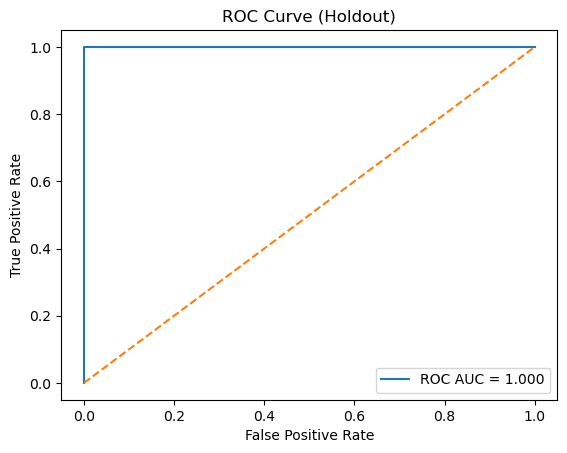

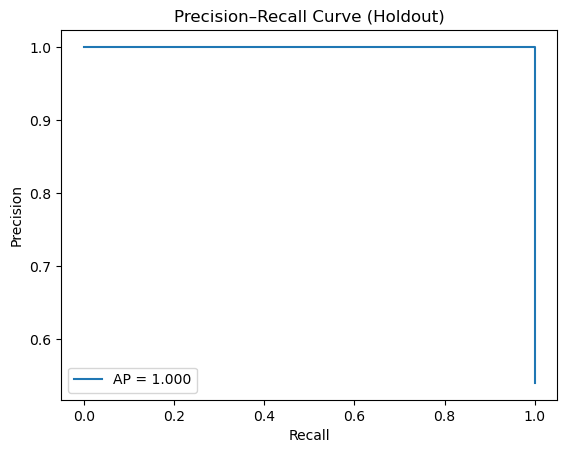

In [267]:
import numpy as np
import pandas as pd
from pathlib import Path

from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    make_scorer, roc_auc_score, average_precision_score, f1_score, balanced_accuracy_score,
    accuracy_score, precision_score, recall_score, classification_report, confusion_matrix,
    roc_curve, precision_recall_curve
)
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

RANDOM_STATE = 47
TEST_SIZE = 0.20
CV_SPLITS = 5
N_ITER = 30
N_JOBS = -1

SCORING = {
    "roc_auc": "roc_auc", 
    "avg_precision": make_scorer(average_precision_score, needs_proba=True),
    "f1": make_scorer(f1_score, zero_division=0),
    "recall": make_scorer(recall_score, zero_division=0),
    "precision": make_scorer(precision_score, zero_division=0),
    "accuracy": make_scorer(accuracy_score),
}
AUC_TIE_TOL = 0.01  

X_h_ss, top_genes_h_ss = select_top_genes(X_h_ss, y_h_ss, gene_names_h_ss)

X_train, X_test, y_train, y_test = train_test_split(
    X_h_ss, y_h_ss, test_size=TEST_SIZE, stratify=y_h_ss, random_state=RANDOM_STATE
)

cv = StratifiedKFold(n_splits=CV_SPLITS, shuffle=True, random_state=RANDOM_STATE)

searches = []

# 1) Logistic Regression
logreg_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(
        max_iter=5000, class_weight="balanced", random_state=RANDOM_STATE, solver="saga"
    )),
])
logreg_space = {
    "clf__penalty": ["l2", "l1"],
    "clf__C": np.logspace(-3, 3, 30),
}
searches.append((
    "LogisticRegression",
    RandomizedSearchCV(
        estimator=logreg_pipe,
        param_distributions=logreg_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 2) SVM (RBF)
svm_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", SVC(kernel="rbf", probability=True, class_weight="balanced", random_state=RANDOM_STATE)),
])
svm_space = {
    "clf__C": np.logspace(-3, 3, 30),
    "clf__gamma": np.logspace(-4, 1, 30),
}
searches.append((
    "SVM_RBF",
    RandomizedSearchCV(
        estimator=svm_pipe,
        param_distributions=svm_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 3) Random Forest
rf_pipe = Pipeline([
    ("clf", RandomForestClassifier(
        n_estimators=400, class_weight="balanced", random_state=RANDOM_STATE, n_jobs=N_JOBS
    )),
])
rf_space = {
    "clf__n_estimators": np.arange(200, 1201, 100),
    "clf__max_depth": [None] + list(range(3, 31)),
    "clf__min_samples_split": [2, 5, 10, 20, 50],
    "clf__min_samples_leaf": [1, 2, 4, 8, 16],
    "clf__max_features": ["sqrt", "log2", None],
}
searches.append((
    "RandomForest",
    RandomizedSearchCV(
        estimator=rf_pipe,
        param_distributions=rf_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 4) KNN
knn_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", KNeighborsClassifier())
])
knn_space = {
    "clf__n_neighbors": np.arange(1, 51),
    "clf__weights": ["uniform", "distance"],
    "clf__p": [1, 2],
    "clf__leaf_size": np.arange(15, 61, 5),
    "clf__metric": ["minkowski"]
}
searches.append((
    "KNN",
    RandomizedSearchCV(
        estimator=knn_pipe,
        param_distributions=knn_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 5) Neural Network (MLP)
mlp_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", MLPClassifier(
        max_iter=500, early_stopping=True, random_state=RANDOM_STATE
    )),
])
mlp_space = {
    "clf__hidden_layer_sizes": [(64,), (128,), (64, 64), (128, 64)],
    "clf__activation": ["relu", "tanh"],
    "clf__alpha": np.logspace(-6, -2, 10),
    "clf__learning_rate_init": np.logspace(-4, -2, 10),
    "clf__batch_size": [16, 32, 64],
    "clf__solver": ["adam"],
}
searches.append((
    "MLP_NN",
    RandomizedSearchCV(
        estimator=mlp_pipe,
        param_distributions=mlp_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

leaderboard = []
per_model_best = {}

for name, search in searches:
    search.fit(X_train, y_train)

    best_idx = search.best_index_
    cvres = search.cv_results_

    row = {
        "model": name,
        "cv_roc_auc": float(cvres["mean_test_roc_auc"][best_idx]),
        "cv_avg_precision": float(cvres["mean_test_avg_precision"][best_idx]),
        "cv_f1": float(cvres["mean_test_f1"][best_idx]),
        "cv_recall": float(cvres["mean_test_recall"][best_idx]),
        "cv_precision": float(cvres["mean_test_precision"][best_idx]),
        "cv_accuracy": float(cvres["mean_test_accuracy"][best_idx]),
        "best_params": search.best_params_,
        "search": search,
    }
    leaderboard.append(row)
    per_model_best[name] = row

leaderboard_df = pd.DataFrame(leaderboard).sort_values("cv_roc_auc", ascending=False)
print("\n=== CV leaderboard (by ROC AUC) ===")
print(leaderboard_df[["model", "cv_roc_auc", "cv_f1", "cv_recall", "cv_precision", "cv_accuracy"]])

candidates = leaderboard_df.copy()
top_auc = candidates.iloc[0]["cv_roc_auc"]
tied = candidates[np.isclose(candidates["cv_roc_auc"], top_auc, atol=AUC_TIE_TOL)]

if len(tied) > 1:
    tied = tied.sort_values(
        by=["cv_f1", "cv_recall", "cv_precision", "cv_accuracy"],
        ascending=[False, False, False, False]
    )
    winner_row = tied.iloc[0]
else:
    winner_row = candidates.iloc[0]

best_name = winner_row["model"]
best_search = per_model_best[best_name]["search"]
print("\nSelected best model (multi-criteria):", best_name)
print("Best params:", best_search.best_params_)

best_model = best_search.best_estimator_
best_model.fit(X_train, y_train)

proba_test = best_model.predict_proba(X_test)[:, 1]
pred_test = (proba_test >= 0.5).astype(int)

roc_auc = roc_auc_score(y_test, proba_test)
ap = average_precision_score(y_test, proba_test)
f1 = f1_score(y_test, pred_test)
bal_acc = balanced_accuracy_score(y_test, pred_test)
precision = precision_score(y_test, pred_test, zero_division=0)
recall = recall_score(y_test, pred_test, zero_division=0)
acc = accuracy_score(y_test, pred_test)

print("\nHoldout results:")
print(f"- ROC AUC: {roc_auc:.3f}")
print(f"- Avg Precision (PR AUC): {ap:.3f}")
print(f"- F1 score: {f1:.3f}")
print(f"- Recall: {recall:.3f}")
print(f"- Precision: {precision:.3f}")
print(f"- Accuracy: {acc:.3f}")
print(f"- Balanced Accuracy: {bal_acc:.3f}")

cm = confusion_matrix(y_test, pred_test)
cm_df = pd.DataFrame(
    cm,
    index=["True: Class 0", "True: Class 1"],
    columns=["Pred: Class 0", "Pred: Class 1"]
)
print("\nConfusion matrix (counts):\n", cm_df)

tn, fp, fn, tp = cm.ravel()
print(f"\nQuick read: {tp} positives correctly found; {fn} positives missed; {fp} false positives.")

fpr, tpr, _ = roc_curve(y_test, proba_test)
plt.figure()
plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.3f}")
plt.plot([0, 1], [0, 1], linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (Holdout)")
plt.legend()
plt.show()

prec, rec, _ = precision_recall_curve(y_test, proba_test)
plt.figure()
plt.plot(rec, prec, label=f"AP = {ap:.3f}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall Curve (Holdout)")
plt.legend()
plt.show()

In [269]:
X_final_test_h_ss, _ , _ = preprocess_dataset_to_train("HCC1806_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt")

extra = [c for c in X_final_test_h_ss.columns if c not in top_genes_h_ss]
X_final_test_pre_h_ss = X_final_test_h_ss.drop(columns=extra)

scaler = StandardScaler()
X_final_test_h_ss = scaler.fit_transform(X_final_test_pre_h_ss)

final_model_h_ss = SVC(kernel="rbf", probability=True, class_weight="balanced", random_state=RANDOM_STATE, gamma = 0.011721022975334805, C = 3.2903445623126677) 
final_model_h_ss.fit(X_h_ss, y_h_ss)

y_predictions_h_ss = final_model_h_ss.predict(X_final_test_h_ss)
print(y_predictions_h_ss)

pred_df = pd.DataFrame({
    "PredictedLabel": y_predictions_h_ss
})

pred_df.to_csv("HCC1806_SmartS_Test_Results.txt",
               sep="\t", index=False, header=False)

print("File saved as HCC1806_SmartS_Test_Results.txt")


  Loaded: HCC1806_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt
   Shape:     DDIT4  ANGPTL4  CALML5  KRT14  CCNB1  IGFBP3  AKR1C2  KRT6A  NDRG1  KRT4  \
1       0        0       0    169    233     227     521    577      0     0   
2    2475        0       0      0   3537     843     214      0      3     0   
3    9088     2143       0      0    124       0       0      0    415     0   
4    6909     3086       0    909     78     466     508    193    453     0   
5   13655     2196       0      1      1   14688    3872    184    884   176   
6    7684     1619       6     74      0    1205      79     92    696   208   
7   13038     1917       0    108    991     134     681    171    524     0   
8     640        1       0      1    128     168    2601   2421      1     0   
9       3        1       0   1794    256    1075    3335   4781      1  4729   
10    542       81       0     99    180     183     660     93     77     0   
11   2072      140       0     42    51


 Top 50 Genes Selected:
1. MT-CO3 (0.0382)
2. GPI (0.0369)
3. ARPC1B (0.0345)
4. BNIP3 (0.0328)
5. FAM162A (0.0272)
6. CYP1B1 (0.0248)
7. P4HA1 (0.0224)
8. SRM (0.0216)
9. ENO2 (0.0205)
10. HK2 (0.0202)
11. PFKFB4 (0.0198)
12. ERO1A (0.0194)
13. SLC9A3R1-AS1 (0.0194)
14. PSME2 (0.0165)
15. IRF2BP2 (0.0162)
16. MT-CYB (0.0161)
17. DCXR (0.0154)
18. DDIT4 (0.0153)
19. PFKP (0.0151)
20. KPNA2 (0.0147)
21. ALDOA (0.0143)
22. PGK1 (0.0134)
23. NECAB1 (0.0133)
24. KRT80 (0.0133)
25. RHOD (0.0127)
26. ISOC1 (0.0121)
27. MT-ATP6 (0.0118)
28. CYP1B1-AS1 (0.0115)
29. NDRG1 (0.0109)
30. GAPDH (0.0098)
31. LDHA (0.0094)
32. PDK1 (0.0089)
33. SLC25A39 (0.0088)
34. TUBG1 (0.0086)
35. IFITM2 (0.0086)
36. DYNC2I2 (0.0086)
37. IFITM3 (0.0085)
38. EMP2 (0.0082)
39. MT-ATP8 (0.0082)
40. IFITM1 (0.0080)
41. FDPS (0.0079)
42. TMSB10 (0.0079)
43. PGP (0.0078)
44. PEBP1 (0.0077)
45. FDFT1 (0.0077)
46. FUT11 (0.0076)
47. PYCR3 (0.0076)
48. TANC2 (0.0076)
49. EBP (0.0075)
50. MT-CO1 (0.0075)


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py:610: FutureWarning: The `needs_threshold` and `needs_proba` parameter are deprecated in version 1.4 and will be removed in 1.6. You can either let `response_method` be `None` or set it to `predict` to preserve the same behaviour.
  warnings.warn(



=== CV leaderboard (by ROC AUC) ===
                model  cv_roc_auc     cv_f1  cv_recall  cv_precision  \
0  LogisticRegression         1.0  1.000000   1.000000      1.000000   
1             SVM_RBF         1.0  0.995122   1.000000      0.990476   
2        RandomForest         1.0  0.995122   1.000000      0.990476   
3                 KNN         1.0  1.000000   1.000000      1.000000   
4              MLP_NN         1.0  0.951328   0.908947      1.000000   

   cv_accuracy  
0        1.000  
1        0.995  
2        0.995  
3        1.000  
4        0.955  

Selected best model (multi-criteria): LogisticRegression
Best params: {'clf__penalty': 'l2', 'clf__C': 57.361525104486816}

Holdout results:
- ROC AUC: 1.000
- Avg Precision (PR AUC): 1.000
- F1 score: 1.000
- Recall: 1.000
- Precision: 1.000
- Accuracy: 1.000
- Balanced Accuracy: 1.000

Confusion matrix (counts):
                Pred: Class 0  Pred: Class 1
True: Class 0             25              0
True: Class 1         

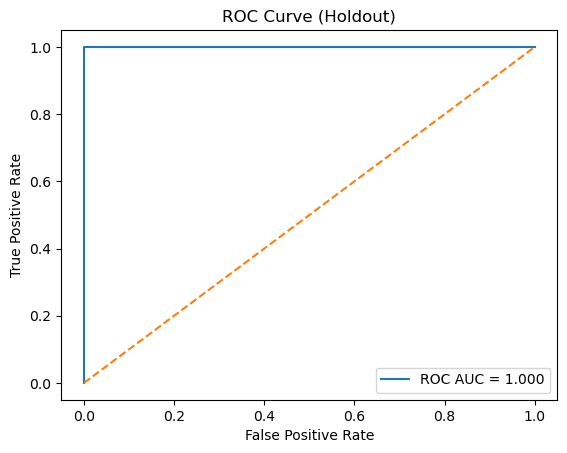

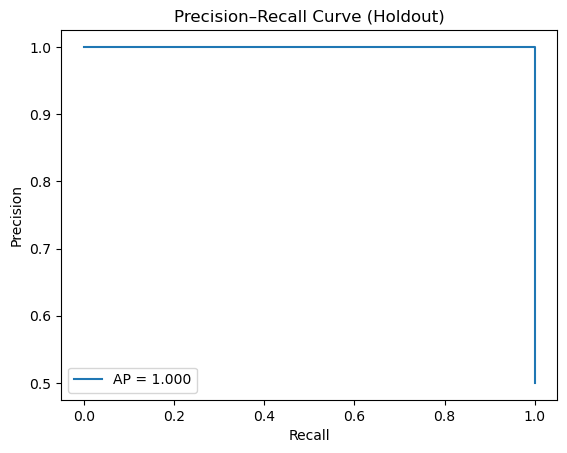

In [270]:
import numpy as np
import pandas as pd
from pathlib import Path

from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    make_scorer, roc_auc_score, average_precision_score, f1_score, balanced_accuracy_score,
    accuracy_score, precision_score, recall_score, classification_report, confusion_matrix,
    roc_curve, precision_recall_curve
)
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

RANDOM_STATE = 47
TEST_SIZE = 0.20
CV_SPLITS = 5
N_ITER = 30
N_JOBS = -1

SCORING = {
    "roc_auc": "roc_auc", 
    "avg_precision": make_scorer(average_precision_score, needs_proba=True),
    "f1": make_scorer(f1_score, zero_division=0),
    "recall": make_scorer(recall_score, zero_division=0),
    "precision": make_scorer(precision_score, zero_division=0),
    "accuracy": make_scorer(accuracy_score),
}
AUC_TIE_TOL = 0.01  

X_m_ss, top_genes_m_ss = select_top_genes(X_m_ss, y_m_ss, gene_names_m_ss)

X_train, X_test, y_train, y_test = train_test_split(
    X_m_ss, y_m_ss, test_size=TEST_SIZE, stratify=y_m_ss, random_state=RANDOM_STATE
)

cv = StratifiedKFold(n_splits=CV_SPLITS, shuffle=True, random_state=RANDOM_STATE)

searches = []

# 1) Logistic Regression
logreg_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(
        max_iter=5000, class_weight="balanced", random_state=RANDOM_STATE, solver="saga"
    )),
])
logreg_space = {
    "clf__penalty": ["l2", "l1"],
    "clf__C": np.logspace(-3, 3, 30),
}
searches.append((
    "LogisticRegression",
    RandomizedSearchCV(
        estimator=logreg_pipe,
        param_distributions=logreg_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 2) SVM
svm_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", SVC(kernel="rbf", probability=True, class_weight="balanced", random_state=RANDOM_STATE)),
])
svm_space = {
    "clf__C": np.logspace(-3, 3, 30),
    "clf__gamma": np.logspace(-4, 1, 30),
}
searches.append((
    "SVM_RBF",
    RandomizedSearchCV(
        estimator=svm_pipe,
        param_distributions=svm_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 3) Random Forest
rf_pipe = Pipeline([
    ("clf", RandomForestClassifier(
        n_estimators=400, class_weight="balanced", random_state=RANDOM_STATE, n_jobs=N_JOBS
    )),
])
rf_space = {
    "clf__n_estimators": np.arange(200, 1201, 100),
    "clf__max_depth": [None] + list(range(3, 31)),
    "clf__min_samples_split": [2, 5, 10, 20, 50],
    "clf__min_samples_leaf": [1, 2, 4, 8, 16],
    "clf__max_features": ["sqrt", "log2", None],
}
searches.append((
    "RandomForest",
    RandomizedSearchCV(
        estimator=rf_pipe,
        param_distributions=rf_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 4) KNN
knn_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", KNeighborsClassifier())
])
knn_space = {
    "clf__n_neighbors": np.arange(1, 51),
    "clf__weights": ["uniform", "distance"],
    "clf__p": [1, 2],
    "clf__leaf_size": np.arange(15, 61, 5),
    "clf__metric": ["minkowski"]
}
searches.append((
    "KNN",
    RandomizedSearchCV(
        estimator=knn_pipe,
        param_distributions=knn_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 5) Neural Network (MLP)
mlp_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", MLPClassifier(
        max_iter=500, early_stopping=True, random_state=RANDOM_STATE
    )),
])
mlp_space = {
    "clf__hidden_layer_sizes": [(64,), (128,), (64, 64), (128, 64)],
    "clf__activation": ["relu", "tanh"],
    "clf__alpha": np.logspace(-6, -2, 10),
    "clf__learning_rate_init": np.logspace(-4, -2, 10),
    "clf__batch_size": [16, 32, 64],
    "clf__solver": ["adam"],
}
searches.append((
    "MLP_NN",
    RandomizedSearchCV(
        estimator=mlp_pipe,
        param_distributions=mlp_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

leaderboard = []
per_model_best = {}

for name, search in searches:
    search.fit(X_train, y_train)

    best_idx = search.best_index_
    cvres = search.cv_results_

    row = {
        "model": name,
        "cv_roc_auc": float(cvres["mean_test_roc_auc"][best_idx]),
        "cv_avg_precision": float(cvres["mean_test_avg_precision"][best_idx]),
        "cv_f1": float(cvres["mean_test_f1"][best_idx]),
        "cv_recall": float(cvres["mean_test_recall"][best_idx]),
        "cv_precision": float(cvres["mean_test_precision"][best_idx]),
        "cv_accuracy": float(cvres["mean_test_accuracy"][best_idx]),
        "best_params": search.best_params_,
        "search": search,
    }
    leaderboard.append(row)
    per_model_best[name] = row

leaderboard_df = pd.DataFrame(leaderboard).sort_values("cv_roc_auc", ascending=False)
print("\n=== CV leaderboard (by ROC AUC) ===")
print(leaderboard_df[["model", "cv_roc_auc", "cv_f1", "cv_recall", "cv_precision", "cv_accuracy"]])

candidates = leaderboard_df.copy()
top_auc = candidates.iloc[0]["cv_roc_auc"]
tied = candidates[np.isclose(candidates["cv_roc_auc"], top_auc, atol=AUC_TIE_TOL)]

if len(tied) > 1:
    tied = tied.sort_values(
        by=["cv_f1", "cv_recall", "cv_precision", "cv_accuracy"],
        ascending=[False, False, False, False]
    )
    winner_row = tied.iloc[0]
else:
    winner_row = candidates.iloc[0]

best_name = winner_row["model"]
best_search = per_model_best[best_name]["search"]
print("\nSelected best model (multi-criteria):", best_name)
print("Best params:", best_search.best_params_)

best_model = best_search.best_estimator_
best_model.fit(X_train, y_train)

proba_test = best_model.predict_proba(X_test)[:, 1]
pred_test = (proba_test >= 0.5).astype(int)

roc_auc = roc_auc_score(y_test, proba_test)
ap = average_precision_score(y_test, proba_test)
f1 = f1_score(y_test, pred_test)
bal_acc = balanced_accuracy_score(y_test, pred_test)
precision = precision_score(y_test, pred_test, zero_division=0)
recall = recall_score(y_test, pred_test, zero_division=0)
acc = accuracy_score(y_test, pred_test)

print("\nHoldout results:")
print(f"- ROC AUC: {roc_auc:.3f}")
print(f"- Avg Precision (PR AUC): {ap:.3f}")
print(f"- F1 score: {f1:.3f}")
print(f"- Recall: {recall:.3f}")
print(f"- Precision: {precision:.3f}")
print(f"- Accuracy: {acc:.3f}")
print(f"- Balanced Accuracy: {bal_acc:.3f}")

cm = confusion_matrix(y_test, pred_test)
cm_df = pd.DataFrame(
    cm,
    index=["True: Class 0", "True: Class 1"],
    columns=["Pred: Class 0", "Pred: Class 1"]
)
print("\nConfusion matrix (counts):\n", cm_df)

tn, fp, fn, tp = cm.ravel()
print(f"\nQuick read: {tp} positives correctly found; {fn} positives missed; {fp} false positives.")

fpr, tpr, _ = roc_curve(y_test, proba_test)
plt.figure()
plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.3f}")
plt.plot([0, 1], [0, 1], linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (Holdout)")
plt.legend()
plt.show()

prec, rec, _ = precision_recall_curve(y_test, proba_test)
plt.figure()
plt.plot(rec, prec, label=f"AP = {ap:.3f}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall Curve (Holdout)")
plt.legend()
plt.show()

In [273]:
X_final_test_m_ss, _ , _ =preprocess_dataset_to_train("MCF7_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt")

extra = [c for c in X_final_test_m_ss.columns if c not in top_genes_m_ss]
X_final_test_pre_h_ds = X_final_test_m_ss.drop(columns=extra)

scaler = StandardScaler()
X_final_test_m_ss = scaler.fit_transform(X_final_test_pre_h_ds)

final_model_m_ss = LogisticRegression(max_iter=5000, class_weight="balanced", random_state=RANDOM_STATE, solver="saga", penalty = 'l2', C = 57.361525104486816)
 
final_model_m_ss.fit(X_m_ss, y_m_ss)

y_predictions_m_ss = final_model_m_ss.predict(X_final_test_m_ss)
print(y_predictions_m_ss)

pred_df = pd.DataFrame({
    "PredictedLabel": y_predictions_m_ss
})

pred_df.to_csv("MCF7_SmartS_Test_Results.txt",
               sep="\t", index=False, header=False)

print("File saved as MCF7_SmartS_Test_Results.txt")

  Loaded: MCF7_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt
   Shape:     CYP1B1  CYP1B1-AS1  CYP1A1  NDRG1  DDIT4  PFKFB3   HK2  AREG  MYBL2   ADM  \
1      492         253       0   1157   6805    5447  2662  2448      0    58   
2     7199        3245    7181   1857  20731    4374  5490     0      0  2150   
3       12          11       1      5    147     301     9   647   1890     1   
4      373         187       0      0     43      37     0     0    580     0   
5       31          13       0      0      0      44     8     0    554     0   
..     ...         ...     ...    ...    ...     ...   ...   ...    ...   ...   
59     287         126     666   3270  25776   12144  1119     0      0   678   
60   15220        6316    1991    750  12176    7488  3172  2030      0    64   
61   21998        8898   21329   1498   5144    1146   914     0      0     0   
62      39          17       1     29     20       0     0    88   1399     0   
63     195          81       0 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py:610: FutureWarning: The `needs_threshold` and `needs_proba` parameter are deprecated in version 1.4 and will be removed in 1.6. You can either let `response_method` be `None` or set it to `predict` to preserve the same behaviour.
  warnings.warn(



 Top 50 Genes Selected:
1. NDRG1 (0.0192)
2. HSPD1 (0.0188)
3. AKR1C2 (0.0171)
4. BCYRN1 (0.0157)
5. IGFBP3 (0.0157)
6. WDR43 (0.0139)
7. FGF23 (0.0134)
8. EIF3J (0.0130)
9. GPM6A (0.0127)
10. HSP90AA1 (0.0121)
11. LDHA (0.0113)
12. AKR1C1 (0.0108)
13. ENO1 (0.0104)
14. NCL (0.0091)
15. P4HA1 (0.0090)
16. MALAT1 (0.0088)
17. TMSB10 (0.0087)
18. HSP90AB1 (0.0077)
19. MT-TQ (0.0068)
20. RPL41 (0.0068)
21. CALM2 (0.0067)
22. RPS5 (0.0064)
23. HNRNPU (0.0064)
24. NCALD (0.0061)
25. RPS27 (0.0061)
26. HSP90B1 (0.0059)
27. B4GALT1 (0.0059)
28. PSMA7 (0.0057)
29. PGK1 (0.0055)
30. CACNA1A (0.0052)
31. RPS28 (0.0052)
32. S100A11 (0.0050)
33. RPS2 (0.0050)
34. FTL (0.0049)
35. KRT19 (0.0049)
36. H4C3 (0.0045)
37. YWHAZ (0.0044)
38. NPM1P40 (0.0044)
39. S100A10 (0.0044)
40. RPL35 (0.0043)
41. RPLP1 (0.0042)
42. RPL8 (0.0041)
43. RPL27A (0.0041)
44. CAV1 (0.0037)
45. RPLP2 (0.0037)
46. NEAT1 (0.0036)
47. BNIP3 (0.0036)
48. AHNAK2 (0.0035)
49. TSR1 (0.0035)
50. BTBD9 (0.0034)

=== CV leaderboard 

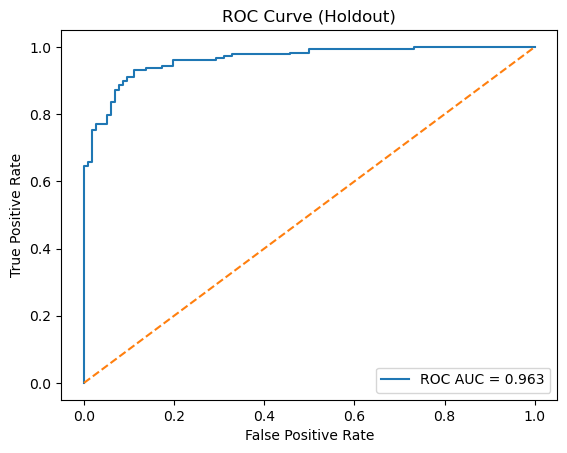

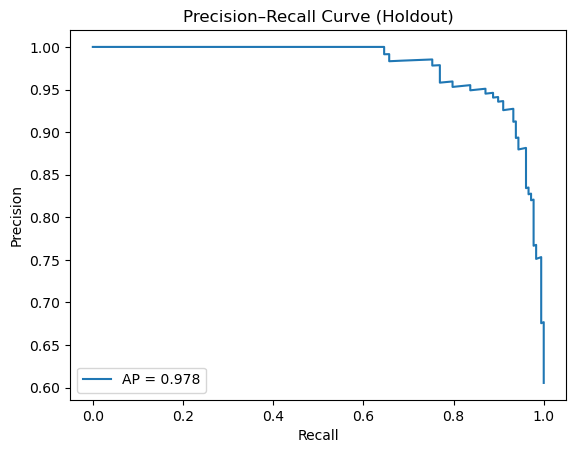

In [274]:
import numpy as np
import pandas as pd
from pathlib import Path

from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV, StratifiedShuffleSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    make_scorer, roc_auc_score, average_precision_score, f1_score, balanced_accuracy_score,
    accuracy_score, precision_score, recall_score, classification_report, confusion_matrix,
    roc_curve, precision_recall_curve
)
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

RANDOM_STATE = 47
TEST_SIZE = 0.20
CV_SPLITS = 5
N_ITER = 30
N_JOBS = -1

SCORING = {
    "roc_auc": "roc_auc", 
    "avg_precision": make_scorer(average_precision_score, needs_proba=True),
    "f1": make_scorer(f1_score, zero_division=0),
    "recall": make_scorer(recall_score, zero_division=0),
    "precision": make_scorer(precision_score, zero_division=0),
    "accuracy": make_scorer(accuracy_score),
}
AUC_TIE_TOL = 0.01  

sss = StratifiedShuffleSplit(n_splits=1, train_size=0.10, random_state=RANDOM_STATE)
sub_idx, _ = next(sss.split(X_h_ds, y_h_ds))
X_h_ds_small = X_h_ds[sub_idx]
y_h_ds_small = y_h_ds[sub_idx]

X_h_ds_small, top_genes_h_ds = select_top_genes(X_h_ds_small, y_h_ds_small, gene_names_h_ds)


X_train, X_test, y_train, y_test = train_test_split(
    X_h_ds_small, y_h_ds_small, test_size=TEST_SIZE, stratify=y_h_ds_small, random_state=RANDOM_STATE
)

cv = StratifiedKFold(n_splits=CV_SPLITS, shuffle=True, random_state=RANDOM_STATE)

searches = []

# 1) Logistic Regression
logreg_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(
        max_iter=5000, class_weight="balanced", random_state=RANDOM_STATE, solver="saga"
    )),
])
logreg_space = {
    "clf__penalty": ["l2", "l1"],
    "clf__C": np.logspace(-3, 3, 30),
}
searches.append((
    "LogisticRegression",
    RandomizedSearchCV(
        estimator=logreg_pipe,
        param_distributions=logreg_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 2) SVM (RBF)
svm_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", SVC(kernel="rbf", probability=True, class_weight="balanced", random_state=RANDOM_STATE)),
])
svm_space = {
    "clf__C": np.logspace(-3, 3, 30),
    "clf__gamma": np.logspace(-4, 1, 30),
}
searches.append((
    "SVM_RBF",
    RandomizedSearchCV(
        estimator=svm_pipe,
        param_distributions=svm_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 3) Random Forest
rf_pipe = Pipeline([
    ("clf", RandomForestClassifier(
        n_estimators=400, class_weight="balanced", random_state=RANDOM_STATE, n_jobs=N_JOBS
    )),
])
rf_space = {
    "clf__n_estimators": np.arange(200, 1201, 100),
    "clf__max_depth": [None] + list(range(3, 31)),
    "clf__min_samples_split": [2, 5, 10, 20, 50],
    "clf__min_samples_leaf": [1, 2, 4, 8, 16],
    "clf__max_features": ["sqrt", "log2", None],
}
searches.append((
    "RandomForest",
    RandomizedSearchCV(
        estimator=rf_pipe,
        param_distributions=rf_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 4) KNN
knn_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", KNeighborsClassifier())
])
knn_space = {
    "clf__n_neighbors": np.arange(1, 51),
    "clf__weights": ["uniform", "distance"],
    "clf__p": [1, 2],
    "clf__leaf_size": np.arange(15, 61, 5),
    "clf__metric": ["minkowski"]
}
searches.append((
    "KNN",
    RandomizedSearchCV(
        estimator=knn_pipe,
        param_distributions=knn_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 5) Neural Network (MLP)
mlp_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", MLPClassifier(
        max_iter=500, early_stopping=True, random_state=RANDOM_STATE
    )),
])
mlp_space = {
    "clf__hidden_layer_sizes": [(64,), (128,), (64, 64), (128, 64)],
    "clf__activation": ["relu", "tanh"],
    "clf__alpha": np.logspace(-6, -2, 10),
    "clf__learning_rate_init": np.logspace(-4, -2, 10),
    "clf__batch_size": [16, 32, 64],
    "clf__solver": ["adam"],
}
searches.append((
    "MLP_NN",
    RandomizedSearchCV(
        estimator=mlp_pipe,
        param_distributions=mlp_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

leaderboard = []
per_model_best = {}

for name, search in searches:
    search.fit(X_train, y_train)

    best_idx = search.best_index_
    cvres = search.cv_results_

    row = {
        "model": name,
        "cv_roc_auc": float(cvres["mean_test_roc_auc"][best_idx]),
        "cv_avg_precision": float(cvres["mean_test_avg_precision"][best_idx]),
        "cv_f1": float(cvres["mean_test_f1"][best_idx]),
        "cv_recall": float(cvres["mean_test_recall"][best_idx]),
        "cv_precision": float(cvres["mean_test_precision"][best_idx]),
        "cv_accuracy": float(cvres["mean_test_accuracy"][best_idx]),
        "best_params": search.best_params_,
        "search": search,
    }
    leaderboard.append(row)
    per_model_best[name] = row

leaderboard_df = pd.DataFrame(leaderboard).sort_values("cv_roc_auc", ascending=False)
print("\n=== CV leaderboard (by ROC AUC) ===")
print(leaderboard_df[["model", "cv_roc_auc", "cv_f1", "cv_recall", "cv_precision", "cv_accuracy"]])

candidates = leaderboard_df.copy()
top_auc = candidates.iloc[0]["cv_roc_auc"]
tied = candidates[np.isclose(candidates["cv_roc_auc"], top_auc, atol=AUC_TIE_TOL)]

if len(tied) > 1:
    tied = tied.sort_values(
        by=["cv_f1", "cv_recall", "cv_precision", "cv_accuracy"],
        ascending=[False, False, False, False]
    )
    winner_row = tied.iloc[0]
else:
    winner_row = candidates.iloc[0]

best_name = winner_row["model"]
best_search = per_model_best[best_name]["search"]
print("\nSelected best model (multi-criteria):", best_name)
print("Best params:", best_search.best_params_)

best_model = best_search.best_estimator_
best_model.fit(X_train, y_train)

proba_test = best_model.predict_proba(X_test)[:, 1]
pred_test = (proba_test >= 0.5).astype(int)

roc_auc = roc_auc_score(y_test, proba_test)
ap = average_precision_score(y_test, proba_test)
f1 = f1_score(y_test, pred_test)
bal_acc = balanced_accuracy_score(y_test, pred_test)
precision = precision_score(y_test, pred_test, zero_division=0)
recall = recall_score(y_test, pred_test, zero_division=0)
acc = accuracy_score(y_test, pred_test)

print("\nHoldout results:")
print(f"- ROC AUC: {roc_auc:.3f}")
print(f"- Avg Precision (PR AUC): {ap:.3f}")
print(f"- F1 score: {f1:.3f}")
print(f"- Recall: {recall:.3f}")
print(f"- Precision: {precision:.3f}")
print(f"- Accuracy: {acc:.3f}")
print(f"- Balanced Accuracy: {bal_acc:.3f}")

cm = confusion_matrix(y_test, pred_test)
cm_df = pd.DataFrame(
    cm,
    index=["True: Class 0", "True: Class 1"],
    columns=["Pred: Class 0", "Pred: Class 1"]
)
print("\nConfusion matrix (counts):\n", cm_df)

tn, fp, fn, tp = cm.ravel()
print(f"\nQuick read: {tp} positives correctly found; {fn} positives missed; {fp} false positives.")

fpr, tpr, _ = roc_curve(y_test, proba_test)
plt.figure()
plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.3f}")
plt.plot([0, 1], [0, 1], linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (Holdout)")
plt.legend()
plt.show()

prec, rec, _ = precision_recall_curve(y_test, proba_test)
plt.figure()
plt.plot(rec, prec, label=f"AP = {ap:.3f}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall Curve (Holdout)")
plt.legend()
plt.show()

In [277]:
X_final_test_h_ds, _ , _ =preprocess_dataset_to_train("HCC1806_Filtered_Normalised_3000_Data_test_anonim.txt")

X_h_ds, top_genes_h_ds = select_top_genes(X_h_ds, y_h_ds, gene_names_h_ds)

extra = [c for c in X_final_test_h_ds.columns if c not in top_genes_h_ds]
X_final_test_pre_h_ds = X_final_test_h_ds.drop(columns=extra)


scaler = StandardScaler()
X_final_test_h_ds = scaler.fit_transform(X_final_test_pre_h_ds)

final_model_h_ds = RandomForestClassifier(class_weight="balanced", random_state=RANDOM_STATE, n_jobs=N_JOBS, n_estimators =  1000, min_samples_split = 10, min_samples_leaf = 1, max_features = 'log2', max_depth = 25)
final_model_h_ds.fit(X_h_ds, y_h_ds)

y_predictions_h_ds = final_model_h_ds.predict(X_final_test_h_ds)
print(y_predictions_h_ds)

pred_df = pd.DataFrame({
    "PredictedLabel": y_predictions_h_ds
})

pred_df.to_csv("HCC1806_DropSeq_Test_Results.txt",
               sep="\t", index=False, header=False)

print("File saved as HCC1806_DropSeq_Test_Results.txt")


  Loaded: HCC1806_Filtered_Normalised_3000_Data_test_anonim.txt
   Shape:       H1-5  MALAT1  MT-RNR2  ARVCF  BCYRN1  ATXN7L2  IGFBP3  H1-3  CTIF  \
1        0       3        1      0       2        0       0     0     0   
2        0       1        0      0       1        0       0     0     0   
3        2       1        0      0       1        0       0     1     0   
4        0       0        0      0       0        0       0     1     0   
5        0       0        0      0       0        0       0     0     0   
...    ...     ...      ...    ...     ...      ...     ...   ...   ...   
3667     1       5        1      0       0        0       0     0     0   
3668     0       5        0      0       0        0       0     0     0   
3669     0       0        0      0       2        0       0     0     0   
3670     0       0        0      0       3        0       1     1     0   
3671     3       0        0      0       0        0       0     3     0   

      RNF123  ...  BATF3 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py:610: FutureWarning: The `needs_threshold` and `needs_proba` parameter are deprecated in version 1.4 and will be removed in 1.6. You can either let `response_method` be `None` or set it to `predict` to preserve the same behaviour.
  warnings.warn(



 Top 50 Genes Selected:
1. TFF1 (0.0293)
2. MT-RNR2 (0.0275)
3. GAPDH (0.0269)
4. TMSB10 (0.0260)
5. KRT19 (0.0205)
6. PGK1 (0.0194)
7. RPL34 (0.0179)
8. RPS14 (0.0174)
9. PKM (0.0165)
10. LGALS1 (0.0164)
11. MT-RNR1 (0.0153)
12. TMEM258 (0.0147)
13. RPS19 (0.0142)
14. RPL15 (0.0134)
15. RPL39 (0.0123)
16. TPI1 (0.0121)
17. RPL12 (0.0111)
18. ENO1 (0.0105)
19. RPL35 (0.0105)
20. RPL13 (0.0104)
21. RPL30 (0.0093)
22. MALAT1 (0.0085)
23. RPL35A (0.0085)
24. RPS27 (0.0084)
25. RPS5 (0.0082)
26. BCYRN1 (0.0082)
27. TFF3 (0.0081)
28. RPLP1 (0.0080)
29. HES1 (0.0079)
30. RPS12 (0.0076)
31. UBA52 (0.0076)
32. RPS16 (0.0075)
33. HSPB1 (0.0071)
34. RPL23 (0.0068)
35. KRT8 (0.0066)
36. S100A10 (0.0065)
37. MT-CO3 (0.0063)
38. UQCRQ (0.0063)
39. H4C3 (0.0063)
40. SERF2 (0.0061)
41. SNRPD2 (0.0060)
42. RPS15 (0.0056)
43. RPL36 (0.0056)
44. RPLP2 (0.0053)
45. RPL37A (0.0051)
46. FTL (0.0049)
47. ROMO1 (0.0049)
48. S100A11 (0.0048)
49. SET (0.0048)
50. TOB1 (0.0046)

=== CV leaderboard (by ROC AUC)

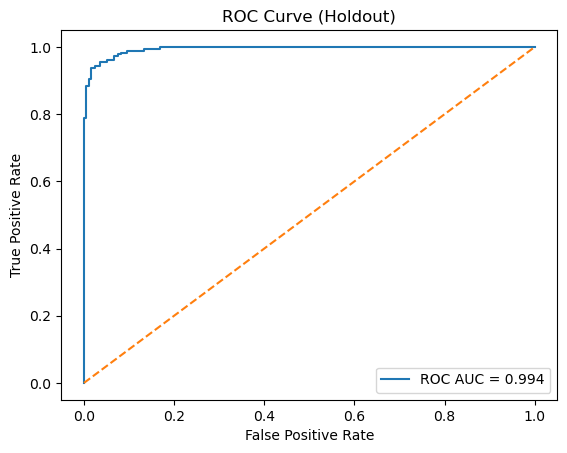

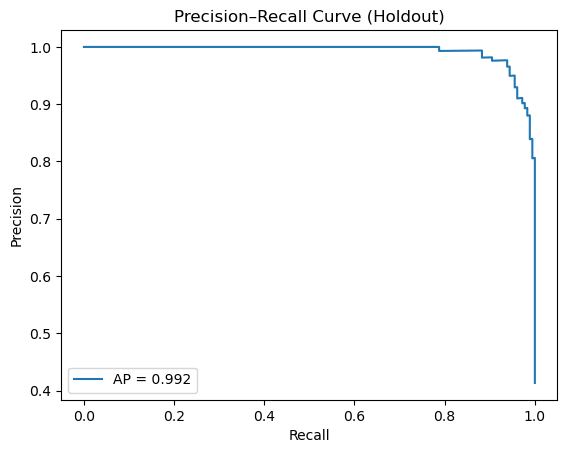

In [278]:
import numpy as np
import pandas as pd
from pathlib import Path

from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV, StratifiedShuffleSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    make_scorer, roc_auc_score, average_precision_score, f1_score, balanced_accuracy_score,
    accuracy_score, precision_score, recall_score, classification_report, confusion_matrix,
    roc_curve, precision_recall_curve
)
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

RANDOM_STATE = 47
TEST_SIZE = 0.20
CV_SPLITS = 5
N_ITER = 30
N_JOBS = -1

SCORING = {
    "roc_auc": "roc_auc", 
    "avg_precision": make_scorer(average_precision_score, needs_proba=True),
    "f1": make_scorer(f1_score, zero_division=0),
    "recall": make_scorer(recall_score, zero_division=0),
    "precision": make_scorer(precision_score, zero_division=0),
    "accuracy": make_scorer(accuracy_score),
}
AUC_TIE_TOL = 0.01  

sss = StratifiedShuffleSplit(n_splits=1, train_size=0.10, random_state=RANDOM_STATE)
sub_idx, _ = next(sss.split(X_m_ds, y_m_ds))
X_m_ds_small = X_m_ds[sub_idx]
y_m_ds_small = y_m_ds[sub_idx]

X_m_ds_small, top_genes_m_ds = select_top_genes(X_m_ds_small, y_m_ds_small, gene_names_m_ds)

X_train, X_test, y_train, y_test = train_test_split(
    X_m_ds_small, y_m_ds_small, test_size=TEST_SIZE, stratify=y_m_ds_small, random_state=RANDOM_STATE
)

cv = StratifiedKFold(n_splits=CV_SPLITS, shuffle=True, random_state=RANDOM_STATE)

searches = []

# 1) Logistic Regression
logreg_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(
        max_iter=5000, class_weight="balanced", random_state=RANDOM_STATE, solver="saga"
    )),
])
logreg_space = {
    "clf__penalty": ["l2", "l1"],
    "clf__C": np.logspace(-3, 3, 30),
}
searches.append((
    "LogisticRegression",
    RandomizedSearchCV(
        estimator=logreg_pipe,
        param_distributions=logreg_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 2) SVM (RBF)
svm_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", SVC(kernel="rbf", probability=True, class_weight="balanced", random_state=RANDOM_STATE)),
])
svm_space = {
    "clf__C": np.logspace(-3, 3, 30),
    "clf__gamma": np.logspace(-4, 1, 30),
}
searches.append((
    "SVM_RBF",
    RandomizedSearchCV(
        estimator=svm_pipe,
        param_distributions=svm_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 3) Random Forest
rf_pipe = Pipeline([
    ("clf", RandomForestClassifier(
        n_estimators=400, class_weight="balanced", random_state=RANDOM_STATE, n_jobs=N_JOBS
    )),
])
rf_space = {
    "clf__n_estimators": np.arange(200, 1201, 100),
    "clf__max_depth": [None] + list(range(3, 31)),
    "clf__min_samples_split": [2, 5, 10, 20, 50],
    "clf__min_samples_leaf": [1, 2, 4, 8, 16],
    "clf__max_features": ["sqrt", "log2", None],
}
searches.append((
    "RandomForest",
    RandomizedSearchCV(
        estimator=rf_pipe,
        param_distributions=rf_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 4) KNN
knn_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", KNeighborsClassifier())
])
knn_space = {
    "clf__n_neighbors": np.arange(1, 51),
    "clf__weights": ["uniform", "distance"],
    "clf__p": [1, 2],
    "clf__leaf_size": np.arange(15, 61, 5),
    "clf__metric": ["minkowski"]
}
searches.append((
    "KNN",
    RandomizedSearchCV(
        estimator=knn_pipe,
        param_distributions=knn_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

# 5) Neural Network (MLP)
mlp_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", MLPClassifier(
        max_iter=500, early_stopping=True, random_state=RANDOM_STATE
    )),
])
mlp_space = {
    "clf__hidden_layer_sizes": [(64,), (128,), (64, 64), (128, 64)],
    "clf__activation": ["relu", "tanh"],
    "clf__alpha": np.logspace(-6, -2, 10),
    "clf__learning_rate_init": np.logspace(-4, -2, 10),
    "clf__batch_size": [16, 32, 64],
    "clf__solver": ["adam"],
}
searches.append((
    "MLP_NN",
    RandomizedSearchCV(
        estimator=mlp_pipe,
        param_distributions=mlp_space,
        n_iter=N_ITER,
        scoring=SCORING,
        refit="roc_auc",
        cv=cv,
        n_jobs=N_JOBS,
        random_state=RANDOM_STATE,
        verbose=0,
    )
))

leaderboard = []
per_model_best = {}

for name, search in searches:
    search.fit(X_train, y_train)

    best_idx = search.best_index_
    cvres = search.cv_results_

    row = {
        "model": name,
        "cv_roc_auc": float(cvres["mean_test_roc_auc"][best_idx]),
        "cv_avg_precision": float(cvres["mean_test_avg_precision"][best_idx]),
        "cv_f1": float(cvres["mean_test_f1"][best_idx]),
        "cv_recall": float(cvres["mean_test_recall"][best_idx]),
        "cv_precision": float(cvres["mean_test_precision"][best_idx]),
        "cv_accuracy": float(cvres["mean_test_accuracy"][best_idx]),
        "best_params": search.best_params_,
        "search": search,
    }
    leaderboard.append(row)
    per_model_best[name] = row

leaderboard_df = pd.DataFrame(leaderboard).sort_values("cv_roc_auc", ascending=False)
print("\n=== CV leaderboard (by ROC AUC) ===")
print(leaderboard_df[["model", "cv_roc_auc", "cv_f1", "cv_recall", "cv_precision", "cv_accuracy"]])

candidates = leaderboard_df.copy()
top_auc = candidates.iloc[0]["cv_roc_auc"]
tied = candidates[np.isclose(candidates["cv_roc_auc"], top_auc, atol=AUC_TIE_TOL)]

if len(tied) > 1:
    tied = tied.sort_values(
        by=["cv_f1", "cv_recall", "cv_precision", "cv_accuracy"],
        ascending=[False, False, False, False]
    )
    winner_row = tied.iloc[0]
else:
    winner_row = candidates.iloc[0]

best_name = winner_row["model"]
best_search = per_model_best[best_name]["search"]
print("\nSelected best model (multi-criteria):", best_name)
print("Best params:", best_search.best_params_)

best_model = best_search.best_estimator_
best_model.fit(X_train, y_train)

proba_test = best_model.predict_proba(X_test)[:, 1]
pred_test = (proba_test >= 0.5).astype(int)

roc_auc = roc_auc_score(y_test, proba_test)
ap = average_precision_score(y_test, proba_test)
f1 = f1_score(y_test, pred_test)
bal_acc = balanced_accuracy_score(y_test, pred_test)
precision = precision_score(y_test, pred_test, zero_division=0)
recall = recall_score(y_test, pred_test, zero_division=0)
acc = accuracy_score(y_test, pred_test)

print("\nHoldout results:")
print(f"- ROC AUC: {roc_auc:.3f}")
print(f"- Avg Precision (PR AUC): {ap:.3f}")
print(f"- F1 score: {f1:.3f}")
print(f"- Recall: {recall:.3f}")
print(f"- Precision: {precision:.3f}")
print(f"- Accuracy: {acc:.3f}")
print(f"- Balanced Accuracy: {bal_acc:.3f}")

cm = confusion_matrix(y_test, pred_test)
cm_df = pd.DataFrame(
    cm,
    index=["True: Class 0", "True: Class 1"],
    columns=["Pred: Class 0", "Pred: Class 1"]
)
print("\nConfusion matrix (counts):\n", cm_df)

tn, fp, fn, tp = cm.ravel()
print(f"\nQuick read: {tp} positives correctly found; {fn} positives missed; {fp} false positives.")

fpr, tpr, _ = roc_curve(y_test, proba_test)
plt.figure()
plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.3f}")
plt.plot([0, 1], [0, 1], linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (Holdout)")
plt.legend()
plt.show()

prec, rec, _ = precision_recall_curve(y_test, proba_test)
plt.figure()
plt.plot(rec, prec, label=f"AP = {ap:.3f}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall Curve (Holdout)")
plt.legend()
plt.show()

In [280]:
X_final_test_m_ds, _ , _ =preprocess_dataset_to_train("MCF7_Filtered_Normalised_3000_Data_test_anonim.txt")

X_m_ds, top_genes_m_ds = select_top_genes(X_m_ds, y_m_ds, gene_names_m_ds)

extra = [c for c in X_final_test_m_ds.columns if c not in top_genes_m_ds]
X_final_test_pre_m_ds = X_final_test_m_ds.drop(columns=extra)

scaler = StandardScaler()
X_final_test_m_ds = scaler.fit_transform(X_final_test_pre_m_ds)

final_model_m_ds = MLPClassifier(max_iter=500, early_stopping=True, random_state=RANDOM_STATE, solver = 'adam', learning_rate_init = 0.001291549665014884, hidden_layer_sizes = (128,), batch_size = 32, alpha= 0.003593813663804626, activation = 'relu')
 
final_model_m_ds.fit(X_m_ds, y_m_ds)

y_predictions_m_ds = final_model_m_ds.predict(X_final_test_m_ds)
print(y_predictions_m_ds)

pred_df = pd.DataFrame({
    "PredictedLabel": y_predictions_m_ds
})

pred_df.to_csv("MCF7_DropSeq_Test_Results.txt",
               sep="\t", index=False, header=False)

print("File saved as MCF7_DropSeq_Test_Results.txt")

  Loaded: MCF7_Filtered_Normalised_3000_Data_test_anonim.txt
   Shape:       MALAT1  MT-RNR2  NEAT1  H1-5  TFF1  MT-RNR1  H4C3  GDF15  KRT81  MT-CO3  \
1          0        0      0     0     3        0     0      0      0       0   
2          0        2      0     0     5        0     3      0      0       0   
3          3        1      0     0     2        0     0      0      0       0   
4          0        0      0     0     3        0     2      0      0       0   
5          1        0      0     0     3        0     8      0      0       0   
...      ...      ...    ...   ...   ...      ...   ...    ...    ...     ...   
5402       0        0      0     0     3        0     3      0      0       0   
5403       0        0      0     0     2        0     1      0      0       0   
5404       1        0      0     0     0        0     1      0      0       0   
5405       5        0      0     0     0        1     0      0      0       0   
5406       1        0      0     0    

## Conclusion

This notebook built and evaluated supervised models to classify single cells as **hypoxia (1)** or **normoxia (0)** across four representative datasets (HCC1806/MCF7 × SmartSeq/DropSeq). Along the way, we established a coherent pipeline, validated key design choices, and stress-tested transferability across biological and technical domains.

### What we accomplished
- **Compact feature sets:** Reducing to ~50 genes preserved (and often improved) performance, especially for distance-based models (KNN), while increasing interpretability.
- **Model selection per dataset:** For each of the four datasets, we ran a standardized, leakage-safe search over **Logistic Regression**, **SVM (RBF)**, **Random Forest**, **KNN**, and **MLP** within `Pipeline`s (with scaling where appropriate), selecting the winner by **CV ROC AUC** and confirming on a holdout split.
- **Cross-dataset generalization:** Train-on-A → test-on-B evaluations showed the expected domain shift:  
  same cell line / cross technology = modest drop; cross cell line (and especially cross line + cross technology) = larger drop.
- **Pooling & fairness checks:** We explored a pooled training strategy (LODO) to encourage domain-invariant signals and used **stratified subsampling** (e.g., 10% cells or equal cells per dataset) to manage runtime and reduce size-driven bias.
- **External prediction step:** We applied the tuned pipeline(s) to an anonymized test matrix by aligning to the learned **top genes** and predicting labels (and/or probabilities for thresholding and QC).
- Based on the multi-metric selection procedure (ROC AUC as the primary criterion with F1, recall, precision, and accuracy as tie-breakers), the top classifier for each dataset was refit on the full labeled set. The final selections were: HCC1806_DropSeq → Random Forest(where the hyperparameters were found with a RandomSearch), MCF7_DropSeq → MLP (where the hyperparameters were found with a RandomSearch) , HCC1806_SmartSeq → RBF SVM (where the hyperparameters were found with a RandomSearch), and MCF7_SmartSeq → Logistic Regression (where the hyperparameters were found with a RandomSearch); these models offered the best overall trade-off across metrics and time consuption and were then used to assign labels to the external dataset.

### Key takeaways
- A **small, biologically plausible gene subset** is sufficient for accurate classification, improving efficiency and stability.
- **Best models differ by dataset**, reflecting real biological and technical heterogeneity; there is no single architecture that dominates everywhere.
- **Generalization improves** when the training data are **more diverse** (pooled/LODO), but performance still degrades under strong domain shift—suggesting residual batch/technology effects and line-specific programs.

### Limitations
- Possible **batch effects** and label noise were not explicitly corrected beyond standard scaling; stronger normalization/integration could help.
- Class imbalance and dataset size differences can bias results without careful weighting or subsampling.
- External validation was limited to the provided test matrix; broader replication would strengthen conclusions.

### Reproducibility notes
- All experiments use fixed `RANDOM_STATE` and fold definitions; feature selection and scaling are performed **inside** CV folds via `Pipeline`s to avoid leakage.
- For each dataset, save: the **best estimator**, **best hyperparameters**, the **top-gene list**, and **holdout metrics/curves** for auditability and reuse.

**Bottom line:** With careful feature reduction, disciplined model selection, and cross-domain evaluation, we can train accurate and interpretable hypoxia classifiers. Transfer across cell lines and technologies is feasible but benefits from pooled training and domain-aware validation—pointing to clear paths for improvement in future iterations.
